In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
from Utils_orientation import angle_cal, create_images
from Utils_plot import plot_double_result

import time
import numpy as np
import cv2
import torch

from utils.datasets import letterbox
from utils.models import *
from Utils_orientation import *

# Image path
base_file = 'figures/' + str(71) + '.jpg'
rotate_file = 'figures/' + str(99) + '.jpg'

img_orig = cv2.imread(base_file)
img_rotate = cv2.imread(rotate_file)
(h, w) = img_orig.shape[:2]
center = (w / 2, h / 2)
img_base = cv2.cvtColor(img_orig, cv2.COLOR_BGR2GRAY)
img_rotate = cv2.cvtColor(img_rotate, cv2.COLOR_BGR2GRAY)

bins = 360
thres = 50
# The translation angles
angle_limits = 15

angle_estimation = []

In [2]:
 # Sift Create and calculate
sift = cv2.xfeatures2d.SIFT_create()
# Kp is key points
# des is feature descriptor
# len(des) = len(Kp) * 128
kp1, des1 = sift.detectAndCompute(img_base, None)
kp2, des2 = sift.detectAndCompute(img_rotate, None)

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Cal the Orientation
rotate_angle = []
key_point = 15

key_point = min(key_point, int(len(matches) / 2))


img = cv2.drawMatches(img_base, kp1, img_rotate, kp2, matches[:key_point], None, flags=2)
cv2.imwrite("output/matching.png", img)

True

<font face='Ubuntu' size = 4>

## Using the histogram of Gradients direction
### Manual image
Estimate the rotate angel based on the whole image. The steps is as follows:
1. Calculate the gradients based on sobel filter including matnitude and direction
2. Set the magnitude threshold, delete the weak edge
3. Count the historgram of directions
4. Calculate the translation value

The HoG estimation when (1.0) is  1 in 0.0329s
The HoG estimation when (2.0) is  2 in 0.0209s
The HoG estimation when (3.0) is  3 in 0.0204s
The HoG estimation when (4.0) is  4 in 0.0370s
The HoG estimation when (5.0) is  5 in 0.0204s
The HoG estimation when (6.0) is  6 in 0.0204s
The HoG estimation when (7.0) is  7 in 0.0205s
The HoG estimation when (8.0) is  8 in 0.0359s
The HoG estimation when (9.0) is  9 in 0.0225s
The HoG estimation when (10.0) is 10 in 0.0240s


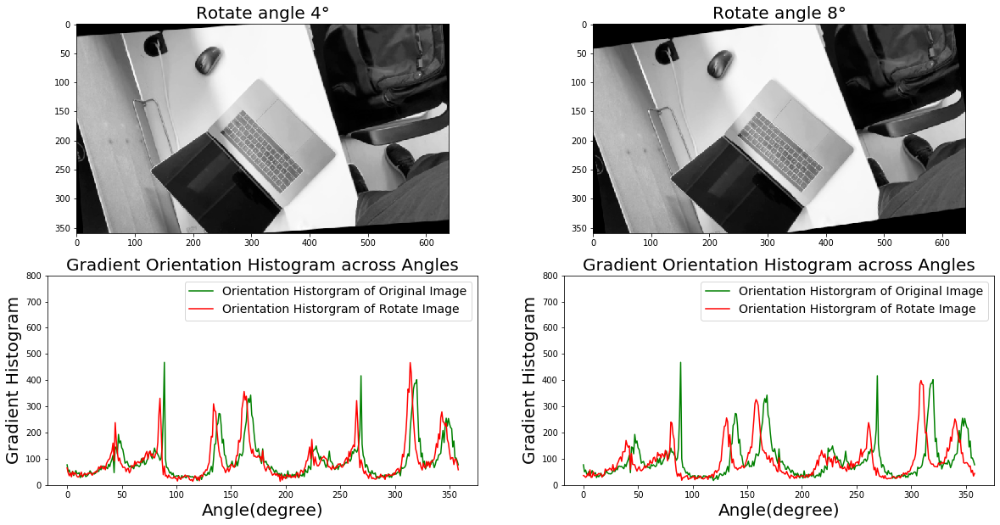

In [3]:
plt.figure(figsize=(20, 10))
for rotate_angle in range(1, 11):
    M = cv2.getRotationMatrix2D(center, rotate_angle, 1)
    img_rotate = cv2.warpAffine(img_base, M, (w, h))
    start = time.time()

    hist_base = HoG_cal(img_base, mag_thres= thres, bin_num= bins)
    hist_rotate = HoG_cal(img_rotate, mag_thres= thres, bin_num= bins)
    if rotate_angle % 4 == 0 and True:
        plot_index = rotate_angle / 4
        plt.subplot(2, 2, plot_index)
        plt.imshow(img_rotate, cmap= 'Greys_r')
        plt.title("Rotate angle " + str(rotate_angle) + "°", fontsize = 20)
        plt.subplot(2, 2, plot_index + 2) 
        plt.plot(hist_base, 'g', label = 'Orientation Historgram of Original Image')
        plt.plot(hist_rotate, 'r', label = 'Orientation Historgram of Rotate Image')
        plt.legend(fontsize = 14)
        plt.xlabel('Angle(degree)', fontsize = 20)
        plt.ylabel('Gradient Histogram', fontsize = 20)
        plt.title("Gradient Orientation Histogram across Angles", fontsize = 20)
    # Using HoG to calculate the angel
    angle = angle_HoG(hist_base, hist_rotate, limits = angle_limits)
    print("The HoG estimation when ({0:.1f}) is {1:2d} in {2:.4f}s" \
        .format(rotate_angle ,angle, time.time() - start))
plt.savefig('output/HOG_manual.png')

<font face='Ubuntu' size = 4>

### Real image result
The previous experiment is using the maunual images.
This experiment is using the real image

(array([746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757]),)
The HoG estimation is 8.12


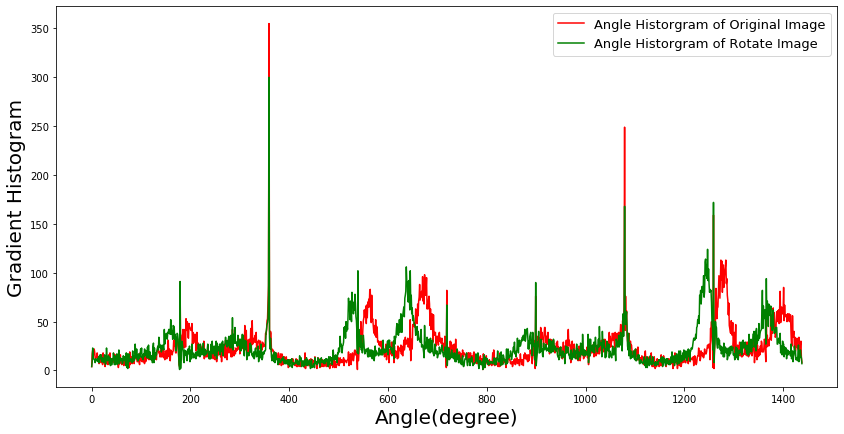

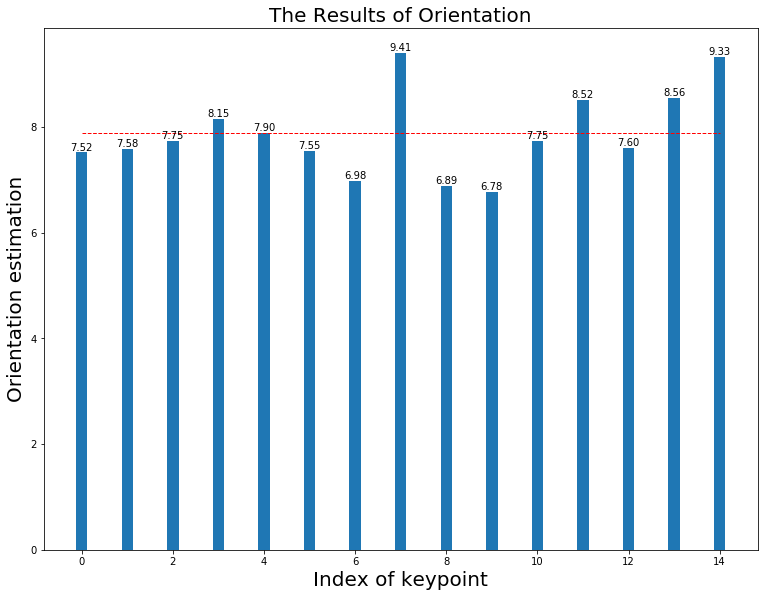

Final result: [     7.5247       7.583       7.746      8.1511      7.8967      7.5499       6.984      9.4072      6.8904      6.7804      7.7452      8.5186      7.6039      8.5595      9.3293]
FD Rotate(100.0):mean(7.885), median(7.885) in 0.096


In [8]:
bins = 1440
hist_base = HoG_cal(img_base, mag_thres= thres, bin_num= bins)

img_rotate = cv2.imread(rotate_file)
img_rotate = cv2.cvtColor(img_rotate, cv2.COLOR_BGR2GRAY)
hist_rotate = HoG_cal(img_rotate, mag_thres= thres, bin_num= bins)

#angle = angle_HoG(hist_base, hist_rotate, limits = angle_limits)
correlation = np.correlate(hist_base, hist_rotate, mode= 'same')  
angle_thres = np.max(correlation) * 0.98
results = np.nonzero(correlation > angle_thres)
print(results)
angle = (np.mean(results) + 1) * 360 / bins - 180
print("The HoG estimation is {0:.2f}".format(angle))
plt.figure(figsize=(14, 7))
plt.plot(hist_base, 'r', label = 'Angle Historgram of Original Image')
plt.plot(hist_rotate, 'g', label = 'Angle Historgram of Rotate Image')
plt.legend(fontsize = 13)
plt.xlabel('Angle(degree)', fontsize = 20)
plt.ylabel('Gradient Histogram', fontsize = 20)
plt.savefig('output/HOG_real.jpg')
rotate_angle = 100
median_rotate, mean_rotate, exe_time = angle_cal(img_orig, img_rotate, "SIFT", show_results= True)
print("FD Rotate({0:3.1f}):mean({1:5.3f}), median({2:5.3f}) in {3:.3f}"\
      .format(rotate_angle, mean_rotate, median_rotate, exe_time))

<font face='Ubuntu' size = 4>
    
## Feature desciptor method

In [5]:
mode_list = ["SIFT", "ORB"]

sift_error = np.array([])
orb_error = np.array([])

result = np.zeros((16, 5))
for i, rotate_angle in enumerate(np.arange(0.5, 8.5, 0.5)):
    for mode in mode_list:
        M = cv2.getRotationMatrix2D(center, rotate_angle, 1)
        img_rotate = cv2.warpAffine(img_base, M, (w, h))
        
        fd_median, fd_mean, exe_time = angle_cal(img_orig, img_rotate, mode, show_results= False)
        
        print("FD Rotate({0:3.1f}):mean({1:5.3f}), median({2:5.3f}) in {3:.3f}"\
              .format(rotate_angle, fd_mean, fd_median, exe_time))
        result[i, 0] = rotate_angle
        
        if mode == "SIFT":
            sift_error = np.append(sift_error, np.abs(fd_mean - rotate_angle))
            result[i, 1] = fd_mean
            result[i, 2] = exe_time
        elif mode == "ORB":
            orb_error = np.append(orb_error, np.abs(fd_mean - rotate_angle))
            result[i, 3] = fd_mean
            result[i, 4] = exe_time

print(result)

FD Rotate(0.5):mean(0.548), median(0.548) in 0.093
FD Rotate(0.5):mean(0.305), median(0.305) in 0.130
FD Rotate(1.0):mean(0.897), median(0.897) in 0.096
FD Rotate(1.0):mean(0.640), median(0.469) in 0.011
FD Rotate(1.5):mean(1.366), median(1.366) in 0.098
FD Rotate(1.5):mean(0.688), median(0.688) in 0.012
FD Rotate(2.0):mean(2.116), median(2.116) in 0.101
FD Rotate(2.0):mean(1.876), median(1.509) in 0.012
FD Rotate(2.5):mean(2.350), median(2.350) in 0.106
FD Rotate(2.5):mean(1.967), median(2.098) in 0.011
FD Rotate(3.0):mean(3.001), median(3.001) in 0.095
FD Rotate(3.0):mean(2.312), median(1.859) in 0.010
FD Rotate(3.5):mean(3.532), median(3.532) in 0.092
FD Rotate(3.5):mean(2.994), median(3.251) in 0.011
FD Rotate(4.0):mean(4.122), median(4.122) in 0.093
FD Rotate(4.0):mean(3.780), median(3.731) in 0.011
FD Rotate(4.5):mean(4.475), median(4.475) in 0.096
FD Rotate(4.5):mean(4.165), median(4.165) in 0.011
FD Rotate(5.0):mean(5.101), median(5.101) in 0.093
FD Rotate(5.0):mean(4.292), med

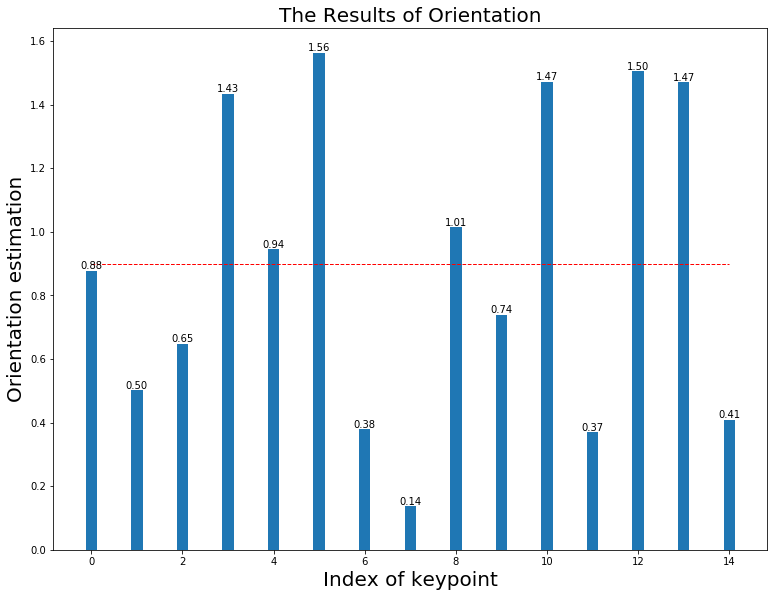

Final result: [    0.87665     0.50101     0.64685       1.433     0.94426      1.5626     0.37901     0.13664      1.0134     0.73846      1.4718      0.3688      1.5042      1.4692     0.40889]
FD Rotate(1.0):mean(0.897), median(0.897) in 0.101
The HoG estimation when (1.0) is  1


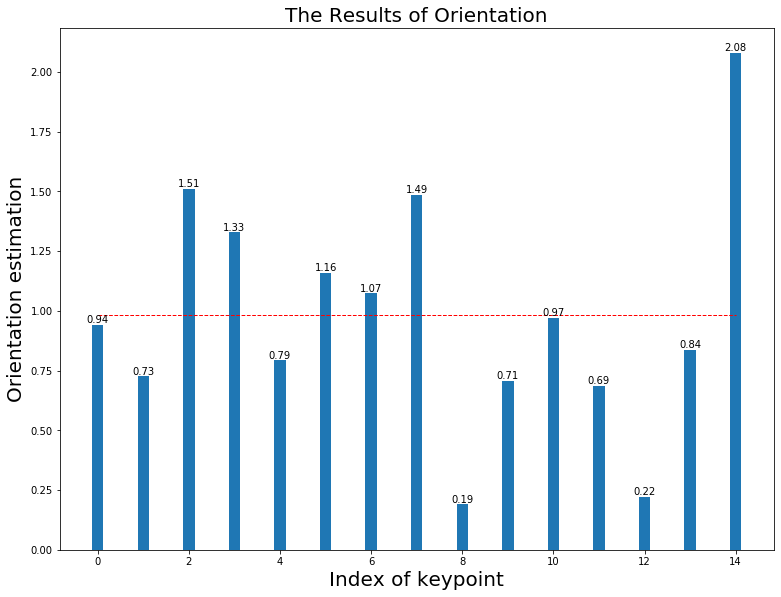

Final result: [    0.94012     0.72595      1.5102      1.3283     0.79205      1.1596       1.073      1.4856      0.1906     0.70654        0.97     0.68716     0.22095     0.83569      2.0795]
FD Rotate(1.1):mean(0.980), median(0.980) in 0.094
The HoG estimation when (1.1) is  1


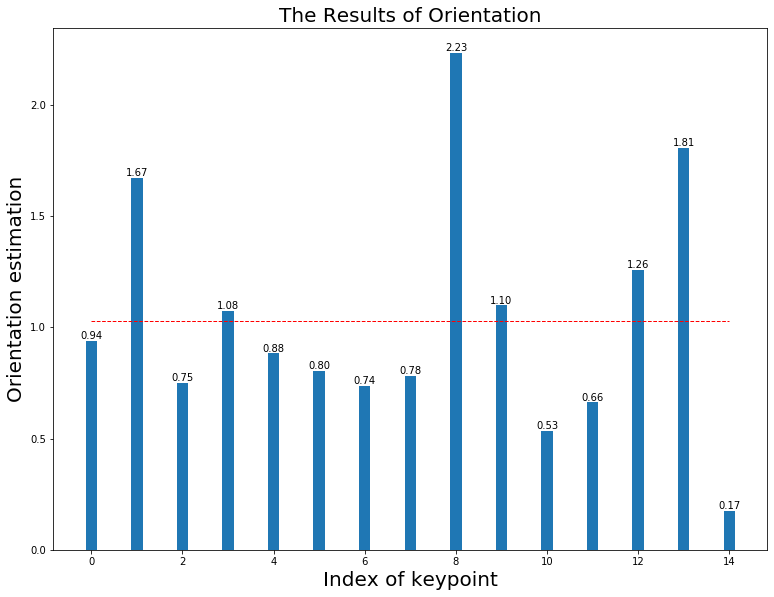

Final result: [    0.93878      1.6727     0.75006      1.0751     0.88214     0.80252       0.735     0.78067       2.233      1.0983     0.53418     0.66217      1.2562      1.8065     0.17444]
FD Rotate(1.2):mean(1.027), median(1.027) in 0.098
The HoG estimation when (1.2) is  1


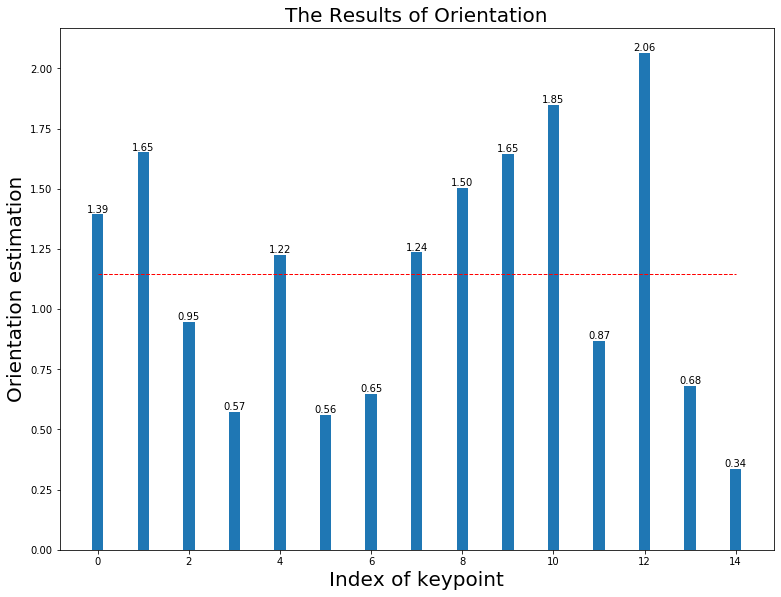

Final result: [     1.3939      1.6511     0.94809     0.57387      1.2245     0.56009     0.64682      1.2354      1.5037      1.6459      1.8474     0.86716      2.0649     0.68033     0.33728]
FD Rotate(1.3):mean(1.145), median(1.145) in 0.098
The HoG estimation when (1.3) is  1


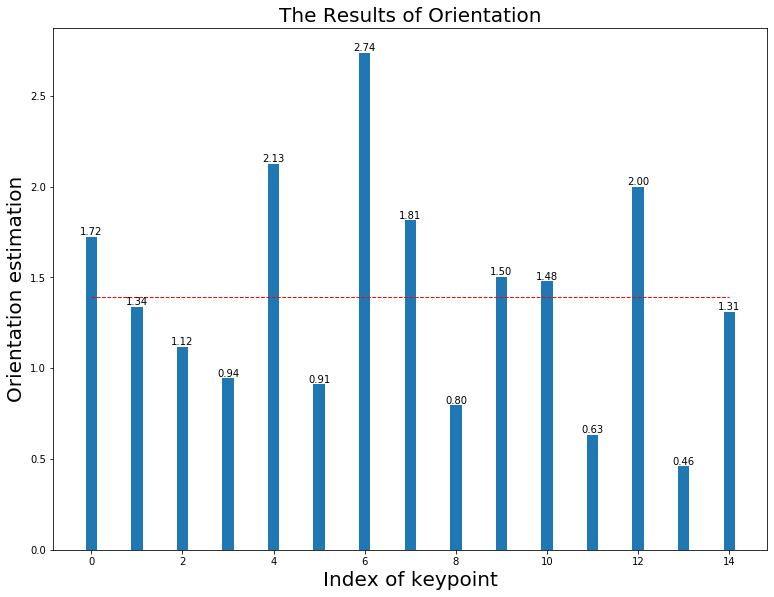

Final result: [     1.7236      1.3384      1.1156     0.94473      2.1271     0.91107      2.7372      1.8144     0.79596      1.5039      1.4786     0.63232      1.9985     0.45929      1.3095]
FD Rotate(1.4):mean(1.393), median(1.393) in 0.099
The HoG estimation when (1.4) is  2


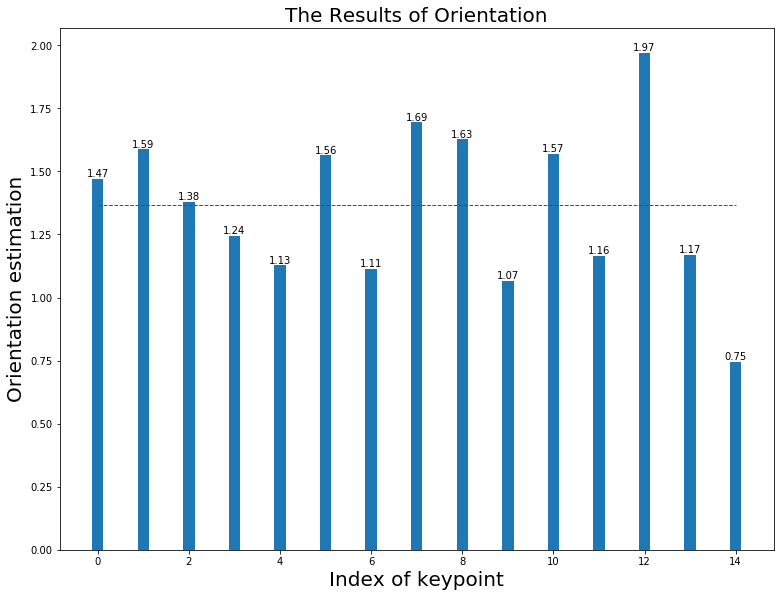

Final result: [     1.4716      1.5875      1.3778      1.2441      1.1277      1.5641      1.1137      1.6945      1.6266      1.0664      1.5692      1.1645      1.9702       1.168     0.74541]
FD Rotate(1.5):mean(1.366), median(1.366) in 0.102
The HoG estimation when (1.5) is  2


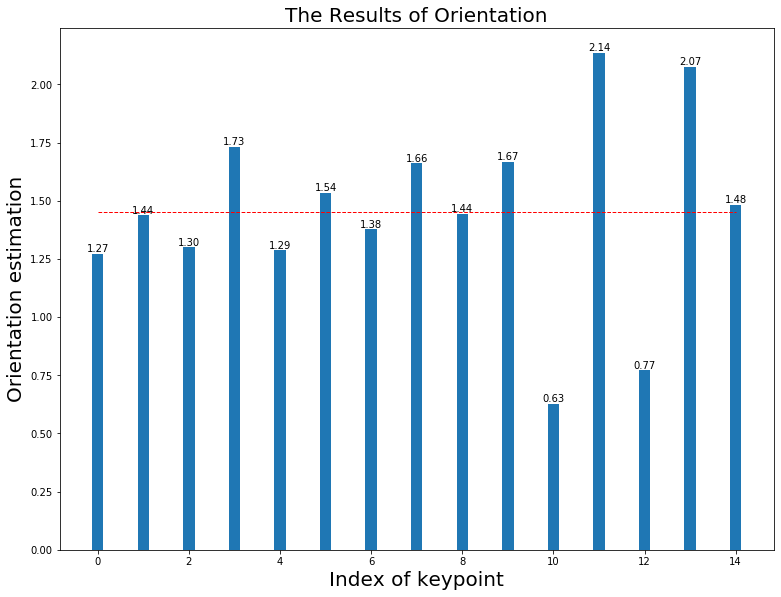

Final result: [     1.2725       1.437      1.2994        1.73       1.287      1.5352      1.3767      1.6601      1.4429      1.6672     0.62764      2.1356     0.77122       2.074      1.4819]
FD Rotate(1.6):mean(1.453), median(1.453) in 0.100
The HoG estimation when (1.6) is  2


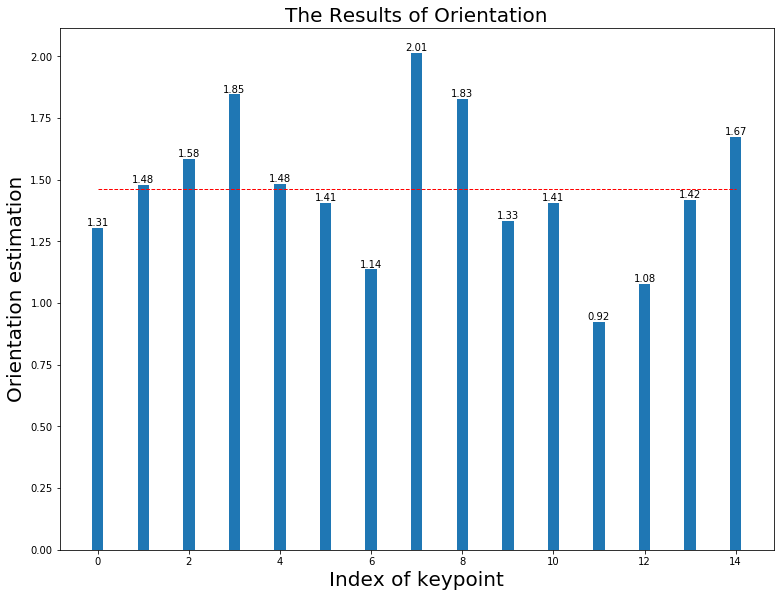

Final result: [     1.3054      1.4784      1.5831      1.8456      1.4826      1.4066      1.1368      2.0141      1.8285      1.3336      1.4055     0.92249      1.0771      1.4187      1.6719]
FD Rotate(1.7):mean(1.461), median(1.461) in 0.096
The HoG estimation when (1.7) is  2


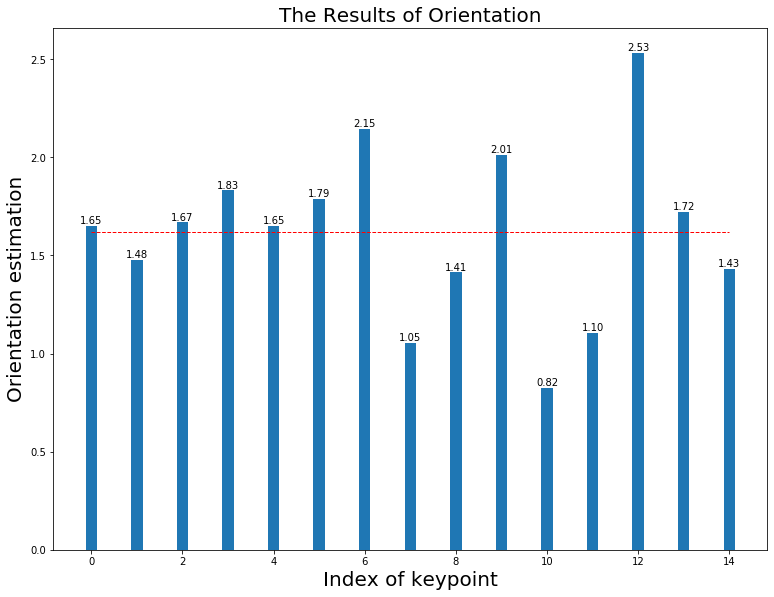

Final result: [     1.6523      1.4785      1.6689      1.8318      1.6523      1.7895      2.1451      1.0548      1.4137      2.0134     0.82489      1.1041       2.533      1.7207      1.4319]
FD Rotate(1.8):mean(1.621), median(1.621) in 0.095
The HoG estimation when (1.8) is  2


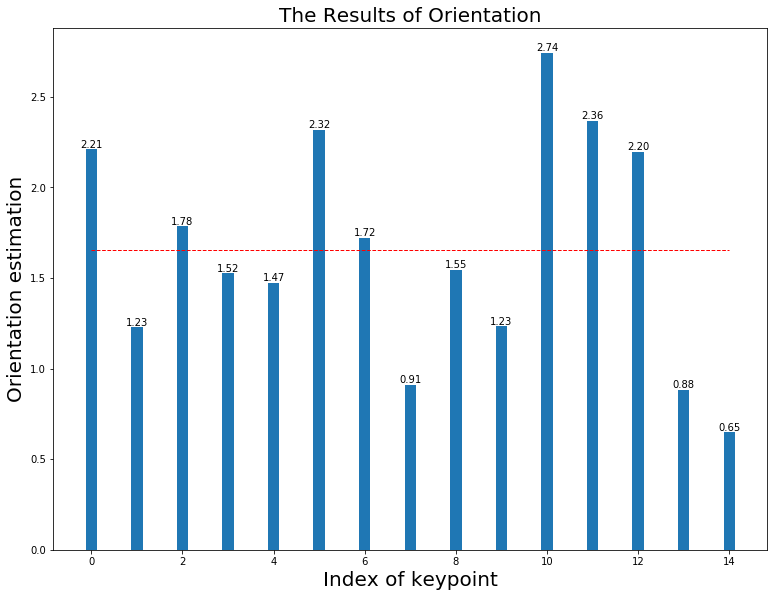

Final result: [     2.2093      1.2275      1.7839      1.5243       1.473      2.3175      1.7209     0.91098      1.5462      1.2333      2.7419      2.3649      2.1954     0.88315     0.64769]
FD Rotate(1.9):mean(1.652), median(1.652) in 0.097
The HoG estimation when (1.9) is  2


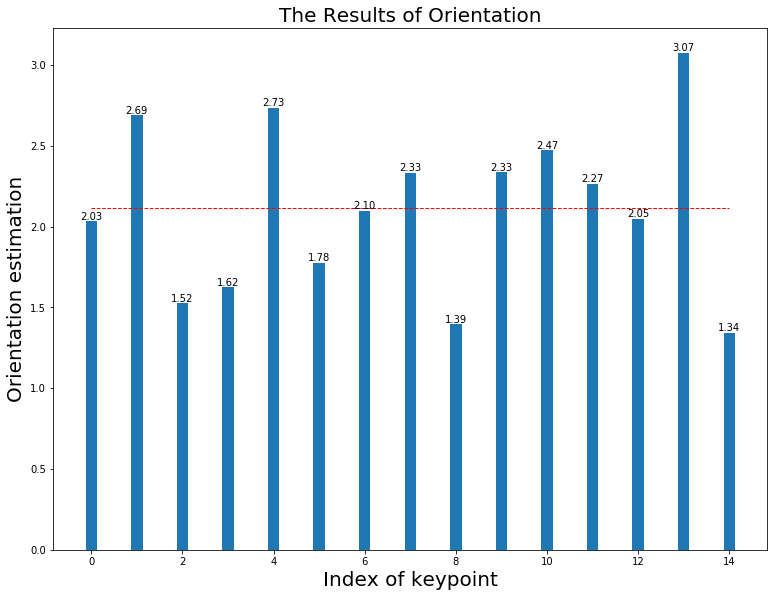

Final result: [     2.0324      2.6878      1.5247      1.6228      2.7333       1.777      2.0988      2.3318      1.3949      2.3343      2.4714      2.2651      2.0457      3.0747      1.3415]
FD Rotate(2.0):mean(2.116), median(2.116) in 0.096
The HoG estimation when (2.0) is  2


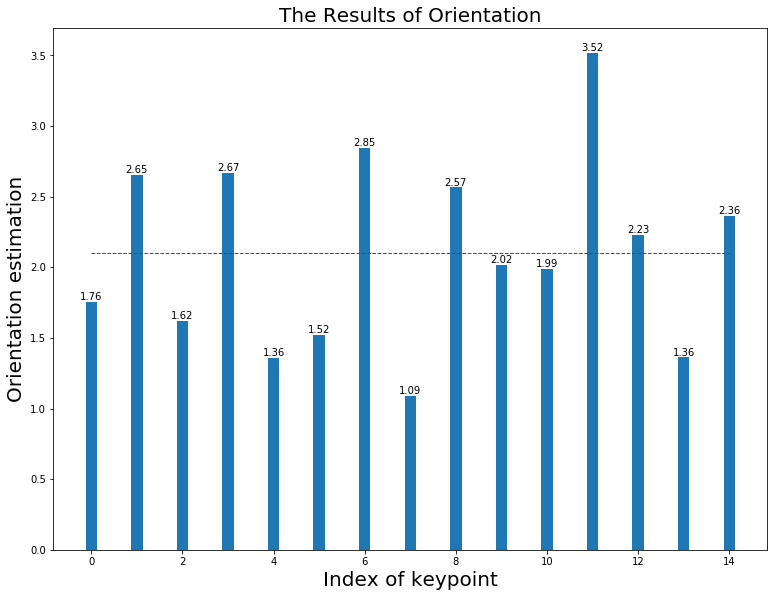

Final result: [     1.7564      2.6523      1.6187       2.669      1.3564      1.5208      2.8459      1.0879      2.5655      2.0167      1.9864      3.5179      2.2308      1.3618      2.3648]
FD Rotate(2.1):mean(2.103), median(2.103) in 0.099
The HoG estimation when (2.1) is  2


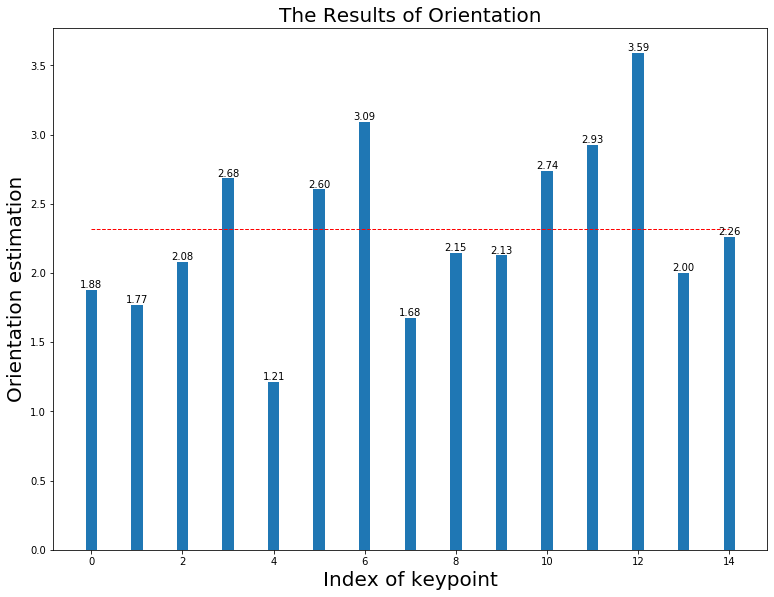

Final result: [     1.8782      1.7679      2.0806       2.683      1.2143      2.6035      3.0939       1.678      2.1452      2.1274      2.7397      2.9262      3.5905       1.998      2.2591]
FD Rotate(2.2):mean(2.319), median(2.319) in 0.097
The HoG estimation when (2.2) is  2


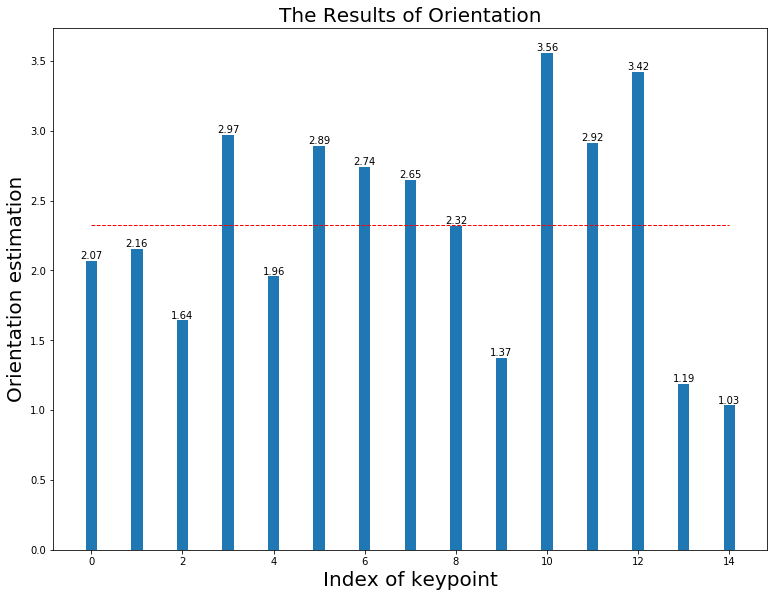

Final result: [     2.0672      2.1568      1.6419      2.9692      1.9572      2.8913      2.7393      2.6477      2.3198      1.3748      3.5578      2.9155      3.4188      1.1869      1.0345]
FD Rotate(2.3):mean(2.325), median(2.325) in 0.100
The HoG estimation when (2.3) is  2


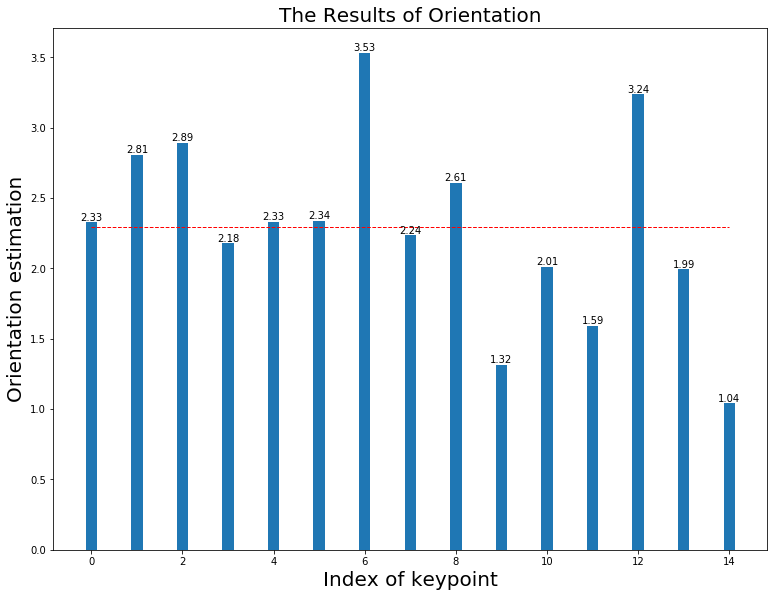

Final result: [     2.3268      2.8088      2.8904      2.1791      2.3295      2.3391       3.533      2.2356      2.6078      1.3164      2.0119      1.5941      3.2383      1.9936      1.0411]
FD Rotate(2.4):mean(2.296), median(2.296) in 0.101
The HoG estimation when (2.4) is  2


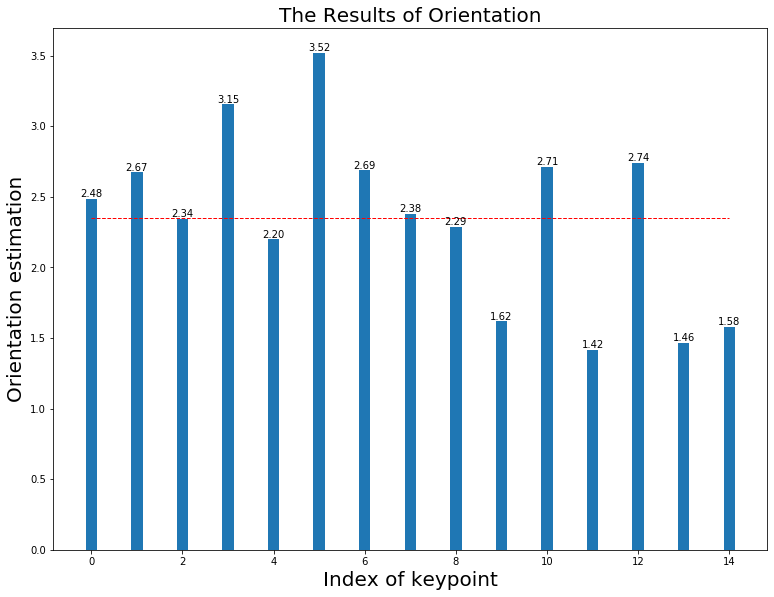

Final result: [     2.4824      2.6718       2.343      3.1533      2.1989      3.5192      2.6867      2.3795      2.2878      1.6173      2.7123      1.4152       2.739      1.4647      1.5792]
FD Rotate(2.5):mean(2.350), median(2.350) in 0.101
The HoG estimation when (2.5) is  3


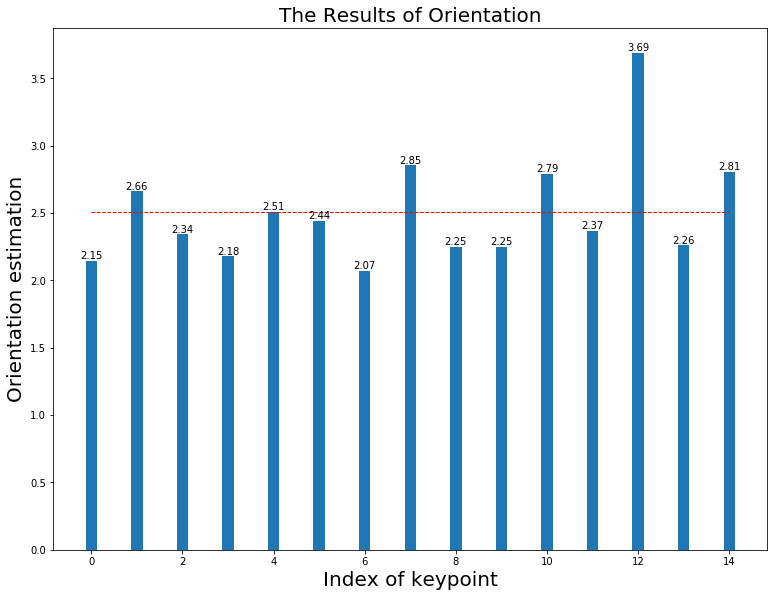

Final result: [     2.1483      2.6617      2.3434      2.1783      2.5082      2.4446      2.0715      2.8547      2.2484      2.2471      2.7942       2.371      3.6909      2.2604      2.8068]
FD Rotate(2.6):mean(2.509), median(2.509) in 0.103
The HoG estimation when (2.6) is  3


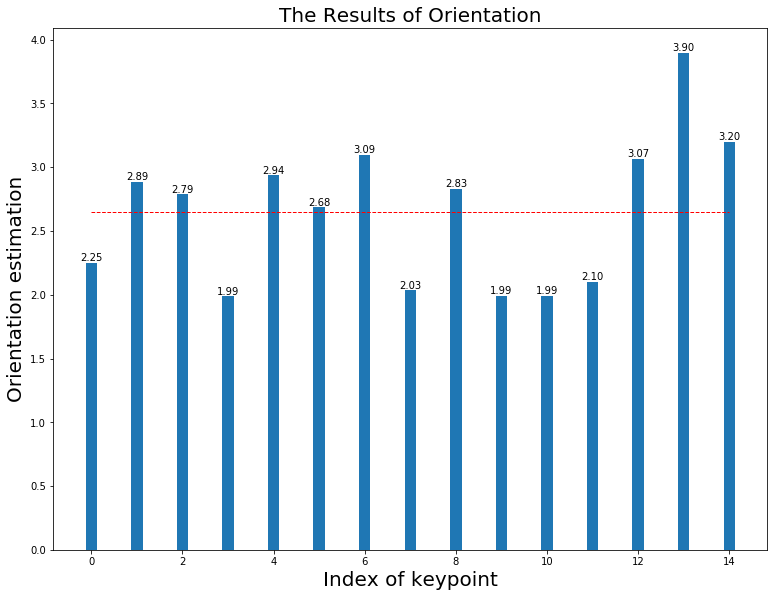

Final result: [     2.2471      2.8852      2.7881      1.9878      2.9358      2.6849      3.0944      2.0342      2.8313      1.9934      1.9941      2.1033       3.066      3.8973      3.1963]
FD Rotate(2.7):mean(2.649), median(2.649) in 0.104
The HoG estimation when (2.7) is  3


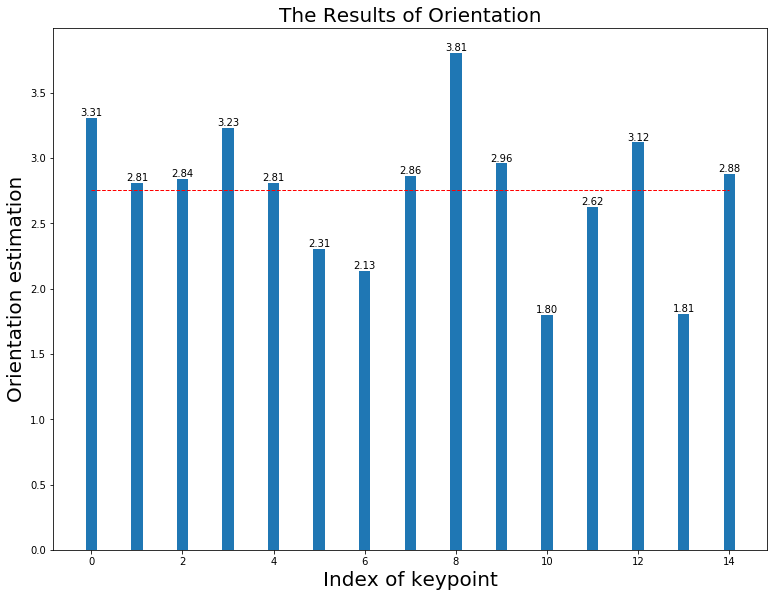

Final result: [     3.3097      2.8107      2.8432      3.2334      2.8101      2.3065      2.1345      2.8637      3.8071      2.9604      1.8017      2.6241      3.1207       1.809       2.882]
FD Rotate(2.8):mean(2.754), median(2.754) in 0.103
The HoG estimation when (2.8) is  3


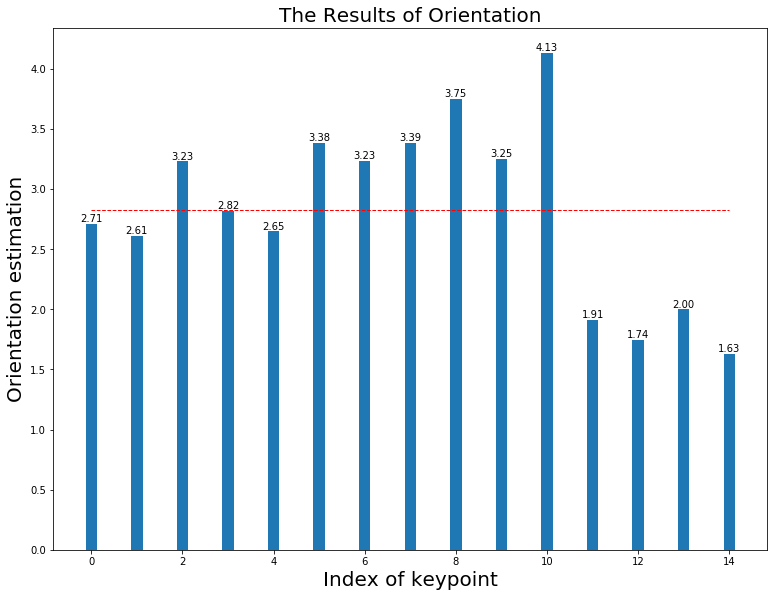

Final result: [      2.711      2.6101      3.2307      2.8171      2.6494      3.3825      3.2324      3.3862      3.7528      3.2547      4.1345      1.9137      1.7433      1.9993      1.6315]
FD Rotate(2.9):mean(2.830), median(2.830) in 0.102
The HoG estimation when (2.9) is  3


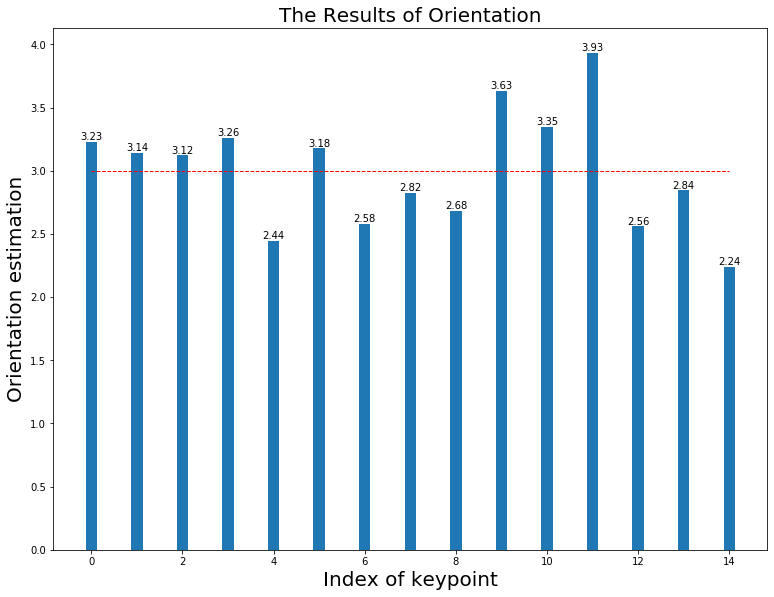

Final result: [      3.226      3.1407      3.1213      3.2591      2.4424       3.177      2.5797      2.8239      2.6831      3.6302        3.35      3.9335      2.5594      2.8445      2.2377]
FD Rotate(3.0):mean(3.001), median(3.001) in 0.105
The HoG estimation when (3.0) is  3


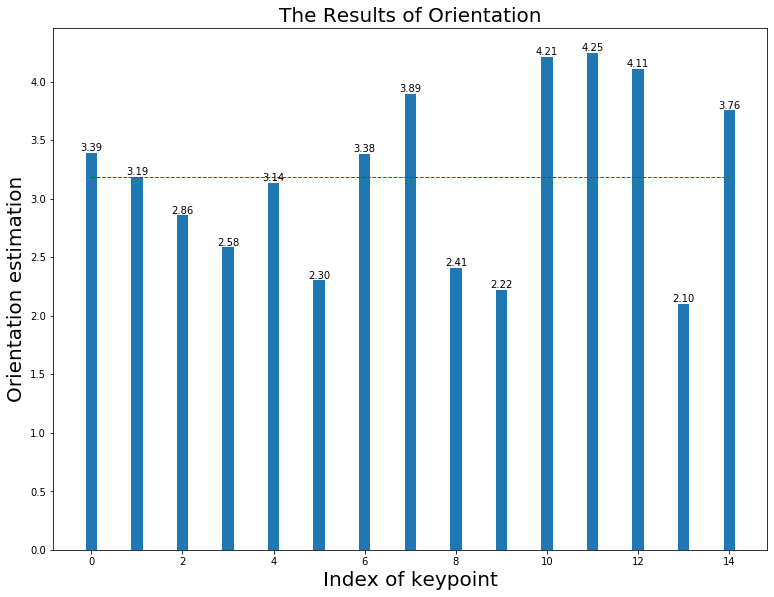

Final result: [     3.3884      3.1858      2.8579      2.5847      3.1363      2.3024      3.3832      3.8933      2.4107      2.2207      4.2117      4.2463      4.1097      2.1004      3.7554]
FD Rotate(3.1):mean(3.186), median(3.186) in 0.103
The HoG estimation when (3.1) is  3


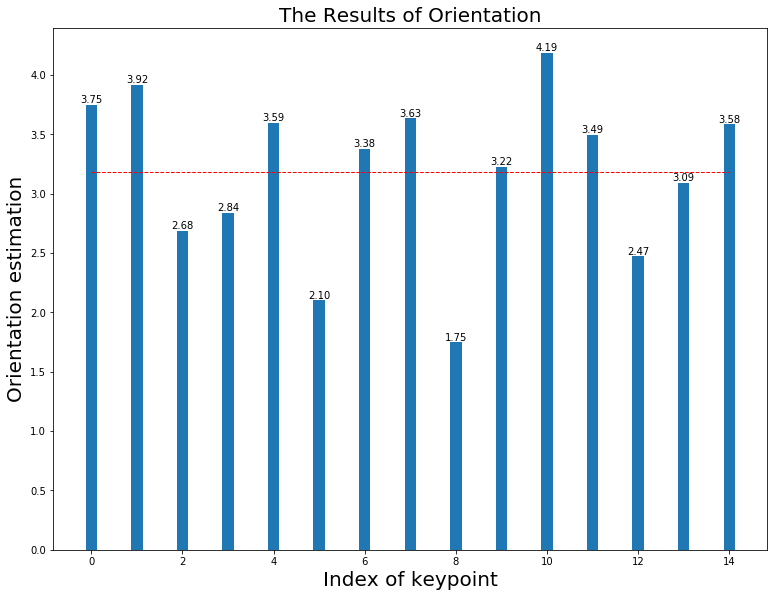

Final result: [     3.7492      3.9185      2.6837      2.8409      3.5948      2.1013      3.3763      3.6338      1.7467      3.2242      4.1862       3.494      2.4705      3.0936      3.5822]
FD Rotate(3.2):mean(3.180), median(3.180) in 0.099
The HoG estimation when (3.2) is  3


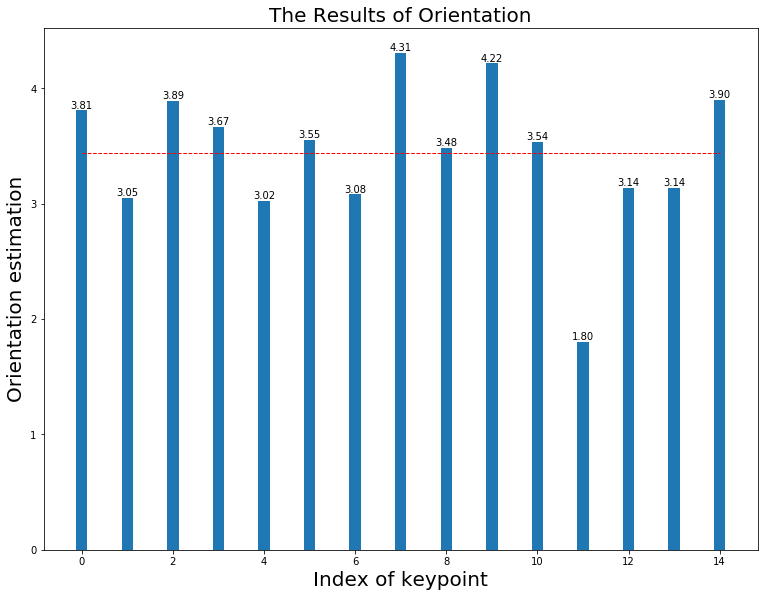

Final result: [     3.8104      3.0512      3.8947      3.6688       3.024      3.5537      3.0824      4.3093      3.4831      4.2177      3.5399      1.8033      3.1387      3.1366      3.9023]
FD Rotate(3.3):mean(3.441), median(3.441) in 0.095
The HoG estimation when (3.3) is  3


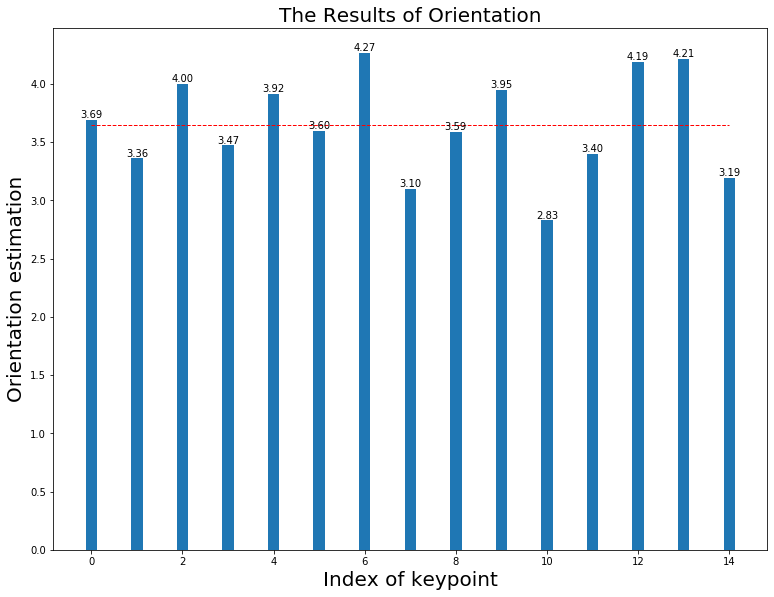

Final result: [     3.6931      3.3611      3.9964      3.4706      3.9156      3.5981      4.2663      3.0964      3.5883      3.9471      2.8269      3.3976      4.1872      4.2123      3.1899]
FD Rotate(3.4):mean(3.650), median(3.650) in 0.096
The HoG estimation when (3.4) is  3


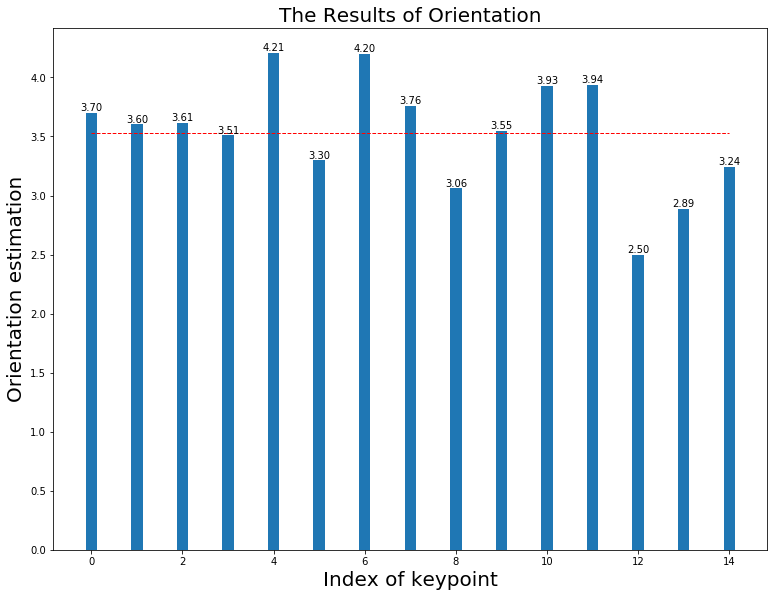

Final result: [     3.6968      3.6014      3.6121      3.5093      4.2086      3.2981      4.1972      3.7609      3.0599       3.545      3.9302      3.9373      2.4986      2.8856      3.2401]
FD Rotate(3.5):mean(3.532), median(3.532) in 0.098
The HoG estimation when (3.5) is  3


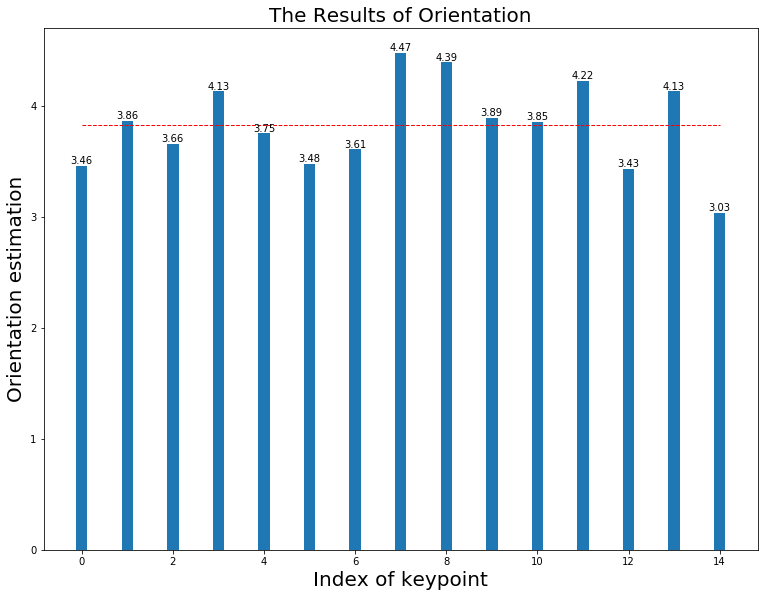

Final result: [     3.4557       3.861      3.6554      4.1271      3.7504      3.4768      3.6053      4.4749      4.3882      3.8911      3.8535      4.2216      3.4311      4.1273      3.0324]
FD Rotate(3.6):mean(3.823), median(3.823) in 0.093
The HoG estimation when (3.6) is  4


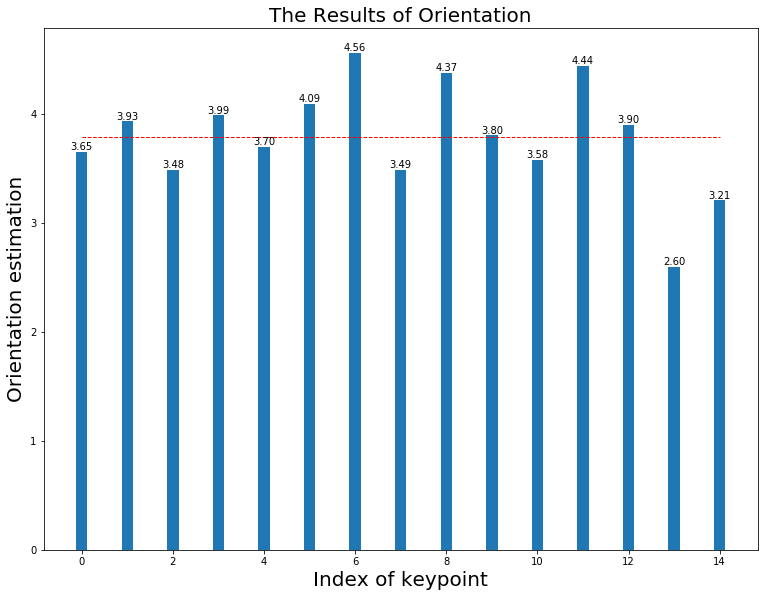

Final result: [     3.6517      3.9301      3.4819      3.9858      3.6977      4.0874      4.5593      3.4859      4.3748      3.8009      3.5763      4.4383      3.8953      2.5951      3.2063]
FD Rotate(3.7):mean(3.784), median(3.784) in 0.101
The HoG estimation when (3.7) is  4


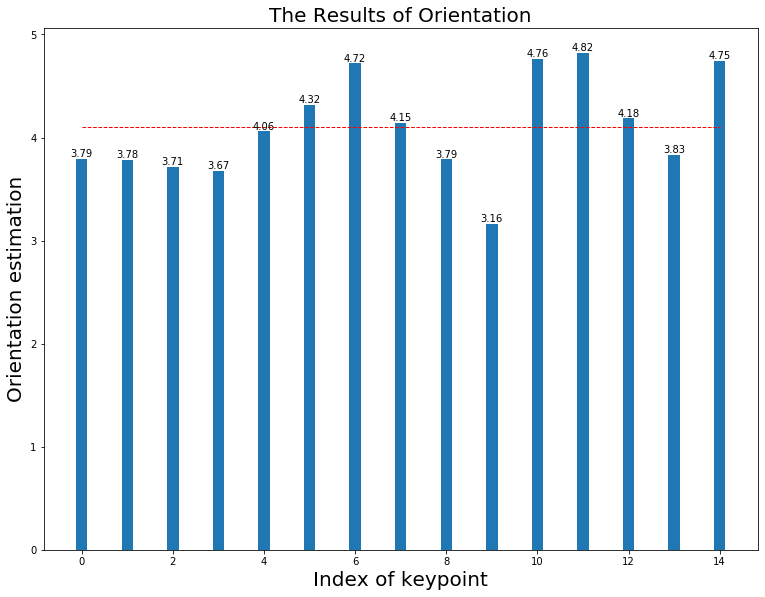

Final result: [     3.7932      3.7805      3.7139      3.6738      4.0592      4.3192      4.7201      4.1454      3.7888      3.1625      4.7597      4.8221      4.1848       3.829      4.7466]
FD Rotate(3.8):mean(4.100), median(4.100) in 0.103
The HoG estimation when (3.8) is  4


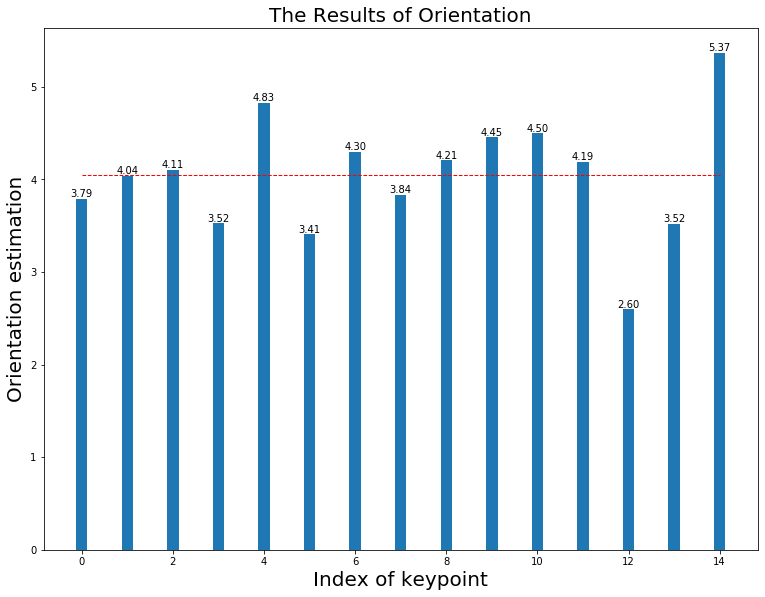

Final result: [     3.7935      4.0372      4.1073      3.5248      4.8283      3.4056      4.3004      3.8355      4.2061      4.4547      4.4964      4.1926      2.5978      3.5187      5.3678]
FD Rotate(3.9):mean(4.044), median(4.044) in 0.111
The HoG estimation when (3.9) is  4


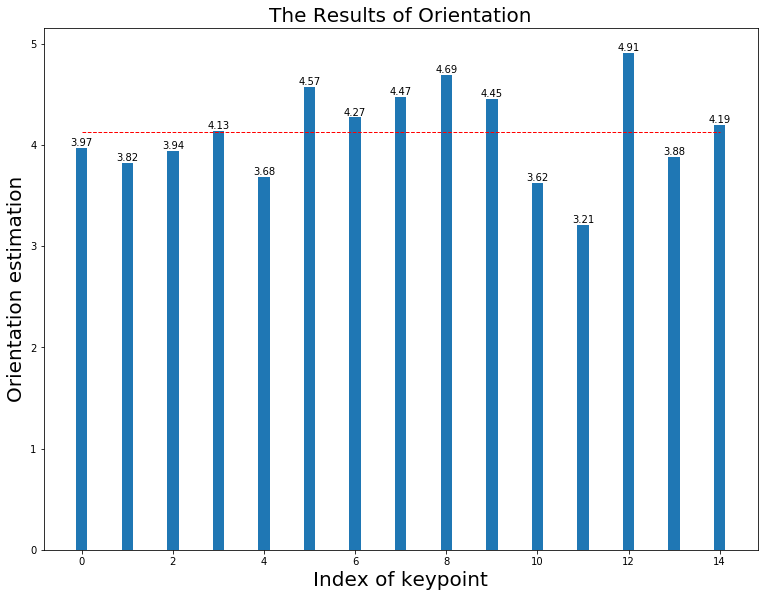

Final result: [     3.9698      3.8223      3.9366      4.1339      3.6825      4.5724      4.2697       4.474      4.6928      4.4534      3.6238      3.2096      4.9082      3.8805      4.1943]
FD Rotate(4.0):mean(4.122), median(4.122) in 0.108
The HoG estimation when (4.0) is  4


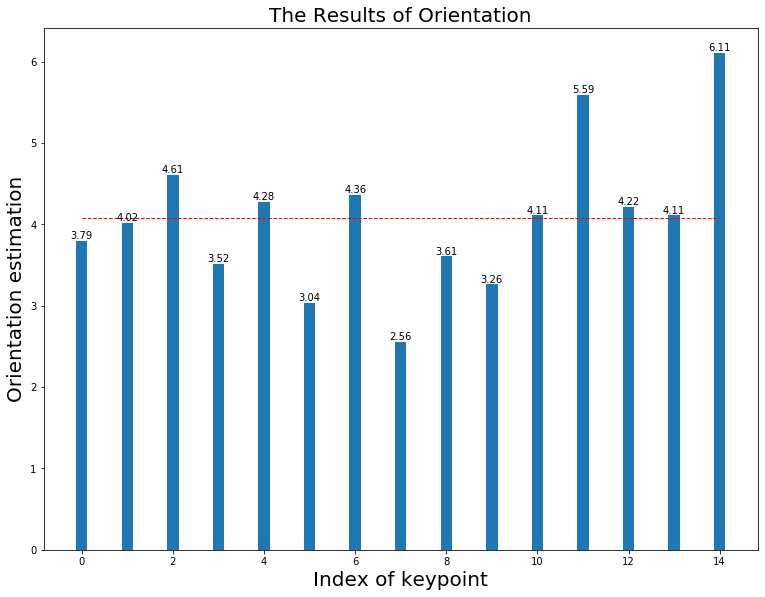

Final result: [      3.793      4.0165      4.6098      3.5184      4.2764      3.0383      4.3583      2.5594      3.6065       3.263      4.1094      5.5887      4.2155       4.109      6.1082]
FD Rotate(4.1):mean(4.078), median(4.078) in 0.094
The HoG estimation when (4.1) is  4


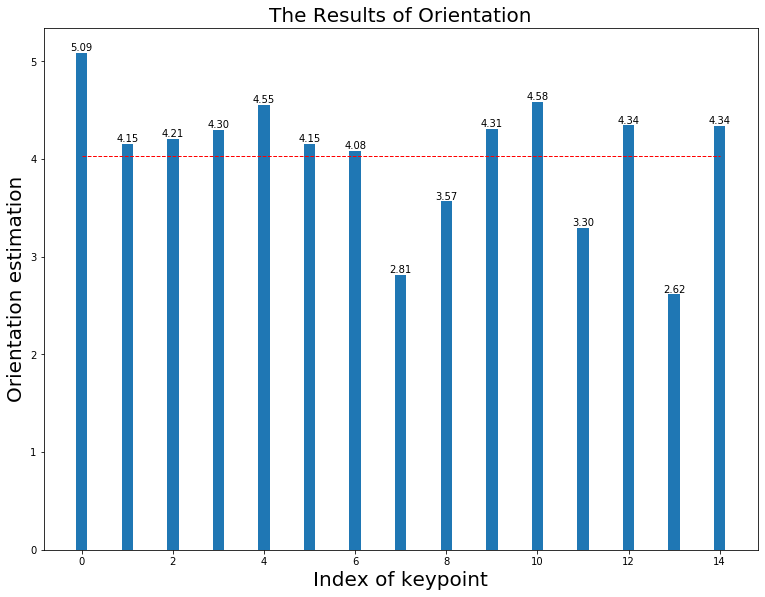

Final result: [     5.0869       4.152      4.2089      4.2956      4.5523      4.1543      4.0817      2.8146      3.5668      4.3114      4.5816      3.2971      4.3435      2.6155      4.3387]
FD Rotate(4.2):mean(4.027), median(4.027) in 0.094
The HoG estimation when (4.2) is  4


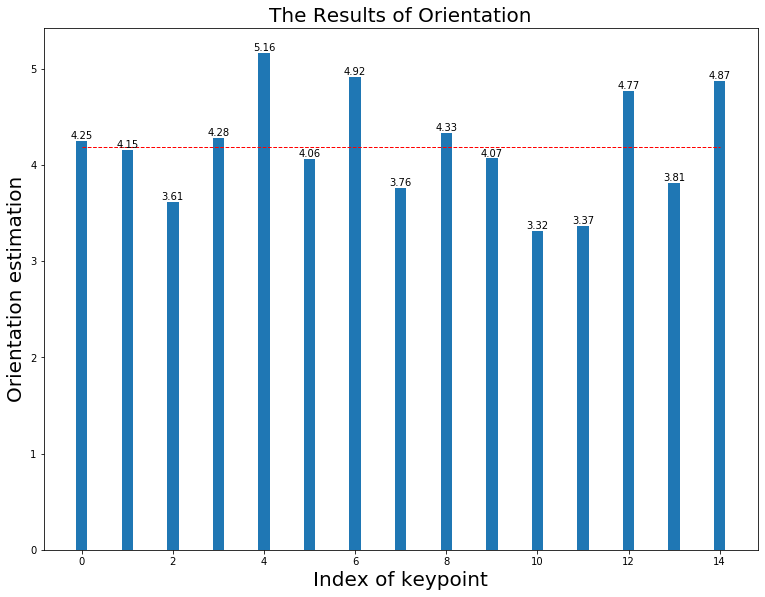

Final result: [     4.2488      4.1542      3.6125      4.2819      5.1635      4.0648      4.9158      3.7593      4.3326       4.066      3.3164      3.3689      4.7718      3.8094       4.873]
FD Rotate(4.3):mean(4.183), median(4.183) in 0.105
The HoG estimation when (4.3) is  4


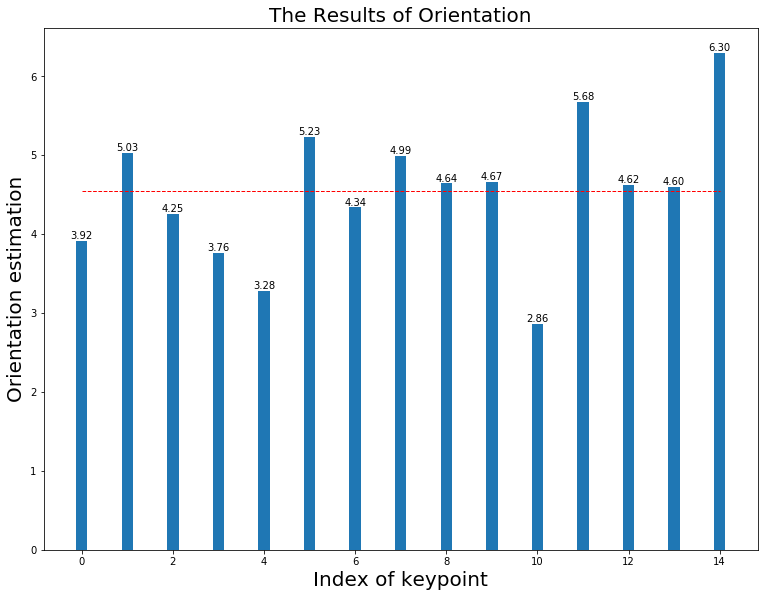

Final result: [     3.9166      5.0329       4.254      3.7589      3.2787      5.2324      4.3382       4.989      4.6415      4.6656       2.859      5.6761      4.6215      4.6009      6.2974]
FD Rotate(4.4):mean(4.544), median(4.544) in 0.096
The HoG estimation when (4.4) is  5


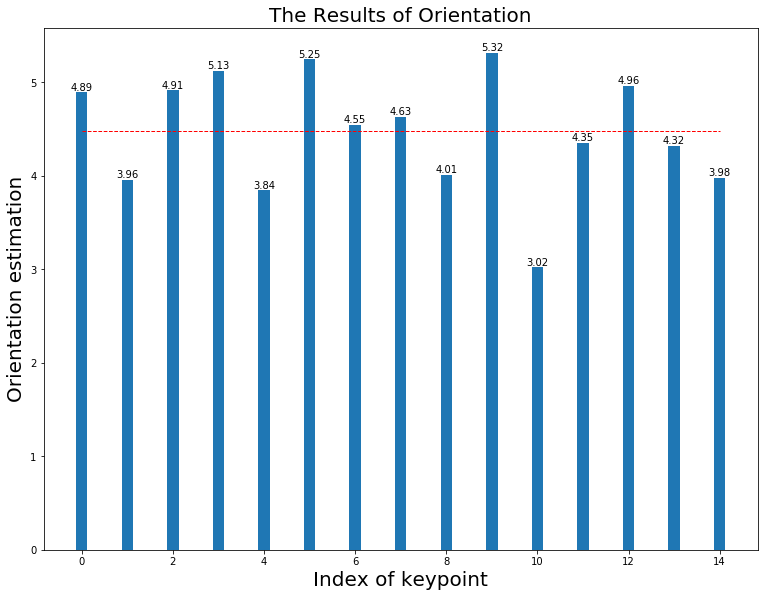

Final result: [     4.8931      3.9556      4.9141      5.1259      3.8435      5.2463      4.5477      4.6321       4.011      5.3165      3.0206      4.3529      4.9621      4.3239      3.9762]
FD Rotate(4.5):mean(4.475), median(4.475) in 0.097
The HoG estimation when (4.5) is  5


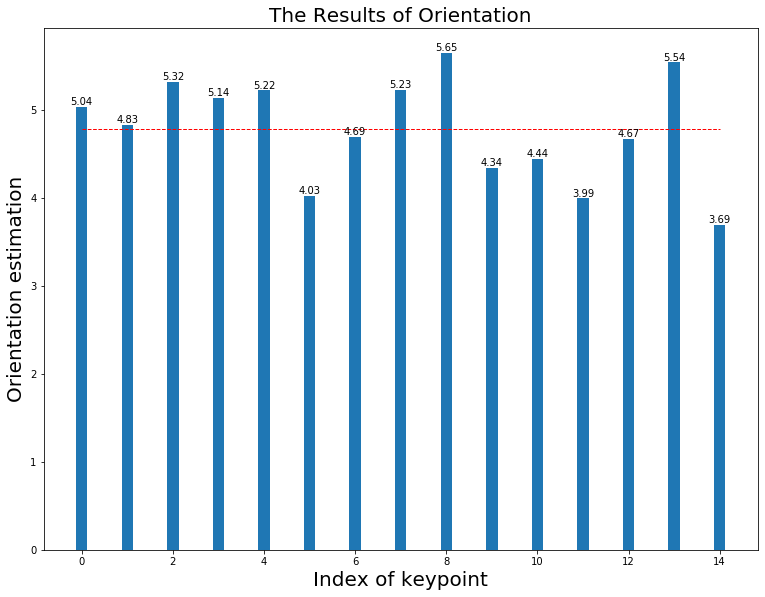

Final result: [     5.0373      4.8328        5.32      5.1361      5.2227      4.0271      4.6939      5.2298      5.6504      4.3439      4.4437       3.994      4.6729      5.5408      3.6938]
FD Rotate(4.6):mean(4.789), median(4.789) in 0.109
The HoG estimation when (4.6) is  5


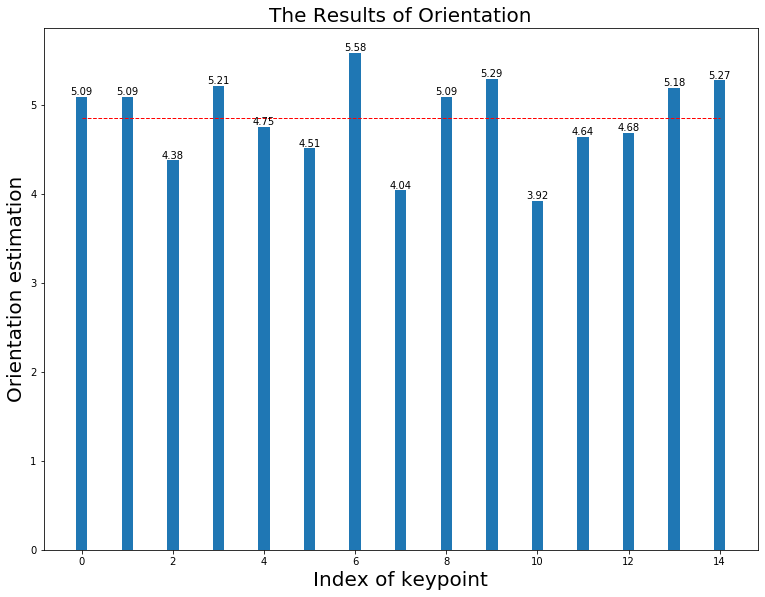

Final result: [      5.088       5.088      4.3754      5.2129      4.7544      4.5088      5.5824      4.0381      5.0884      5.2908      3.9175      4.6367      4.6805      5.1842      5.2725]
FD Rotate(4.7):mean(4.848), median(4.848) in 0.101
The HoG estimation when (4.7) is  5


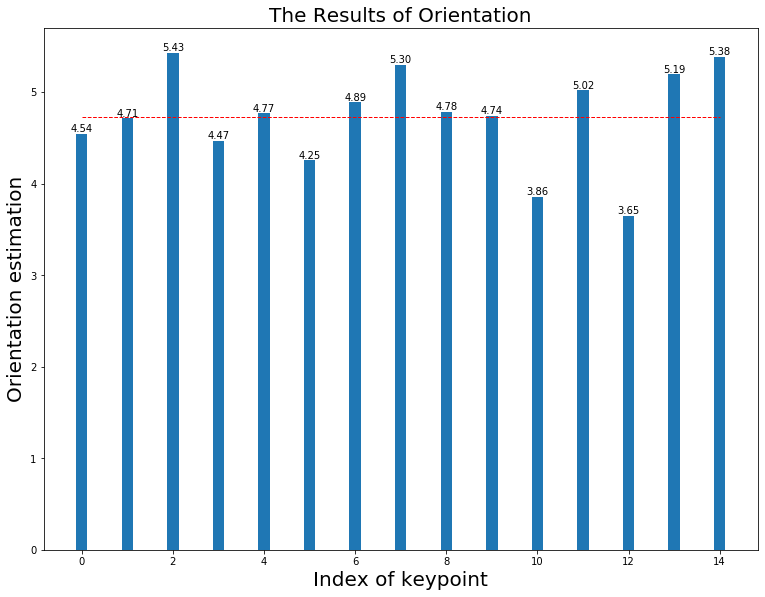

Final result: [     4.5438      4.7133       5.431      4.4678      4.7695      4.2546      4.8902      5.3021      4.7827      4.7406      3.8602       5.019      3.6482      5.1941      5.3845]
FD Rotate(4.8):mean(4.733), median(4.733) in 0.108
The HoG estimation when (4.8) is  5


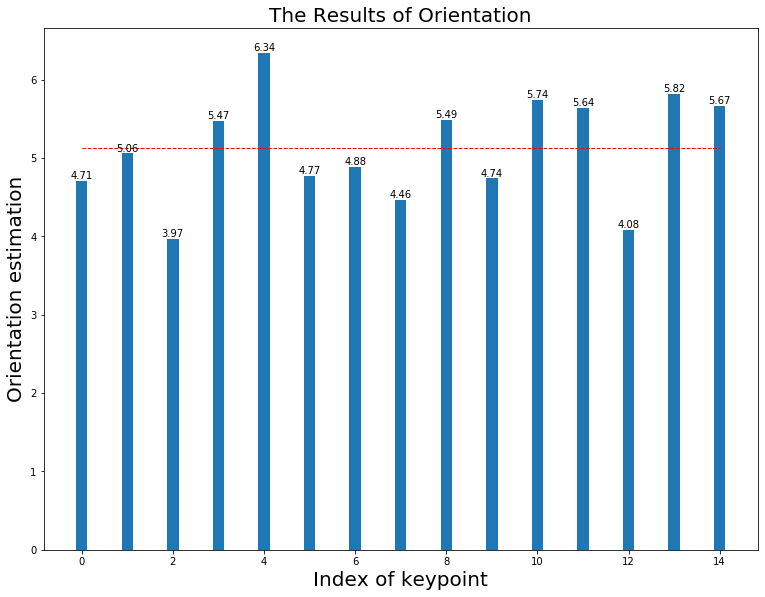

Final result: [     4.7094      5.0588        3.97      5.4739      6.3408      4.7731      4.8817      4.4608      5.4858      4.7396      5.7377      5.6389      4.0789      5.8182      5.6665]
FD Rotate(4.9):mean(5.122), median(5.122) in 0.108
The HoG estimation when (4.9) is  5


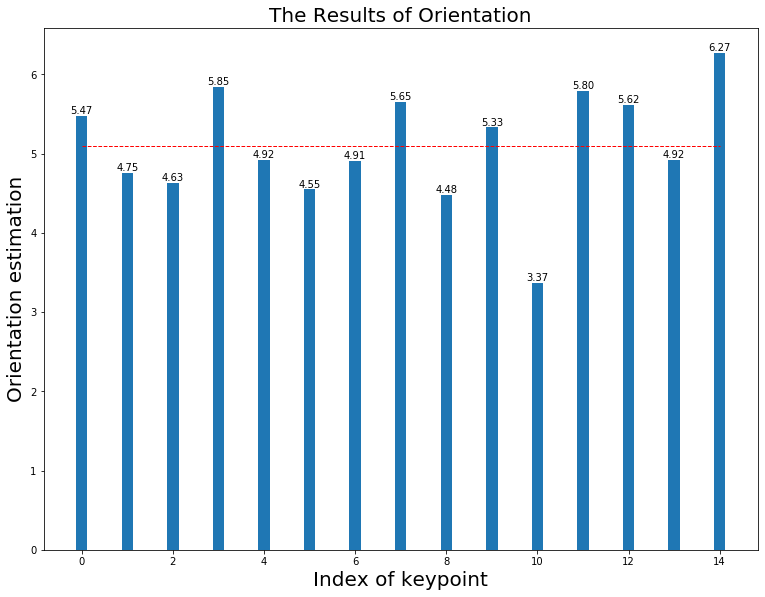

Final result: [     5.4724      4.7548      4.6284      5.8467      4.9191      4.5494      4.9104      5.6511      4.4805      5.3319      3.3675      5.7964      5.6204      4.9176      6.2732]
FD Rotate(5.0):mean(5.101), median(5.101) in 0.102
The HoG estimation when (5.0) is  5


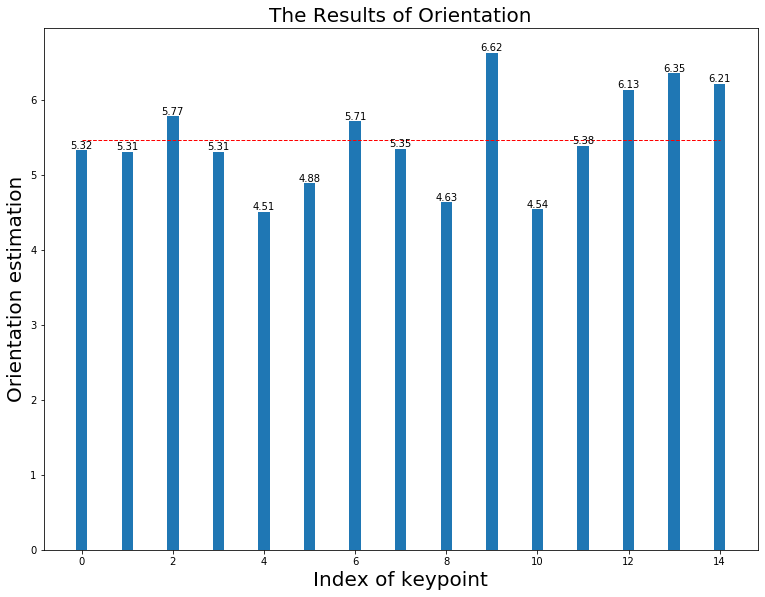

Final result: [      5.323      5.3073       5.775      5.3069      4.5054      4.8848       5.708      5.3466      4.6288      6.6235      4.5367      5.3818      6.1267      6.3507      6.2085]
FD Rotate(5.1):mean(5.468), median(5.468) in 0.116
The HoG estimation when (5.1) is  5


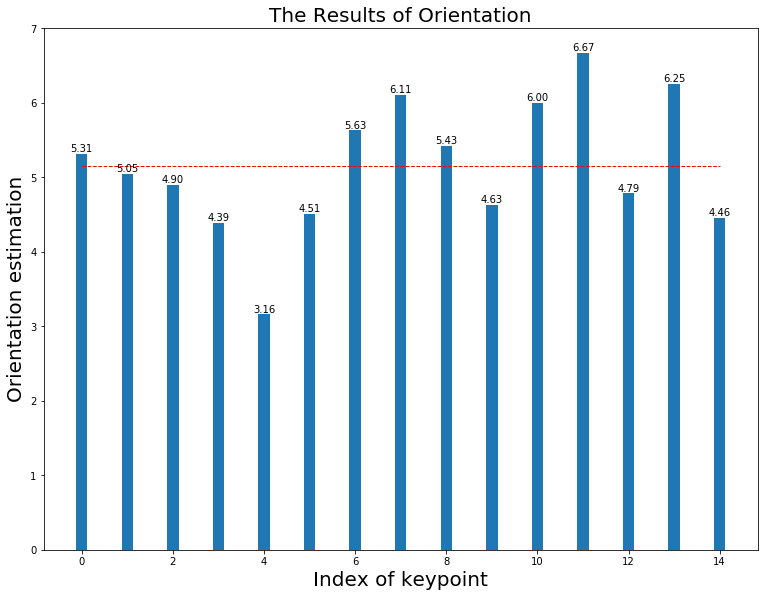

Final result: [     5.3133       5.047      4.8978       4.392      3.1626      4.5137      5.6316      6.1122       5.428      4.6277      5.9972       6.673      4.7865      6.2514      4.4554]
FD Rotate(5.2):mean(5.153), median(5.153) in 0.104
The HoG estimation when (5.2) is  5


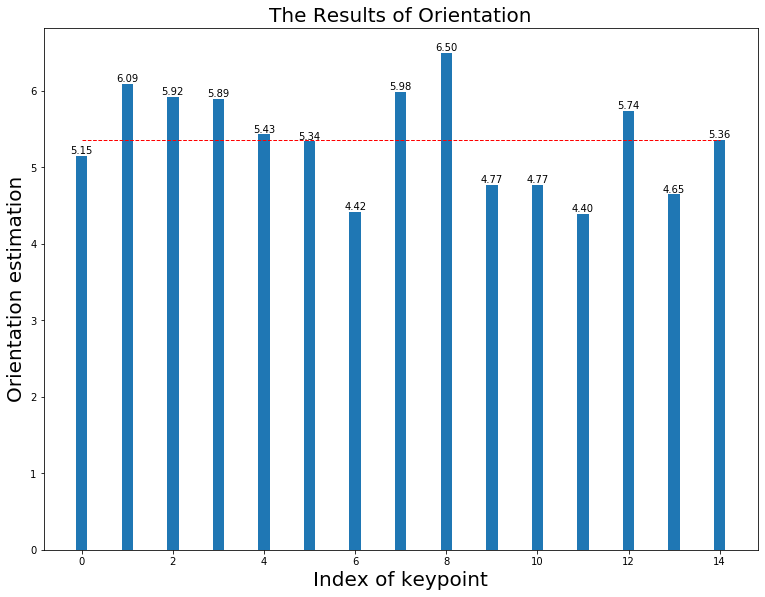

Final result: [     5.1492      6.0924      5.9203      5.8946      5.4333      5.3405      4.4153      5.9842      6.4991      4.7682      4.7736      4.3972      5.7428      4.6484      5.3611]
FD Rotate(5.3):mean(5.361), median(5.361) in 0.116
The HoG estimation when (5.3) is  5


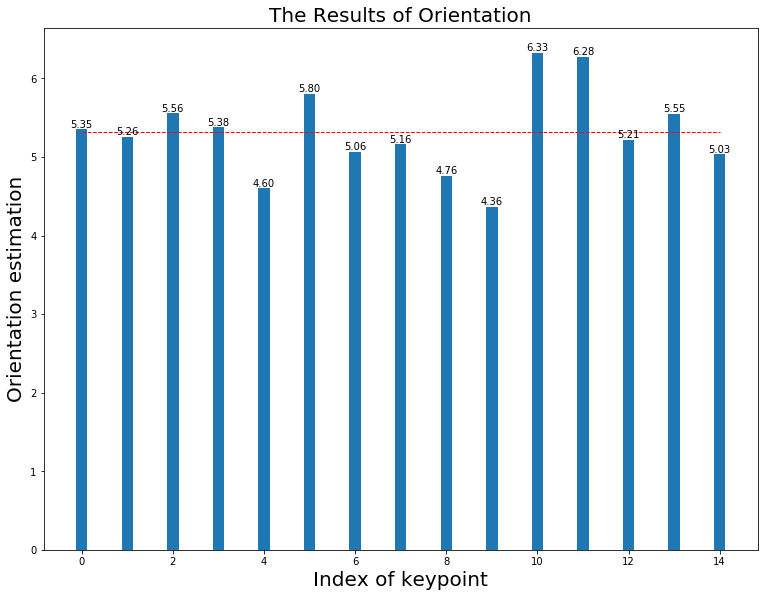

Final result: [     5.3529      5.2588      5.5556      5.3766      4.6019      5.8044      5.0621      5.1615      4.7641      4.3636      6.3268      6.2788      5.2141      5.5521      5.0343]
FD Rotate(5.4):mean(5.314), median(5.314) in 0.104
The HoG estimation when (5.4) is  5


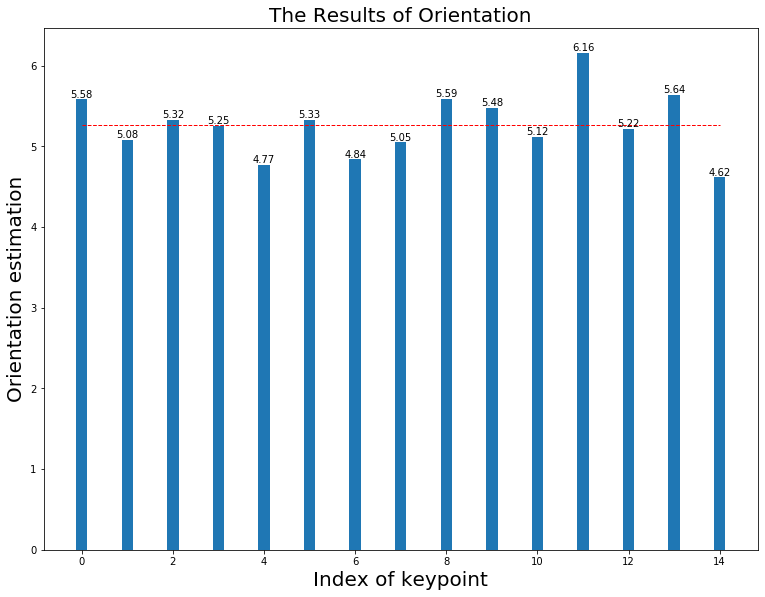

Final result: [     5.5833      5.0844      5.3238      5.2496      4.7734      5.3302        4.84       5.048      5.5857      5.4792      5.1218      6.1592      5.2155      5.6423      4.6165]
FD Rotate(5.5):mean(5.270), median(5.270) in 0.096
The HoG estimation when (5.5) is  6


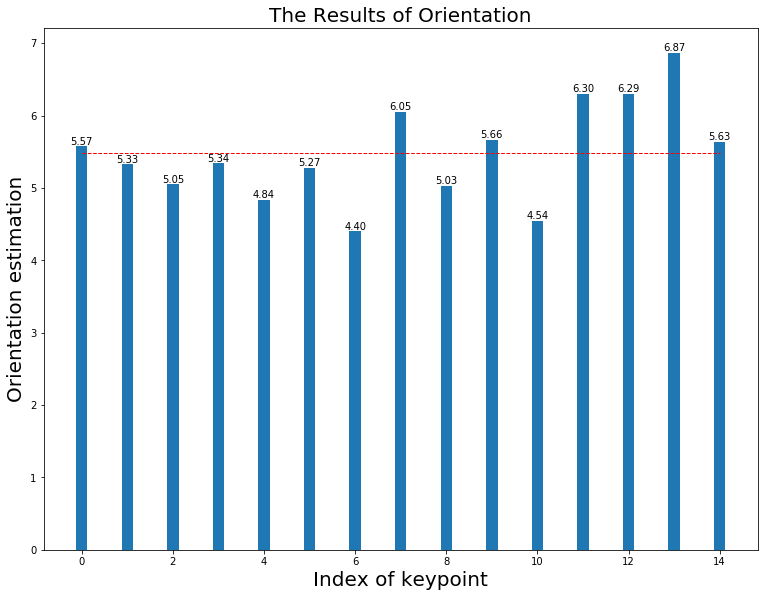

Final result: [     5.5747      5.3256      5.0485      5.3394      4.8377      5.2727      4.4009      6.0488      5.0251       5.661       4.544      6.3006      6.2946       6.867       5.634]
FD Rotate(5.6):mean(5.478), median(5.478) in 0.099
The HoG estimation when (5.6) is  6


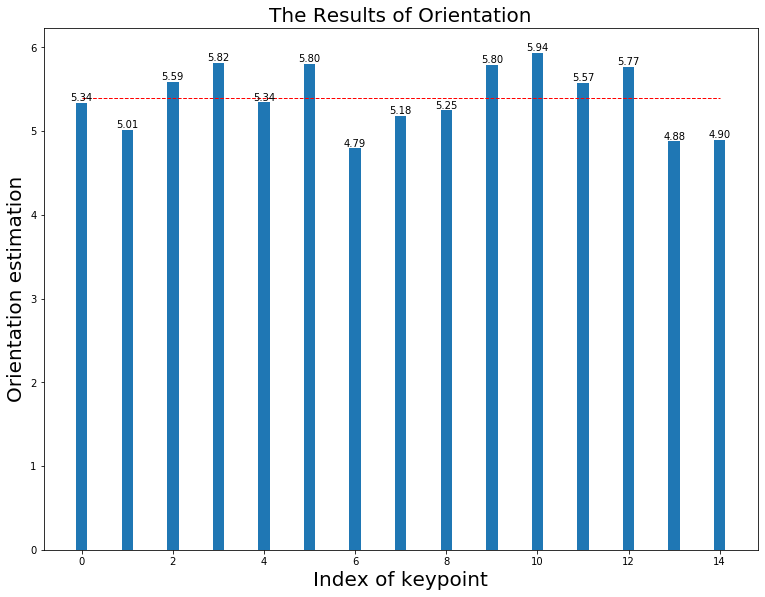

Final result: [     5.3371      5.0147      5.5889      5.8196      5.3435      5.8043      4.7947      5.1787        5.25      5.7958      5.9363      5.5746       5.771      4.8784      4.8973]
FD Rotate(5.7):mean(5.399), median(5.399) in 0.097
The HoG estimation when (5.7) is  6


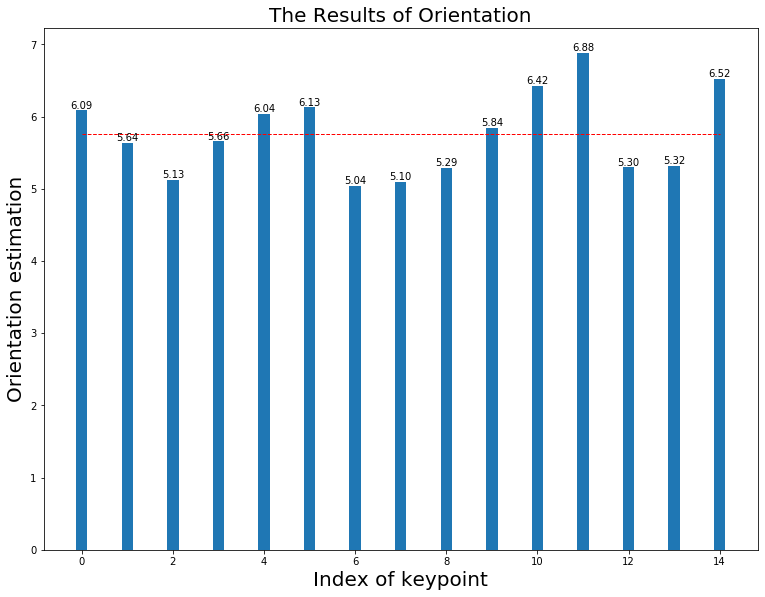

Final result: [     6.0854      5.6385      5.1272      5.6568      6.0367      6.1281      5.0426      5.0951      5.2872      5.8418      6.4205      6.8832      5.2962      5.3151      6.5186]
FD Rotate(5.8):mean(5.758), median(5.758) in 0.102
The HoG estimation when (5.8) is  6


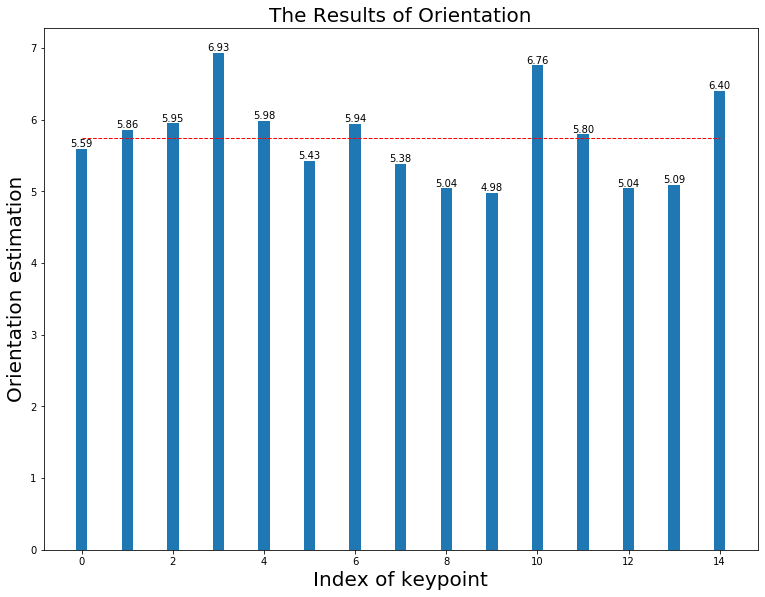

Final result: [     5.5909      5.8608      5.9473      6.9317      5.9842      5.4282      5.9356      5.3821      5.0391      4.9763      6.7574      5.7952      5.0409      5.0938      6.3983]
FD Rotate(5.9):mean(5.744), median(5.744) in 0.102
The HoG estimation when (5.9) is  6


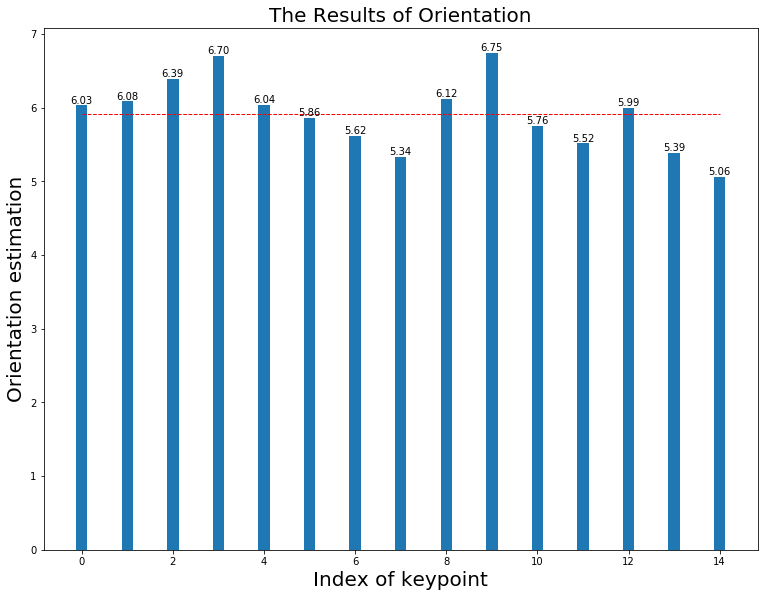

Final result: [      6.033      6.0845      6.3905      6.6997      6.0395      5.8637      5.6172      5.3372      6.1212      6.7453       5.756      5.5159      5.9937      5.3859      5.0627]
FD Rotate(6.0):mean(5.910), median(5.910) in 0.101
The HoG estimation when (6.0) is  6


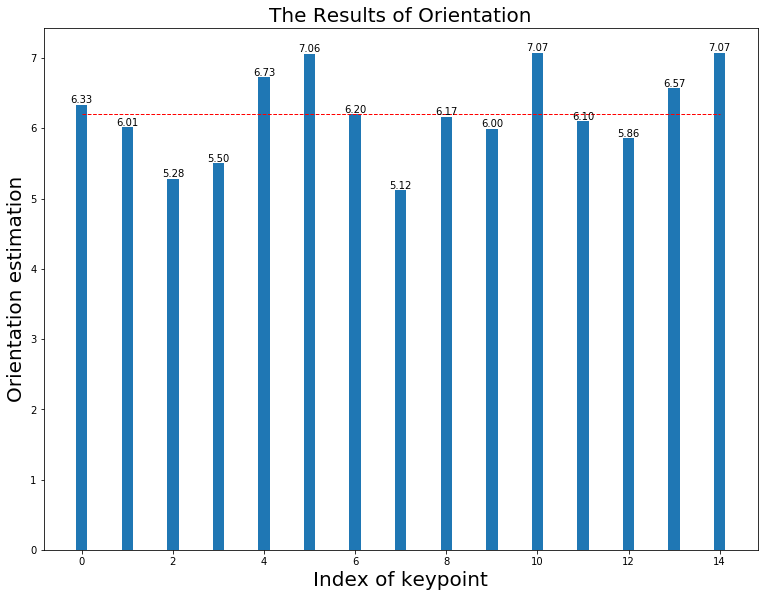

Final result: [     6.3314      6.0118      5.2843      5.5017      6.7254      7.0612      6.1958      5.1151      6.1655      5.9961      7.0736      6.0963      5.8559      6.5666      7.0739]
FD Rotate(6.1):mean(6.204), median(6.204) in 0.101
The HoG estimation when (6.1) is  6


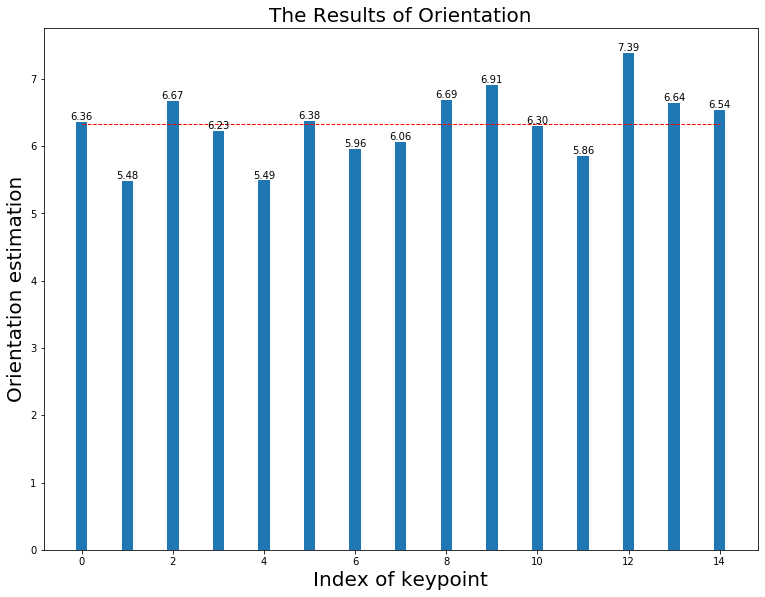

Final result: [     6.3602      5.4825      6.6696      6.2317      5.4898      6.3758      5.9568       6.062      6.6895      6.9121      6.3021      5.8589      7.3869      6.6375      6.5356]
FD Rotate(6.2):mean(6.330), median(6.330) in 0.102
The HoG estimation when (6.2) is  6


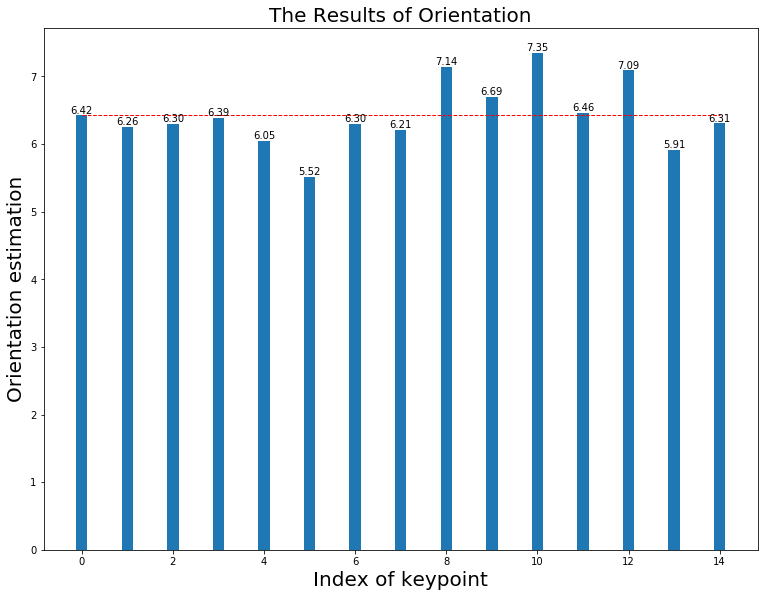

Final result: [     6.4231      6.2574      6.2968      6.3884      6.0497      5.5188      6.3011      6.2114      7.1448      6.6923      7.3489      6.4589      7.0899       5.911      6.3059]
FD Rotate(6.3):mean(6.427), median(6.427) in 0.101
The HoG estimation when (6.3) is  6


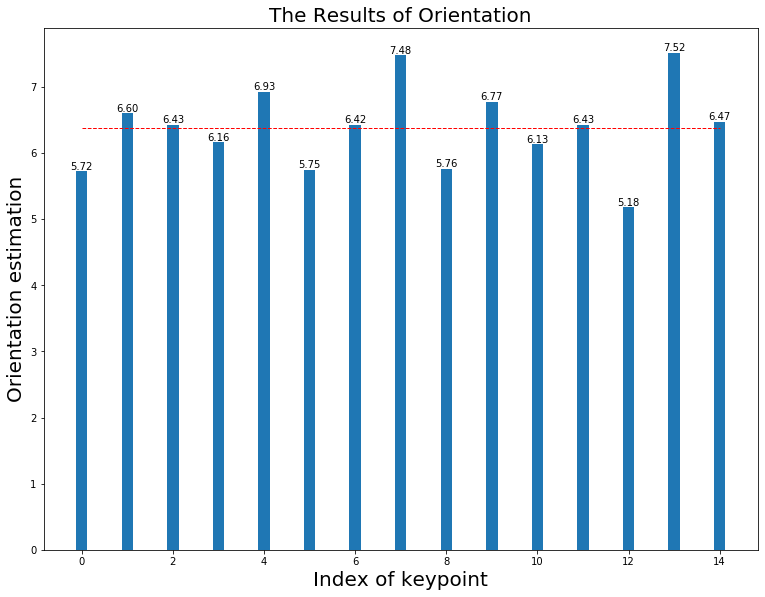

Final result: [     5.7212      6.5973      6.4286      6.1614      6.9271      5.7467      6.4214      7.4781      5.7555      6.7698      6.1298      6.4274      5.1784      7.5152      6.4742]
FD Rotate(6.4):mean(6.382), median(6.382) in 0.103
The HoG estimation when (6.4) is  6


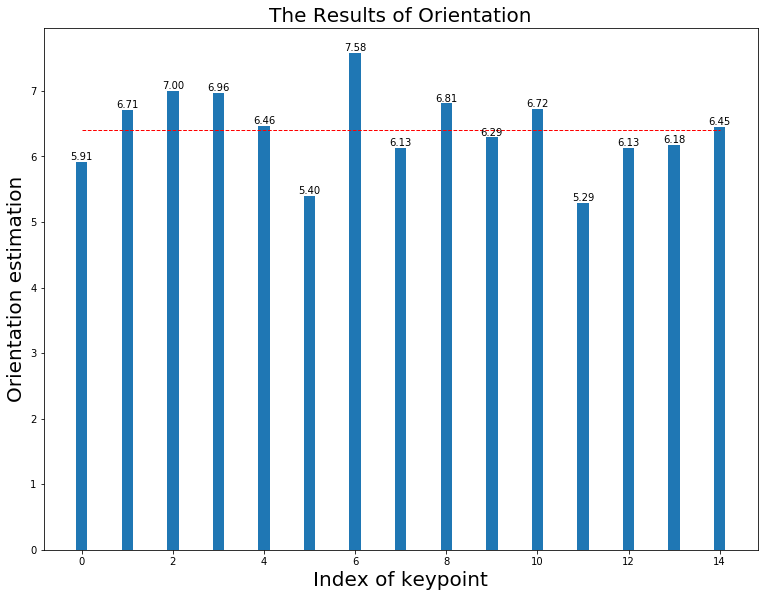

Final result: [     5.9145      6.7147      6.9954      6.9645      6.4633      5.3969      7.5803      6.1279      6.8106        6.29      6.7229      5.2868       6.131      6.1752      6.4492]
FD Rotate(6.5):mean(6.402), median(6.402) in 0.106
The HoG estimation when (6.5) is  7


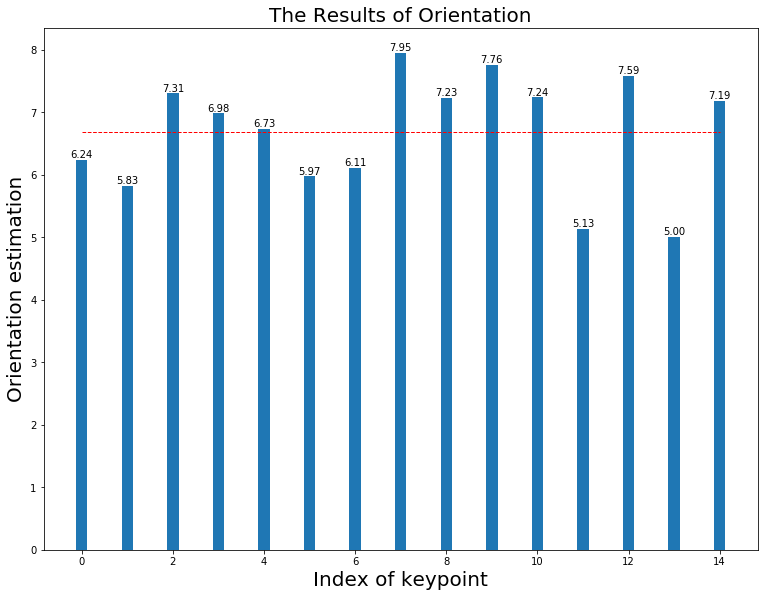

Final result: [     6.2351      5.8294      7.3062      6.9845      6.7339      5.9744      6.1094      7.9538      7.2329      7.7615      7.2391      5.1318      7.5864      5.0024      7.1874]
FD Rotate(6.6):mean(6.685), median(6.685) in 0.100
The HoG estimation when (6.6) is  7


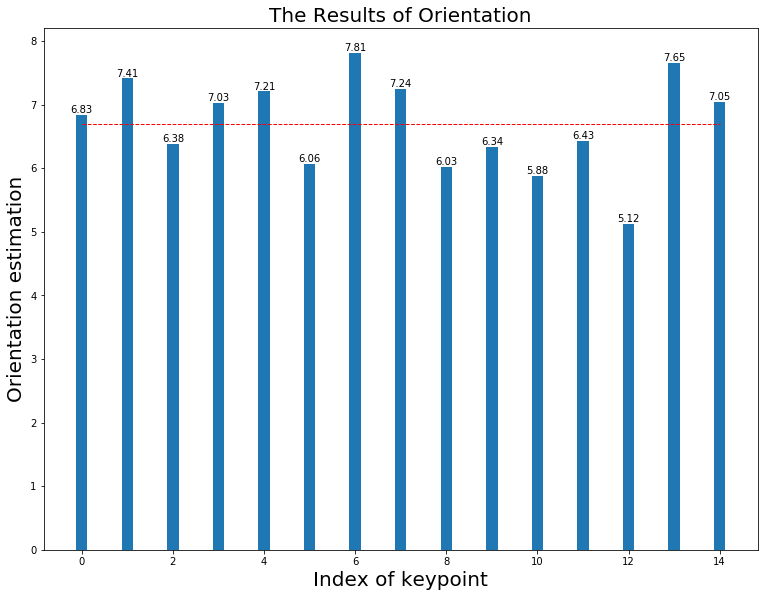

Final result: [     6.8348      7.4106      6.3783       7.029      7.2081      6.0637      7.8138      7.2419      6.0253      6.3385      5.8784      6.4345      5.1226      7.6547      7.0476]
FD Rotate(6.7):mean(6.699), median(6.699) in 0.098
The HoG estimation when (6.7) is  7


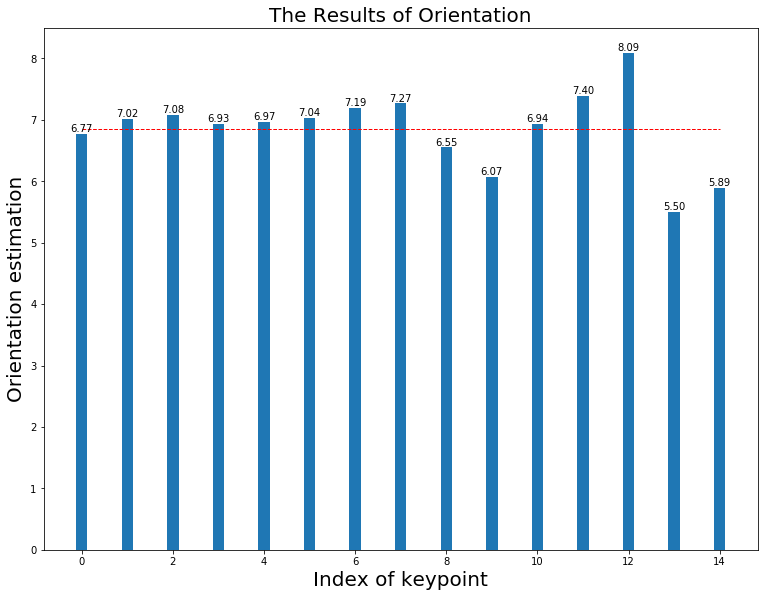

Final result: [     6.7693      7.0171      7.0813      6.9318      6.9721      7.0385      7.1905      7.2673       6.554      6.0749      6.9368      7.3963      8.0926      5.4964      5.8926]
FD Rotate(6.8):mean(6.847), median(6.847) in 0.096
The HoG estimation when (6.8) is  7


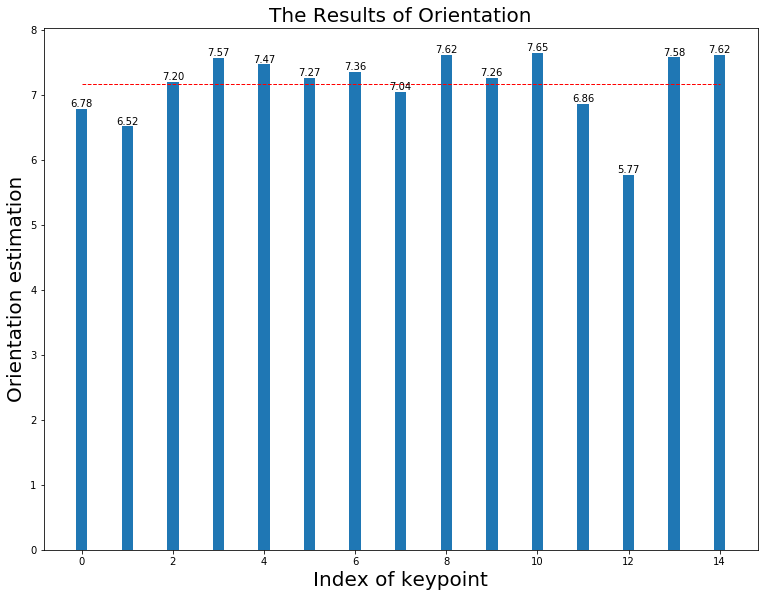

Final result: [     6.7827      6.5174      7.1987      7.5708      7.4689      7.2669      7.3574      7.0442        7.62      7.2648       7.649      6.8611      5.7717      7.5768      7.6215]
FD Rotate(6.9):mean(7.171), median(7.171) in 0.102
The HoG estimation when (6.9) is  7


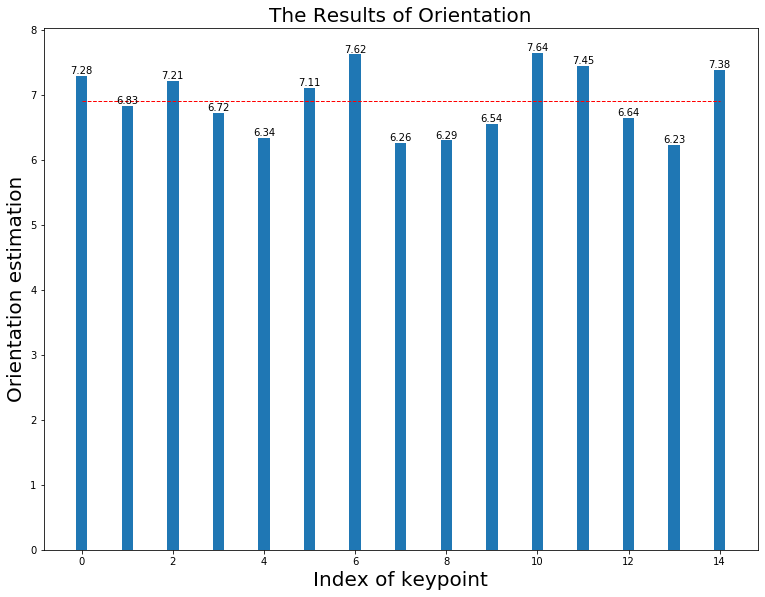

Final result: [     7.2832      6.8257      7.2105      6.7158      6.3379      7.1089      7.6178      6.2557      6.2948      6.5449      7.6436      7.4468      6.6375      6.2259      7.3756]
FD Rotate(7.0):mean(6.902), median(6.902) in 0.101
The HoG estimation when (7.0) is  7


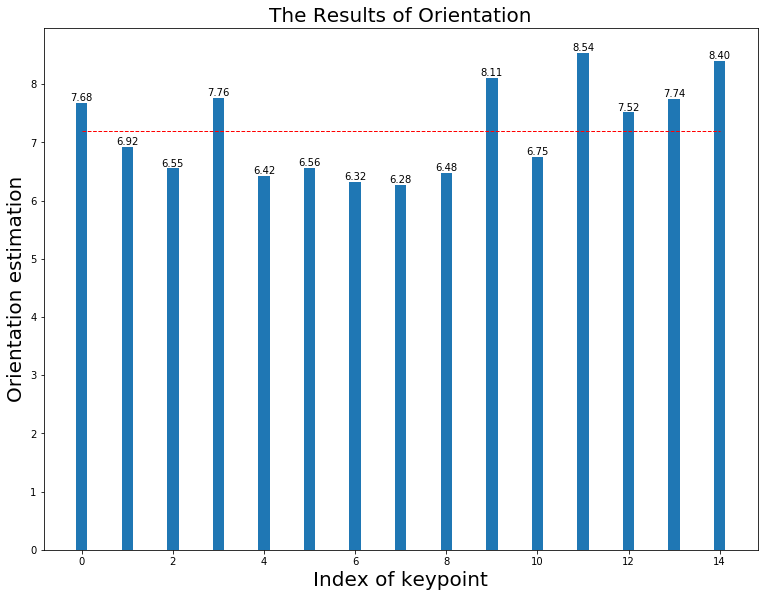

Final result: [     7.6789       6.922      6.5509      7.7633      6.4175      6.5641      6.3206      6.2751      6.4787      8.1089      6.7545      8.5376      7.5159      7.7414      8.4006]
FD Rotate(7.1):mean(7.202), median(7.202) in 0.112
The HoG estimation when (7.1) is  7


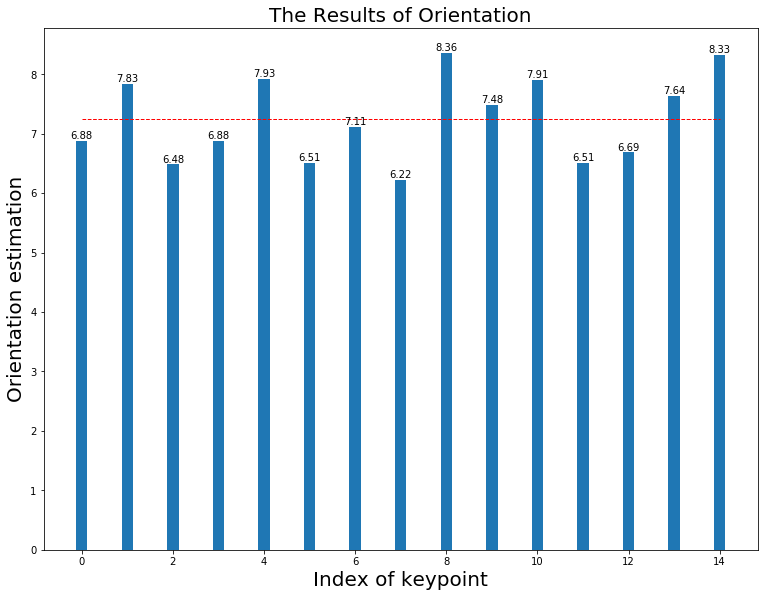

Final result: [     6.8834       7.832      6.4822      6.8765      7.9274      6.5095      7.1127      6.2222       8.361       7.482      7.9086      6.5082      6.6858      7.6355      8.3289]
FD Rotate(7.2):mean(7.250), median(7.250) in 0.118
The HoG estimation when (7.2) is  7


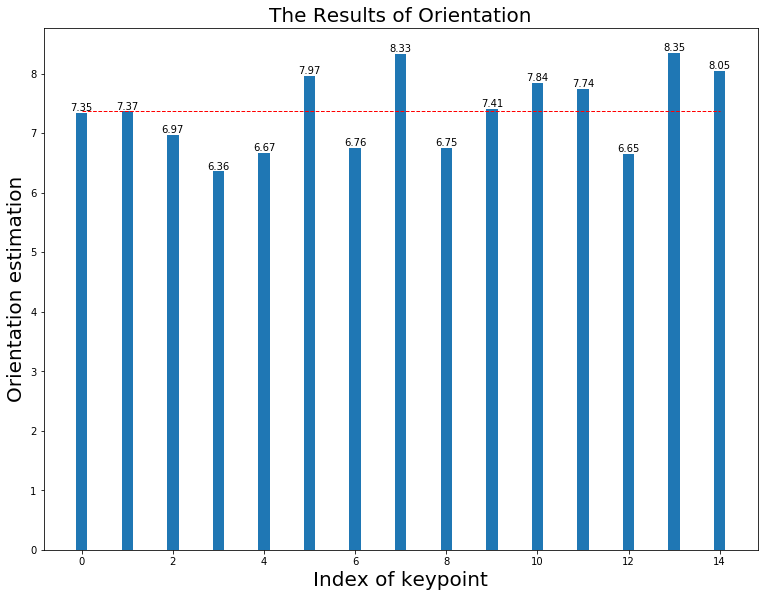

Final result: [     7.3461      7.3652      6.9742      6.3568      6.6703      7.9667      6.7571      8.3321      6.7531      7.4074      7.8424      7.7398      6.6512      8.3511      8.0472]
FD Rotate(7.3):mean(7.371), median(7.371) in 0.102
The HoG estimation when (7.3) is  7


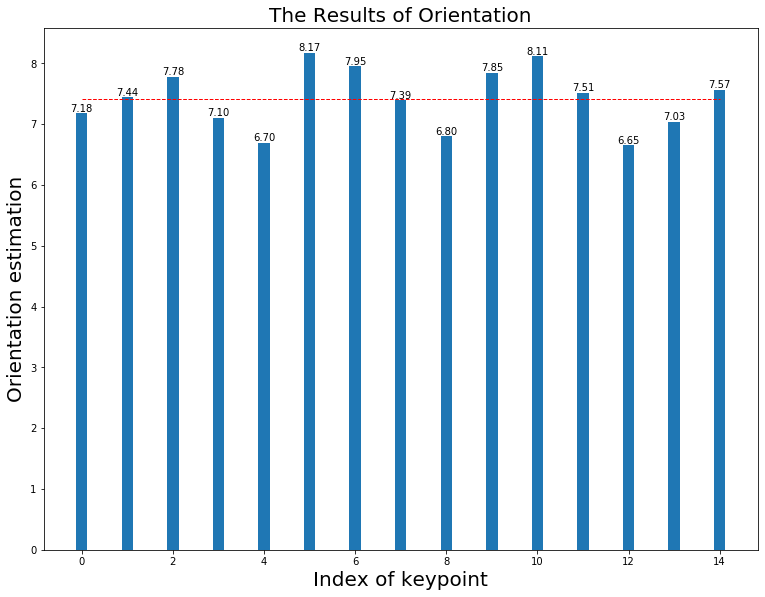

Final result: [     7.1763      7.4375      7.7776      7.1006      6.6968      8.1725      7.9507      7.3885      6.7999      7.8453      8.1148      7.5102      6.6517      7.0327      7.5679]
FD Rotate(7.4):mean(7.415), median(7.415) in 0.105
The HoG estimation when (7.4) is  8


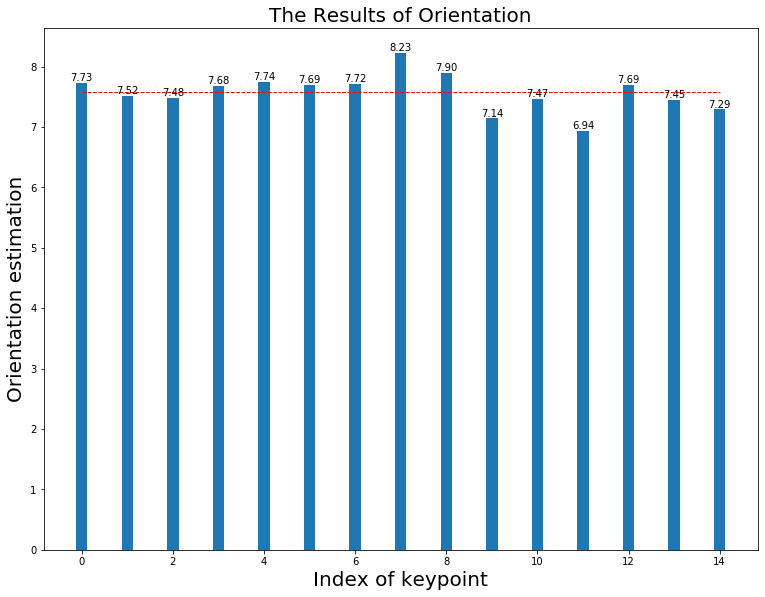

Final result: [      7.726      7.5164       7.481      7.6793      7.7405      7.6909      7.7193      8.2279      7.8955      7.1431      7.4685      6.9382      7.6943      7.4462      7.2898]
FD Rotate(7.5):mean(7.577), median(7.577) in 0.105
The HoG estimation when (7.5) is  8


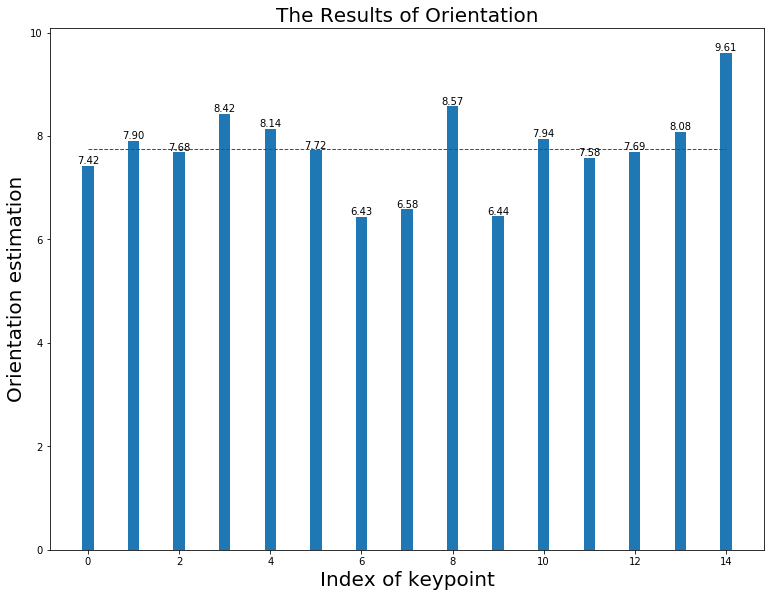

Final result: [     7.4217      7.8991      7.6832      8.4232      8.1373      7.7229      6.4305      6.5789      8.5708      6.4434      7.9437      7.5835      7.6935      8.0827       9.608]
FD Rotate(7.6):mean(7.748), median(7.748) in 0.111
The HoG estimation when (7.6) is  8


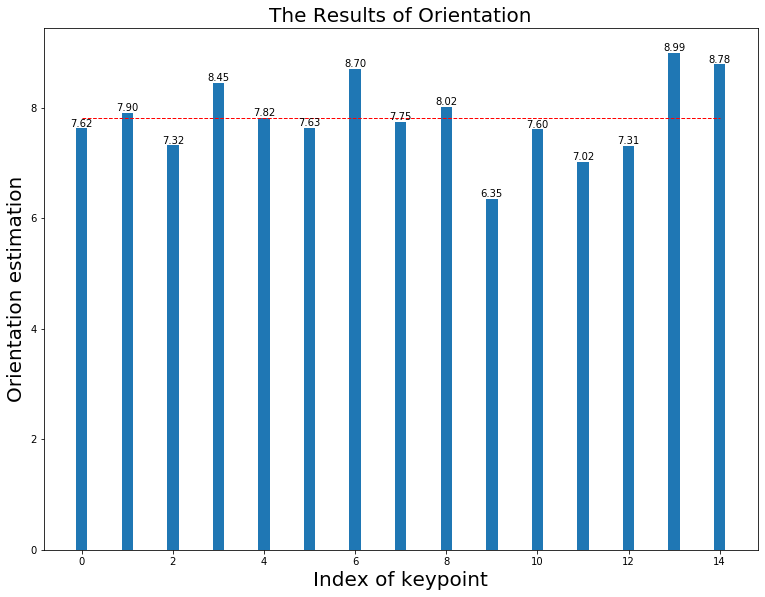

Final result: [     7.6235      7.8991      7.3171       8.451      7.8194      7.6346      8.6959      7.7465      8.0171      6.3488      7.6049      7.0162      7.3113      8.9897      8.7796]
FD Rotate(7.7):mean(7.817), median(7.817) in 0.105
The HoG estimation when (7.7) is  8


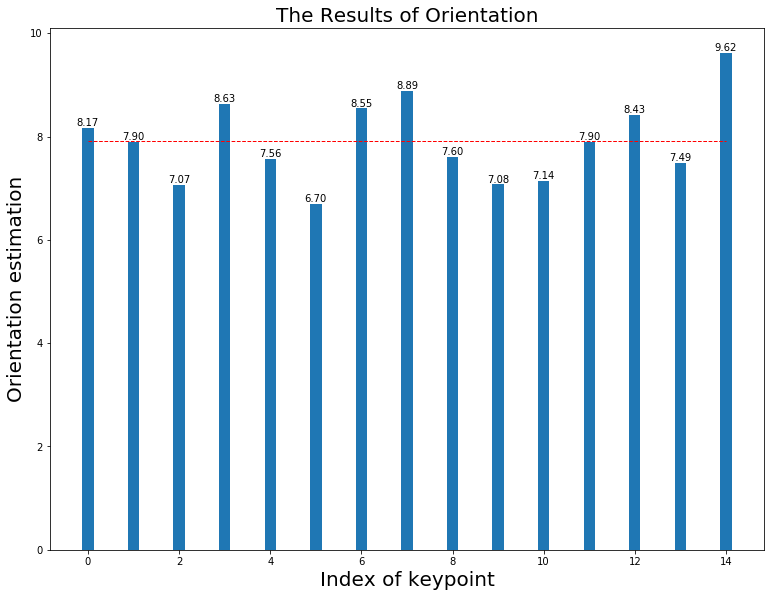

Final result: [     8.1664       7.903      7.0656      8.6254      7.5644      6.6959      8.5461      8.8883      7.6021      7.0759      7.1353      7.9023       8.426      7.4949      9.6206]
FD Rotate(7.8):mean(7.914), median(7.914) in 0.100
The HoG estimation when (7.8) is  8


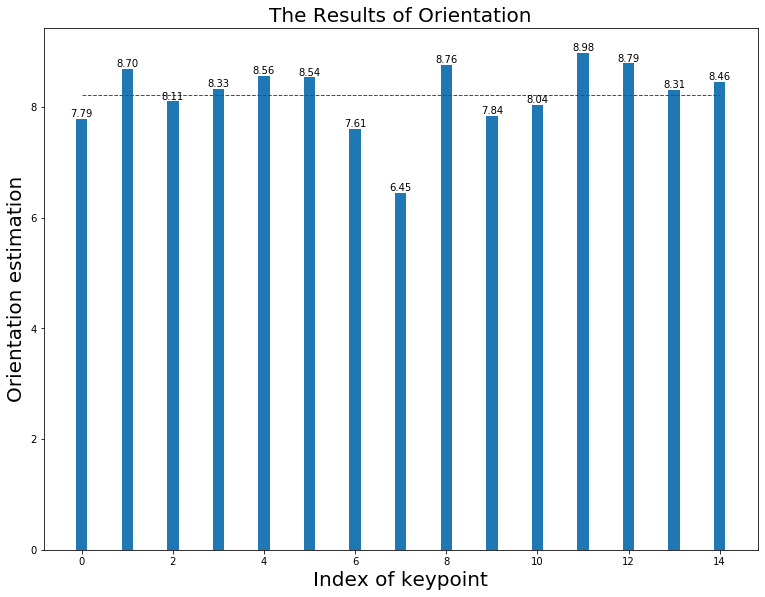

Final result: [     7.7862      8.6957      8.1069      8.3253      8.5594      8.5387      7.6064      6.4489      8.7615      7.8375      8.0387      8.9827      8.7911      8.3148      8.4603]
FD Rotate(7.9):mean(8.217), median(8.217) in 0.099
The HoG estimation when (7.9) is  8


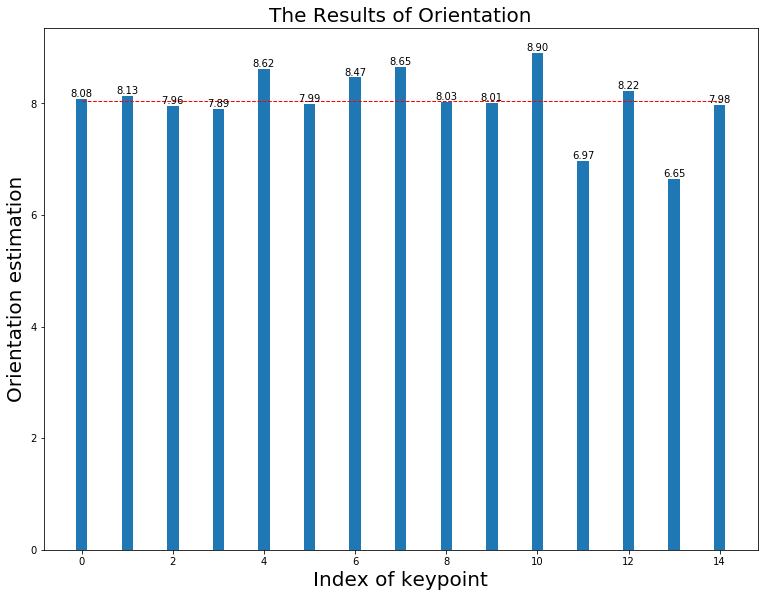

Final result: [     8.0824      8.1331      7.9603      7.8937      8.6197      7.9917       8.466      8.6481      8.0293      8.0112      8.9049      6.9698      8.2243      6.6484      7.9763]
FD Rotate(8.0):mean(8.037), median(8.037) in 0.105
The HoG estimation when (8.0) is  8


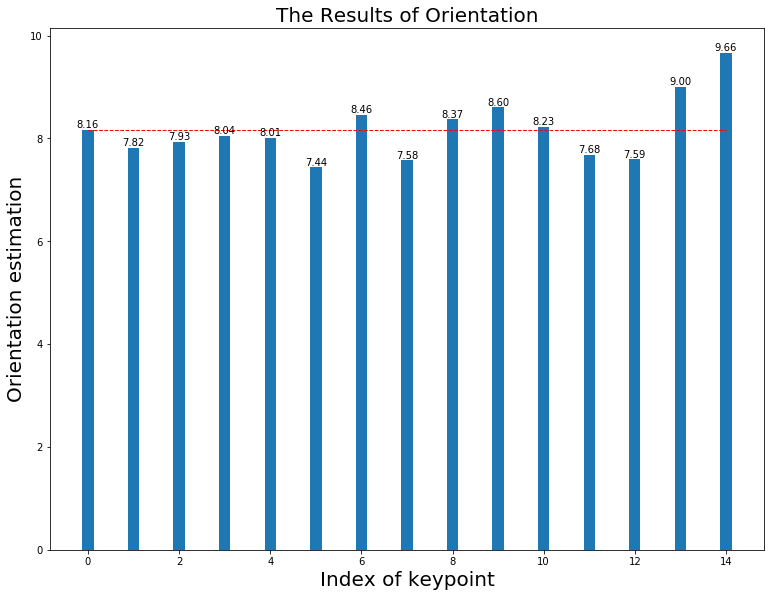

Final result: [     8.1636      7.8188      7.9306      8.0443      8.0079      7.4355      8.4597       7.575      8.3696       8.602      8.2303      7.6815      7.5916      9.0035      9.6649]
FD Rotate(8.1):mean(8.172), median(8.172) in 0.105
The HoG estimation when (8.1) is  8


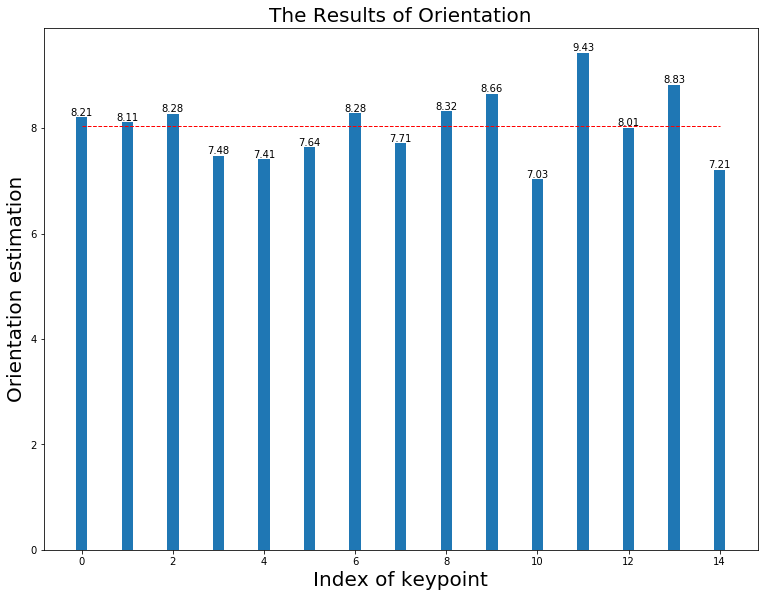

Final result: [     8.2068      8.1087      8.2787      7.4787      7.4069      7.6382      8.2815      7.7106      8.3188      8.6581      7.0292      9.4312      8.0077      8.8269       7.211]
FD Rotate(8.2):mean(8.040), median(8.040) in 0.107
The HoG estimation when (8.2) is  8


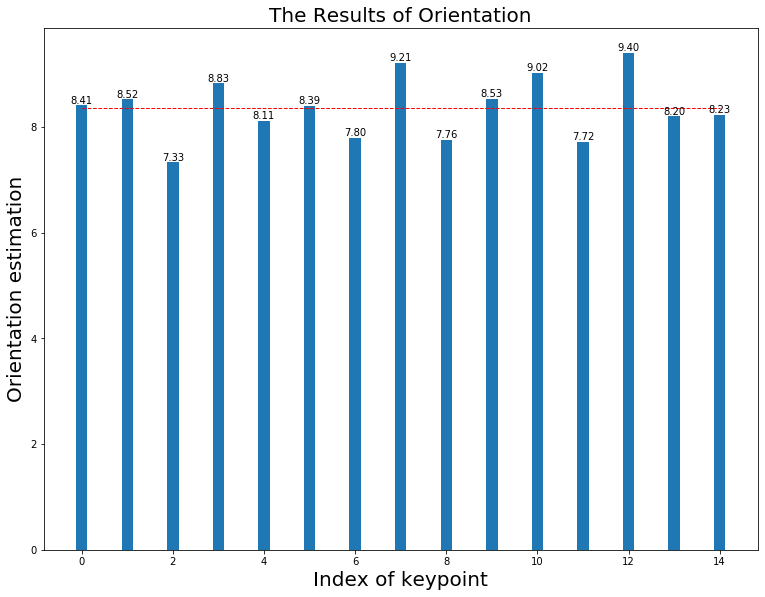

Final result: [     8.4094      8.5213      7.3293      8.8255      8.1121      8.3928      7.7973      9.2128       7.759      8.5345      9.0205      7.7238      9.4037      8.1991      8.2286]
FD Rotate(8.3):mean(8.365), median(8.365) in 0.105
The HoG estimation when (8.3) is  8


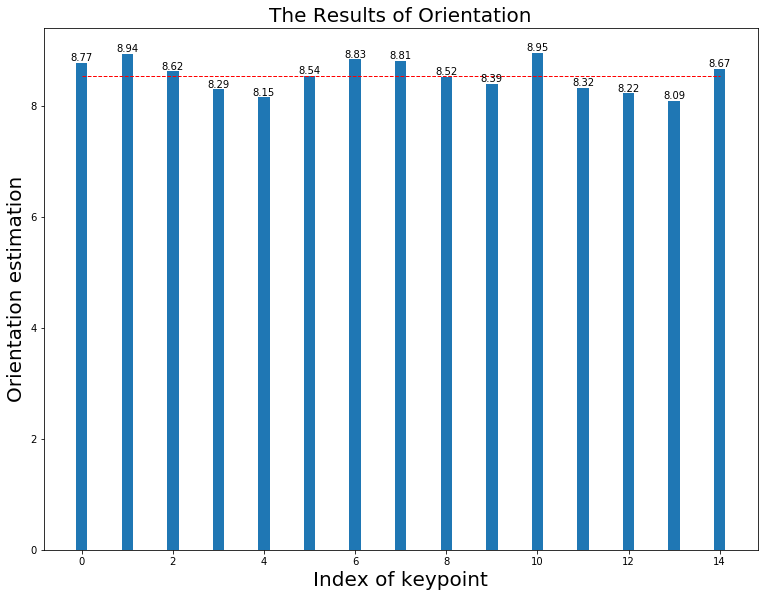

Final result: [     8.7694      8.9371      8.6185      8.2933      8.1509      8.5407      8.8318      8.8082      8.5178      8.3914      8.9521      8.3153      8.2216      8.0919      8.6689]
FD Rotate(8.4):mean(8.541), median(8.541) in 0.107
The HoG estimation when (8.4) is  9


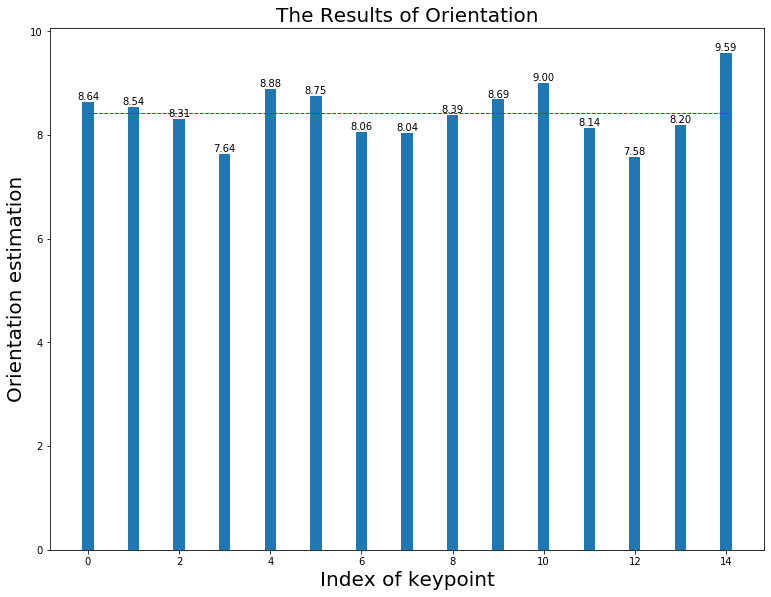

Final result: [     8.6358      8.5402      8.3103      7.6354      8.8846       8.752      8.0641      8.0356        8.39      8.6879      9.0029      8.1428      7.5831      8.1992      9.5871]
FD Rotate(8.5):mean(8.430), median(8.430) in 0.102
The HoG estimation when (8.5) is  9


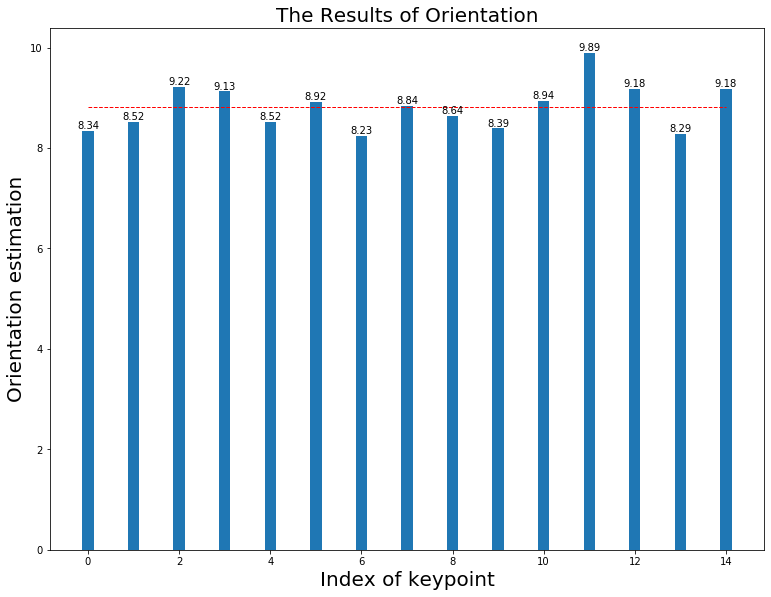

Final result: [     8.3395      8.5193      9.2185      9.1291      8.5191      8.9166      8.2336      8.8438      8.6398      8.3925      8.9415      9.8947      9.1797      8.2854      9.1824]
FD Rotate(8.6):mean(8.816), median(8.816) in 0.103
The HoG estimation when (8.6) is  9


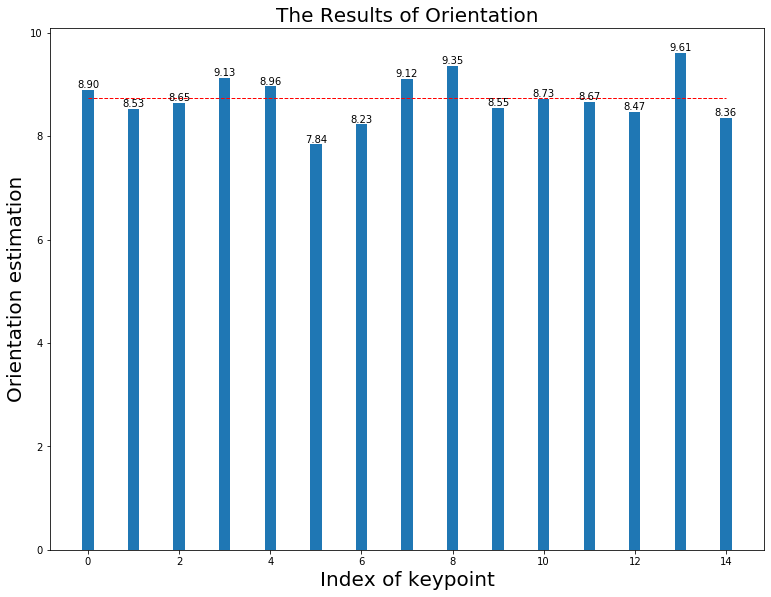

Final result: [     8.8994      8.5299       8.652      9.1265      8.9623       7.843      8.2298      9.1151      9.3542      8.5536      8.7292      8.6691      8.4661      9.6142      8.3616]
FD Rotate(8.7):mean(8.740), median(8.740) in 0.105
The HoG estimation when (8.7) is  9


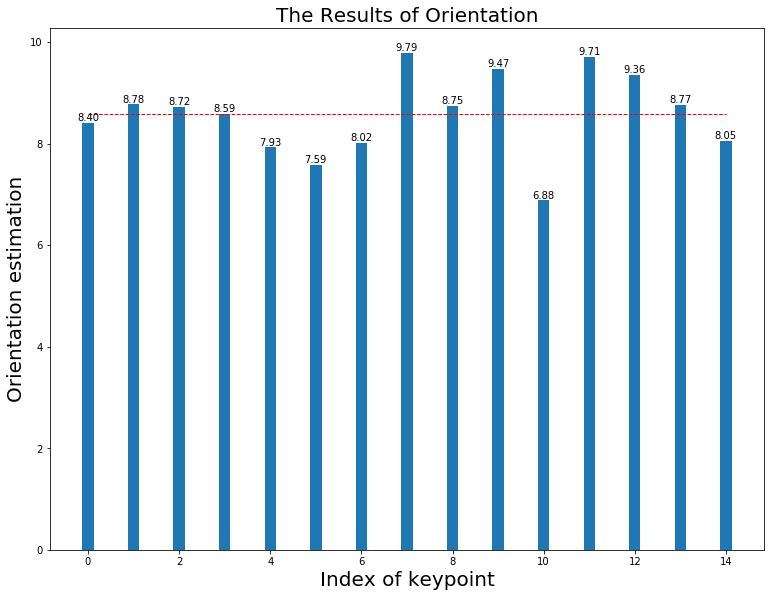

Final result: [     8.4045      8.7751      8.7241      8.5889      7.9301       7.589      8.0232      9.7912      8.7492      9.4676      6.8834      9.7139      9.3593      8.7691      8.0502]
FD Rotate(8.8):mean(8.588), median(8.588) in 0.116
The HoG estimation when (8.8) is  9


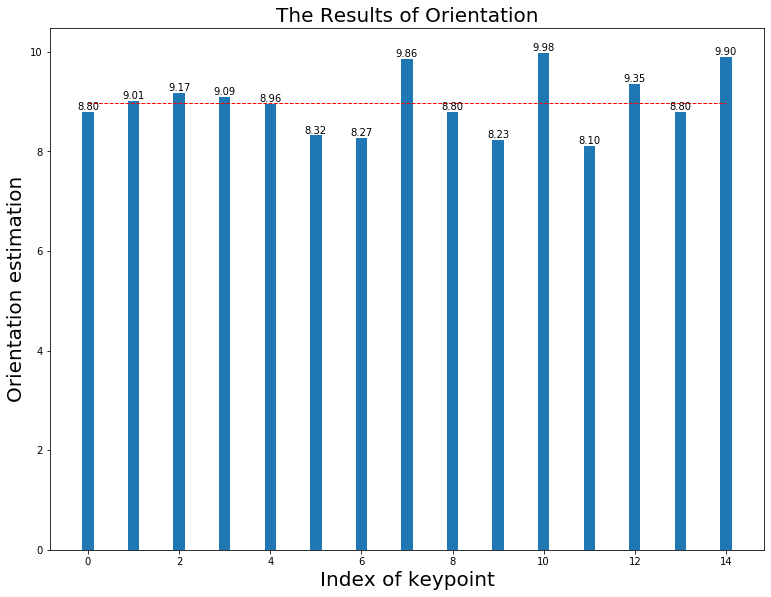

Final result: [     8.7986      9.0103      9.1684      9.0916      8.9553      8.3179      8.2659      9.8578      8.7968      8.2327      9.9777      8.1028       9.354      8.7983      9.9002]
FD Rotate(8.9):mean(8.975), median(8.975) in 0.109
The HoG estimation when (8.9) is  9


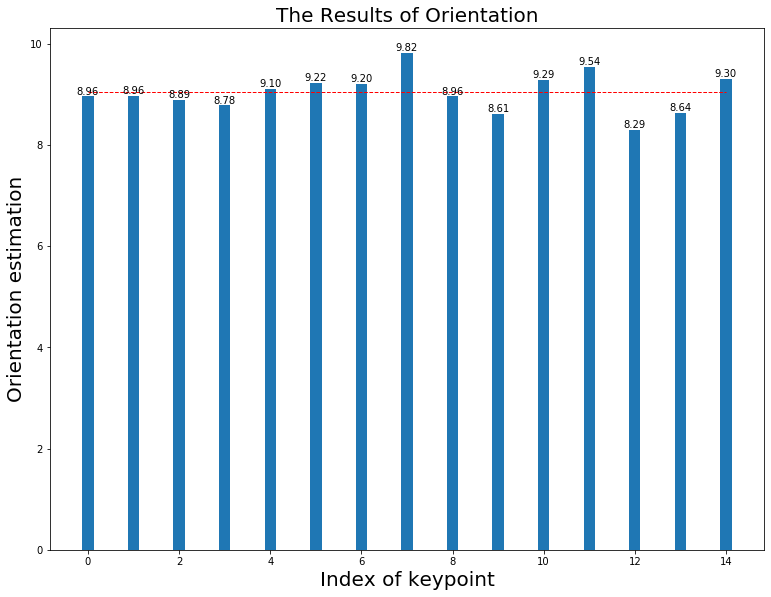

Final result: [      8.958       8.963      8.8861      8.7802      9.1003      9.2186      9.2025      9.8186      8.9558      8.6096      9.2894      9.5417       8.289      8.6386       9.303]
FD Rotate(9.0):mean(9.037), median(9.037) in 0.110
The HoG estimation when (9.0) is  9


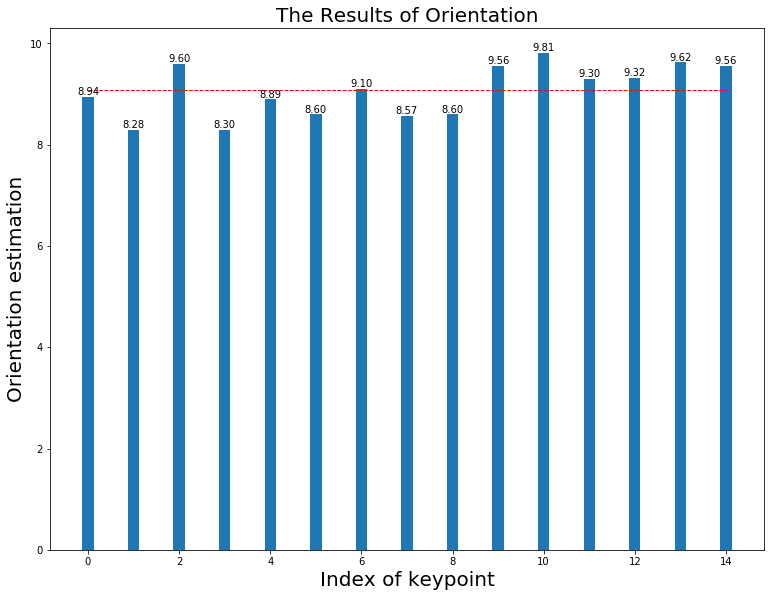

Final result: [     8.9404      8.2845      9.5977      8.2953      8.8939      8.5979      9.0992      8.5709      8.5975      9.5578      9.8132      9.3016      9.3207      9.6235      9.5603]
FD Rotate(9.1):mean(9.070), median(9.070) in 0.103
The HoG estimation when (9.1) is  9


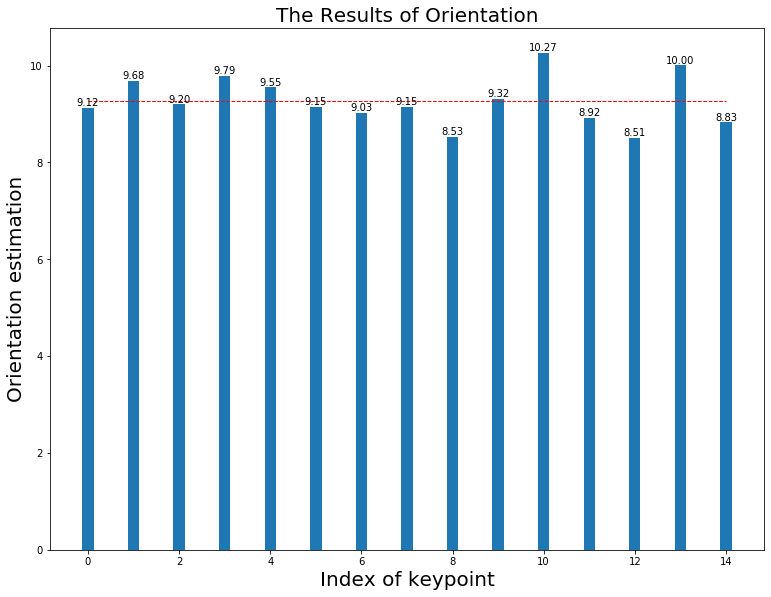

Final result: [     9.1227      9.6801      9.2015      9.7888      9.5499      9.1478      9.0294      9.1545      8.5292      9.3183      10.265      8.9165      8.5077      10.004      8.8295]
FD Rotate(9.2):mean(9.270), median(9.270) in 0.102
The HoG estimation when (9.2) is  9


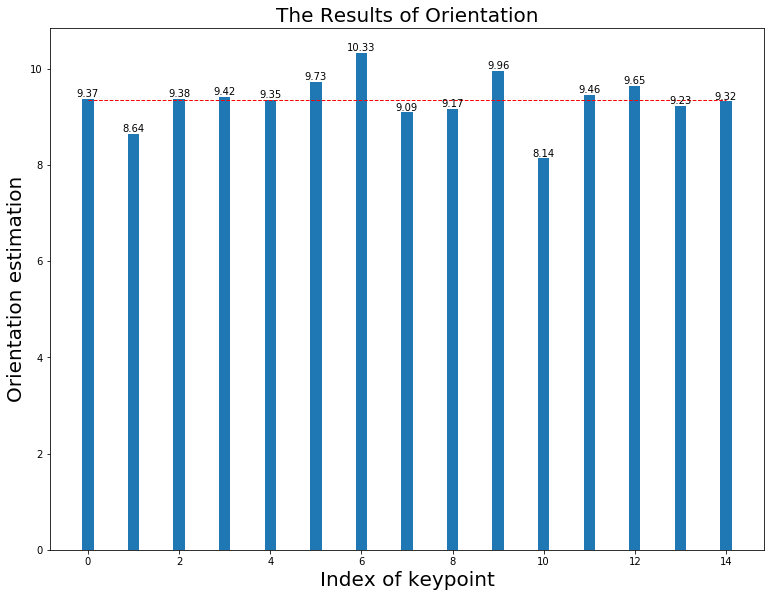

Final result: [     9.3669       8.645      9.3805      9.4218      9.3461      9.7294      10.331       9.092      9.1677       9.958      8.1376      9.4607       9.649      9.2254      9.3205]
FD Rotate(9.3):mean(9.349), median(9.349) in 0.112
The HoG estimation when (9.3) is  9


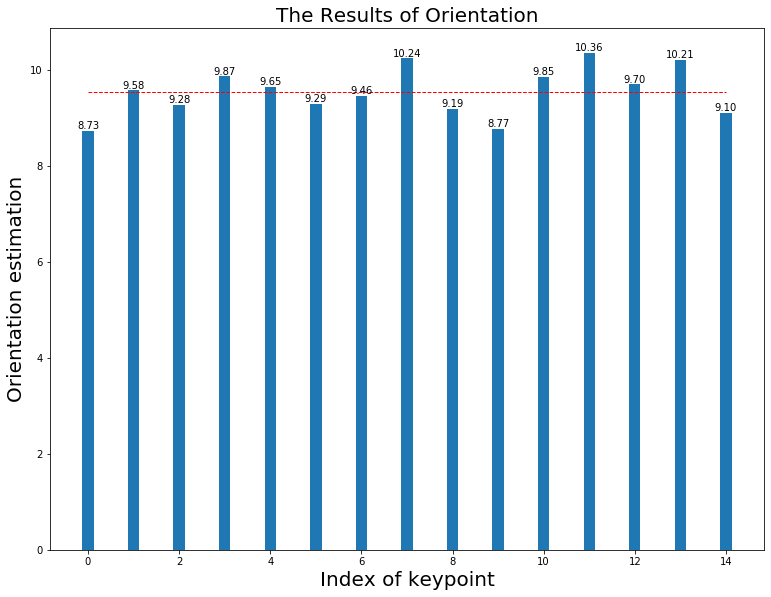

Final result: [     8.7321      9.5766      9.2808      9.8676      9.6544      9.2899      9.4638      10.241      9.1876      8.7726      9.8544       10.36      9.7043      10.207      9.1025]
FD Rotate(9.4):mean(9.553), median(9.553) in 0.106
The HoG estimation when (9.4) is  9


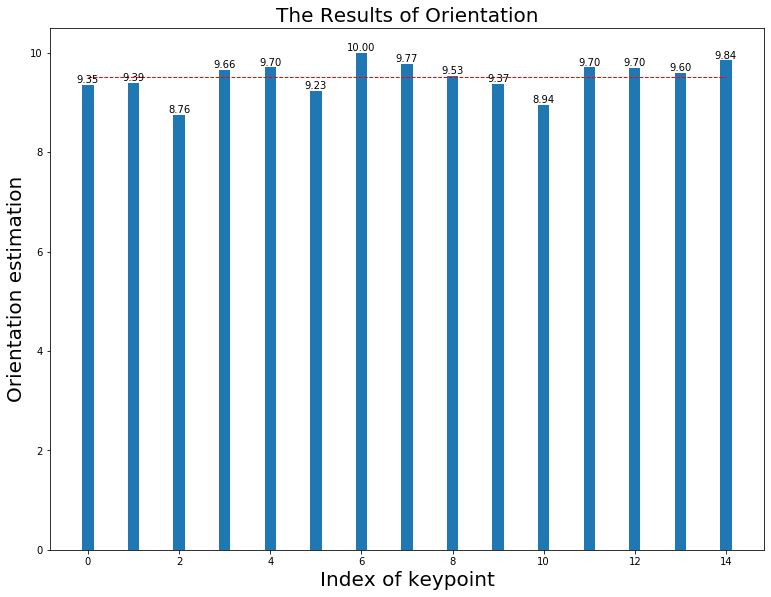

Final result: [     9.3517      9.3874      8.7561      9.6611      9.7029      9.2341      9.9979      9.7721      9.5304      9.3699      8.9433      9.7047      9.6986      9.5957      9.8445]
FD Rotate(9.5):mean(9.503), median(9.503) in 0.104
The HoG estimation when (9.5) is 10


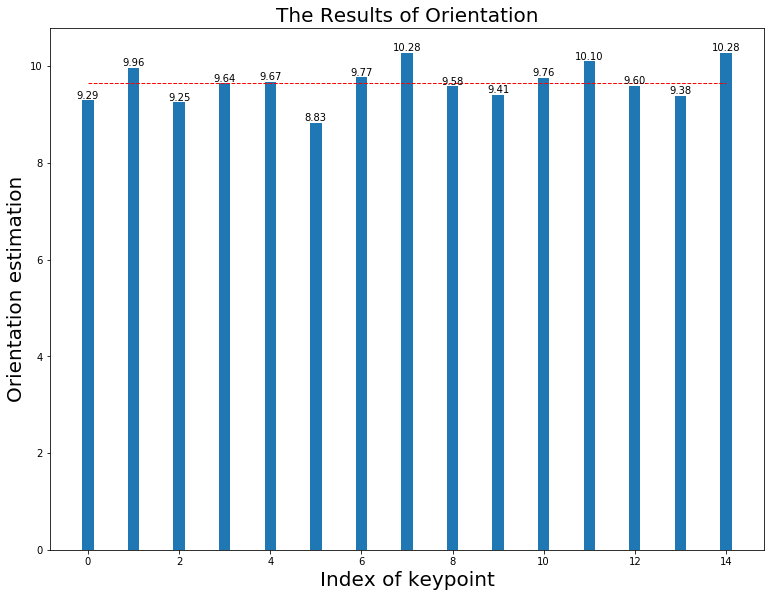

Final result: [     9.2927      9.9589      9.2518      9.6432      9.6691      8.8264       9.769      10.275       9.582      9.4078      9.7639      10.097      9.5988      9.3813      10.277]
FD Rotate(9.6):mean(9.653), median(9.653) in 0.105
The HoG estimation when (9.6) is 10


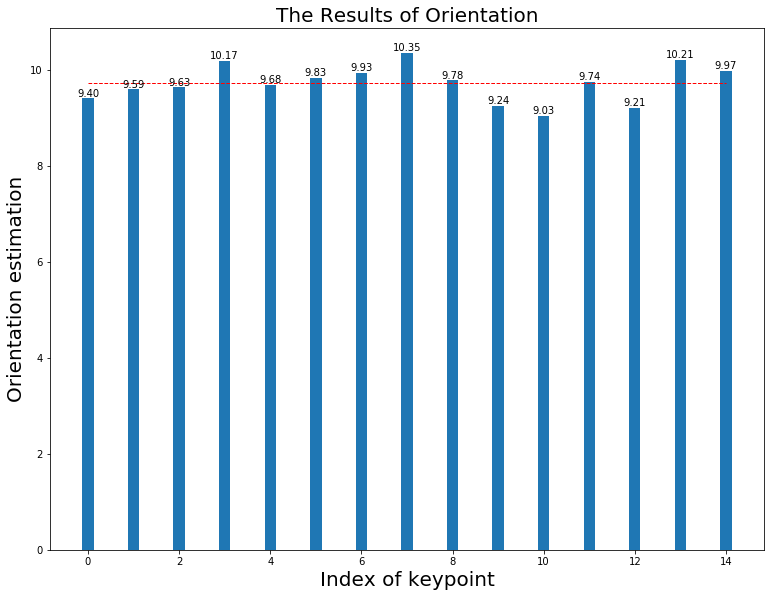

Final result: [     9.4014      9.5863      9.6274      10.175      9.6833      9.8285      9.9299      10.349      9.7753      9.2412       9.033      9.7408       9.206      10.208      9.9671]
FD Rotate(9.7):mean(9.717), median(9.717) in 0.108
The HoG estimation when (9.7) is 10


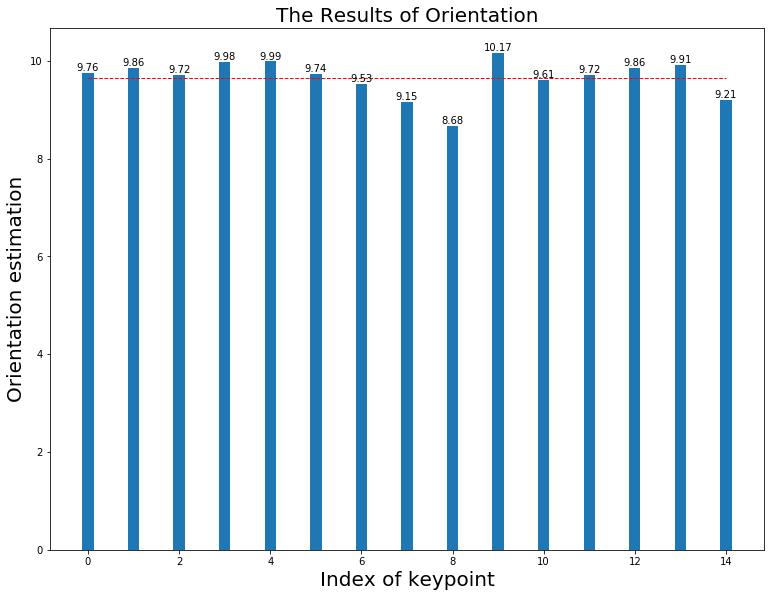

Final result: [     9.7599      9.8553       9.721      9.9787      9.9886      9.7417      9.5309      9.1542      8.6775      10.165      9.6061      9.7193      9.8636      9.9144        9.21]
FD Rotate(9.8):mean(9.659), median(9.659) in 0.109
The HoG estimation when (9.8) is 10


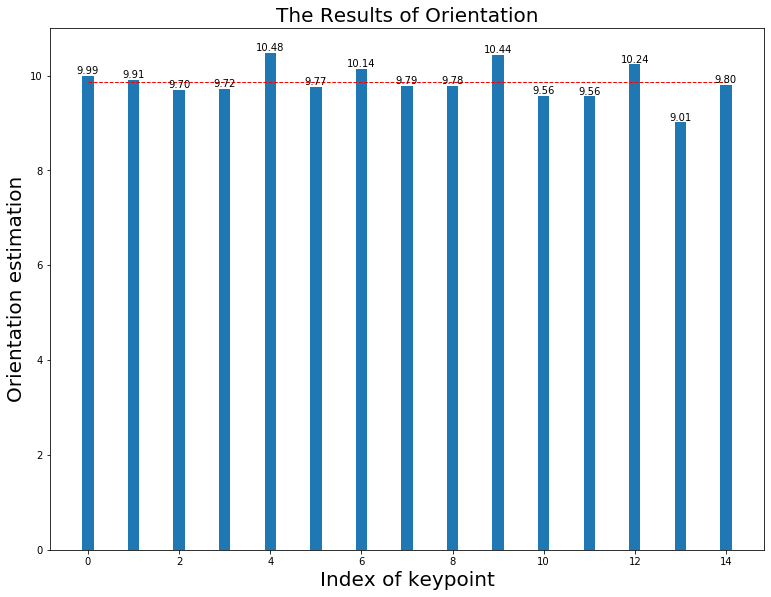

Final result: [     9.9881      9.9136      9.6985      9.7238      10.479      9.7674      10.141      9.7883      9.7758      10.435      9.5645      9.5594      10.236      9.0124      9.8003]
FD Rotate(9.9):mean(9.859), median(9.859) in 0.107
The HoG estimation when (9.9) is 10


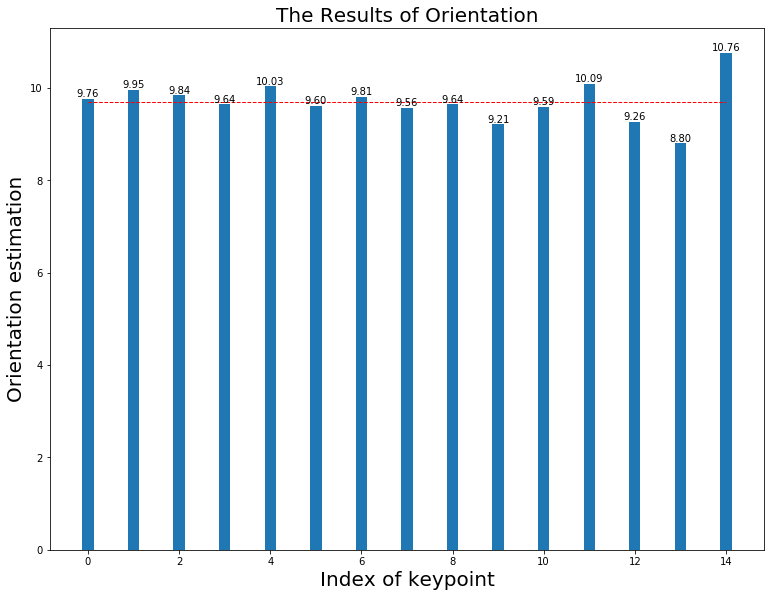

Final result: [     9.7607      9.9521      9.8415      9.6422      10.032      9.6043      9.8077      9.5633       9.644      9.2112      9.5884      10.089      9.2586      8.7973      10.761]
FD Rotate(10.0):mean(9.704), median(9.704) in 0.098
The HoG estimation when (10.0) is 10


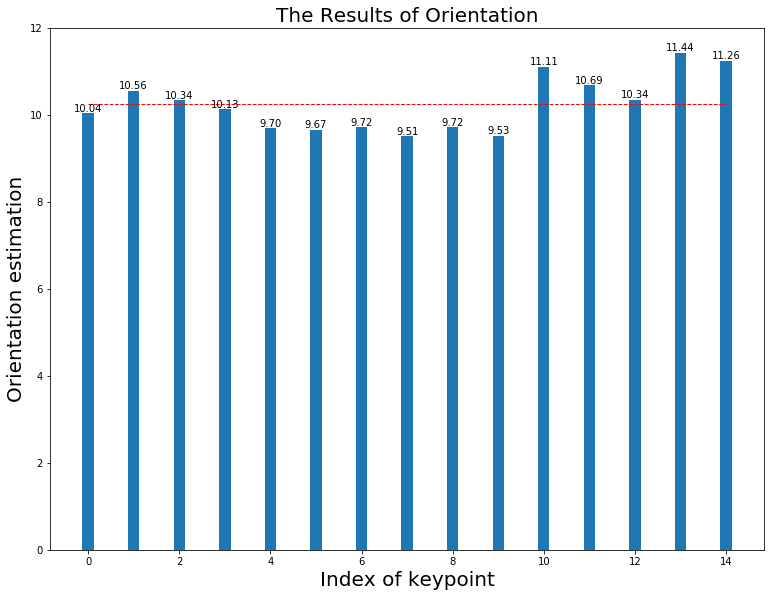

Final result: [     10.042      10.557      10.341      10.134      9.6989      9.6686       9.722      9.5116      9.7167      9.5267      11.115      10.686      10.344      11.435      11.257]
FD Rotate(10.1):mean(10.250), median(10.250) in 0.100
The HoG estimation when (10.1) is 10


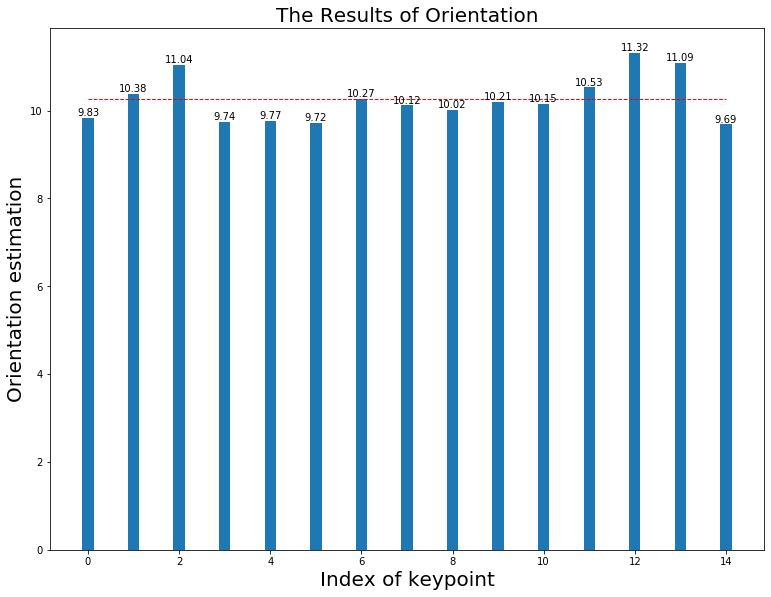

Final result: [     9.8328      10.377      11.043      9.7405      9.7704      9.7199       10.27      10.121       10.02      10.206      10.152       10.53      11.317      11.086      9.6864]
FD Rotate(10.2):mean(10.258), median(10.258) in 0.102
The HoG estimation when (10.2) is 10


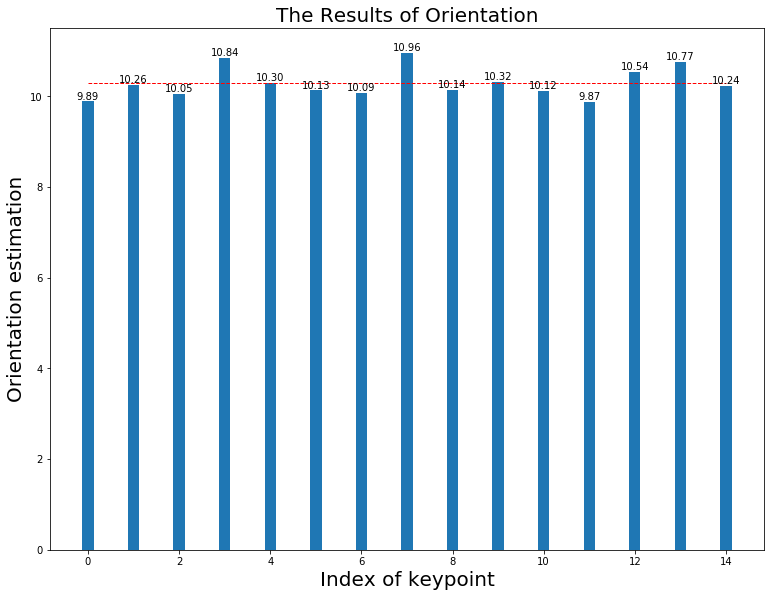

Final result: [     9.8915      10.258      10.052      10.842      10.298      10.133      10.085      10.961      10.136      10.322      10.121      9.8739      10.544      10.769      10.236]
FD Rotate(10.3):mean(10.302), median(10.302) in 0.103
The HoG estimation when (10.3) is 10


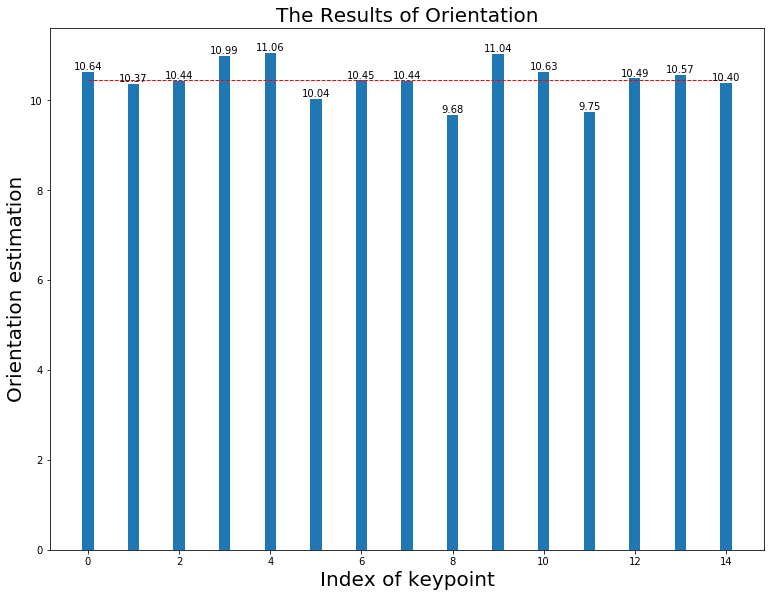

Final result: [     10.642      10.373      10.443      10.988       11.06      10.037      10.446      10.437      9.6784      11.037      10.632      9.7452      10.488      10.567      10.397]
FD Rotate(10.4):mean(10.465), median(10.465) in 0.104
The HoG estimation when (10.4) is 11


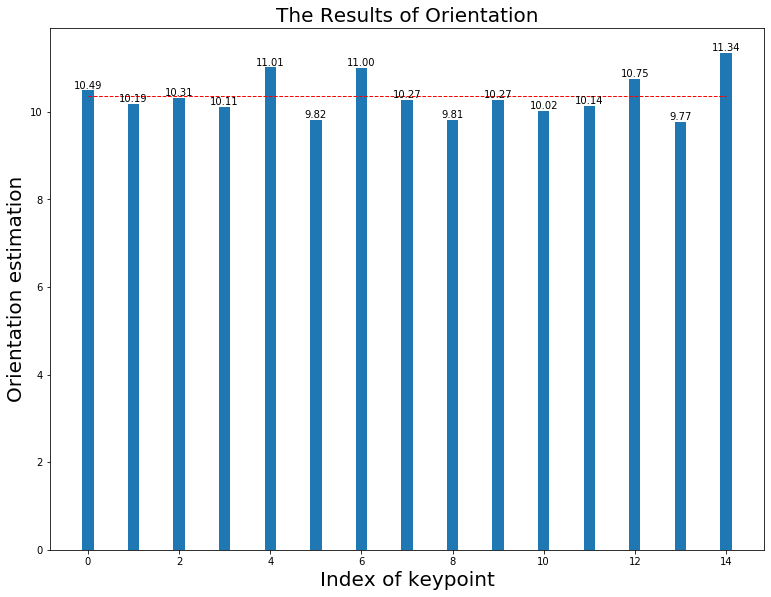

Final result: [     10.487      10.186      10.309       10.11      11.009      9.8203      11.001       10.27      9.8065       10.27      10.021      10.137      10.755      9.7709      11.344]
FD Rotate(10.5):mean(10.353), median(10.353) in 0.102
The HoG estimation when (10.5) is 10


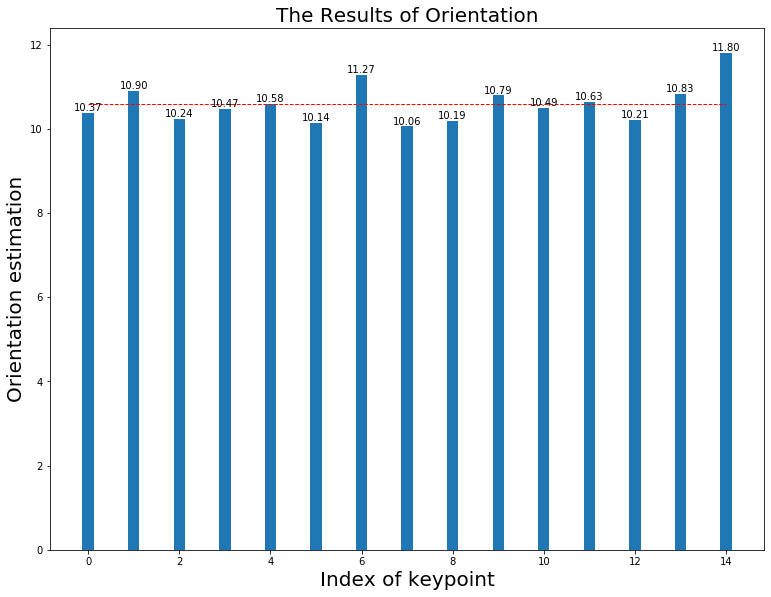

Final result: [     10.369      10.903      10.242      10.466      10.584      10.137      11.275      10.056       10.19      10.791      10.488      10.634      10.206      10.829      11.803]
FD Rotate(10.6):mean(10.598), median(10.598) in 0.104
The HoG estimation when (10.6) is 11


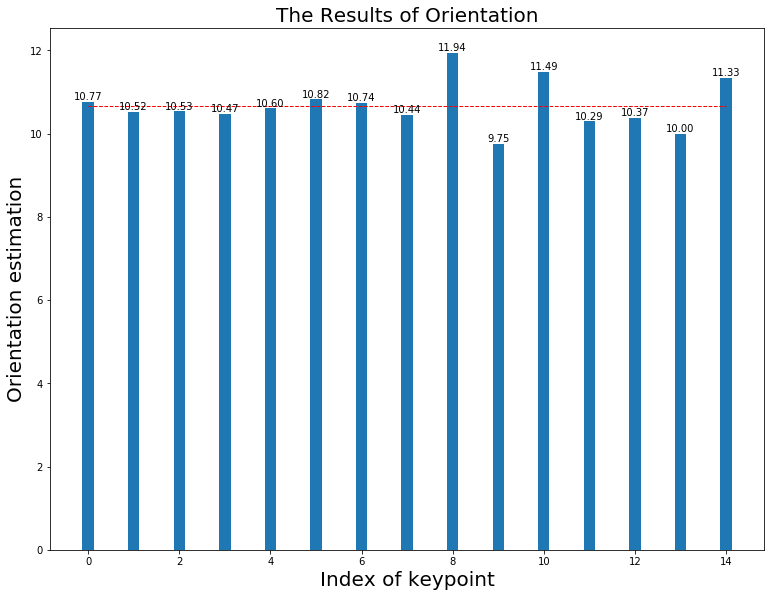

Final result: [     10.769      10.517      10.533      10.469      10.605      10.823      10.737      10.443      11.941      9.7484       11.49      10.292      10.373      9.9976      11.334]
FD Rotate(10.7):mean(10.672), median(10.672) in 0.104
The HoG estimation when (10.7) is 11


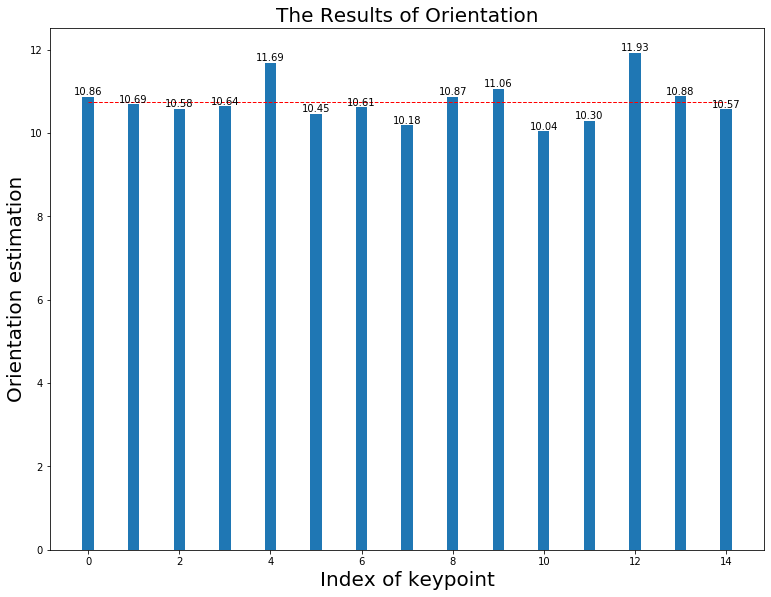

Final result: [     10.865       10.69      10.585      10.639       11.69      10.453      10.614      10.183      10.866       11.06      10.041      10.299      11.926      10.879       10.57]
FD Rotate(10.8):mean(10.757), median(10.757) in 0.104
The HoG estimation when (10.8) is 11


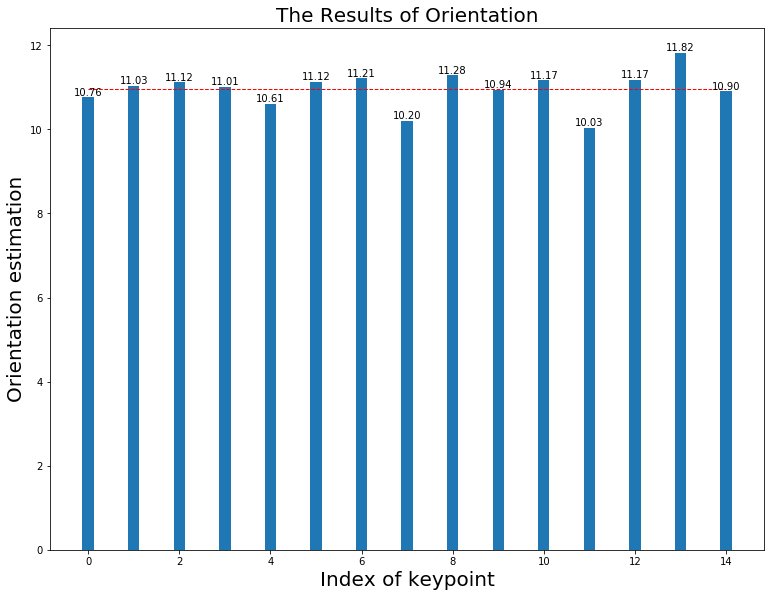

Final result: [      10.76      11.028      11.119      11.012      10.614      11.122      11.211      10.204      11.283      10.943      11.167      10.027      11.174      11.821      10.904]
FD Rotate(10.9):mean(10.959), median(10.959) in 0.106
The HoG estimation when (10.9) is 11


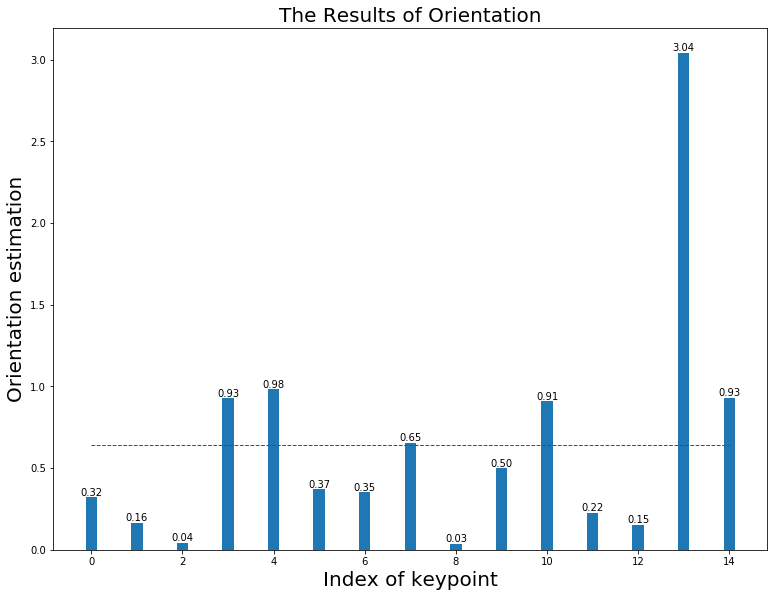

Final result: [    0.32072     0.16457    0.042694     0.92761     0.98158     0.36945     0.35223     0.65402    0.034241      0.4987     0.90826     0.22467     0.15311      3.0423      0.9278]
FD Rotate(1.0):mean(0.640), median(0.469) in 0.010
The HoG estimation when (1.0) is  1


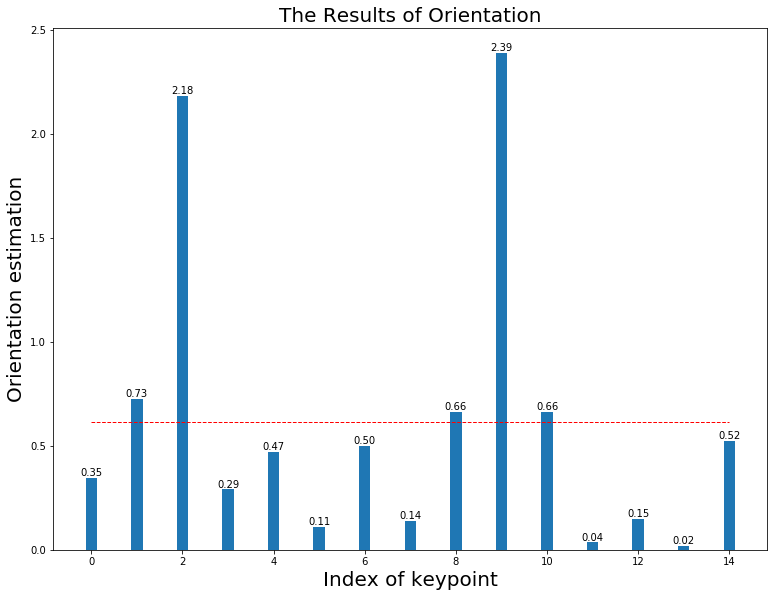

Final result: [    0.34673      0.7263      2.1831     0.29054     0.47104      0.1116     0.50075     0.13748     0.66439        2.39     0.66473    0.035202     0.14746     0.01799     0.52345]
FD Rotate(1.1):mean(0.614), median(0.614) in 0.011
The HoG estimation when (1.1) is  1


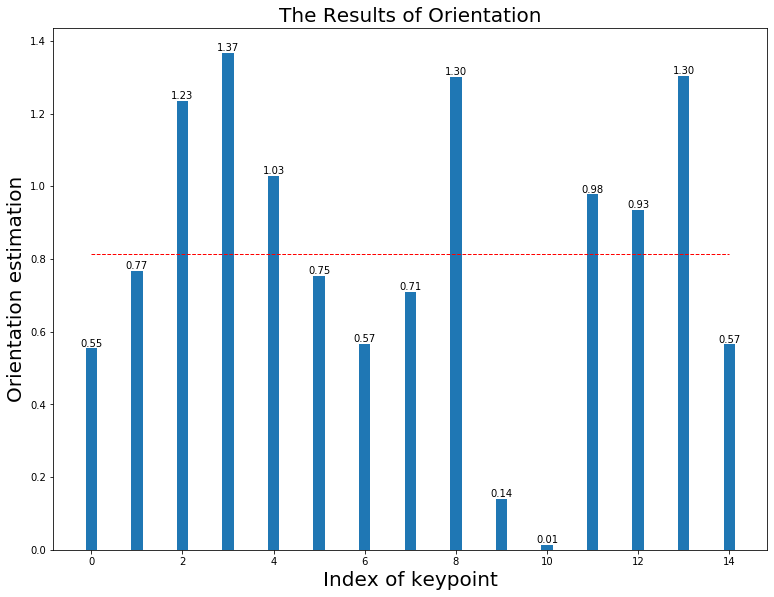

Final result: [     0.5543     0.76636      1.2342       1.367      1.0276     0.75332     0.56613     0.70934      1.3018     0.14072    0.013336     0.97754     0.93423      1.3035     0.56525]
FD Rotate(1.2):mean(0.814), median(0.814) in 0.011
The HoG estimation when (1.2) is  1


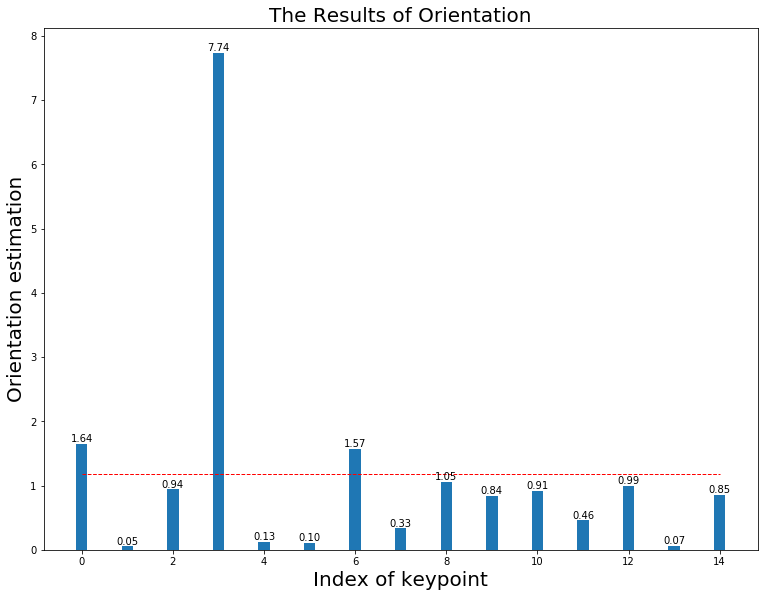

Final result: [     1.6448    0.053379     0.93921      7.7363     0.12578     0.10475      1.5666      0.3345      1.0545     0.83649     0.91206     0.45761     0.99339    0.065977     0.84931]
FD Rotate(1.3):mean(1.178), median(0.710) in 0.011
The HoG estimation when (1.3) is  1


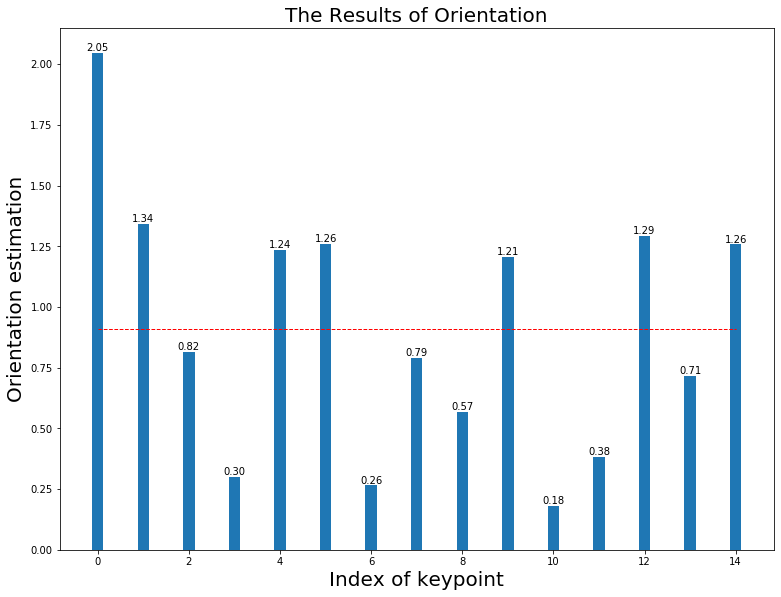

Final result: [     2.0471      1.3412     0.81586     0.30103      1.2351      1.2589     0.26489     0.79008     0.56775      1.2059     0.18152     0.38186      1.2917     0.71495      1.2583]
FD Rotate(1.4):mean(0.910), median(0.910) in 0.011
The HoG estimation when (1.4) is  2


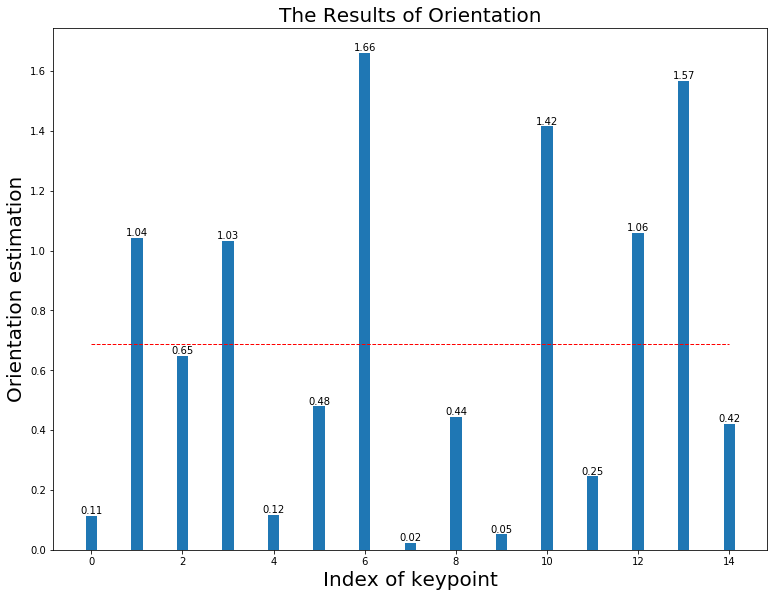

Final result: [    0.11377      1.0431     0.64809      1.0317     0.11609     0.47949      1.6614    0.022461     0.44425    0.051849      1.4151     0.24557      1.0604      1.5686     0.42099]
FD Rotate(1.5):mean(0.688), median(0.688) in 0.011
The HoG estimation when (1.5) is  2


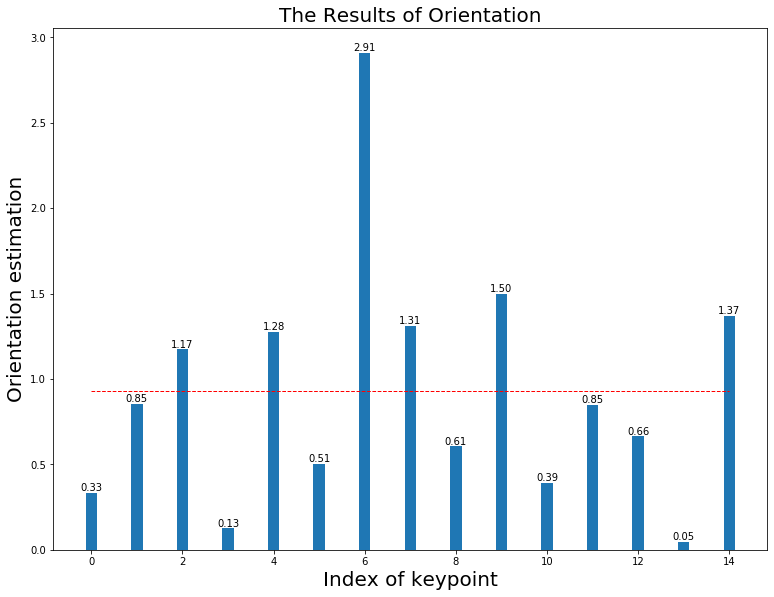

Final result: [    0.33472     0.85327      1.1737     0.12612      1.2778     0.50516        2.91      1.3127     0.60526      1.4986     0.39362     0.84993     0.66415    0.045502      1.3691]
FD Rotate(1.6):mean(0.928), median(0.786) in 0.011
The HoG estimation when (1.6) is  2


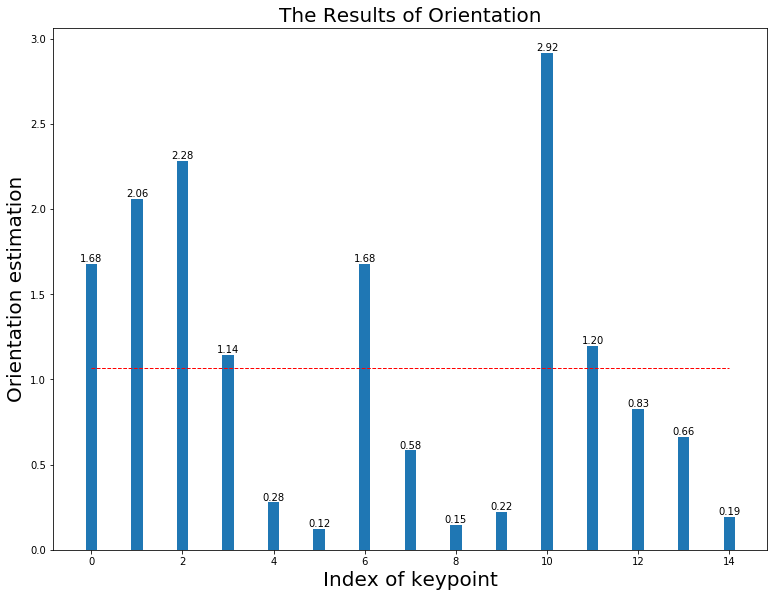

Final result: [     1.6805      2.0612      2.2821       1.144     0.27911     0.12344      1.6797     0.58426     0.14821     0.22269      2.9175      1.1951     0.82559     0.66306     0.19342]
FD Rotate(1.7):mean(1.067), median(0.934) in 0.010
The HoG estimation when (1.7) is  2


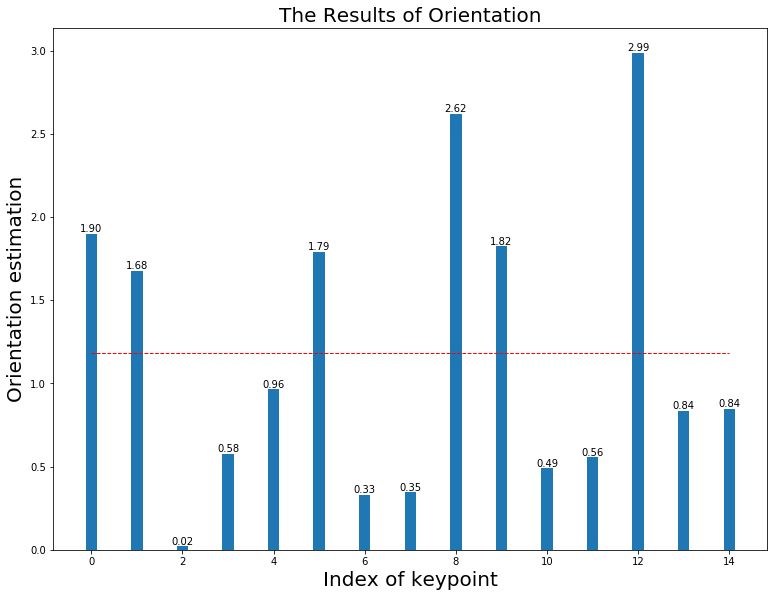

Final result: [     1.8972      1.6776     0.02037     0.57565      0.9648      1.7897     0.32996     0.34544      2.6194      1.8239     0.48972     0.55569      2.9866     0.83542     0.84479]
FD Rotate(1.8):mean(1.184), median(1.055) in 0.010
The HoG estimation when (1.8) is  2


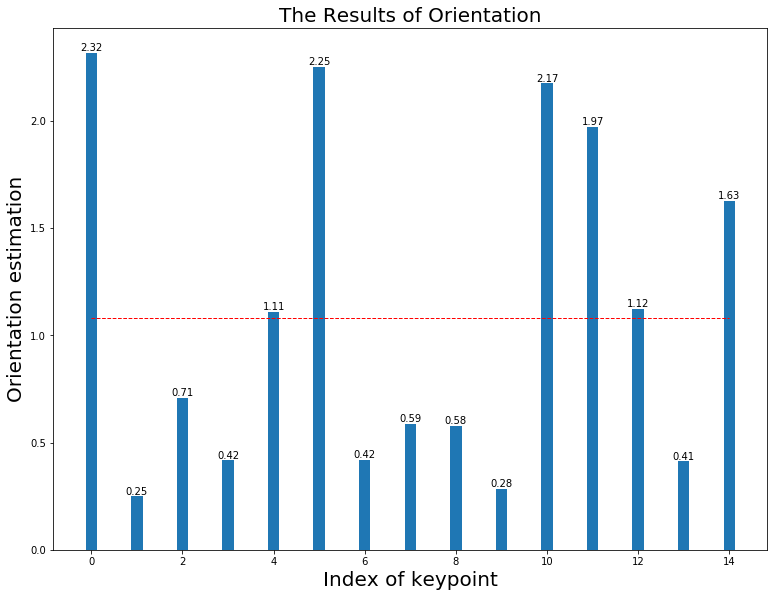

Final result: [     2.3169     0.24885     0.70868     0.41669      1.1083      2.2497     0.41988     0.58755     0.57787     0.28384      2.1739      1.9703      1.1228     0.41229      1.6271]
FD Rotate(1.9):mean(1.082), median(1.082) in 0.010
The HoG estimation when (1.9) is  2


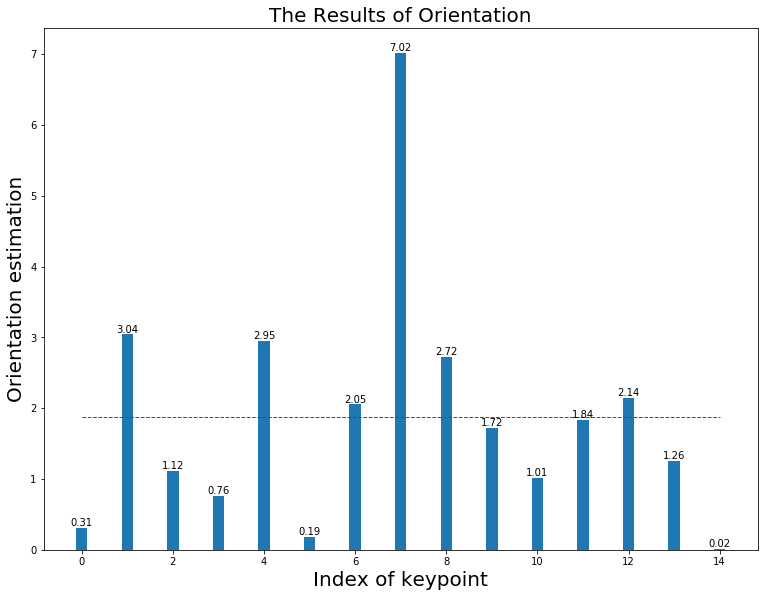

Final result: [    0.31226      3.0416       1.116     0.75957      2.9467     0.18735      2.0544      7.0191       2.724      1.7227      1.0114      1.8358      2.1422      1.2578    0.016342]
FD Rotate(2.0):mean(1.876), median(1.509) in 0.011
The HoG estimation when (2.0) is  2


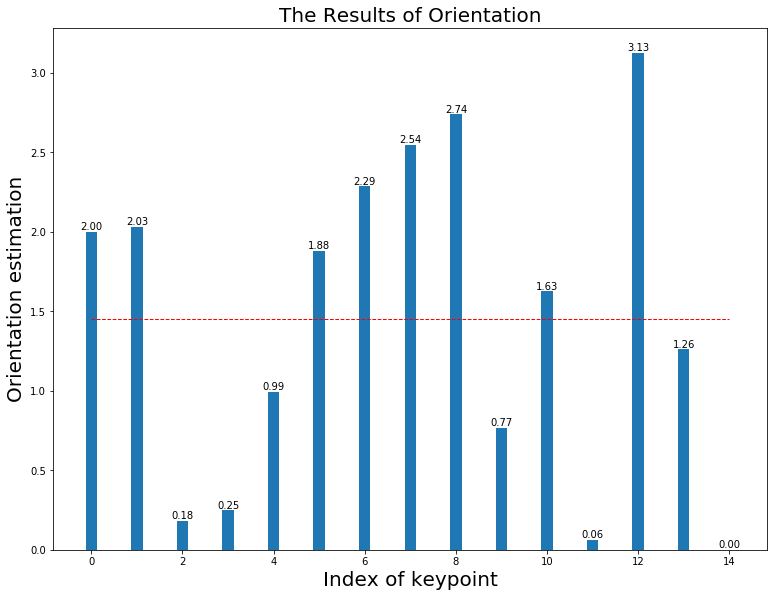

Final result: [      1.998      2.0323      0.1799     0.24796      0.9912      1.8817      2.2858      2.5444      2.7386     0.76693      1.6257    0.063488      3.1257       1.261   0.0014935]
FD Rotate(2.1):mean(1.450), median(1.450) in 0.011
The HoG estimation when (2.1) is  2


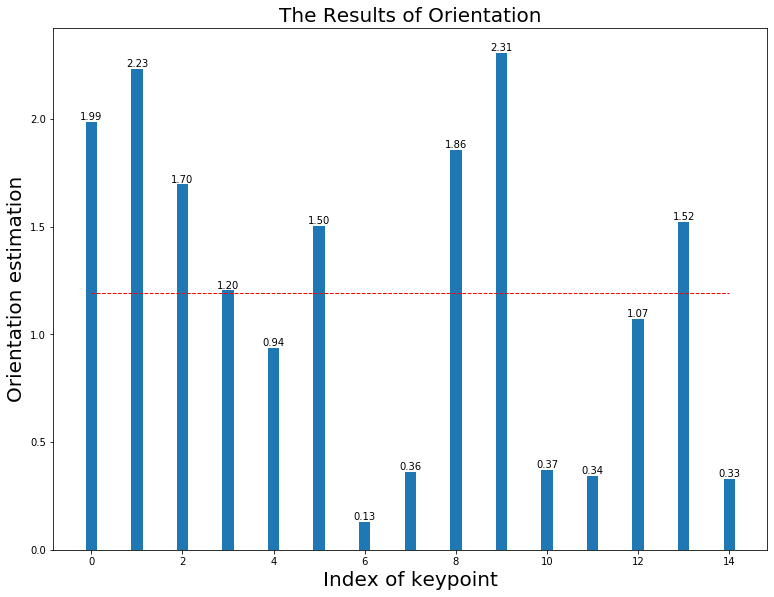

Final result: [     1.9878      2.2327      1.6965      1.2047      0.9389      1.5031     0.13006      0.3631      1.8581      2.3079     0.37095     0.34297      1.0728      1.5229     0.33055]
FD Rotate(2.2):mean(1.191), median(1.191) in 0.011
The HoG estimation when (2.2) is  2


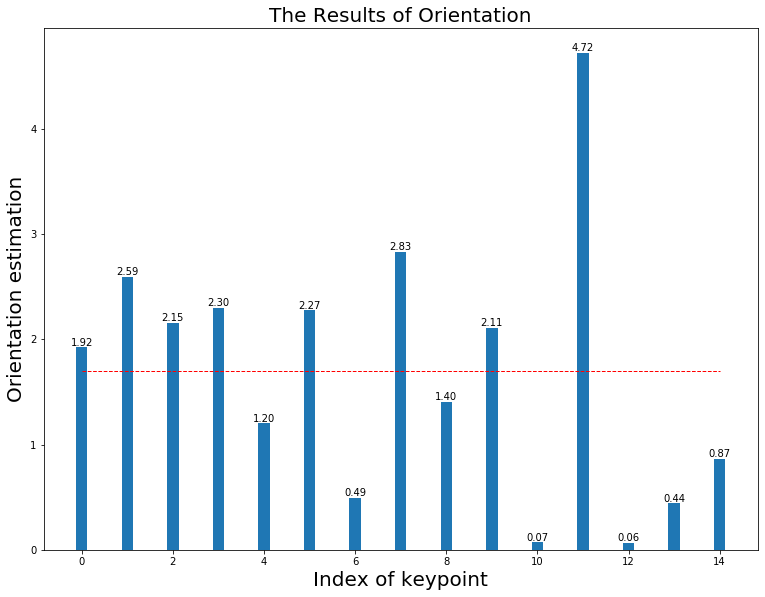

Final result: [     1.9217      2.5908      2.1521      2.3013      1.2016      2.2749     0.49475      2.8298      1.4035      2.1074    0.069885      4.7207    0.063904     0.44073      0.8665]
FD Rotate(2.3):mean(1.696), median(1.480) in 0.010
The HoG estimation when (2.3) is  2


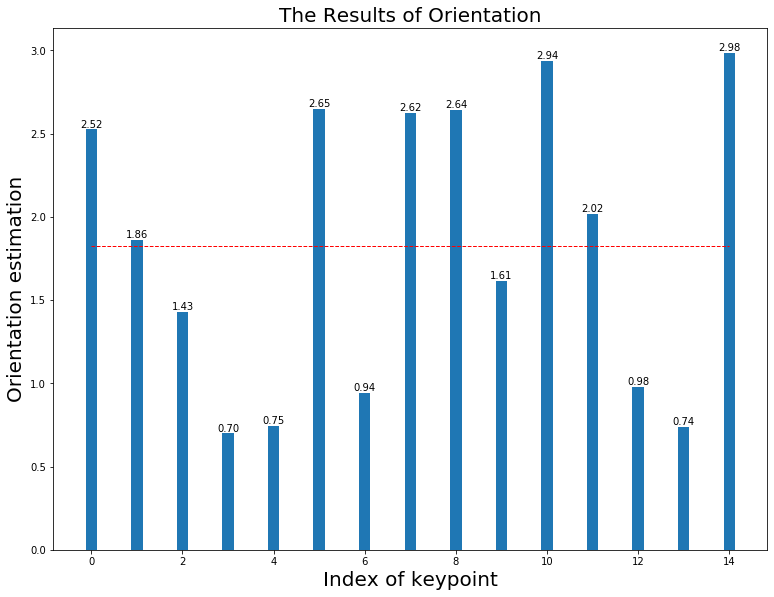

Final result: [     2.5249      1.8623      1.4295     0.69962     0.74567       2.649     0.94044      2.6237      2.6401      1.6148      2.9354      2.0193      0.9776     0.73928      2.9847]
FD Rotate(2.4):mean(1.826), median(1.826) in 0.010
The HoG estimation when (2.4) is  2


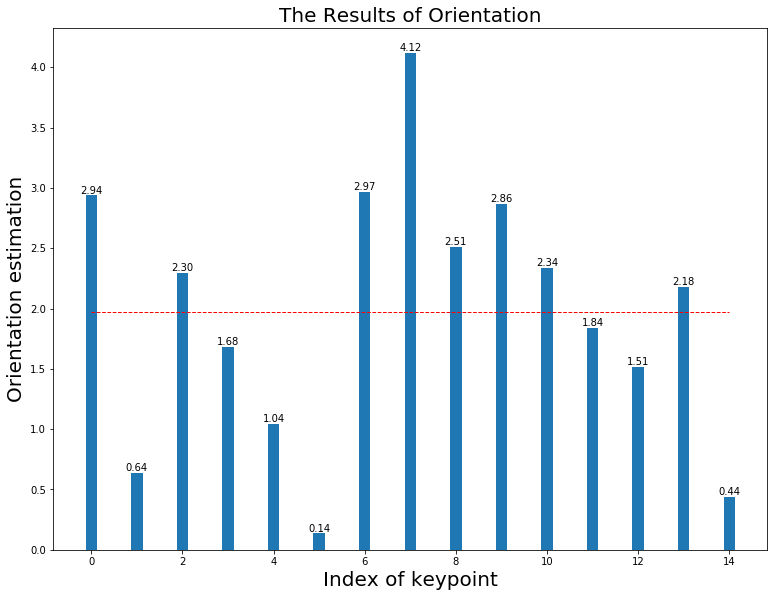

Final result: [     2.9374     0.63628      2.2971      1.6795      1.0432     0.13526      2.9652      4.1196      2.5125      2.8649      2.3354      1.8419      1.5141      2.1815     0.44064]
FD Rotate(2.5):mean(1.967), median(2.098) in 0.010
The HoG estimation when (2.5) is  3


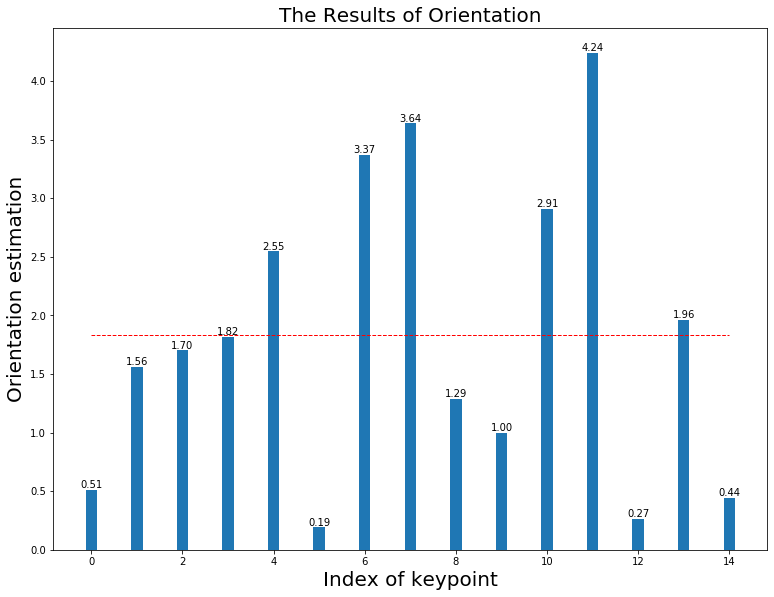

Final result: [    0.51219      1.5575      1.7004      1.8151      2.5452     0.19133      3.3687      3.6382      1.2875     0.99615      2.9059      4.2397     0.26555      1.9603     0.44438]
FD Rotate(2.6):mean(1.829), median(1.656) in 0.011
The HoG estimation when (2.6) is  3


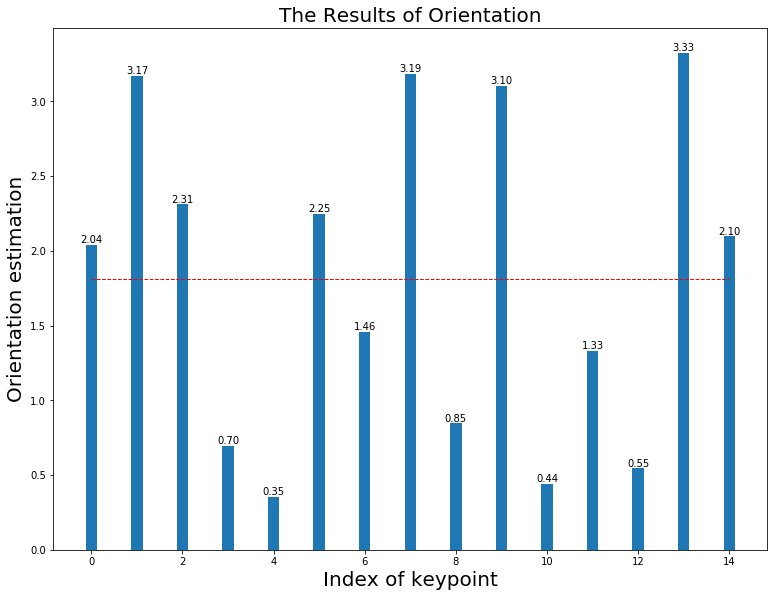

Final result: [     2.0421        3.17      2.3108     0.69521     0.35294       2.247      1.4603      3.1869      0.8455      3.1018     0.43881        1.33     0.54501      3.3254      2.0969]
FD Rotate(2.7):mean(1.810), median(1.810) in 0.011
The HoG estimation when (2.7) is  3


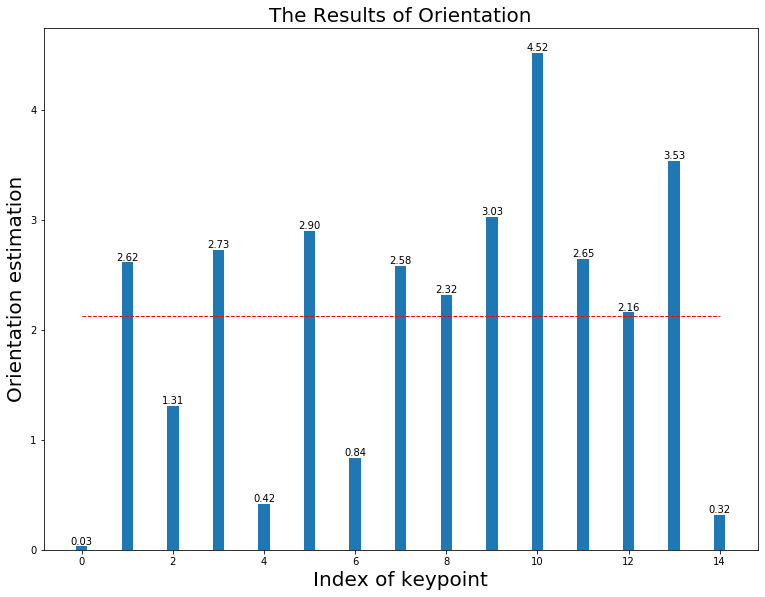

Final result: [   0.030773      2.6154      1.3122      2.7278      0.4193      2.9015     0.83676      2.5829      2.3188      3.0253      4.5208      2.6485      2.1606      3.5348     0.31812]
FD Rotate(2.8):mean(2.130), median(2.599) in 0.011
The HoG estimation when (2.8) is  3


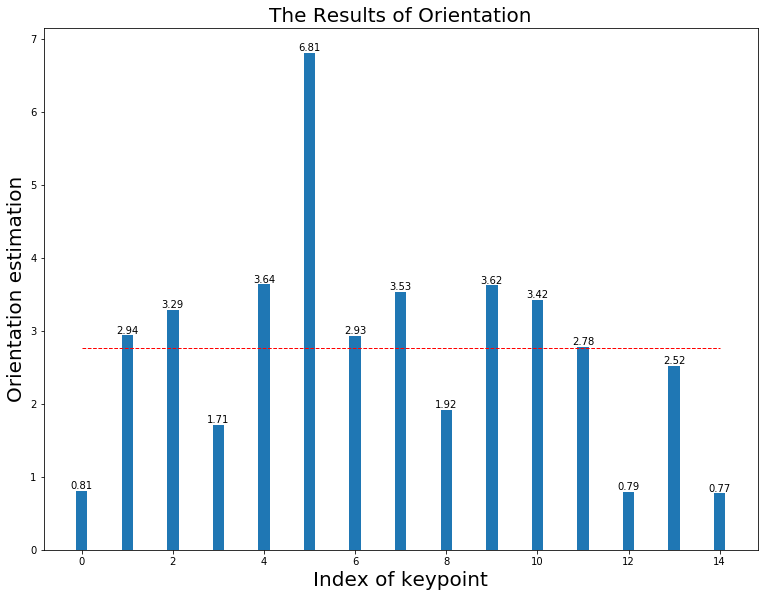

Final result: [    0.80849       2.937       3.287      1.7082      3.6364      6.8066      2.9299      3.5347      1.9157      3.6225      3.4223      2.7759      0.7948      2.5225     0.77176]
FD Rotate(2.9):mean(2.765), median(2.936) in 0.011
The HoG estimation when (2.9) is  3


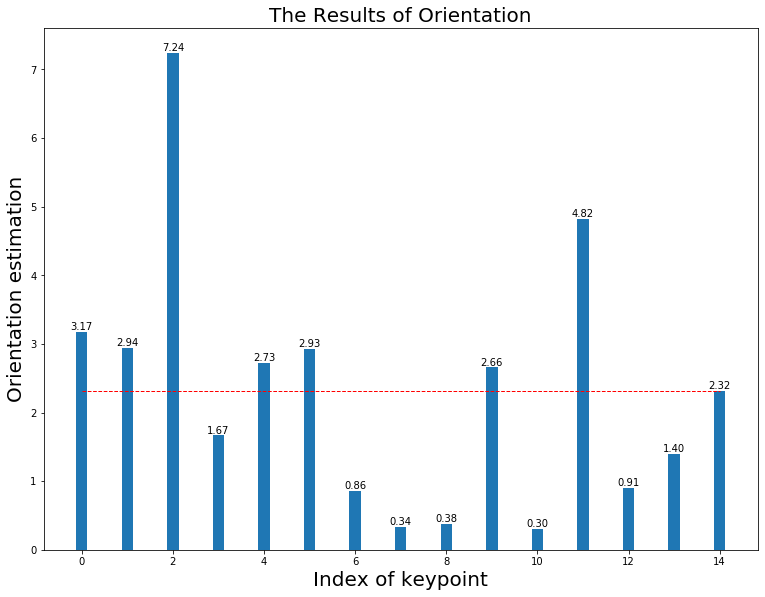

Final result: [     3.1724      2.9423      7.2432      1.6682      2.7284      2.9333     0.85925     0.33556     0.37825      2.6577     0.30188      4.8245     0.90689      1.4028      2.3208]
FD Rotate(3.0):mean(2.312), median(1.859) in 0.011
The HoG estimation when (3.0) is  3


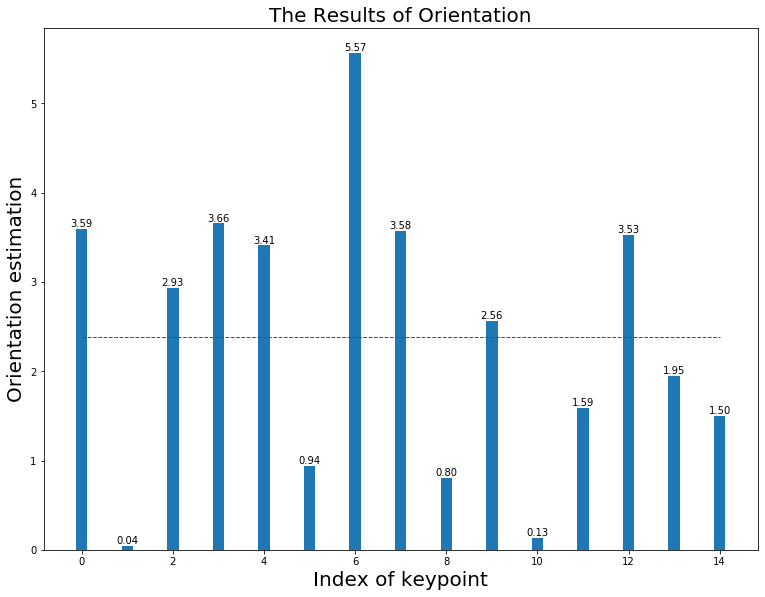

Final result: [     3.5914    0.040339      2.9306      3.6565      3.4096     0.94226      5.5679      3.5759     0.80389      2.5648     0.13232      1.5899      3.5256      1.9476      1.4978]
FD Rotate(3.1):mean(2.385), median(2.503) in 0.011
The HoG estimation when (3.1) is  3


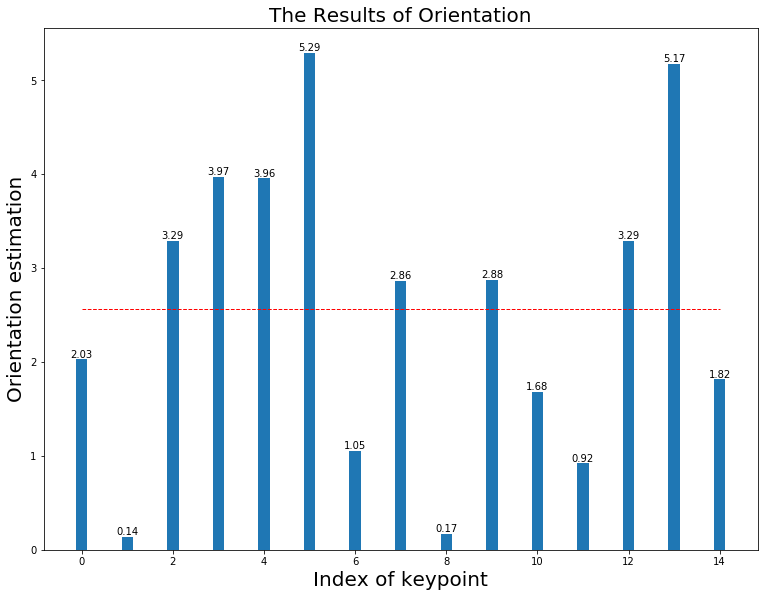

Final result: [     2.0287     0.14111       3.287      3.9741      3.9566       5.293       1.054      2.8635     0.17328      2.8783      1.6822     0.92102      3.2904      5.1722       1.816]
FD Rotate(3.2):mean(2.569), median(2.523) in 0.011
The HoG estimation when (3.2) is  3


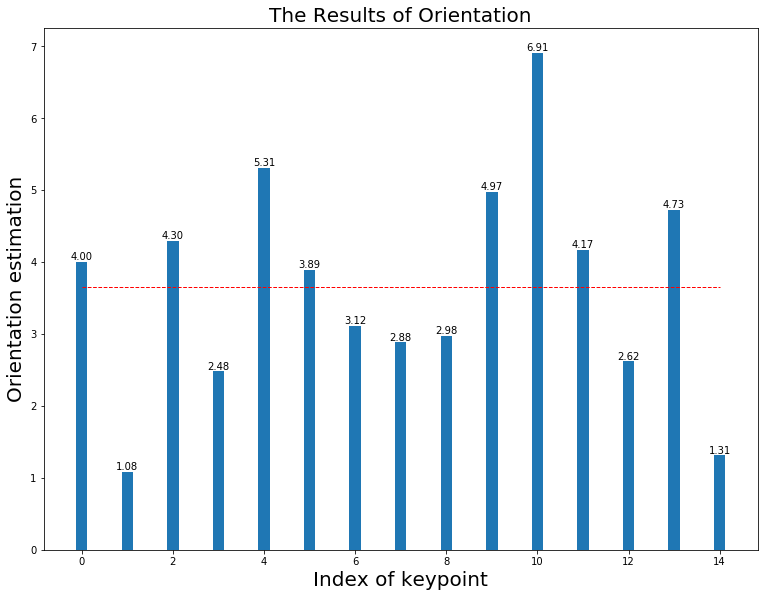

Final result: [     3.9999      1.0787      4.2989      2.4793      5.3072      3.8882      3.1157      2.8847      2.9786      4.9742       6.911      4.1705      2.6188       4.731      1.3115]
FD Rotate(3.3):mean(3.650), median(3.787) in 0.011
The HoG estimation when (3.3) is  3


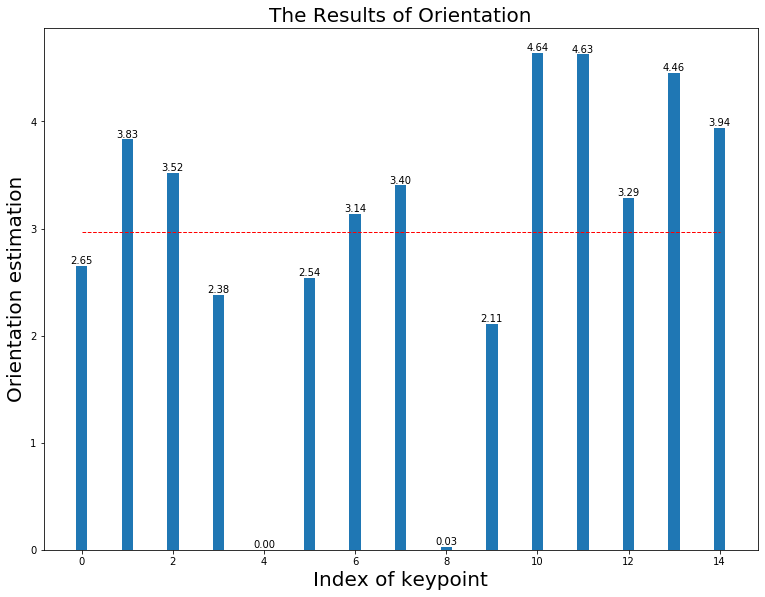

Final result: [     2.6536      3.8336      3.5208      2.3811   0.0026855      2.5368      3.1371      3.4027    0.025146      2.1112      4.6409      4.6259      3.2863      4.4557       3.939]
FD Rotate(3.4):mean(2.970), median(3.425) in 0.011
The HoG estimation when (3.4) is  3


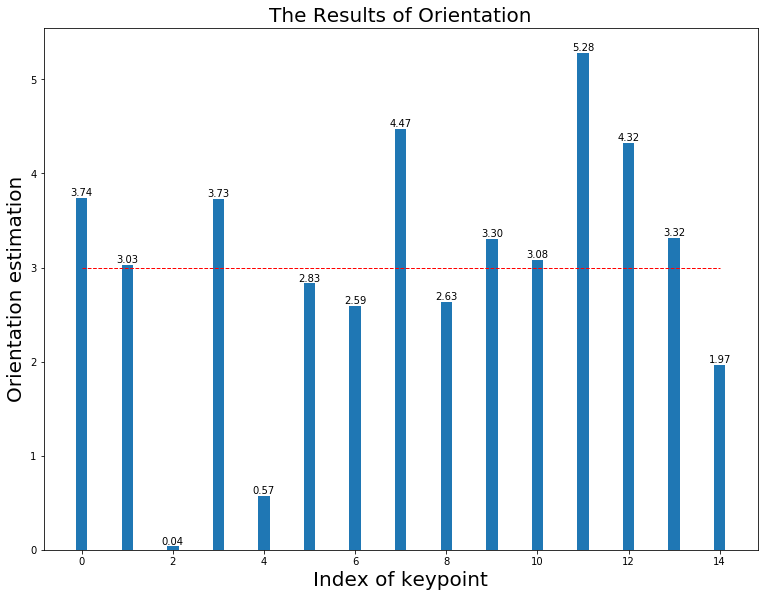

Final result: [     3.7398       3.027    0.036224       3.727      0.5741        2.83      2.5909      4.4711      2.6312      3.3023      3.0843      5.2817      4.3224       3.318      1.9689]
FD Rotate(3.5):mean(2.994), median(3.251) in 0.010
The HoG estimation when (3.5) is  3


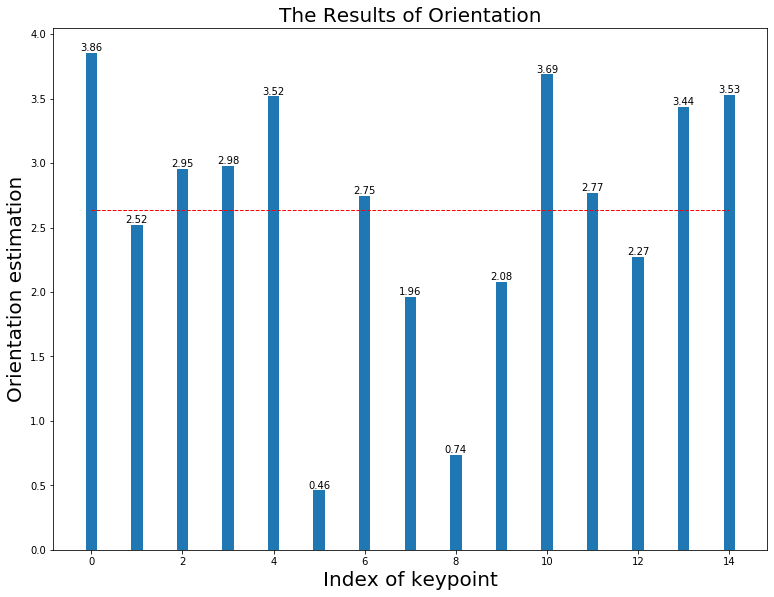

Final result: [     3.8553      2.5223       2.955      2.9785      3.5182      0.4613      2.7457      1.9629     0.73874      2.0807      3.6869      2.7709      2.2711       3.438      3.5271]
FD Rotate(3.6):mean(2.634), median(2.947) in 0.010
The HoG estimation when (3.6) is  4


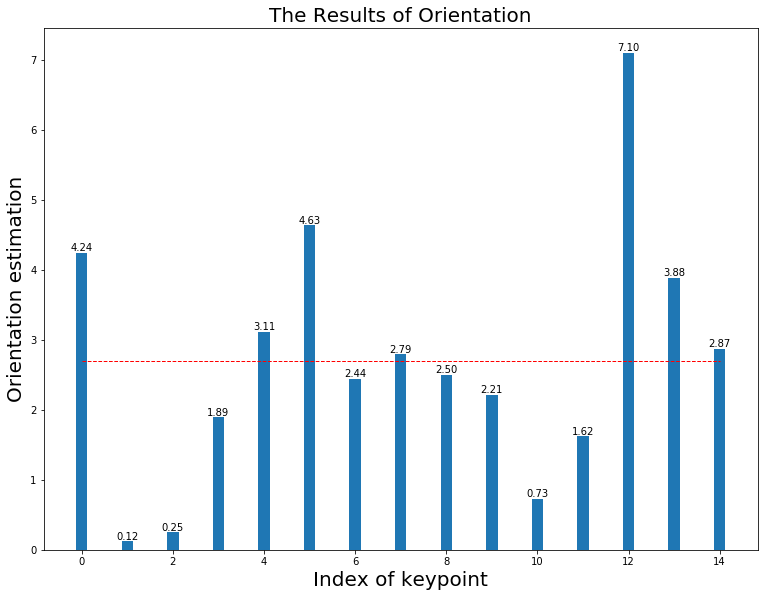

Final result: [     4.2441     0.11926      0.2486      1.8899      3.1144      4.6338      2.4438      2.7918      2.5006       2.213      0.7251      1.6201      7.0993      3.8816      2.8715]
FD Rotate(3.7):mean(2.693), median(2.572) in 0.011
The HoG estimation when (3.7) is  4


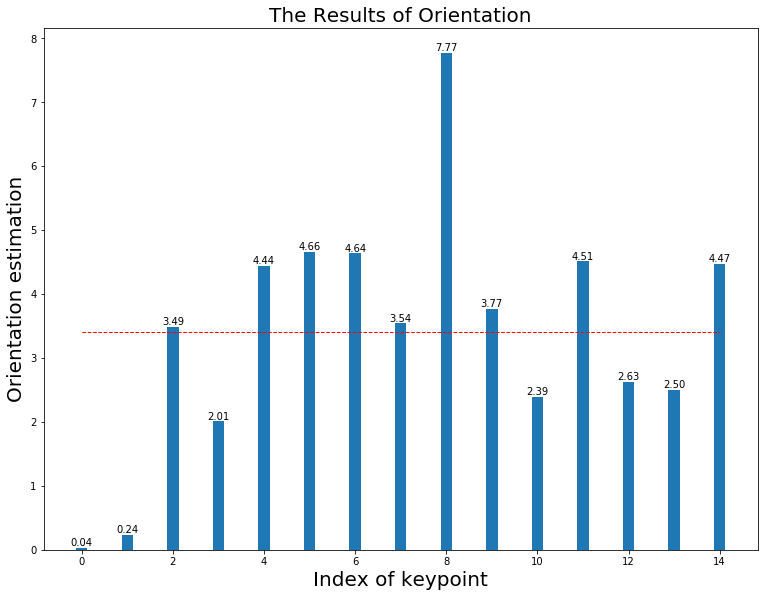

Final result: [   0.035049     0.23797      3.4906      2.0084       4.443      4.6565      4.6354      3.5421      7.7739      3.7705      2.3931       4.513      2.6274      2.4963      4.4734]
FD Rotate(3.8):mean(3.406), median(3.587) in 0.011
The HoG estimation when (3.8) is  4


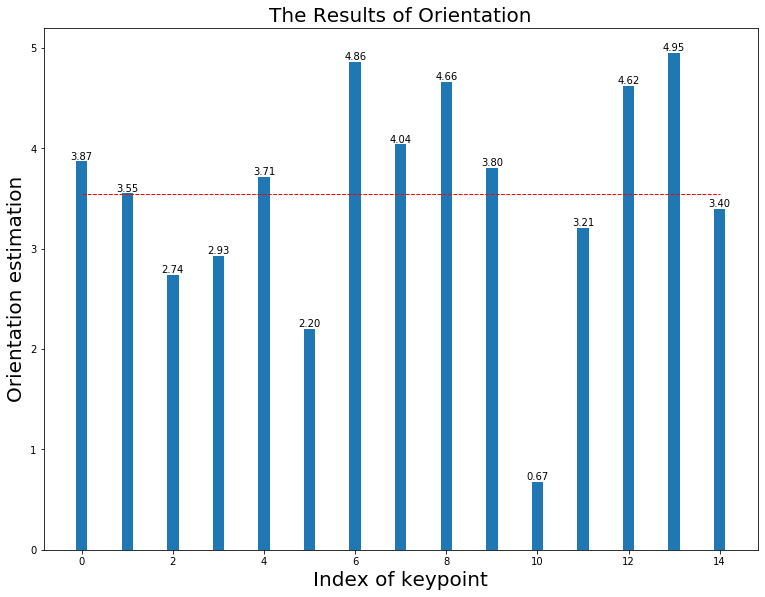

Final result: [     3.8712      3.5504      2.7426      2.9264      3.7139      2.1996       4.859      4.0396      4.6619      3.8048     0.67419      3.2103      4.6212      4.9518         3.4]
FD Rotate(3.9):mean(3.548), median(3.754) in 0.011
The HoG estimation when (3.9) is  4


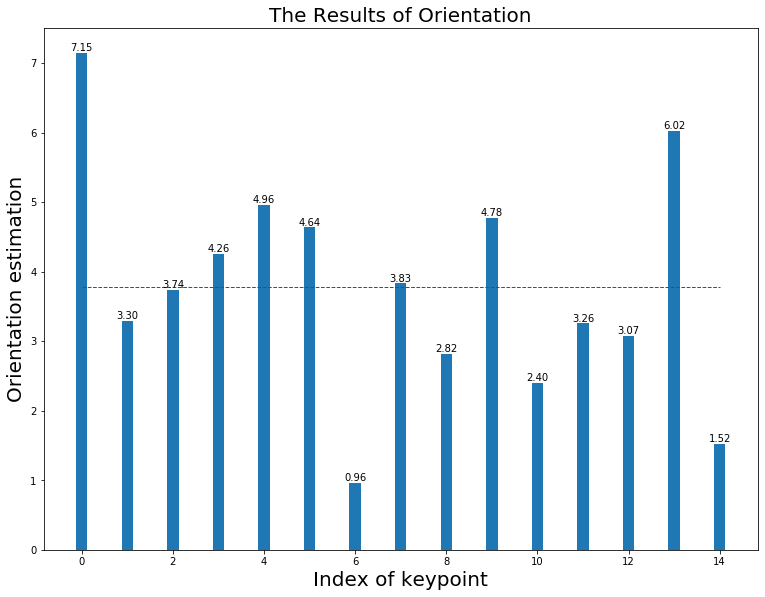

Final result: [     7.1464      3.2957      3.7399      4.2559      4.9585      4.6376     0.96226      3.8299      2.8195      4.7754      2.4022      3.2575      3.0724      6.0243      1.5208]
FD Rotate(4.0):mean(3.780), median(3.731) in 0.010
The HoG estimation when (4.0) is  4


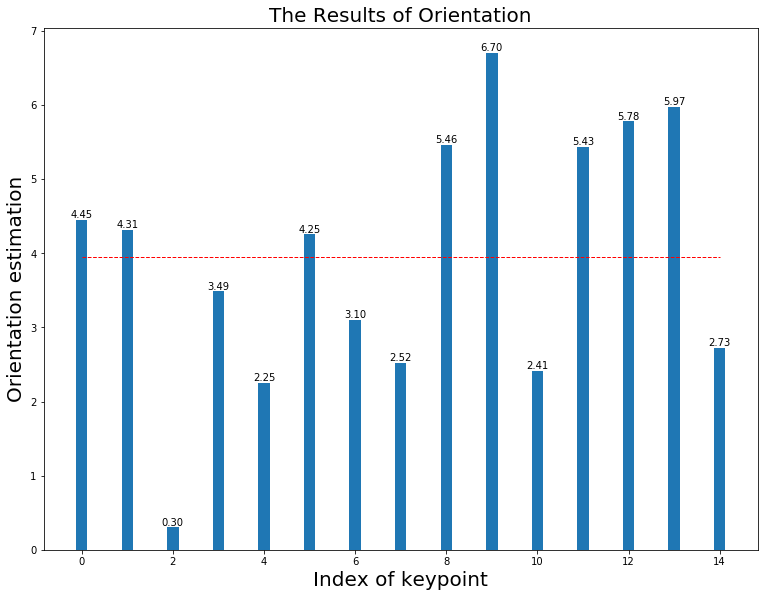

Final result: [     4.4487      4.3136     0.30127       3.487      2.2472      4.2541      3.1021      2.5225       5.463      6.7045      2.4121      5.4341       5.779      5.9746      2.7269]
FD Rotate(4.1):mean(3.945), median(4.160) in 0.011
The HoG estimation when (4.1) is  4


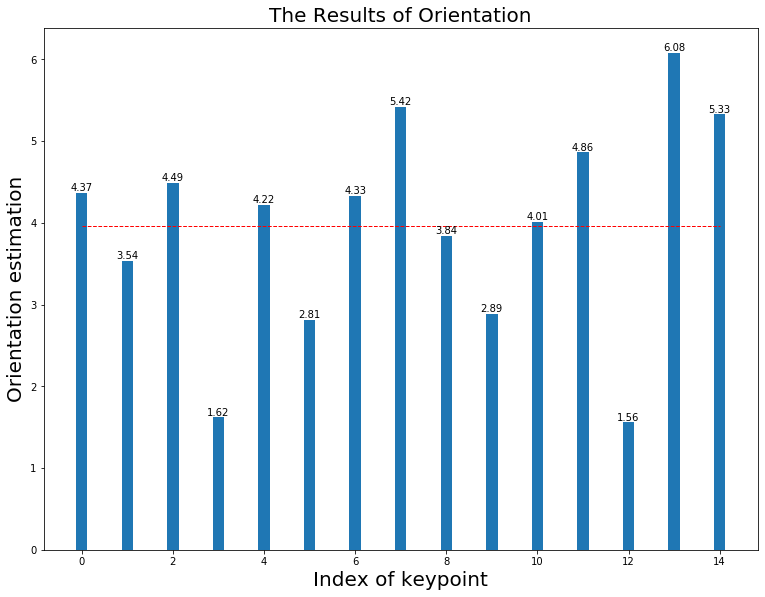

Final result: [     4.3688        3.54      4.4899      1.6192      4.2171      2.8132      4.3305      5.4205      3.8425      2.8891      4.0097      4.8643      1.5594      6.0818      5.3289]
FD Rotate(4.2):mean(3.958), median(4.323) in 0.011
The HoG estimation when (4.2) is  4


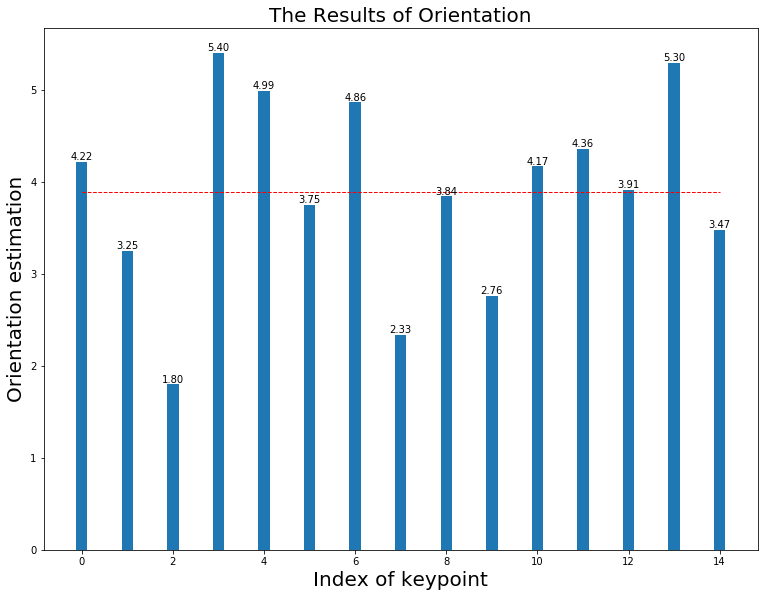

Final result: [     4.2186      3.2475      1.7975      5.4024      4.9895       3.751      4.8625      2.3331      3.8429      2.7594      4.1674      4.3586      3.9109      5.2968      3.4745]
FD Rotate(4.3):mean(3.894), median(4.044) in 0.011
The HoG estimation when (4.3) is  4


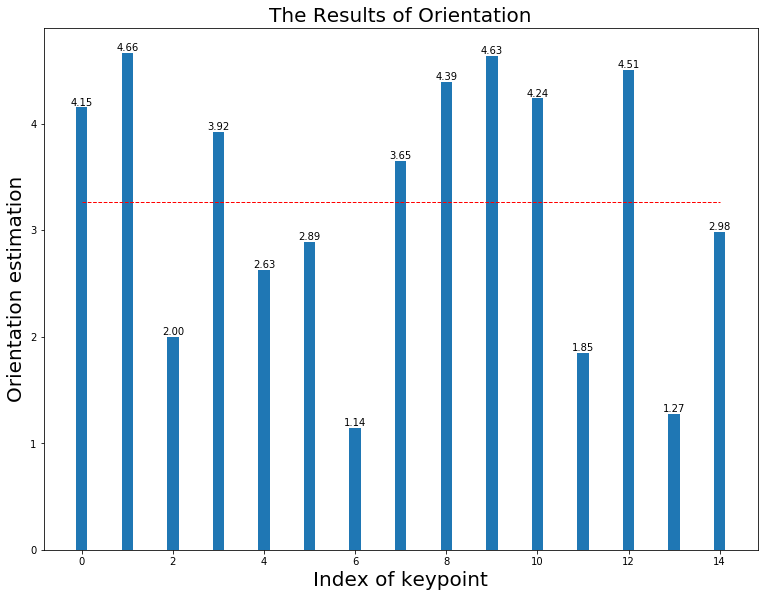

Final result: [      4.152      4.6649      2.0017      3.9206       2.628      2.8878      1.1421      3.6516      4.3943      4.6335      4.2362      1.8489      4.5062      1.2745      2.9816]
FD Rotate(4.4):mean(3.262), median(3.577) in 0.011
The HoG estimation when (4.4) is  5


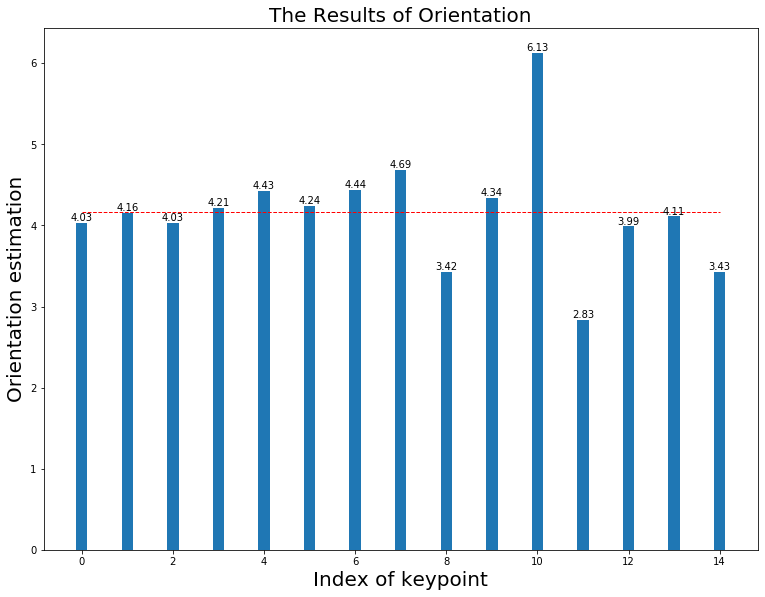

Final result: [     4.0294      4.1561      4.0283      4.2128      4.4263      4.2407      4.4428      4.6868      3.4246      4.3378      6.1289       2.831      3.9892      4.1118      3.4282]
FD Rotate(4.5):mean(4.165), median(4.165) in 0.011
The HoG estimation when (4.5) is  5


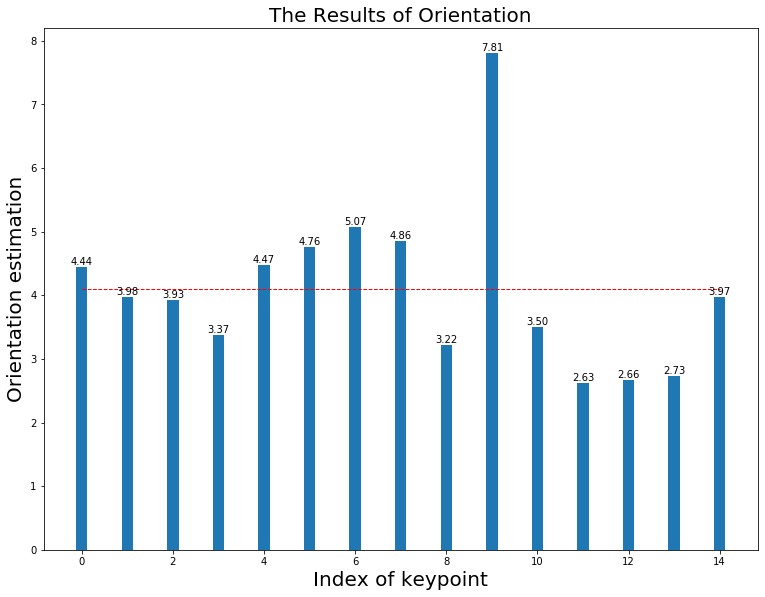

Final result: [     4.4424      3.9786      3.9294      3.3718      4.4723      4.7589      5.0712      4.8585      3.2221      7.8094      3.5006      2.6254      2.6645      2.7317      3.9693]
FD Rotate(4.6):mean(4.094), median(3.828) in 0.011
The HoG estimation when (4.6) is  5


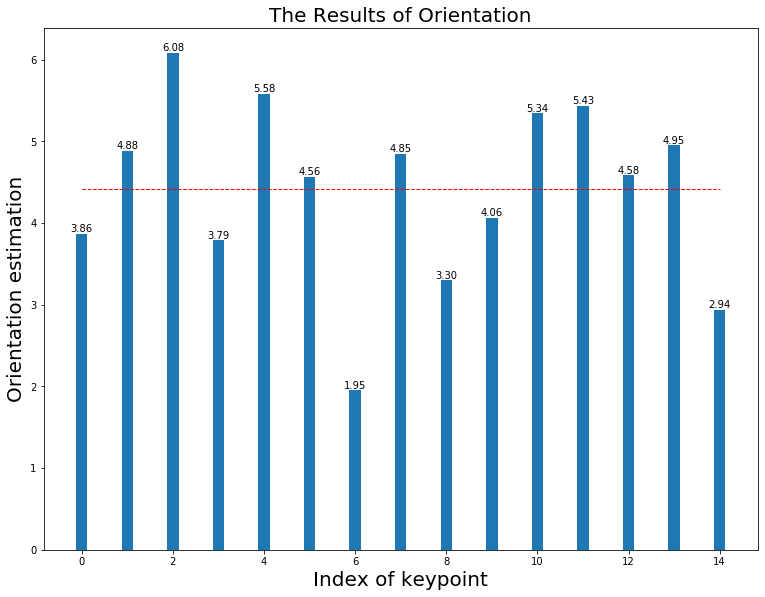

Final result: [      3.863      4.8834      6.0828      3.7869      5.5801      4.5624      1.9498      4.8483      3.2965      4.0615      5.3404      5.4327      4.5819      4.9495      2.9388]
FD Rotate(4.7):mean(4.411), median(4.586) in 0.011
The HoG estimation when (4.7) is  5


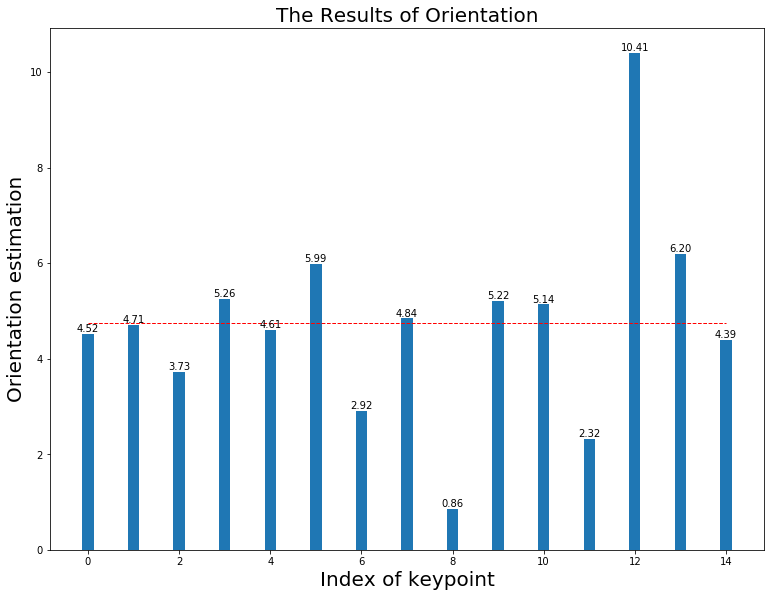

Final result: [      4.516      4.7141      3.7315      5.2604      4.6074      5.9883       2.916      4.8441     0.86199      5.2182      5.1388      2.3159      10.406      6.1971      4.3897]
FD Rotate(4.8):mean(4.740), median(4.793) in 0.010
The HoG estimation when (4.8) is  5


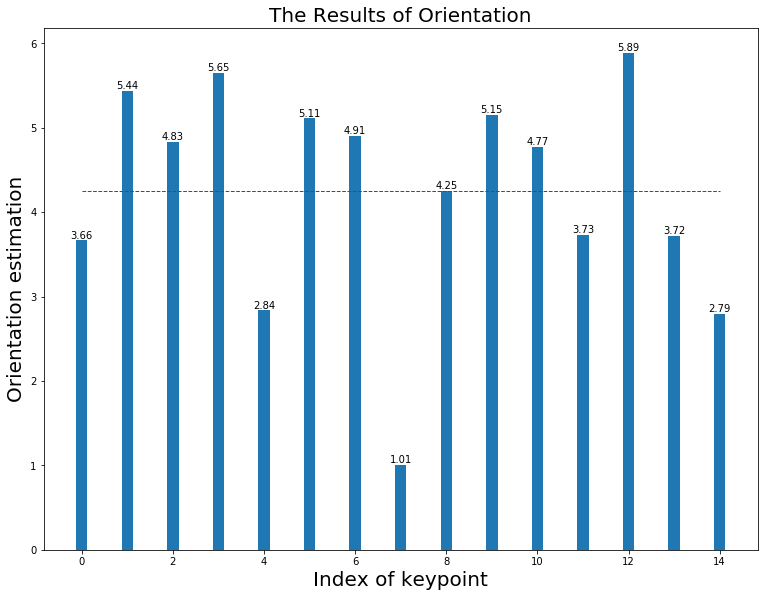

Final result: [     3.6643      5.4363      4.8327      5.6514      2.8356      5.1121      4.9066      1.0102      4.2513       5.154      4.7708      3.7298      5.8878      3.7205      2.7937]
FD Rotate(4.9):mean(4.250), median(4.482) in 0.011
The HoG estimation when (4.9) is  5


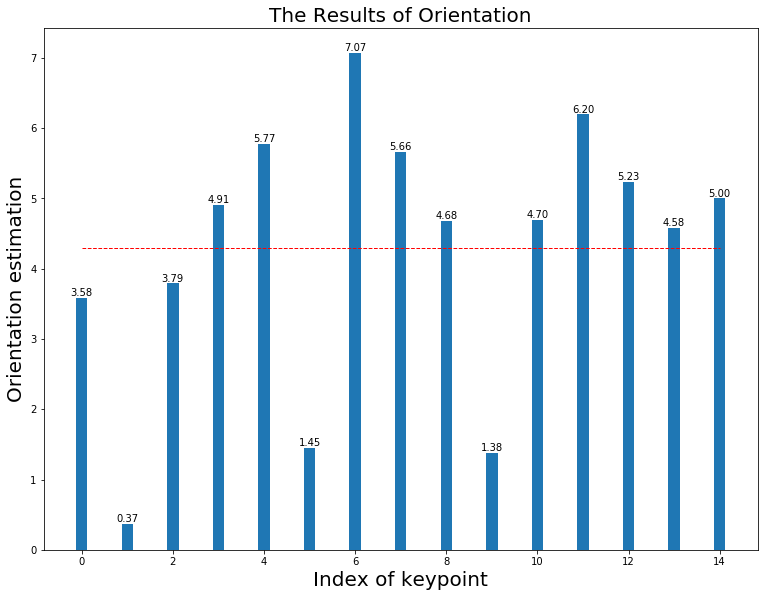

Final result: [     3.5797     0.37156      3.7894      4.9118       5.775      1.4457      7.0717      5.6644      4.6822      1.3788      4.6978       6.197      5.2307      4.5842      5.0014]
FD Rotate(5.0):mean(4.292), median(4.919) in 0.010
The HoG estimation when (5.0) is  5


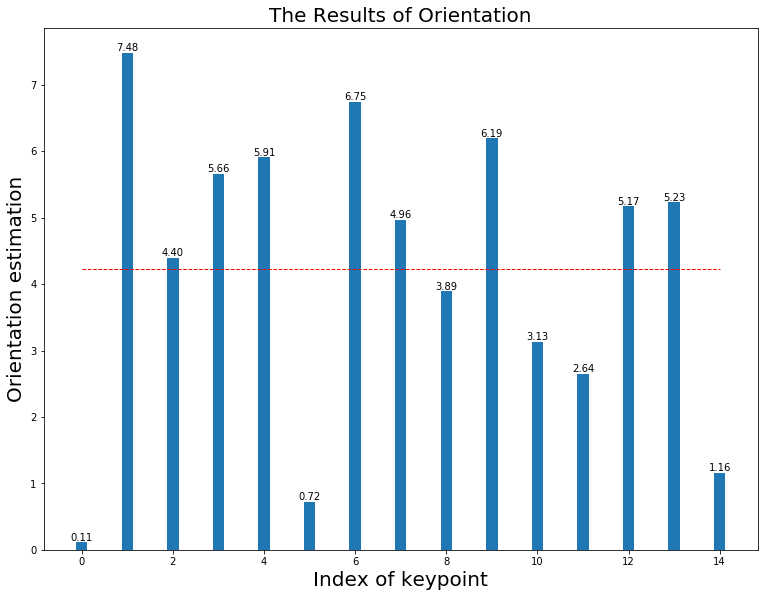

Final result: [    0.11015      7.4818      4.3965      5.6625      5.9086     0.72485      6.7461      4.9614      3.8892       6.192      3.1294       2.644      5.1709      5.2318      1.1603]
FD Rotate(5.1):mean(4.227), median(5.129) in 0.011
The HoG estimation when (5.1) is  5


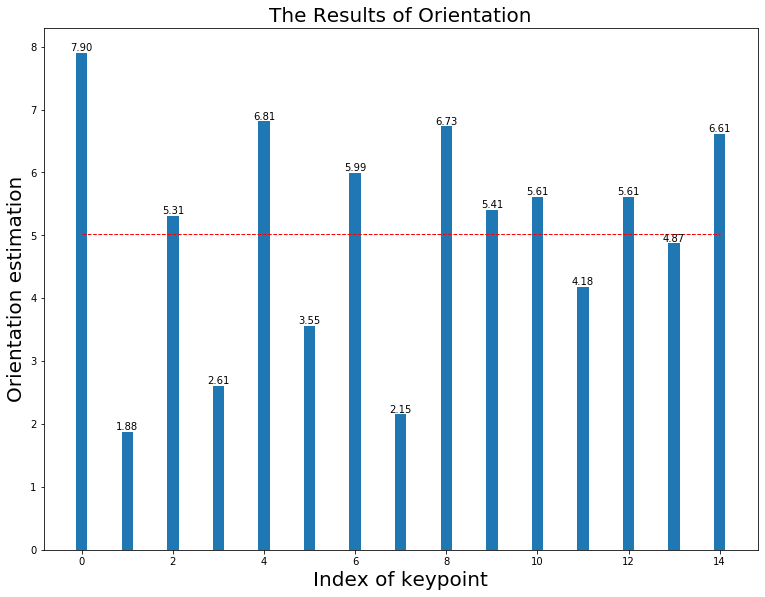

Final result: [     7.9021      1.8794      5.3141      2.6096      6.8116      3.5546      5.9876      2.1543      6.7332      5.4092      5.6089      4.1768      5.6118       4.873      6.6081]
FD Rotate(5.2):mean(5.016), median(5.517) in 0.011
The HoG estimation when (5.2) is  5


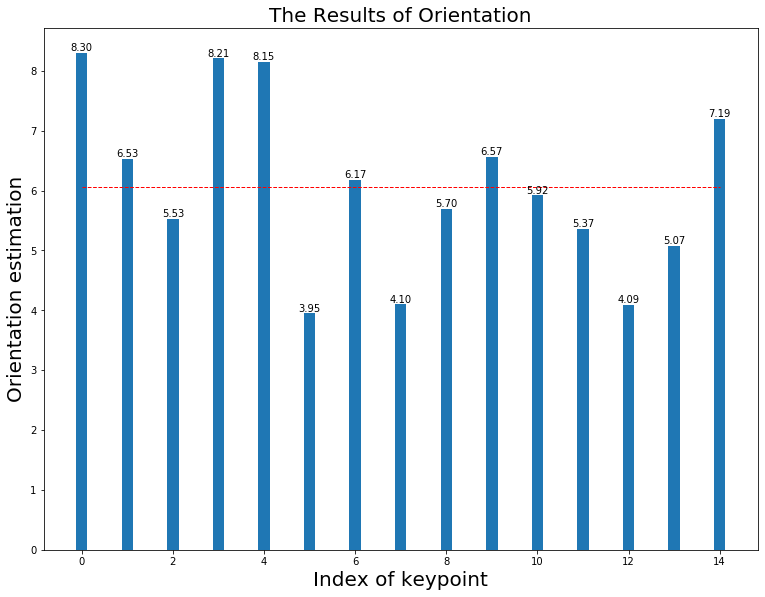

Final result: [      8.301      6.5349      5.5257      8.2059      8.1492      3.9502      6.1747      4.0997       5.698      6.5686      5.9189      5.3654      4.0921      5.0717      7.1916]
FD Rotate(5.3):mean(6.057), median(5.516) in 0.011
The HoG estimation when (5.3) is  5


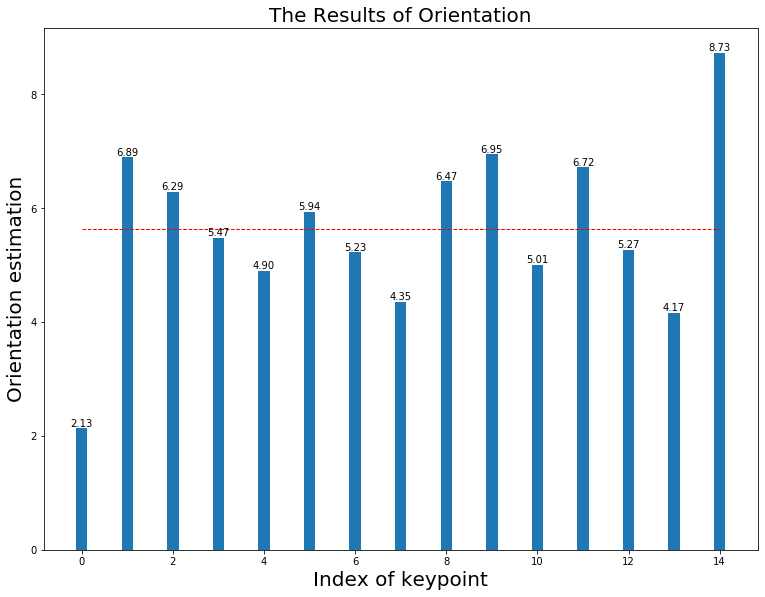

Final result: [     2.1345       6.894      6.2861       5.474      4.8965      5.9395      5.2254      4.3536      6.4741      6.9464      5.0094      6.7177      5.2691      4.1677      8.7308]
FD Rotate(5.4):mean(5.635), median(5.666) in 0.011
The HoG estimation when (5.4) is  5


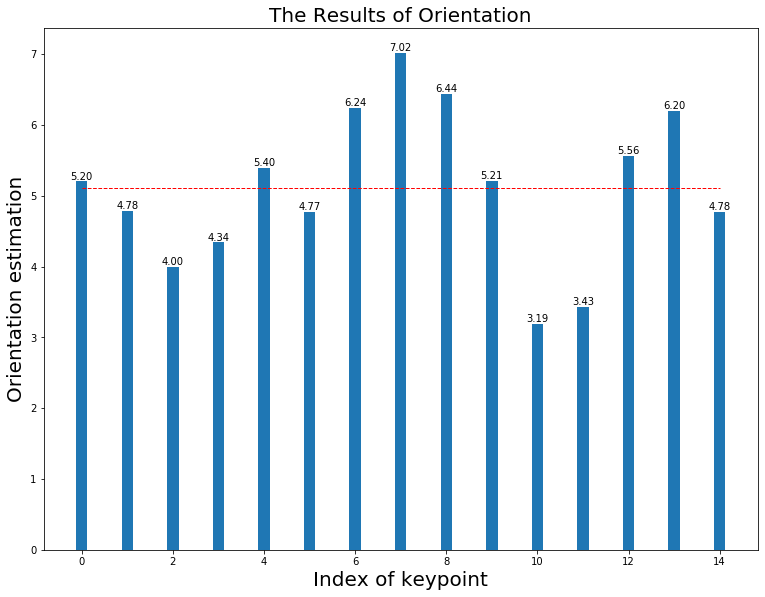

Final result: [     5.2025      4.7842       3.996      4.3428      5.3969      4.7718      6.2415      7.0201      6.4439      5.2103      3.1921      3.4325        5.56      6.1953       4.775]
FD Rotate(5.5):mean(5.104), median(5.241) in 0.010
The HoG estimation when (5.5) is  6


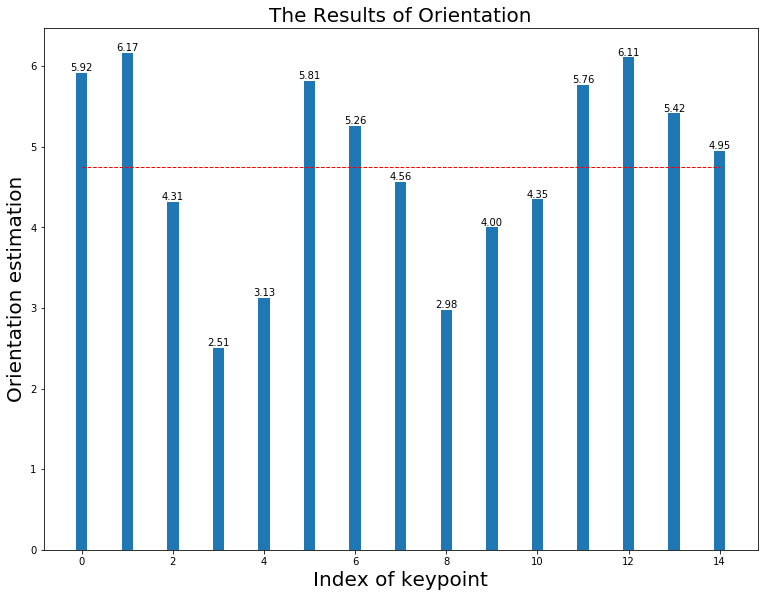

Final result: [     5.9181      6.1657      4.3126      2.5092      3.1279      5.8137      5.2608      4.5601      2.9809      4.0002      4.3468      5.7631      6.1073      5.4151      4.9512]
FD Rotate(5.6):mean(4.749), median(4.909) in 0.011
The HoG estimation when (5.6) is  6


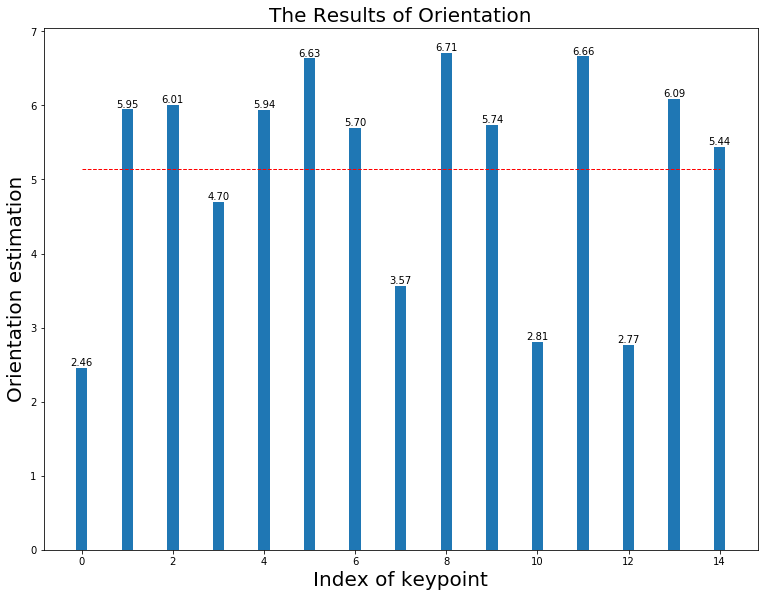

Final result: [     2.4596      5.9455      6.0114       4.696      5.9413      6.6347      5.7015      3.5662      6.7108      5.7379      2.8091      6.6633       2.767      6.0915      5.4433]
FD Rotate(5.7):mean(5.145), median(5.962) in 0.011
The HoG estimation when (5.7) is  6


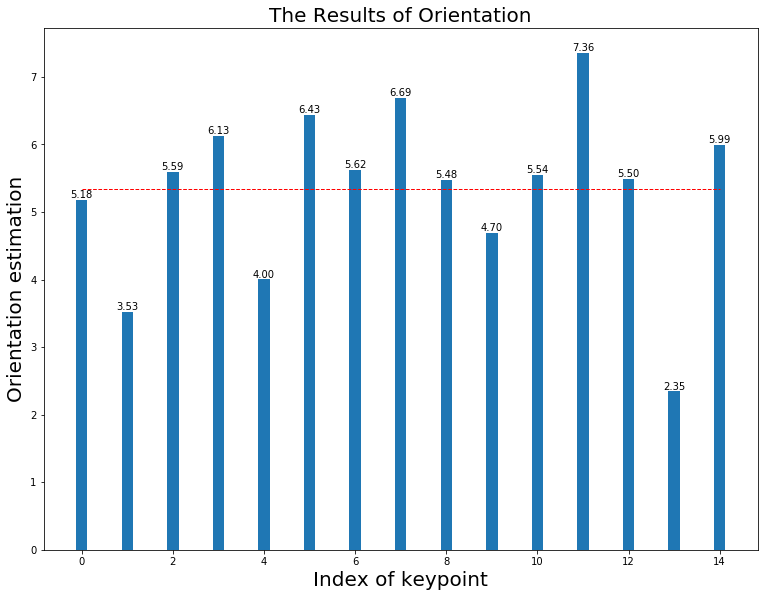

Final result: [     5.1759      3.5257      5.5935      6.1291      4.0032      6.4319      5.6187      6.6944      5.4795      4.6953      5.5439      7.3561      5.4951      2.3458      5.9933]
FD Rotate(5.8):mean(5.339), median(5.708) in 0.011
The HoG estimation when (5.8) is  6


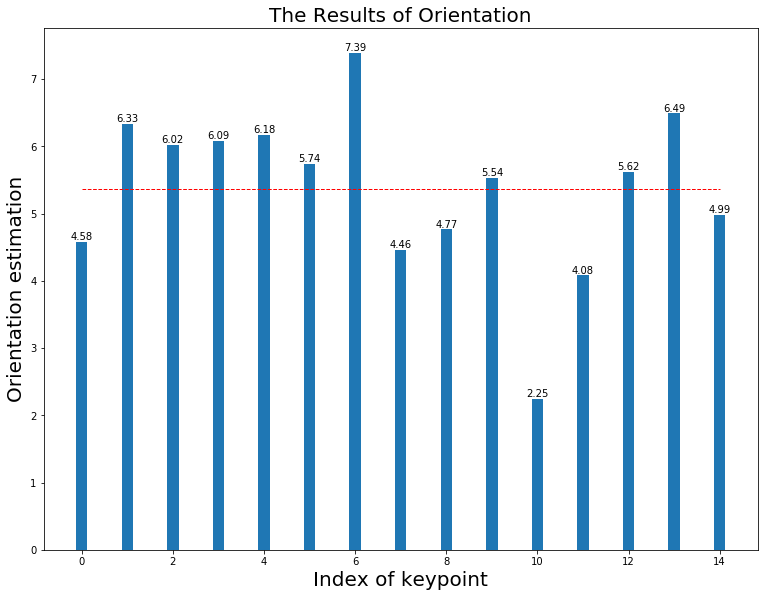

Final result: [     4.5791      6.3319      6.0223      6.0862      6.1753      5.7376      7.3934      4.4593      4.7668      5.5355      2.2453       4.082      5.6175      6.4905      4.9857]
FD Rotate(5.9):mean(5.367), median(5.590) in 0.011
The HoG estimation when (5.9) is  6


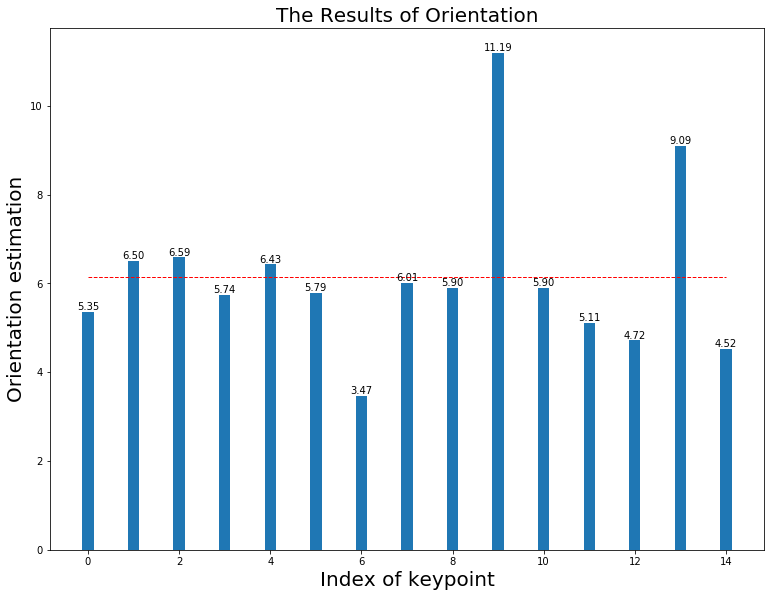

Final result: [      5.352      6.5029      6.5874      5.7373       6.428      5.7928      3.4669      6.0139      5.9022      11.193      5.8995      5.1103       4.716      9.0939      4.5193]
FD Rotate(6.0):mean(6.154), median(5.713) in 0.011
The HoG estimation when (6.0) is  6


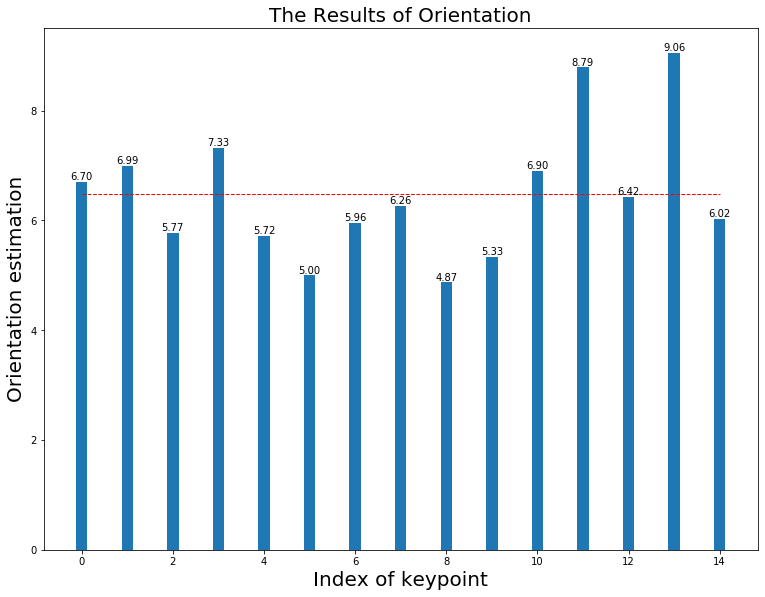

Final result: [     6.6978      6.9935      5.7748      7.3275       5.719      5.0017      5.9577      6.2625      4.8743      5.3315      6.9027      8.7875      6.4245      9.0554      6.0231]
FD Rotate(6.1):mean(6.476), median(6.099) in 0.010
The HoG estimation when (6.1) is  6


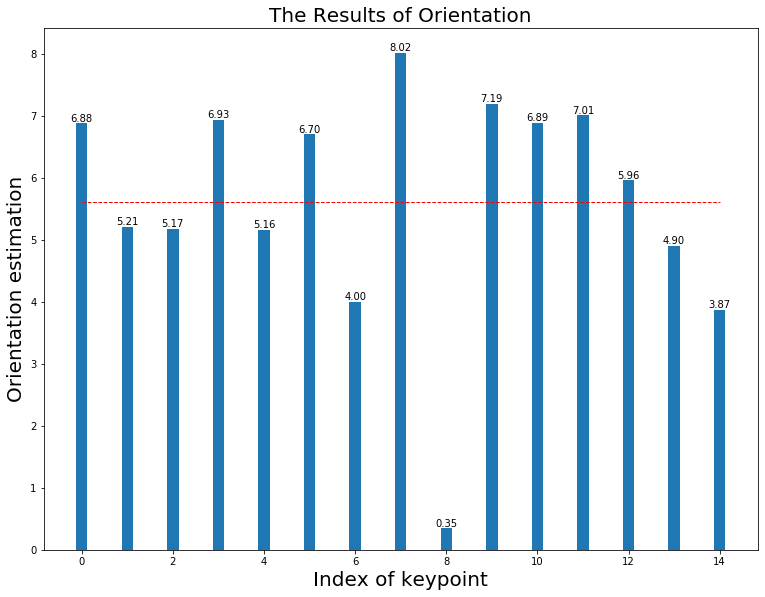

Final result: [     6.8789      5.2058      5.1707      6.9341      5.1648      6.7009      4.0013      8.0164     0.34566      7.1926      6.8892      7.0088      5.9589      4.9019      3.8694]
FD Rotate(6.2):mean(5.616), median(6.001) in 0.011
The HoG estimation when (6.2) is  6


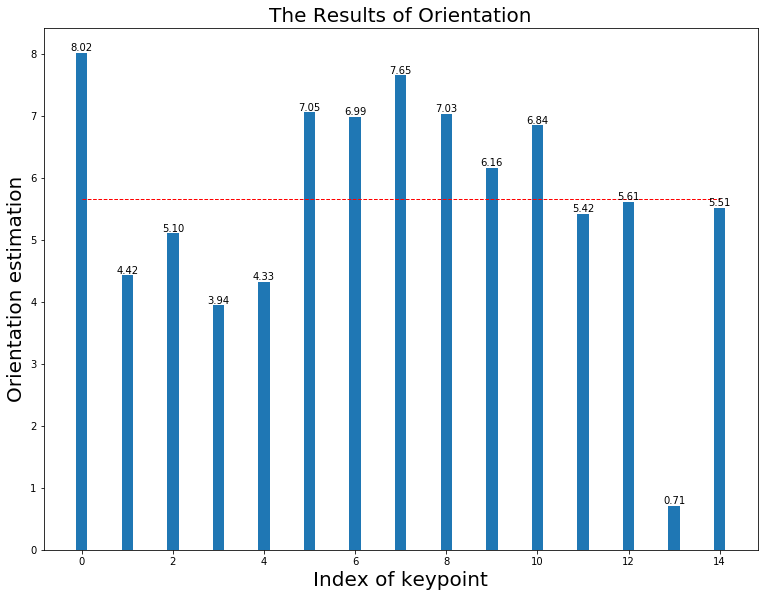

Final result: [     8.0173      4.4248      5.1038      3.9443      4.3258      7.0547      6.9878      7.6527      7.0286      6.1578      6.8448      5.4217       5.607     0.71259      5.5149]
FD Rotate(6.3):mean(5.653), median(5.701) in 0.011
The HoG estimation when (6.3) is  6


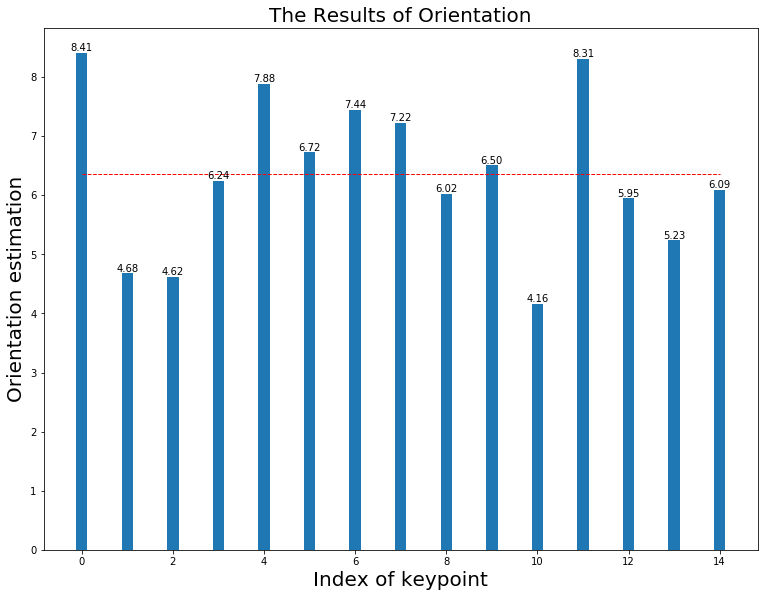

Final result: [     8.4099      4.6775      4.6168      6.2424      7.8786      6.7239      7.4424      7.2208       6.021      6.5039      4.1602      8.3051      5.9482      5.2342      6.0886]
FD Rotate(6.4):mean(6.365), median(6.217) in 0.011
The HoG estimation when (6.4) is  6


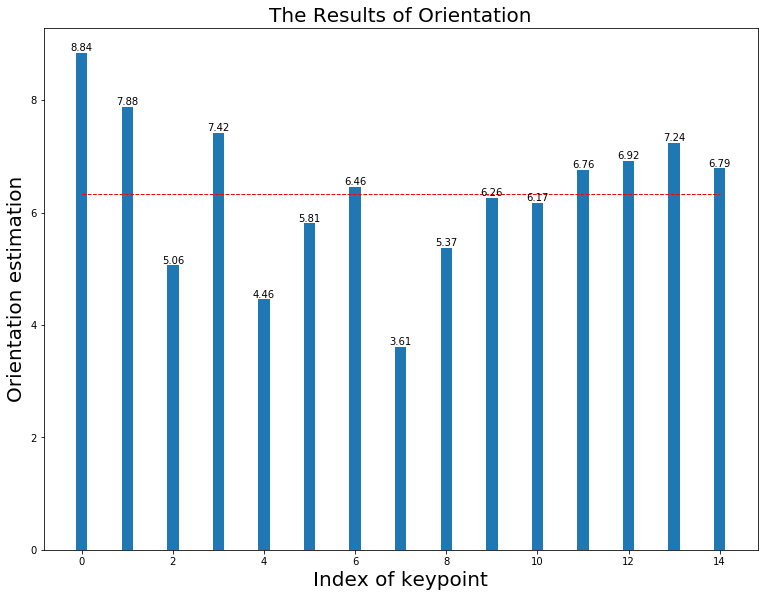

Final result: [     8.8429      7.8758      5.0623      7.4162      4.4574      5.8081      6.4627      3.6094      5.3701      6.2552      6.1673      6.7552      6.9229      7.2447      6.7853]
FD Rotate(6.5):mean(6.336), median(6.510) in 0.011
The HoG estimation when (6.5) is  7


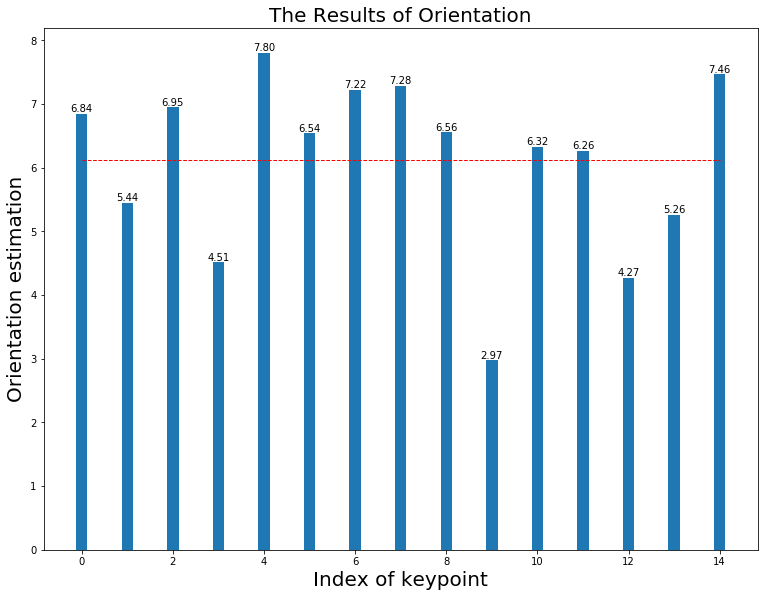

Final result: [     6.8419      5.4434      6.9472      4.5146      7.8039      6.5377      7.2159      7.2806      6.5562      2.9724       6.321      6.2649      4.2695      5.2636      7.4639]
FD Rotate(6.6):mean(6.113), median(6.662) in 0.011
The HoG estimation when (6.6) is  7


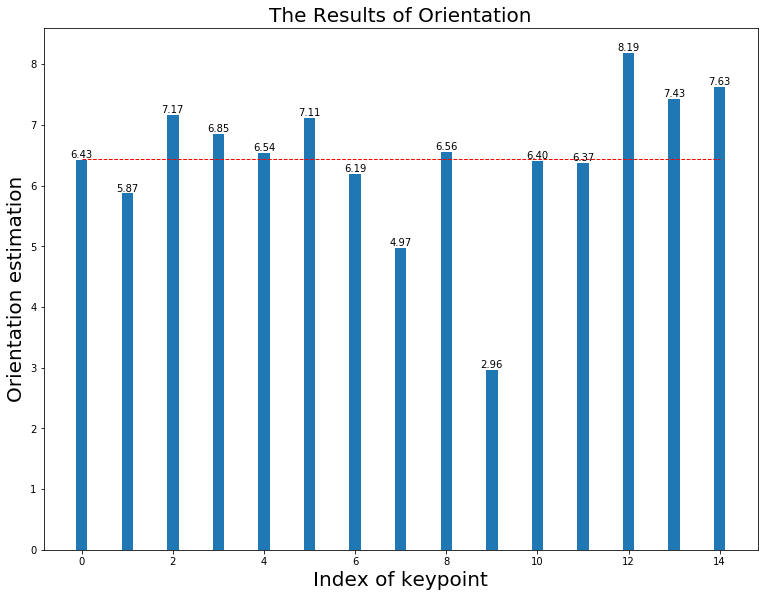

Final result: [     6.4271      5.8718       7.166      6.8489      6.5363      7.1148      6.1869      4.9712      6.5587      2.9637      6.4029      6.3707      8.1867      7.4268      7.6272]
FD Rotate(6.7):mean(6.444), median(6.693) in 0.011
The HoG estimation when (6.7) is  7


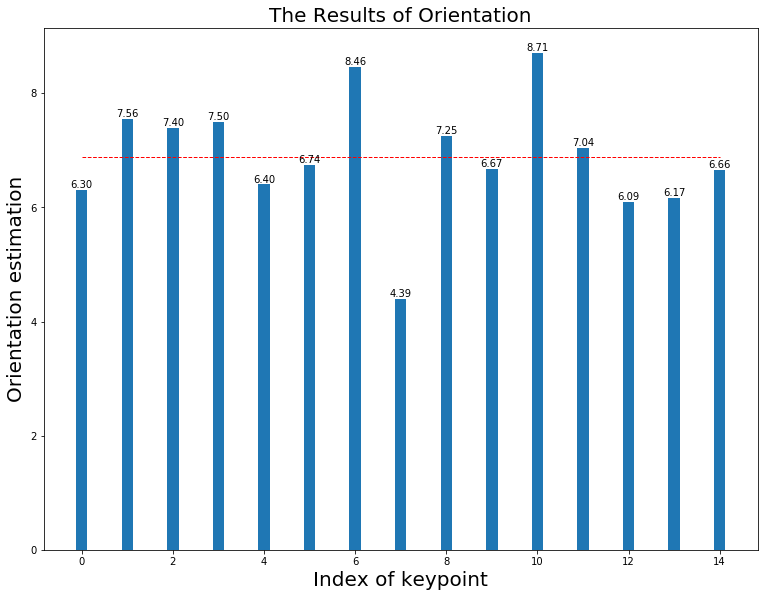

Final result: [     6.3008      7.5564      7.3951      7.5015      6.4041      6.7445      8.4634      4.3929      7.2534      6.6743      8.7084      7.0414      6.0948      6.1651      6.6624]
FD Rotate(6.8):mean(6.891), median(7.069) in 0.011
The HoG estimation when (6.8) is  7


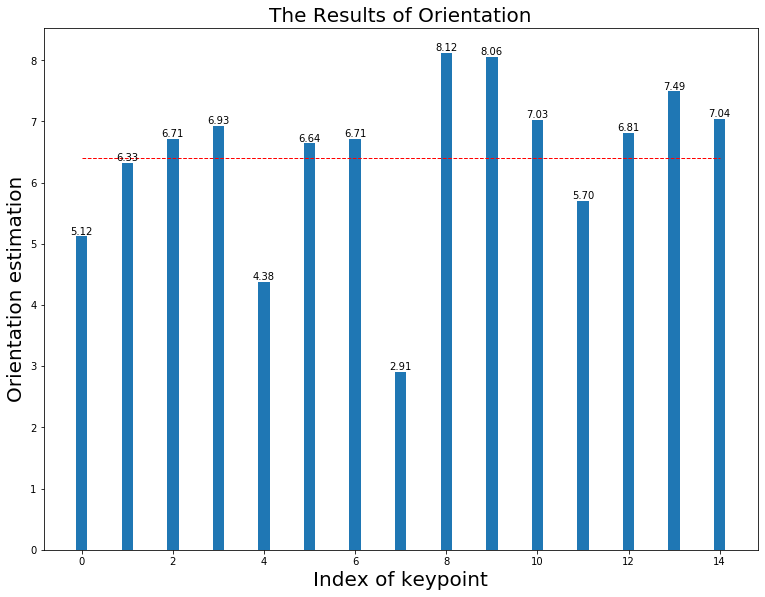

Final result: [     5.1205      6.3273      6.7122      6.9256      4.3774      6.6421       6.715      2.9097      8.1221      8.0596      7.0265       5.705      6.8114      7.4908      7.0442]
FD Rotate(6.9):mean(6.399), median(6.823) in 0.010
The HoG estimation when (6.9) is  7


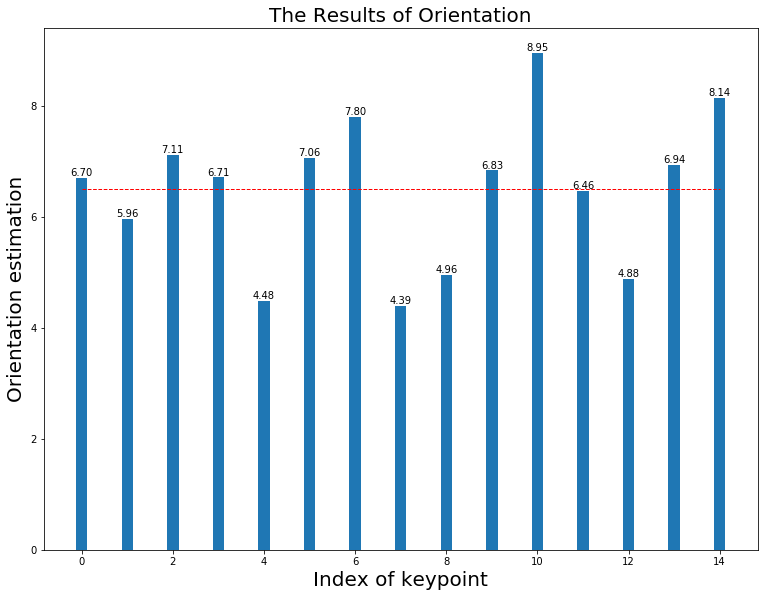

Final result: [     6.7003      5.9561      7.1089      6.7092      4.4775      7.0637       7.795      4.3944      4.9561      6.8348      8.9517      6.4636      4.8816      6.9386       8.139]
FD Rotate(7.0):mean(6.491), median(6.629) in 0.011
The HoG estimation when (7.0) is  7


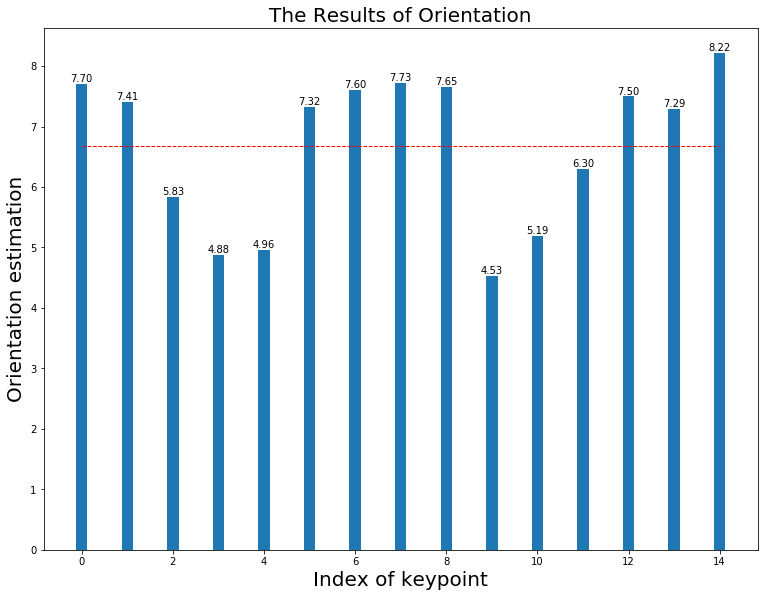

Final result: [     7.6991      7.4099      5.8339      4.8817      4.9613      7.3239      7.6029      7.7258      7.6538      4.5271      5.1882      6.2951      7.5001      7.2876      8.2191]
FD Rotate(7.1):mean(6.674), median(7.323) in 0.010
The HoG estimation when (7.1) is  7


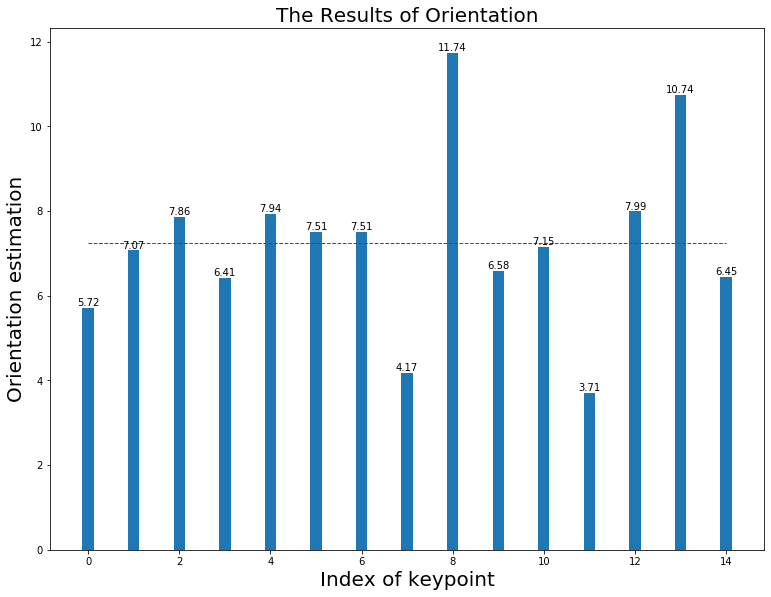

Final result: [     5.7195      7.0731      7.8586      6.4141      7.9372      7.5083      7.5066      4.1744      11.737       6.583      7.1502      3.7108      7.9939      10.745      6.4503]
FD Rotate(7.2):mean(7.237), median(7.109) in 0.011
The HoG estimation when (7.2) is  7


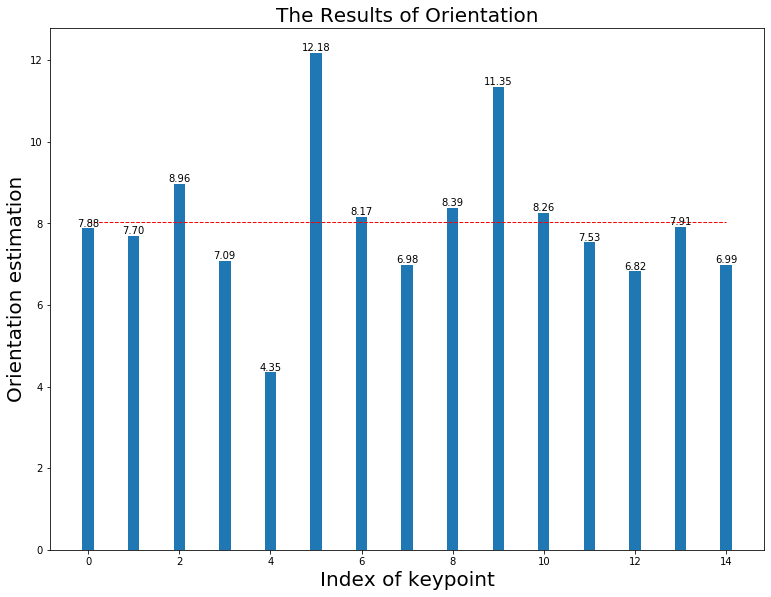

Final result: [      7.879      7.6996      8.9621      7.0888      4.3453       12.18      8.1675      6.9788      8.3852      11.353      8.2632      7.5313      6.8244      7.9114       6.987]
FD Rotate(7.3):mean(8.037), median(7.723) in 0.010
The HoG estimation when (7.3) is  7


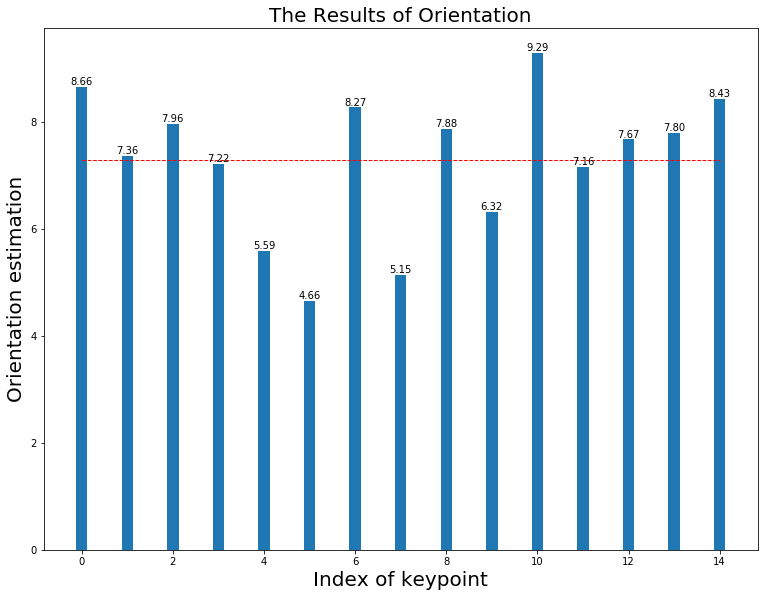

Final result: [     8.6617      7.3612        7.96      7.2217       5.589      4.6554      8.2745      5.1472      7.8767      6.3222      9.2929      7.1645      7.6731      7.8013      8.4324]
FD Rotate(7.4):mean(7.296), median(7.837) in 0.010
The HoG estimation when (7.4) is  8


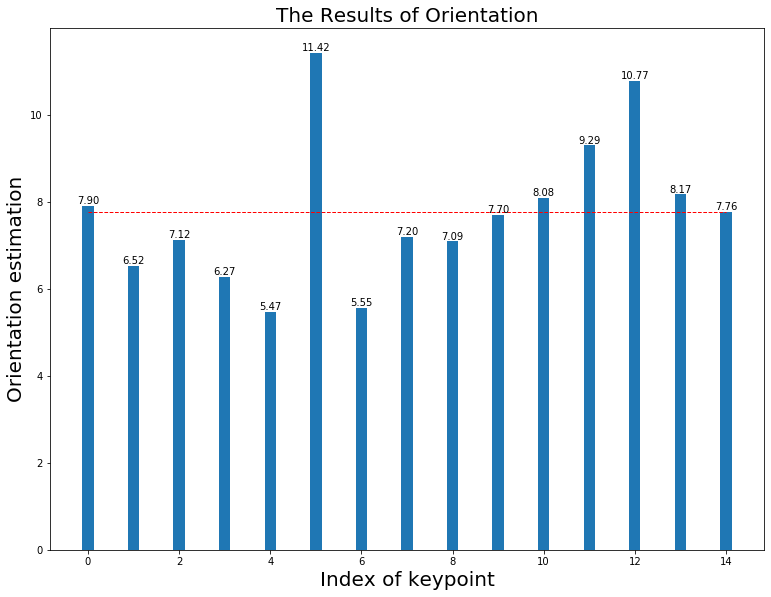

Final result: [     7.9018      6.5184      7.1194      6.2691      5.4738      11.422      5.5518      7.1962       7.086      7.7011      8.0844      9.2942      10.768      8.1708      7.7626]
FD Rotate(7.5):mean(7.755), median(7.555) in 0.011
The HoG estimation when (7.5) is  8


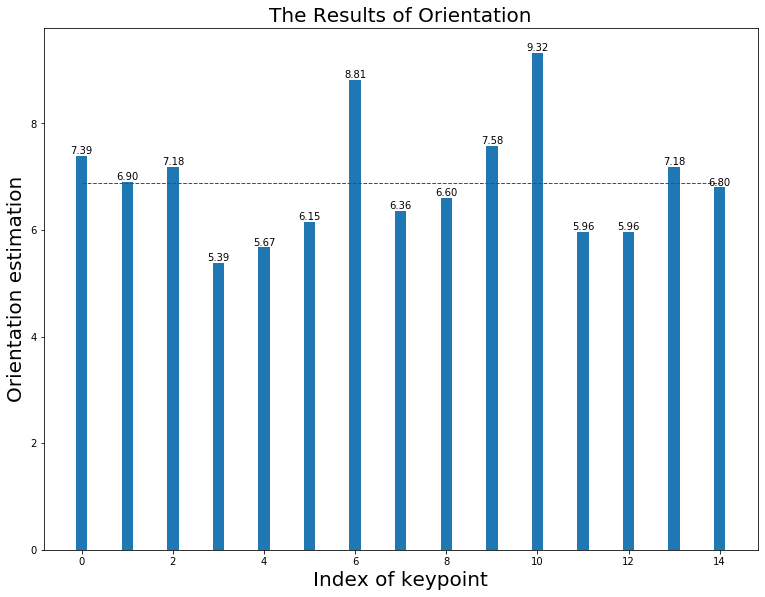

Final result: [     7.3919      6.9014       7.183      5.3854      5.6734      6.1536      8.8111      6.3629      6.6048       7.576      9.3217      5.9617      5.9584      7.1817      6.7995]
FD Rotate(7.6):mean(6.884), median(6.549) in 0.011
The HoG estimation when (7.6) is  8


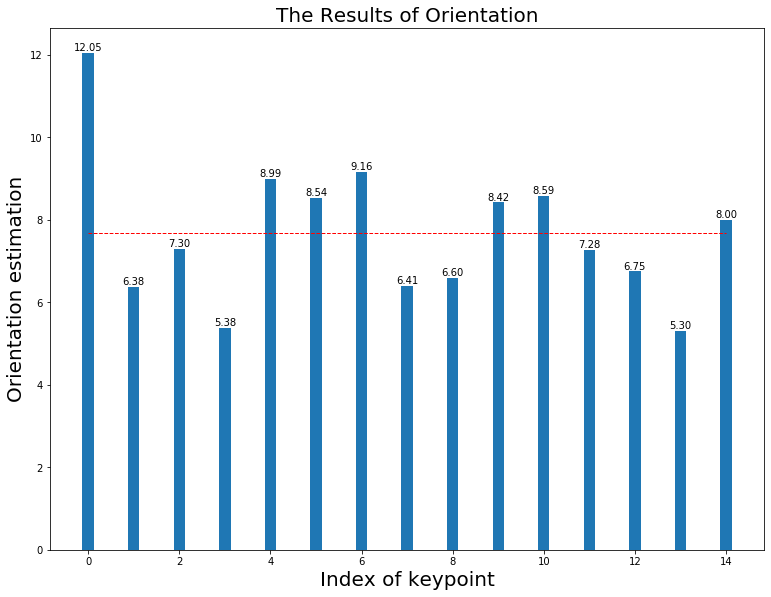

Final result: [      12.05       6.382      7.3011      5.3842      8.9902      8.5362      9.1609      6.4073      6.5956      8.4216      8.5857      7.2805      6.7527       5.303      7.9963]
FD Rotate(7.7):mean(7.677), median(7.364) in 0.011
The HoG estimation when (7.7) is  8


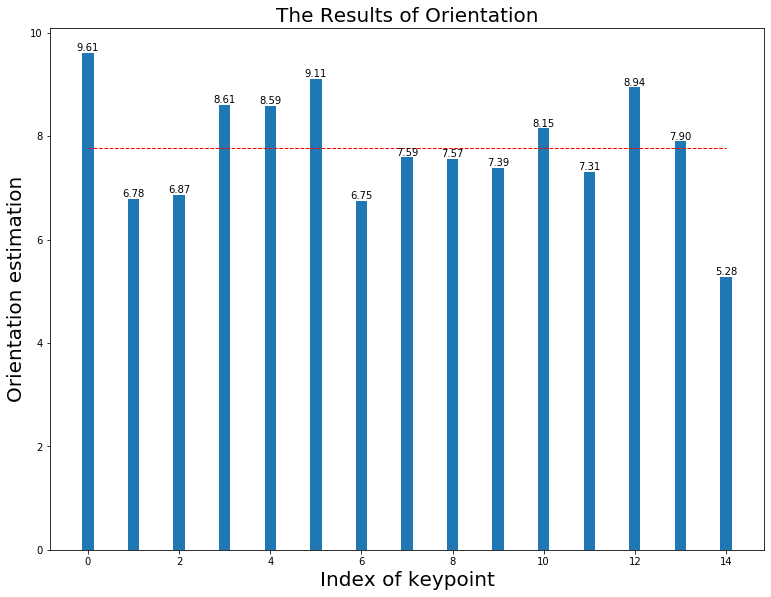

Final result: [     9.6135       6.782      6.8651      8.6055      8.5871      9.1065      6.7522      7.5915      7.5659      7.3864      8.1521      7.3135      8.9443      7.8985      5.2784]
FD Rotate(7.8):mean(7.763), median(7.812) in 0.011
The HoG estimation when (7.8) is  8


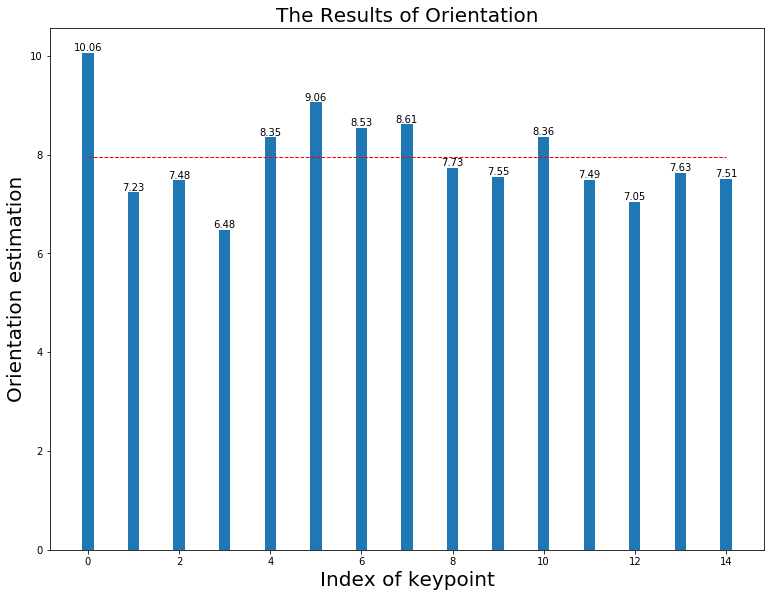

Final result: [      10.06      7.2331      7.4759      6.4817      8.3487      9.0573      8.5329      8.6093      7.7313       7.554      8.3563       7.491      7.0491      7.6309      7.5141]
FD Rotate(7.9):mean(7.942), median(7.790) in 0.010
The HoG estimation when (7.9) is  8


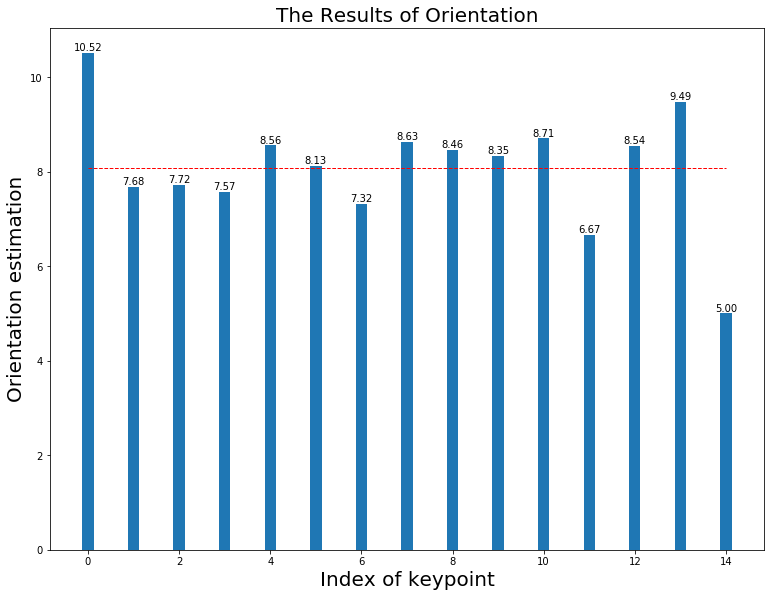

Final result: [      10.52      7.6757      7.7171      7.5713      8.5617      8.1263      7.3167      8.6349      8.4594      8.3462      8.7094      6.6671       8.543      9.4884      5.0042]
FD Rotate(8.0):mean(8.089), median(8.140) in 0.011
The HoG estimation when (8.0) is  8


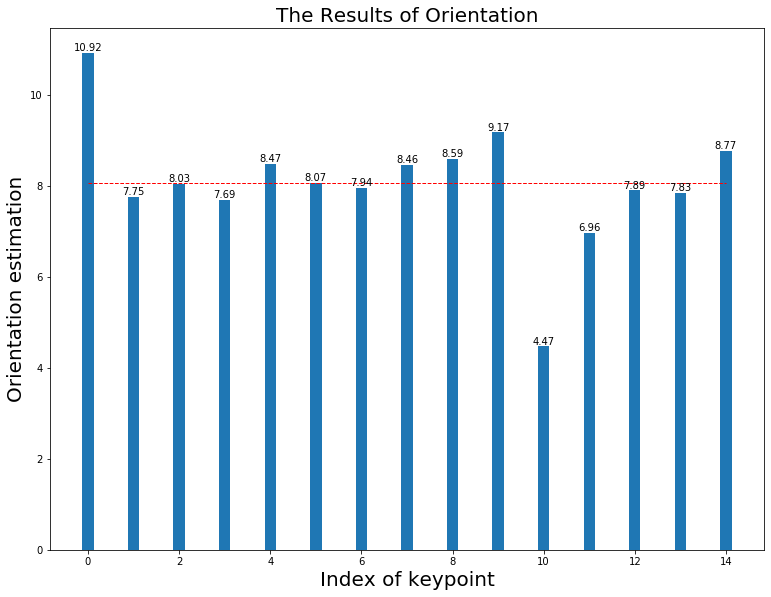

Final result: [     10.918       7.754      8.0336      7.6886      8.4742      8.0679      7.9427      8.4583      8.5915      9.1683      4.4661       6.959      7.8937      7.8332      8.7707]
FD Rotate(8.1):mean(8.068), median(8.126) in 0.011
The HoG estimation when (8.1) is  8


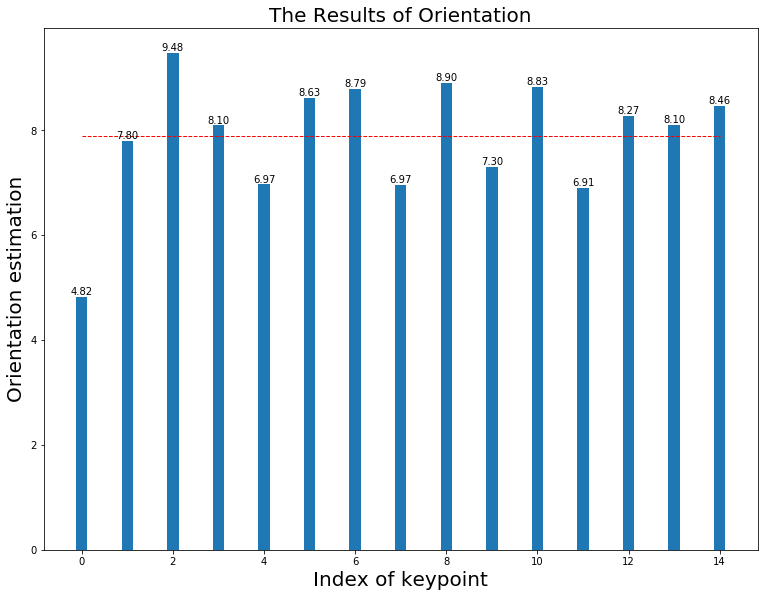

Final result: [     4.8201      7.7965      9.4793       8.095      6.9683      8.6252      8.7865      6.9662      8.9034      7.3019      8.8315       6.909      8.2703      8.0998      8.4617]
FD Rotate(8.2):mean(7.888), median(8.107) in 0.010
The HoG estimation when (8.2) is  8


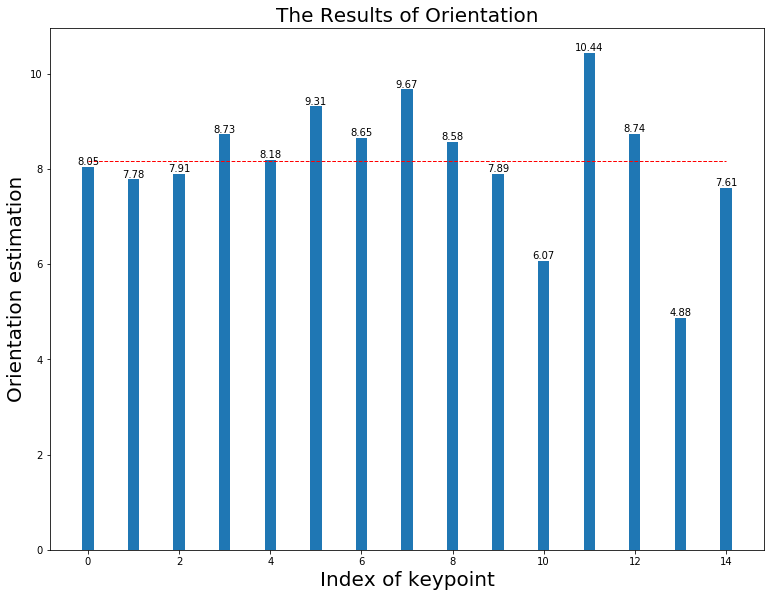

Final result: [     8.0472      7.7829      7.9051      8.7291       8.184      9.3129      8.6481      9.6718      8.5754      7.8942      6.0739      10.441      8.7364      4.8769      7.6076]
FD Rotate(8.3):mean(8.166), median(8.425) in 0.010
The HoG estimation when (8.3) is  8


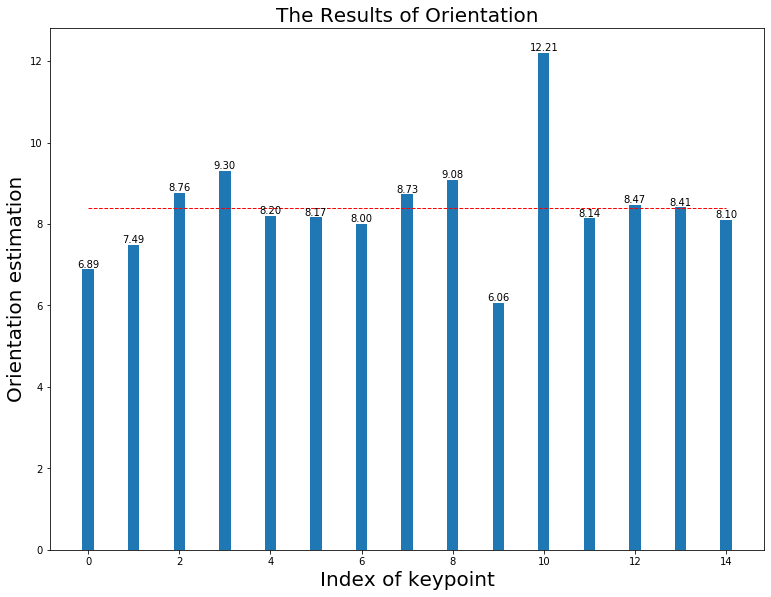

Final result: [     6.8897      7.4946      8.7637      9.2975      8.1969      8.1657      7.9971      8.7274      9.0766      6.0606      12.206      8.1367       8.466      8.4124      8.1038]
FD Rotate(8.4):mean(8.400), median(8.287) in 0.010
The HoG estimation when (8.4) is  9


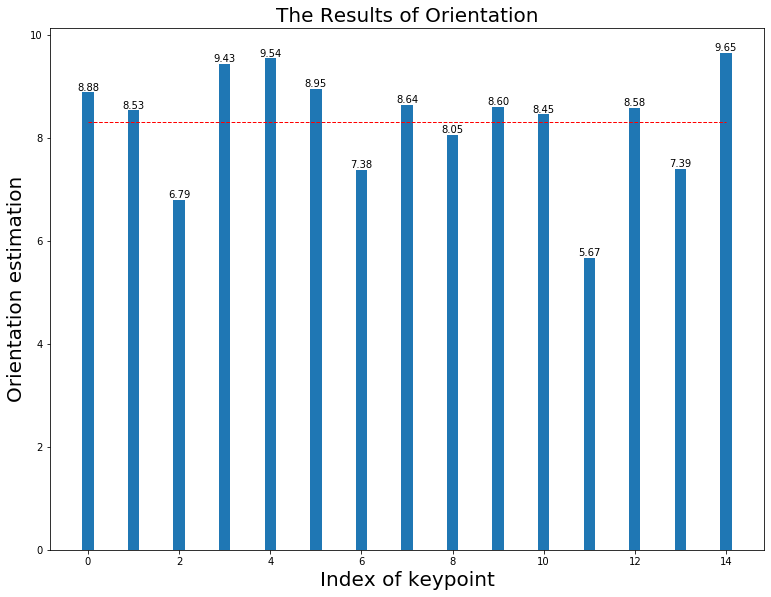

Final result: [      8.882      8.5305      6.7927      9.4297      9.5412      8.9482      7.3807      8.6385      8.0549      8.5986      8.4519       5.666      8.5783       7.392      9.6482]
FD Rotate(8.5):mean(8.302), median(8.491) in 0.010
The HoG estimation when (8.5) is  9


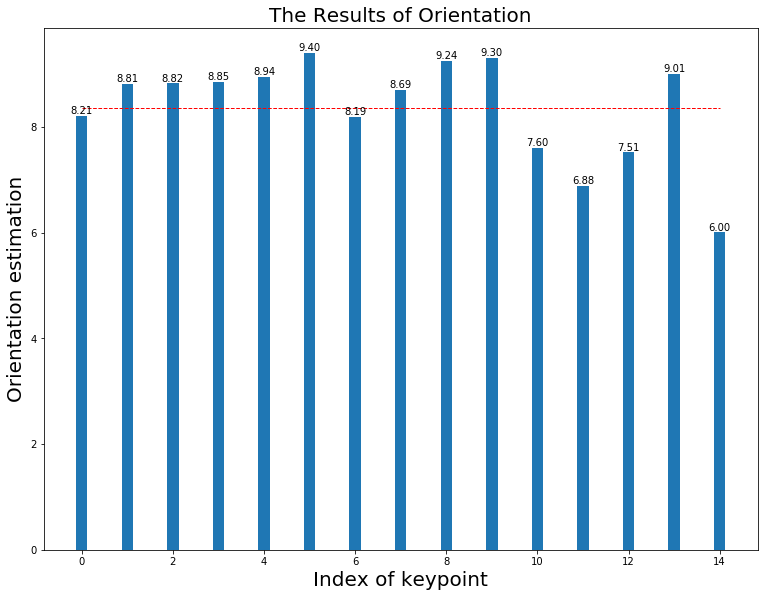

Final result: [     8.2126      8.8068      8.8195       8.853      8.9426      9.4001      8.1881      8.6924      9.2404      9.3021      7.6041      6.8844      7.5144      9.0085      6.0029]
FD Rotate(8.6):mean(8.365), median(8.534) in 0.010
The HoG estimation when (8.6) is  9


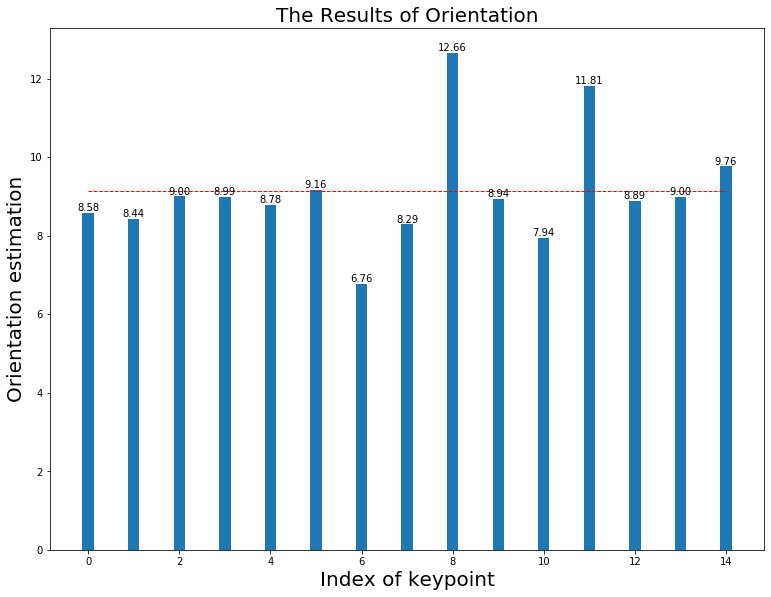

Final result: [     8.5833      8.4357      9.0017      8.9899      8.7781      9.1629      6.7641      8.2861      12.657      8.9372      7.9421      11.806      8.8938       8.996      9.7616]
FD Rotate(8.7):mean(9.133), median(8.814) in 0.010
The HoG estimation when (8.7) is  9


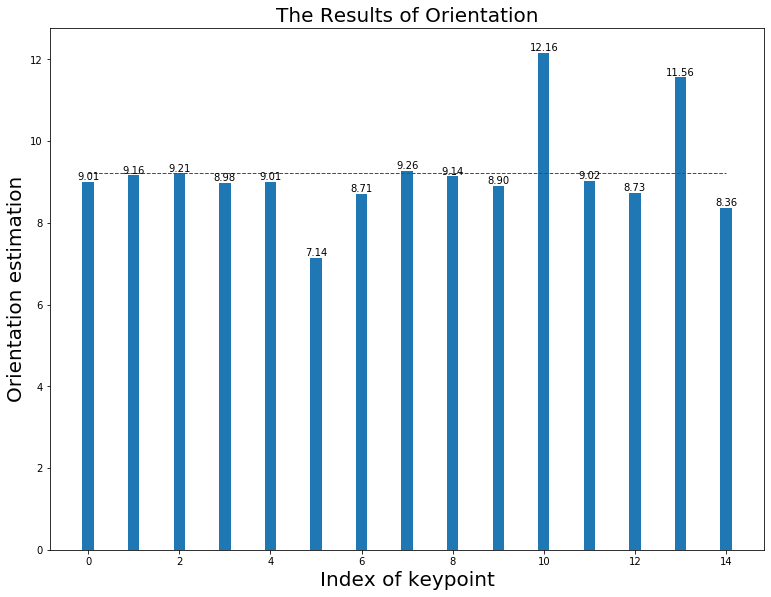

Final result: [     9.0071       9.162      9.2082       8.983      9.0068      7.1408      8.7144       9.265      9.1373      8.8973      12.161      9.0223      8.7325      11.557      8.3576]
FD Rotate(8.8):mean(9.223), median(8.818) in 0.010
The HoG estimation when (8.8) is  9


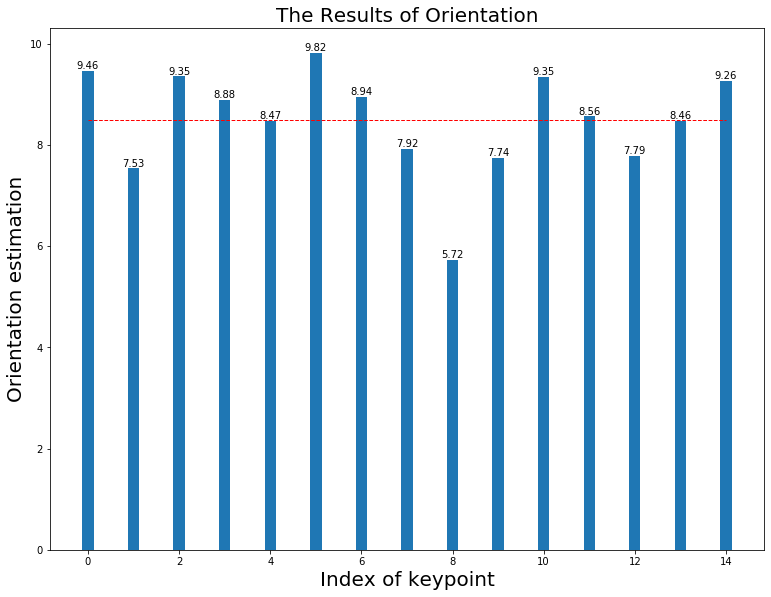

Final result: [     9.4643      7.5329      9.3487      8.8841      8.4725      9.8166      8.9421       7.921      5.7233      7.7414      9.3453      8.5585      7.7869      8.4648      9.2552]
FD Rotate(8.9):mean(8.484), median(8.681) in 0.011
The HoG estimation when (8.9) is  9


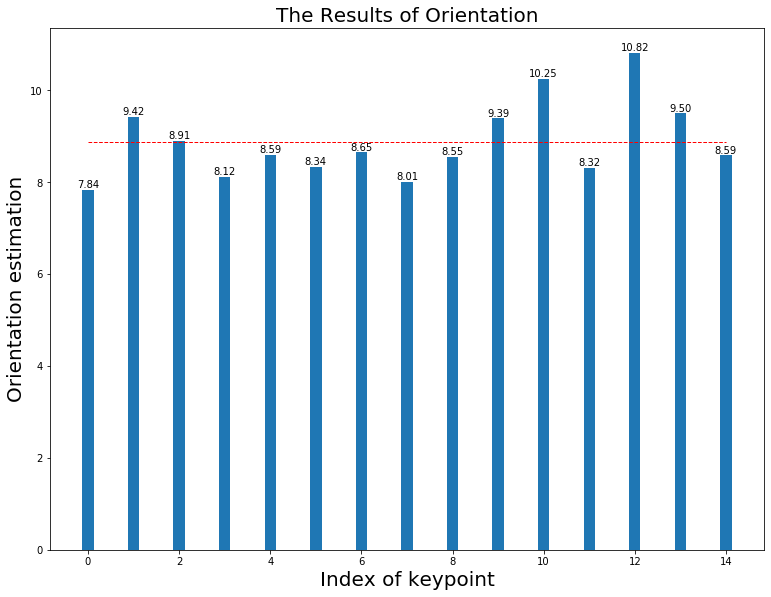

Final result: [     7.8369      9.4229      8.9079      8.1225      8.5901      8.3399      8.6539      8.0072      8.5497      9.3944       10.25      8.3166      10.821      9.5042      8.5866]
FD Rotate(9.0):mean(8.887), median(8.749) in 0.011
The HoG estimation when (9.0) is  9


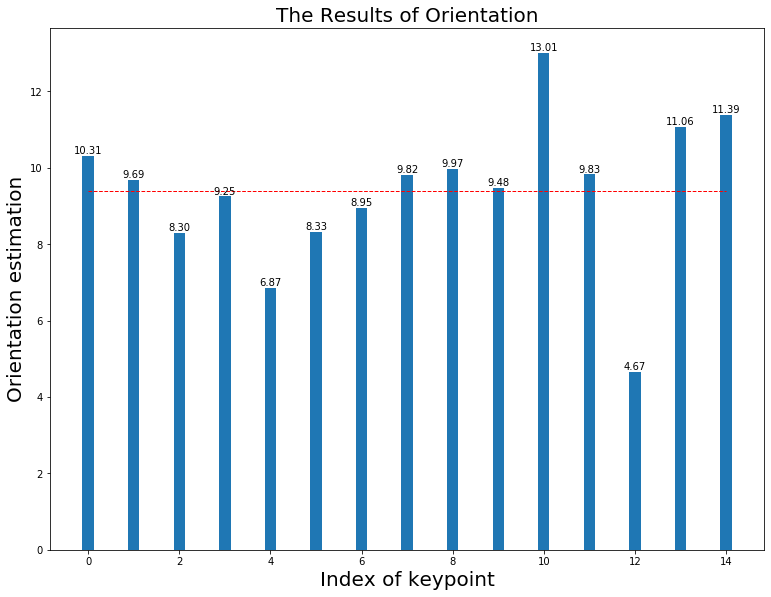

Final result: [     10.312      9.6852      8.2957      9.2529      6.8671      8.3276      8.9538      9.8209      9.9727      9.4828      13.013      9.8292      4.6675      11.064      11.395]
FD Rotate(9.1):mean(9.396), median(9.699) in 0.014
The HoG estimation when (9.1) is  9


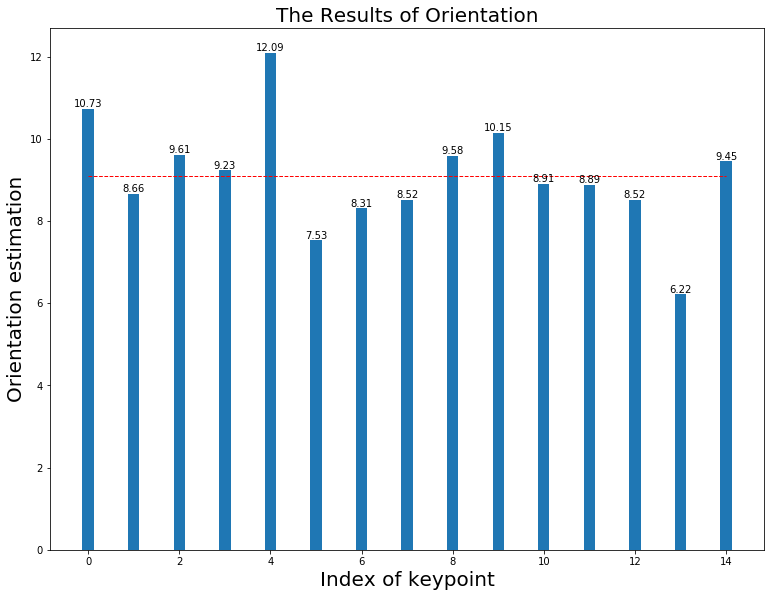

Final result: [     10.733      8.6584      9.6109      9.2345      12.092      7.5283      8.3081      8.5214      9.5801      10.147      8.9093      8.8876      8.5161      6.2166        9.45]
FD Rotate(9.2):mean(9.093), median(9.083) in 0.011
The HoG estimation when (9.2) is  9


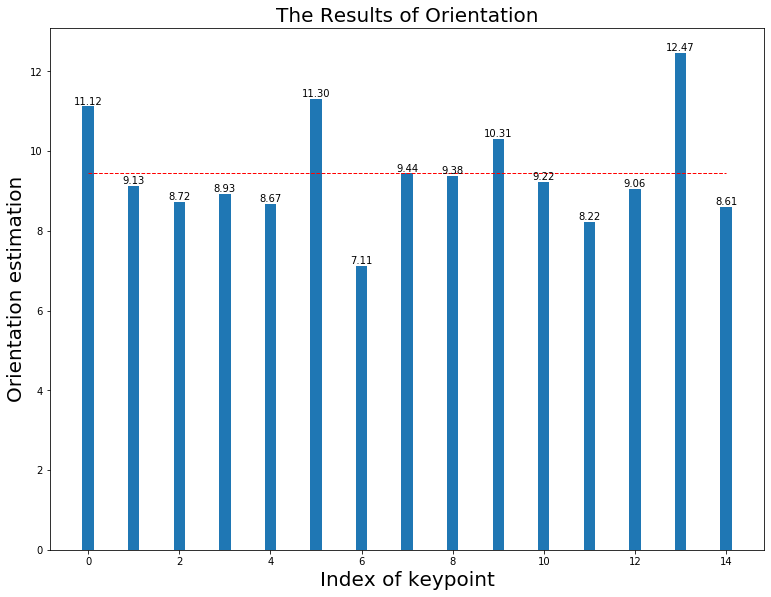

Final result: [      11.12      9.1336      8.7173      8.9319      8.6674        11.3      7.1148       9.441      9.3848       10.31      9.2216      8.2193      9.0594      12.465      8.6094]
FD Rotate(9.3):mean(9.446), median(9.235) in 0.011
The HoG estimation when (9.3) is  9


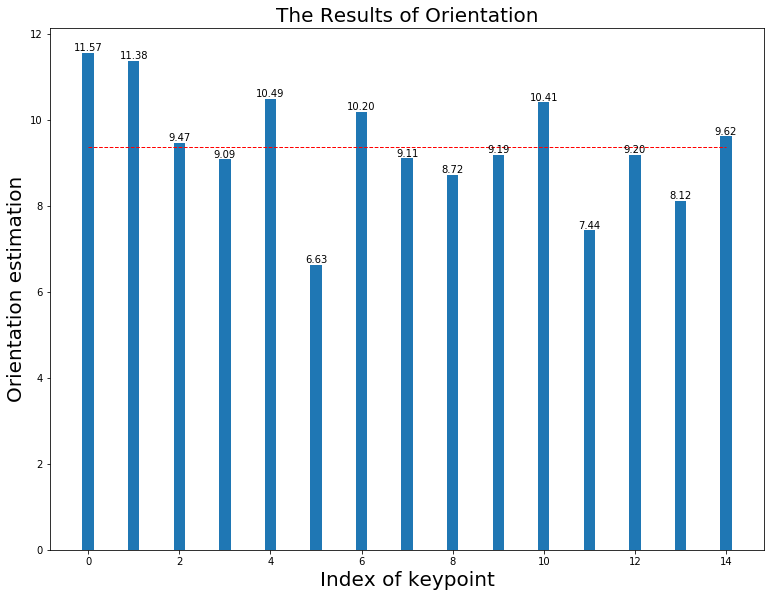

Final result: [     11.568      11.385      9.4696      9.0874      10.495      6.6346      10.198      9.1082       8.721      9.1896      10.413      7.4351      9.1955      8.1214      9.6215]
FD Rotate(9.4):mean(9.376), median(9.255) in 0.011
The HoG estimation when (9.4) is  9


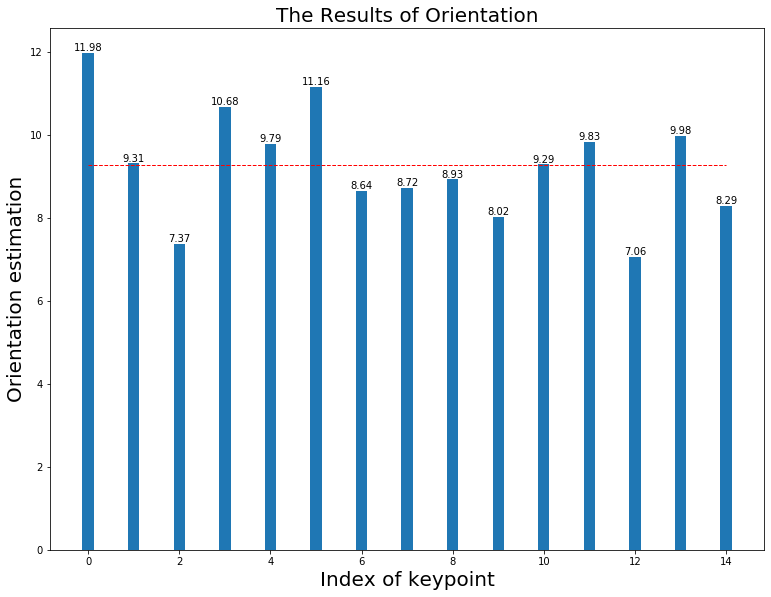

Final result: [     11.977      9.3137      7.3693      10.679      9.7891      11.161      8.6403      8.7178       8.927      8.0204      9.2899      9.8311      7.0576      9.9803      8.2881]
FD Rotate(9.5):mean(9.269), median(9.231) in 0.011
The HoG estimation when (9.5) is 10


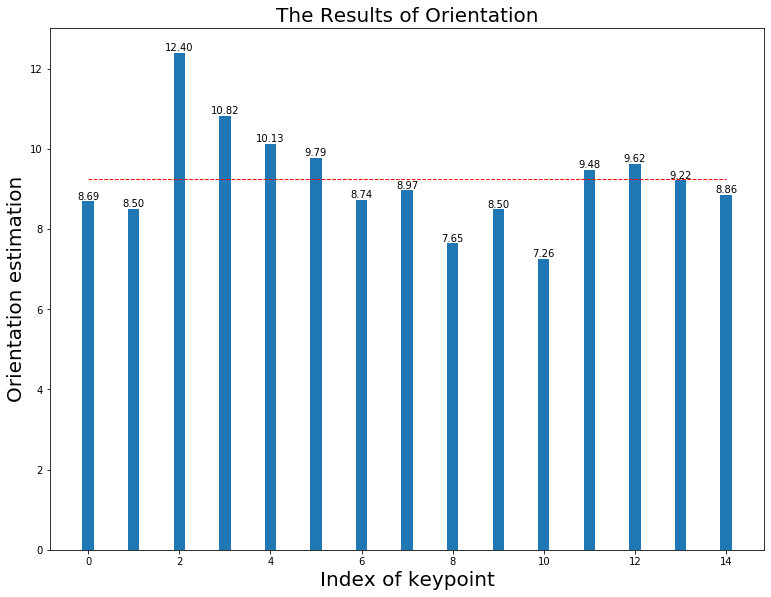

Final result: [     8.6946      8.5025      12.401      10.821      10.127      9.7863      8.7367      8.9672       7.647      8.4962      7.2629      9.4785      9.6232      9.2171      8.8611]
FD Rotate(9.6):mean(9.241), median(9.016) in 0.011
The HoG estimation when (9.6) is 10


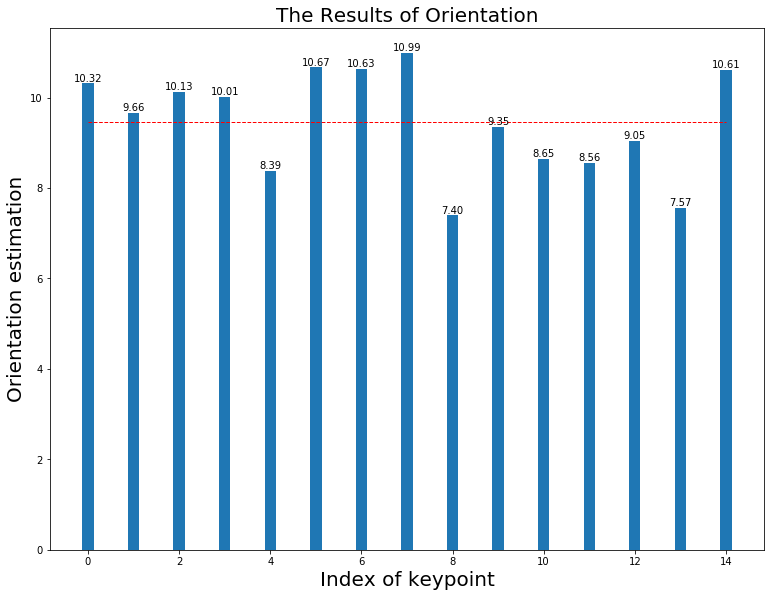

Final result: [     10.316      9.6636       10.13      10.014      8.3859      10.668      10.627      10.991       7.397      9.3541       8.652      8.5575      9.0463      7.5662      10.606]
FD Rotate(9.7):mean(9.465), median(9.770) in 0.011
The HoG estimation when (9.7) is 10


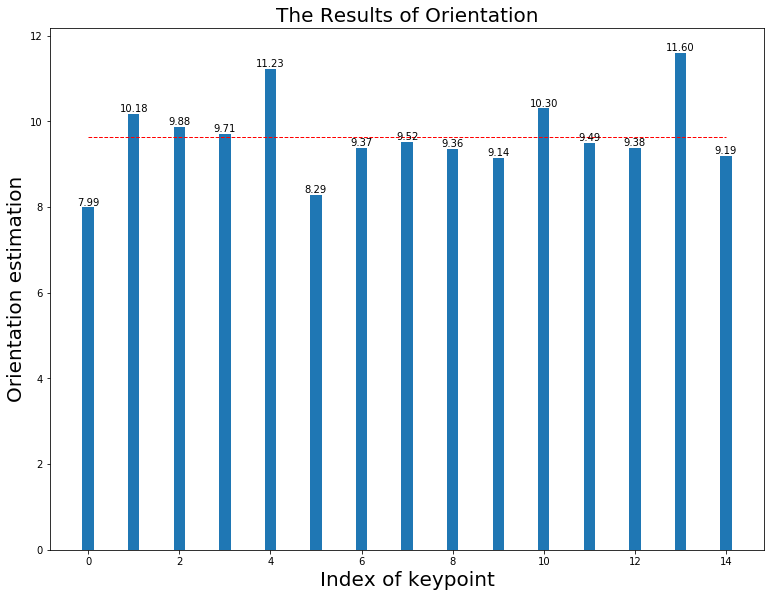

Final result: [     7.9916      10.178      9.8776      9.7071      11.228      8.2895      9.3741      9.5232      9.3568      9.1403      10.299      9.4918      9.3805      11.599      9.1949]
FD Rotate(9.8):mean(9.642), median(9.502) in 0.010
The HoG estimation when (9.8) is 10


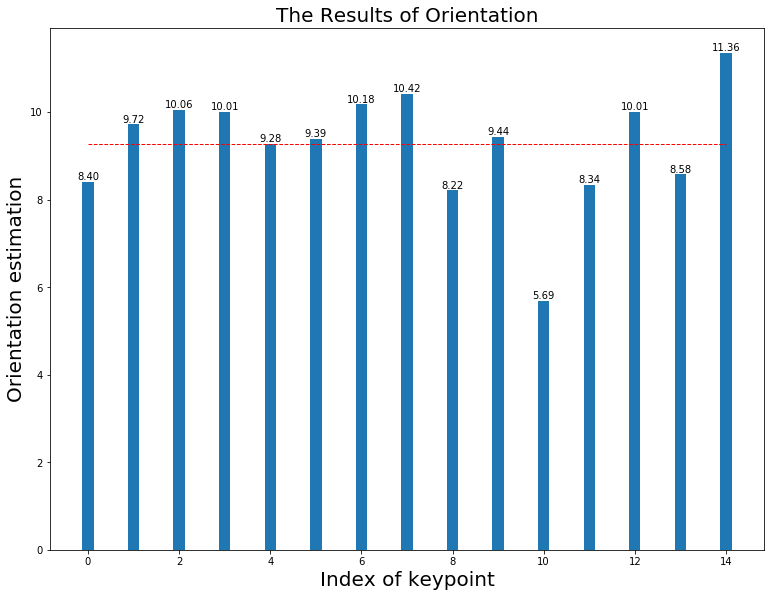

Final result: [     8.4021      9.7224      10.062      10.011      9.2831      9.3888       10.18      10.425      8.2151      9.4428      5.6919      8.3352      10.005      8.5804      11.358]
FD Rotate(9.9):mean(9.274), median(9.529) in 0.011
The HoG estimation when (9.9) is 10


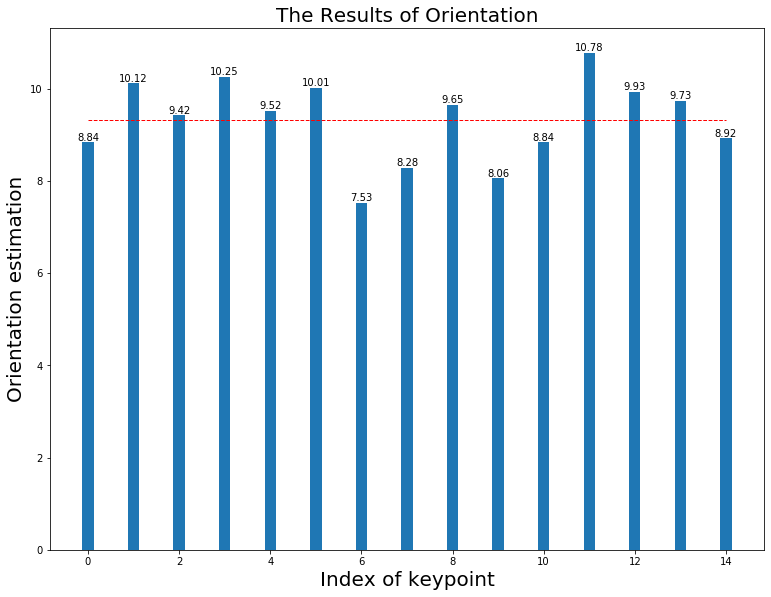

Final result: [     8.8366      10.119      9.4227      10.251      9.5223      10.013      7.5317      8.2779      9.6463      8.0561       8.836      10.779      9.9338      9.7337      8.9231]
FD Rotate(10.0):mean(9.325), median(9.325) in 0.011
The HoG estimation when (10.0) is 10


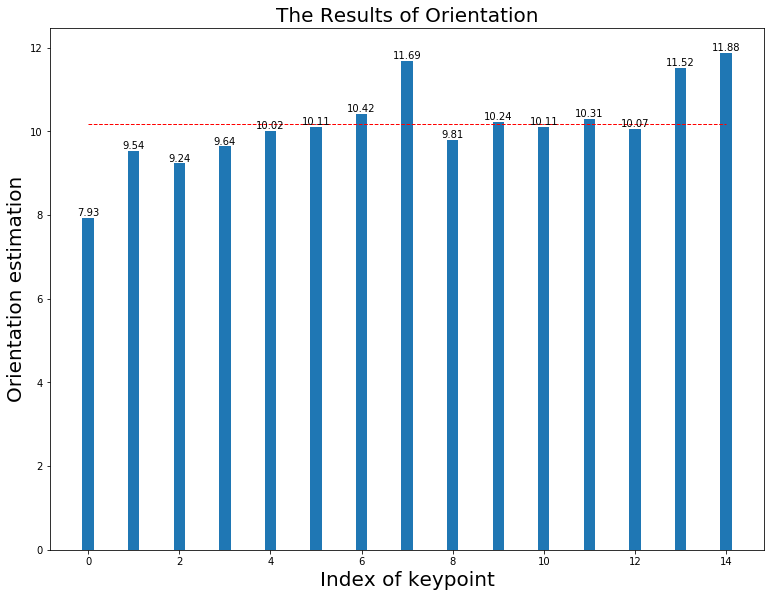

Final result: [     7.9265      9.5391      9.2396      9.6426       10.02      10.108      10.419      11.694      9.8069      10.235      10.112       10.31      10.066      11.519      11.881]
FD Rotate(10.1):mean(10.168), median(10.328) in 0.011
The HoG estimation when (10.1) is 10


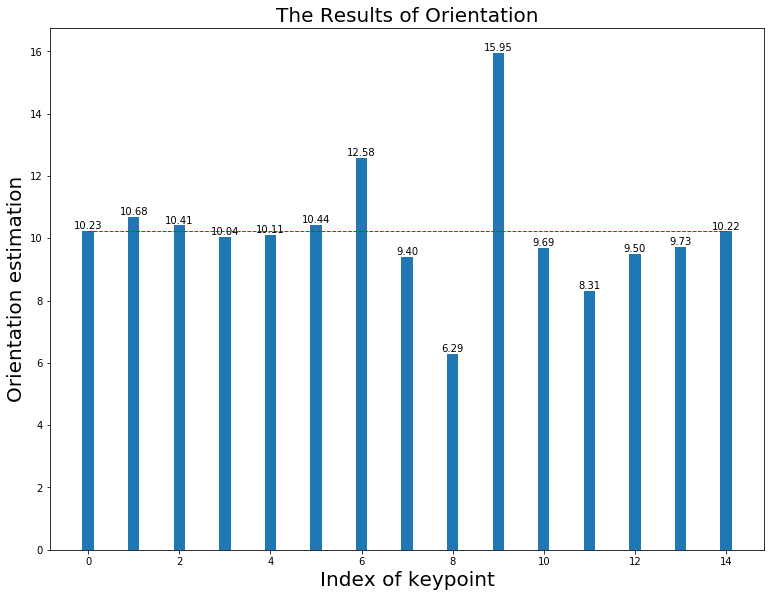

Final result: [     10.229       10.68      10.408      10.044      10.112      10.438      12.585      9.4009      6.2866      15.951      9.6883      8.3079      9.4988       9.727      10.217]
FD Rotate(10.2):mean(10.238), median(9.896) in 0.011
The HoG estimation when (10.2) is 10


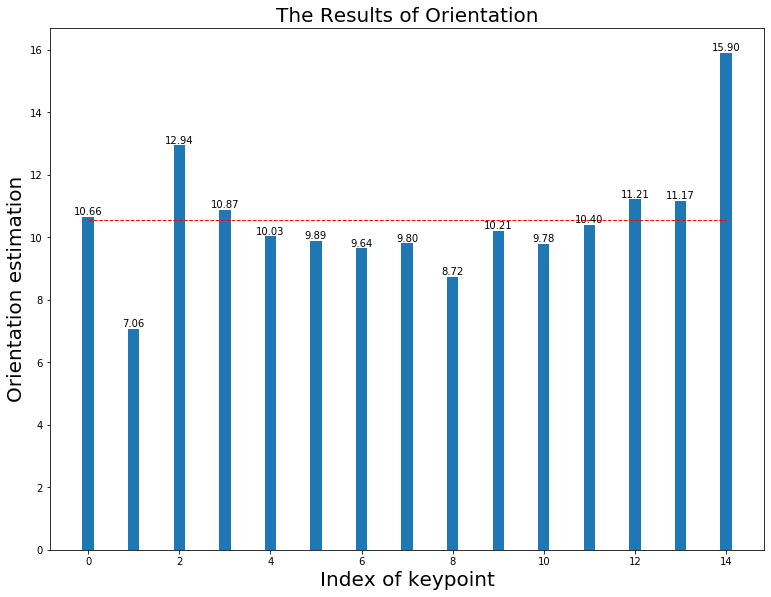

Final result: [     10.657       7.064      12.939       10.87      10.033      9.8871       9.642      9.8013      8.7218       10.21      9.7792      10.405      11.212       11.17      15.903]
FD Rotate(10.3):mean(10.553), median(10.199) in 0.011
The HoG estimation when (10.3) is 10


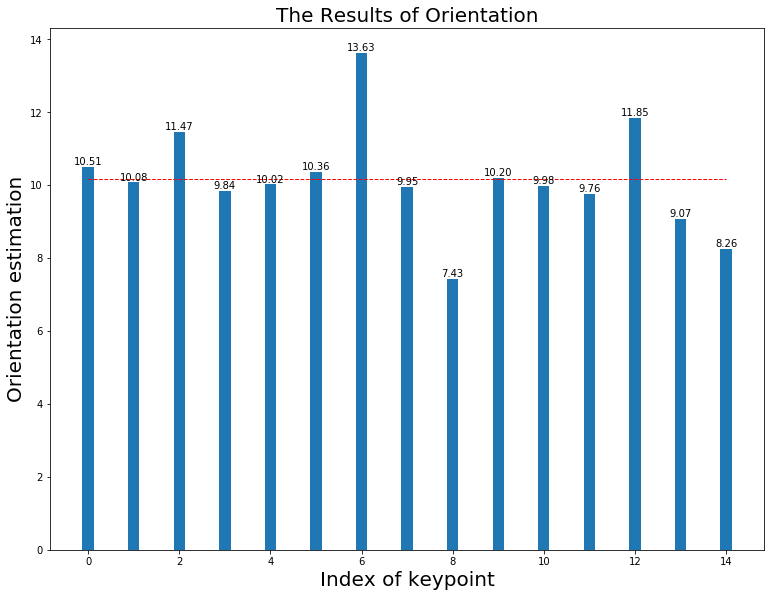

Final result: [     10.508      10.075      11.471      9.8433      10.023       10.36      13.632      9.9476       7.426      10.195      9.9759      9.7555      11.852      9.0744      8.2561]
FD Rotate(10.4):mean(10.160), median(10.103) in 0.012
The HoG estimation when (10.4) is 11


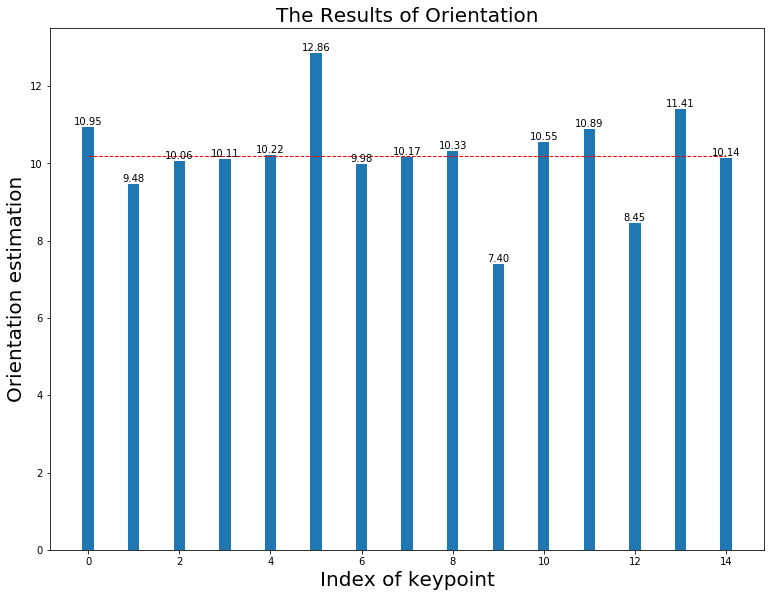

Final result: [     10.948      9.4758      10.059      10.112      10.217      12.862      9.9817      10.167      10.327      7.4031      10.552      10.894      8.4529      11.412      10.145]
FD Rotate(10.5):mean(10.201), median(10.211) in 0.012
The HoG estimation when (10.5) is 10


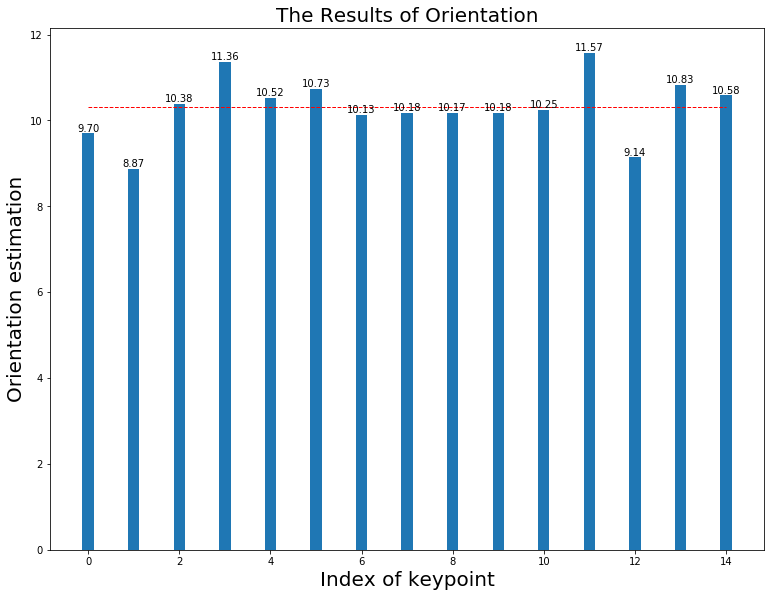

Final result: [     9.6976      8.8674       10.38      11.359      10.517      10.733      10.134      10.178      10.173      10.181       10.25      11.574      9.1413      10.835       10.58]
FD Rotate(10.6):mean(10.307), median(10.307) in 0.011
The HoG estimation when (10.6) is 11


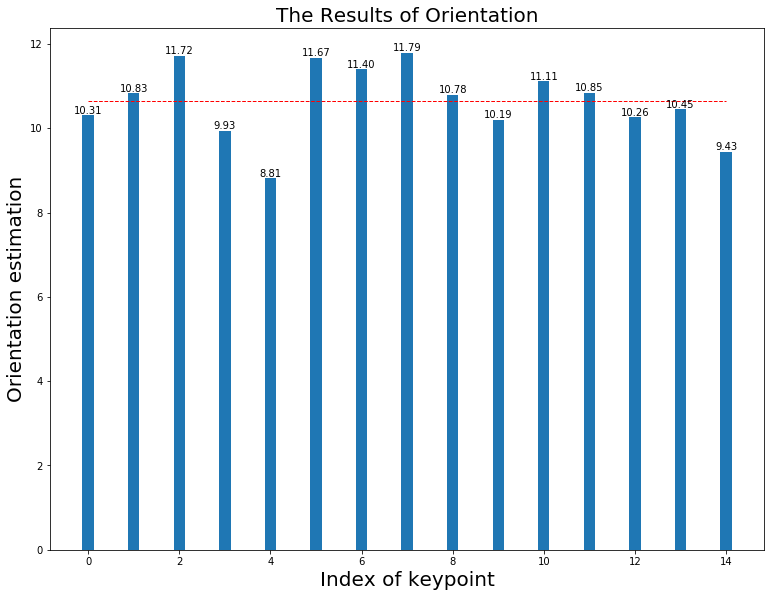

Final result: [     10.305      10.825       11.72      9.9321      8.8101      11.666      11.398       11.79      10.783      10.194       11.11      10.847      10.258      10.446      9.4345]
FD Rotate(10.7):mean(10.635), median(10.635) in 0.012
The HoG estimation when (10.7) is 11


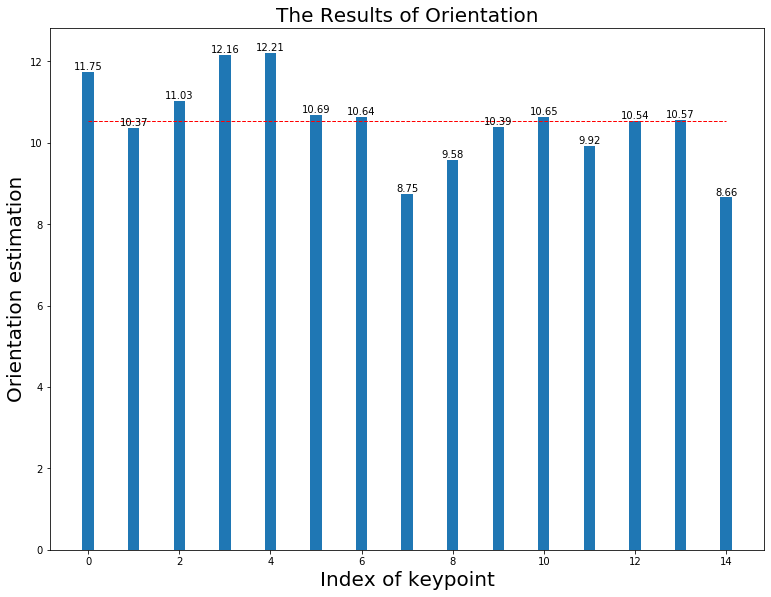

Final result: [     11.751      10.373       11.03      12.162      12.213      10.691      10.635      8.7535      9.5808      10.393      10.647      9.9213       10.54      10.567      8.6617]
FD Rotate(10.8):mean(10.528), median(10.528) in 0.012
The HoG estimation when (10.8) is 11


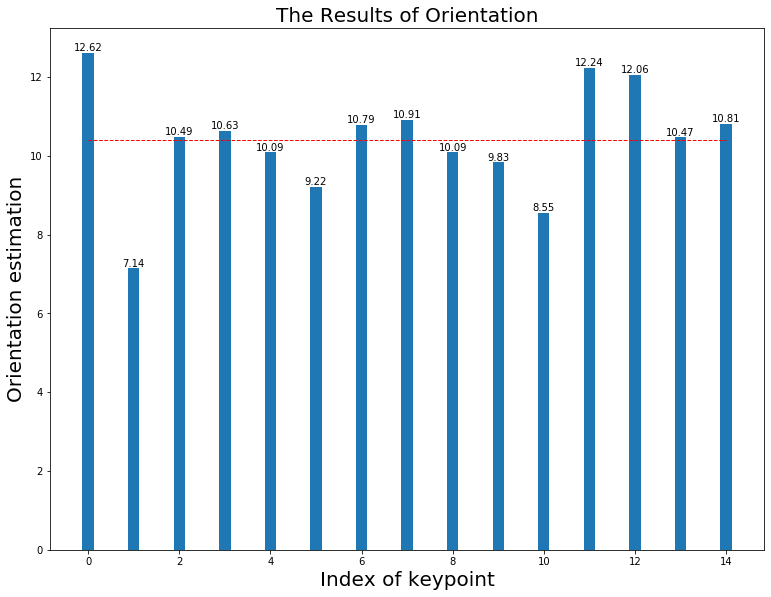

Final result: [     12.618      7.1424      10.487      10.629       10.09      9.2162      10.794      10.908      10.086      9.8339      8.5547      12.237      12.063      10.471      10.815]
FD Rotate(10.9):mean(10.396), median(10.476) in 0.012
The HoG estimation when (10.9) is 11


In [6]:
mode_list = ["SIFT", "ORB"]

sift_error = np.array([])
orb_error = np.array([])

for mode in mode_list:
    for rotate_angle in np.arange(1.0, 11.0, 0.1):
        M = cv2.getRotationMatrix2D(center, rotate_angle, 1)
        img_rotate = cv2.warpAffine(img_base, M, (w, h))
        
        fd_median, fd_mean, exe_time = angle_cal(img_orig, img_rotate, mode, show_results= True)
        
        print("FD Rotate({0:3.1f}):mean({1:5.3f}), median({2:5.3f}) in {3:.3f}"\
              .format(rotate_angle, fd_mean, fd_median, exe_time))
        
        # Gradients Method
        hist_base = HoG_cal(img_base, mag_thres= thres, bin_num= bins)
        hist_rotate = HoG_cal(img_rotate, mag_thres= thres, bin_num= bins)
        
        angle = angle_HoG(hist_base, hist_rotate, limits = angle_limits)
        print("The HoG estimation when ({0:.1f}) is {1:2d}" \
            .format(rotate_angle ,angle))
        
        if mode == "SIFT":
            sift_error = np.append(sift_error, np.abs(fd_mean - rotate_angle))
        elif mode == "ORB":
            orb_error = np.append(orb_error, np.abs(fd_mean - rotate_angle))

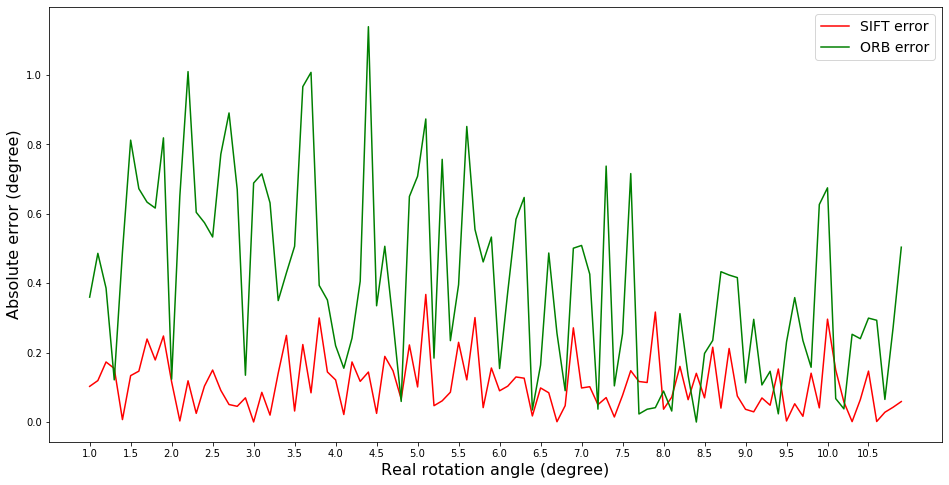

In [7]:
plt.figure(figsize=(16, 8))
index_error = np.arange(1.0, 11.0, 0.1)
plt.plot(index_error, sift_error, 'r', label = 'SIFT error')
plt.plot(index_error, orb_error, 'g', label = 'ORB error')
plt.legend(fontsize = 14)
plt.xlabel('Real rotation angle (degree)' , fontsize = 16)
plt.ylabel('Absolute error (degree)', fontsize = 16)
plt.xticks(np.arange(1.0, 11.0, 0.5))
plt.savefig('output/siftorb_error.png')
plt.show()

<font face='Ubuntu' size = 4>
    
## Histogram Filter
### SIFT 
Using sift as the \textbf{Feature descriptor}  


----------------------------------------------------------------------------------------------------0.5
FD Rotate(0.5):mean(0.548), median(0.548) in 0.098
The HoG estimation when (0.5) is  0
The HoG & FD estimation when (0.5) is 0.50


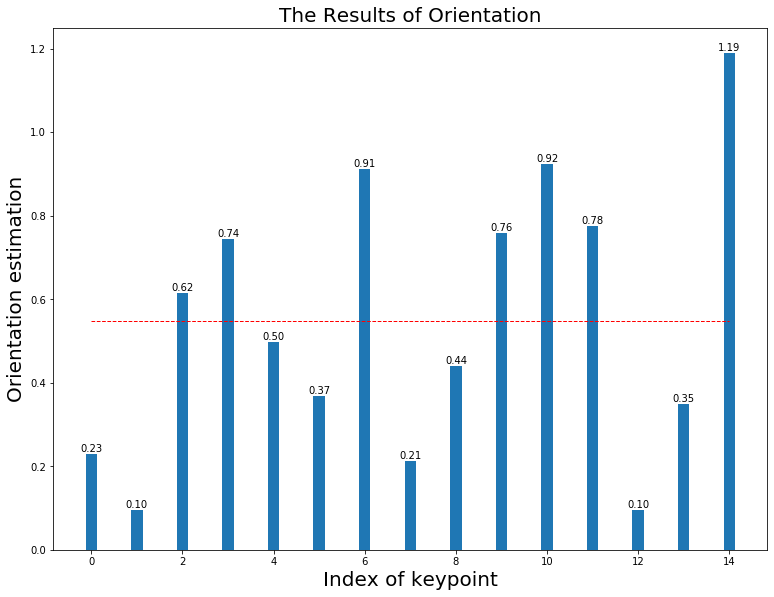

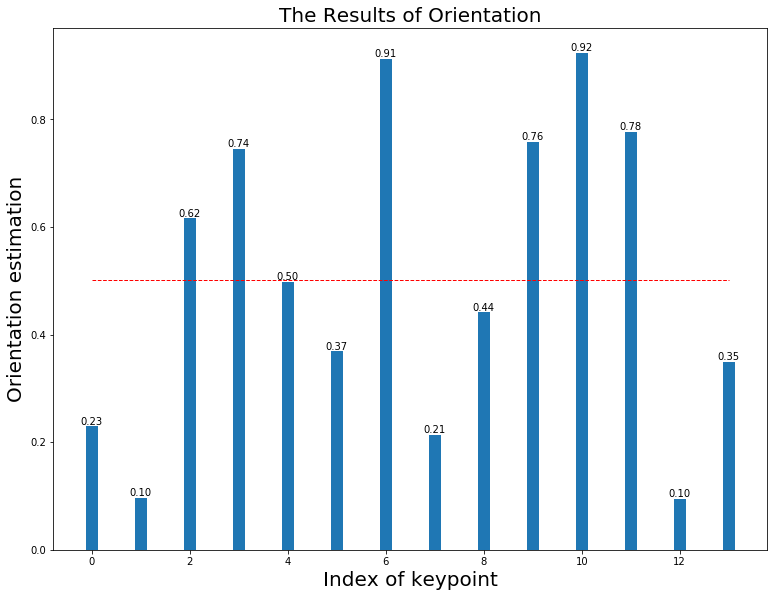

----------------------------------------------------------------------------------------------------0.6
FD Rotate(0.6):mean(0.359), median(0.359) in 0.098
The HoG estimation when (0.6) is  1
The HoG & FD estimation when (0.6) is 0.36


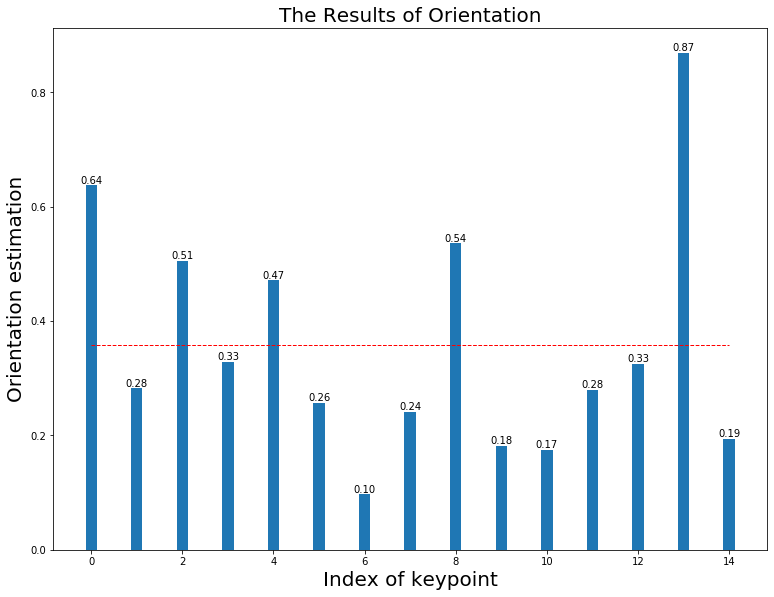

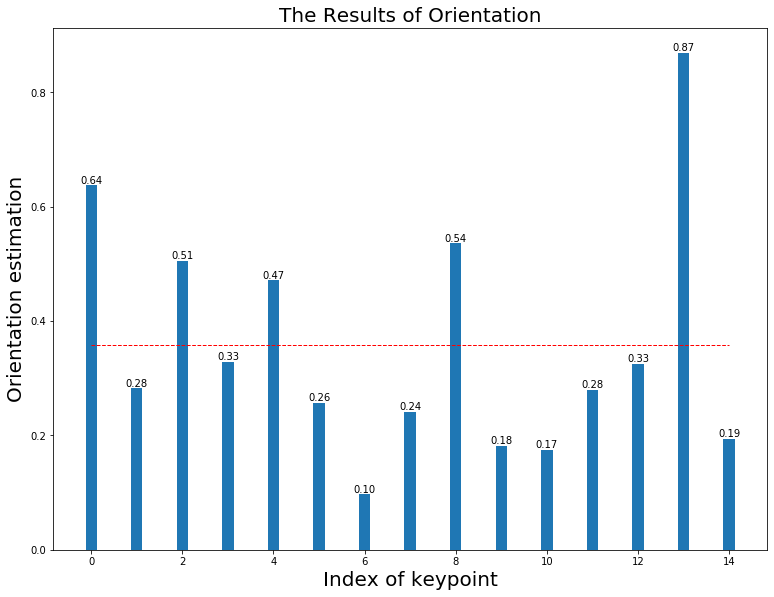

----------------------------------------------------------------------------------------------------0.7
FD Rotate(0.7):mean(0.598), median(0.598) in 0.095
The HoG estimation when (0.7) is  1
The HoG & FD estimation when (0.7) is 0.60


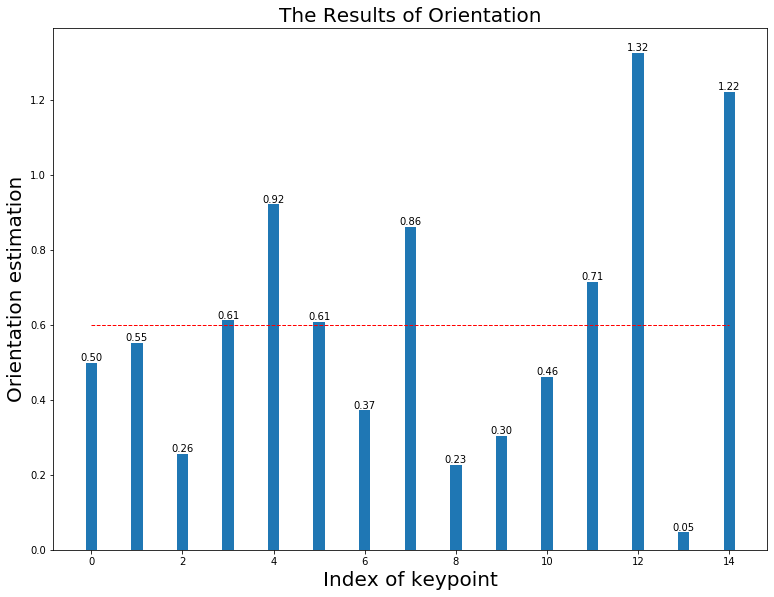

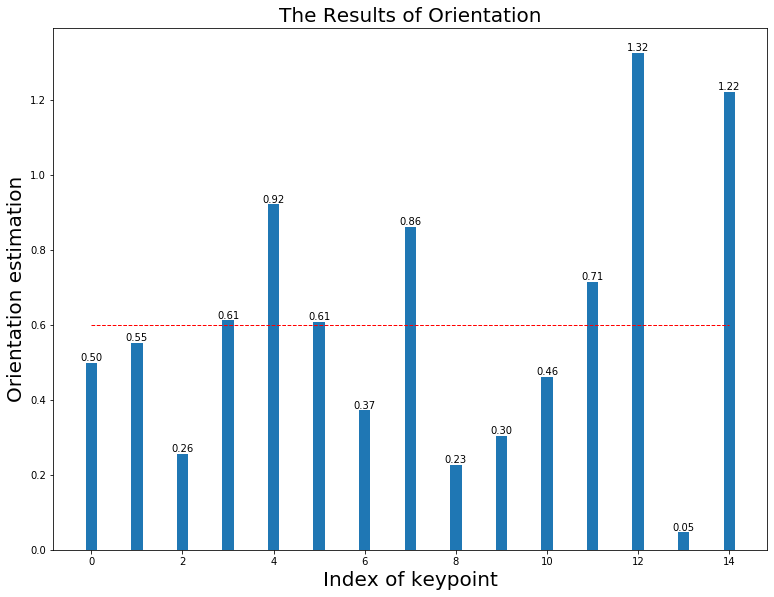

----------------------------------------------------------------------------------------------------0.7999999999999999
FD Rotate(0.8):mean(0.708), median(0.708) in 0.093
The HoG estimation when (0.8) is  1
The HoG & FD estimation when (0.8) is 0.71


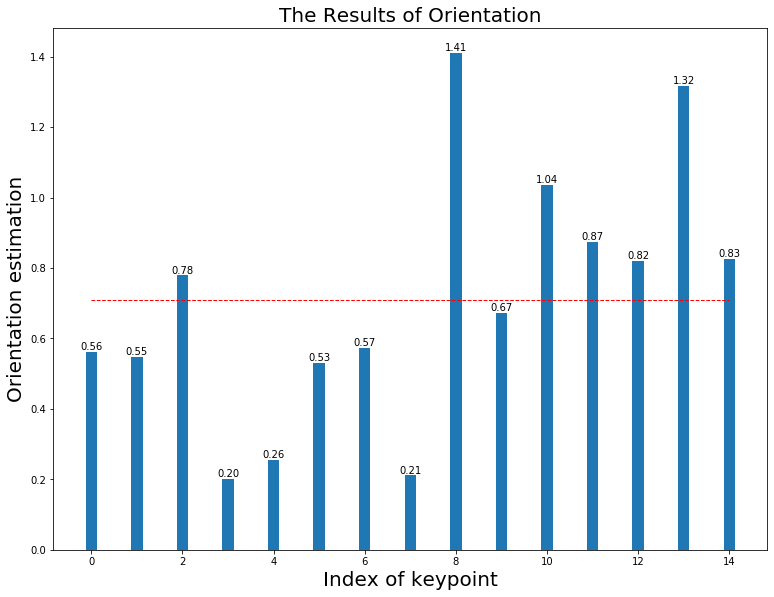

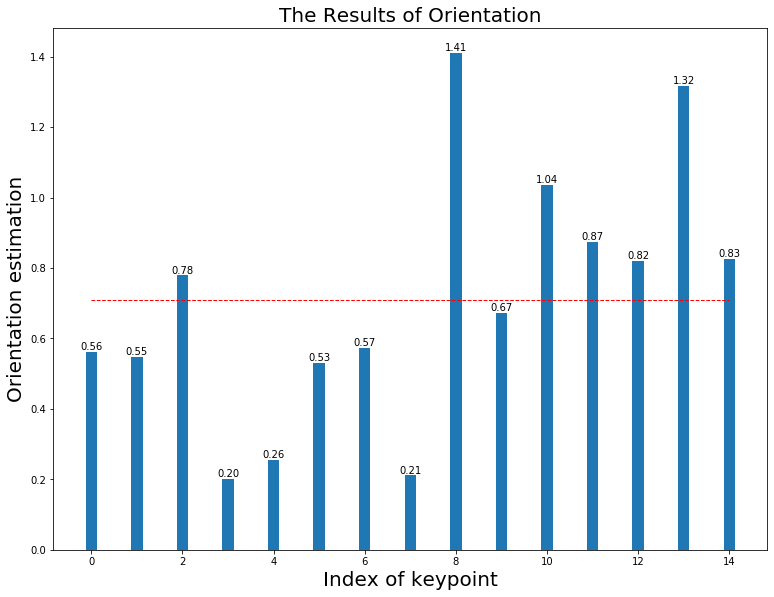

----------------------------------------------------------------------------------------------------0.8999999999999999
FD Rotate(0.9):mean(0.771), median(0.771) in 0.093
The HoG estimation when (0.9) is  1
The HoG & FD estimation when (0.9) is 0.77


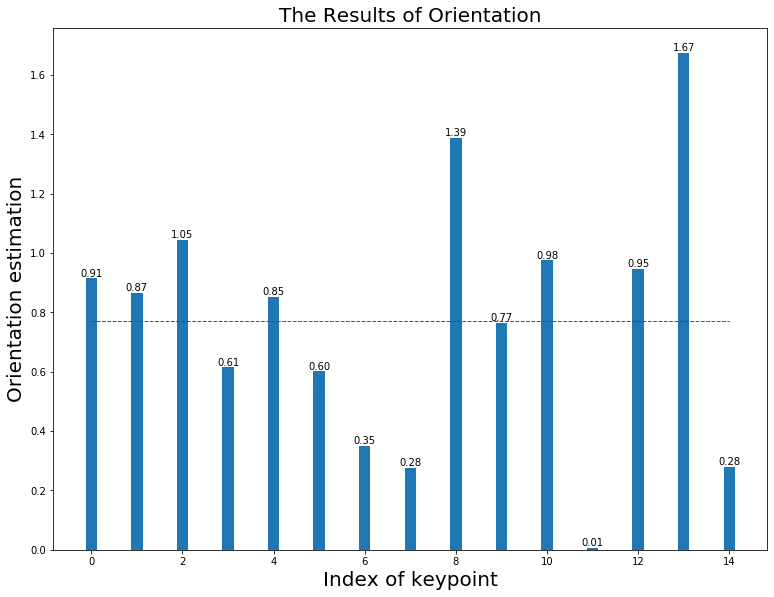

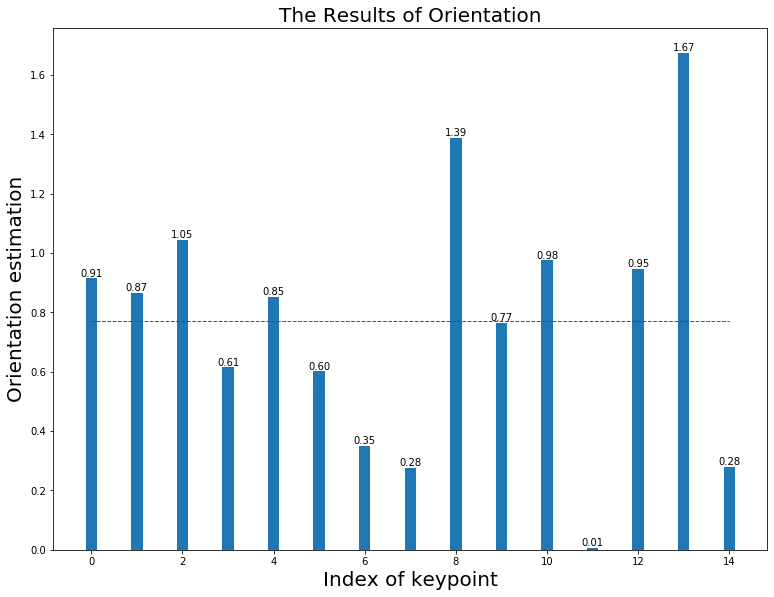

----------------------------------------------------------------------------------------------------0.9999999999999999
FD Rotate(1.0):mean(0.897), median(0.897) in 0.096
The HoG estimation when (1.0) is  1
The HoG & FD estimation when (1.0) is 0.90


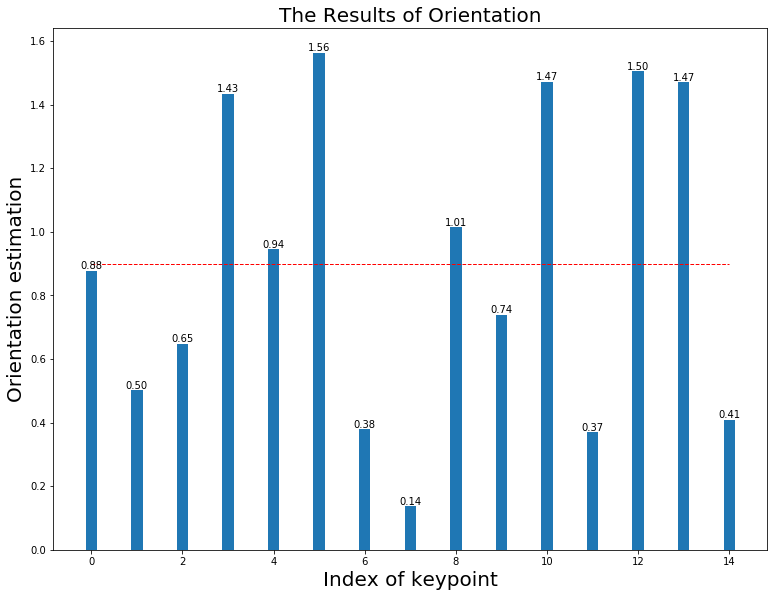

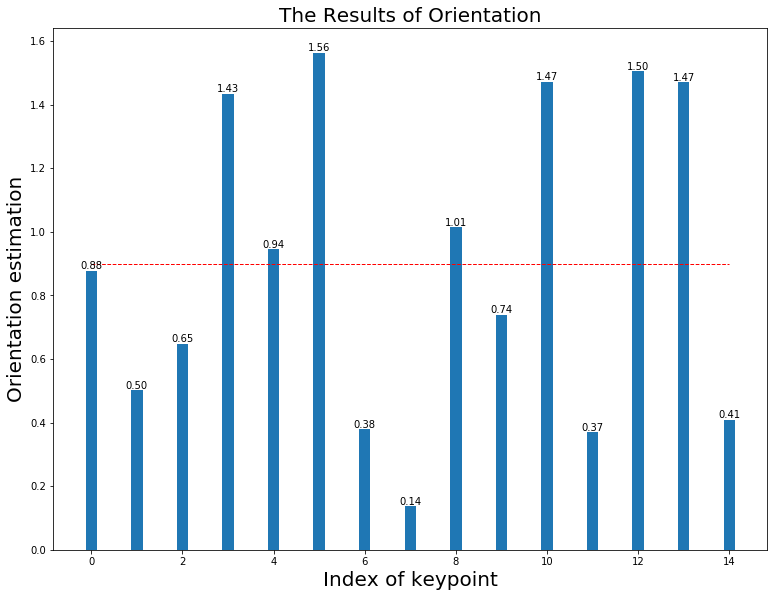

----------------------------------------------------------------------------------------------------1.0999999999999999
FD Rotate(1.1):mean(0.980), median(0.980) in 0.097
The HoG estimation when (1.1) is  1
The HoG & FD estimation when (1.1) is 0.90


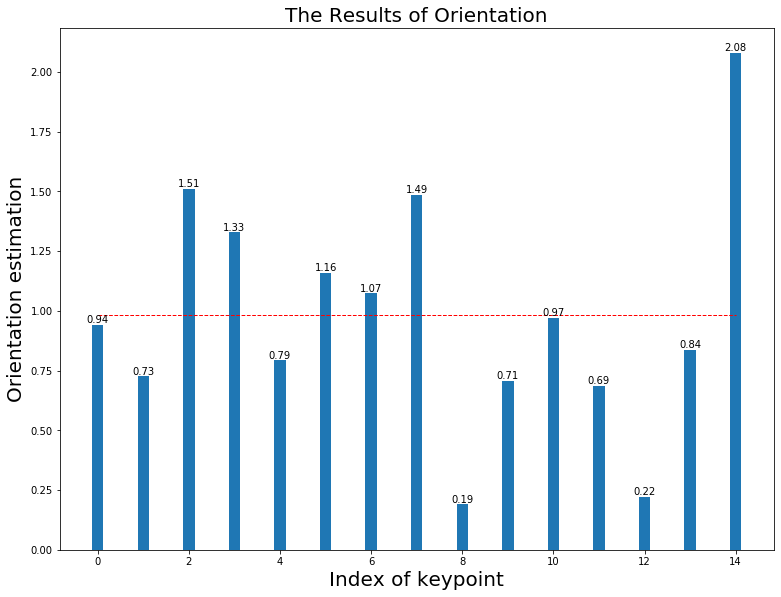

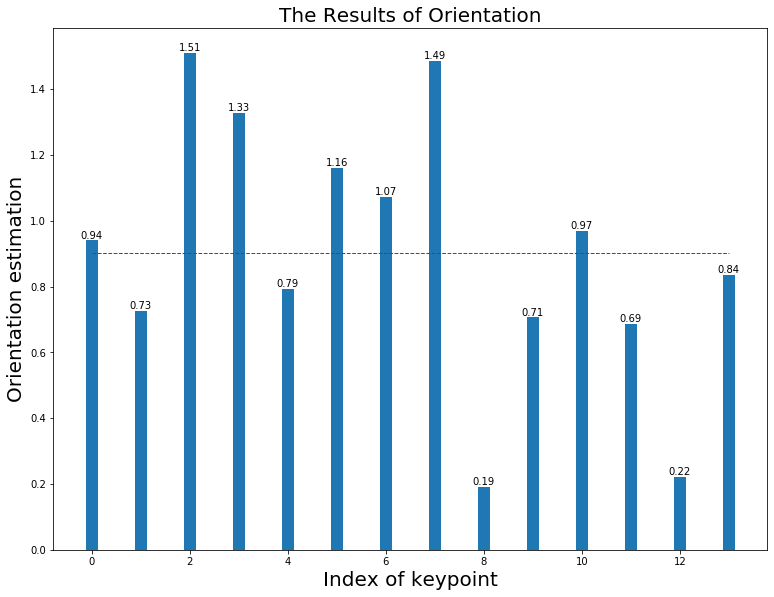

----------------------------------------------------------------------------------------------------1.1999999999999997
FD Rotate(1.2):mean(1.027), median(1.027) in 0.098
The HoG estimation when (1.2) is  1
The HoG & FD estimation when (1.2) is 0.94


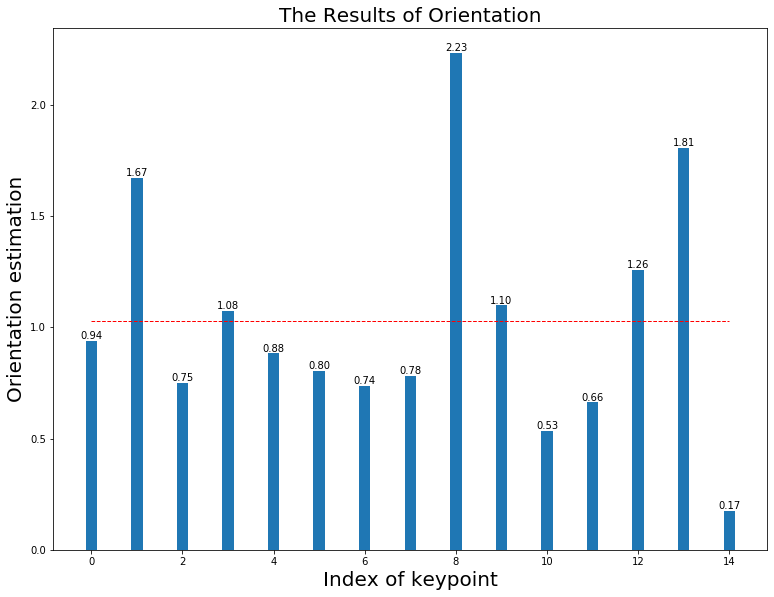

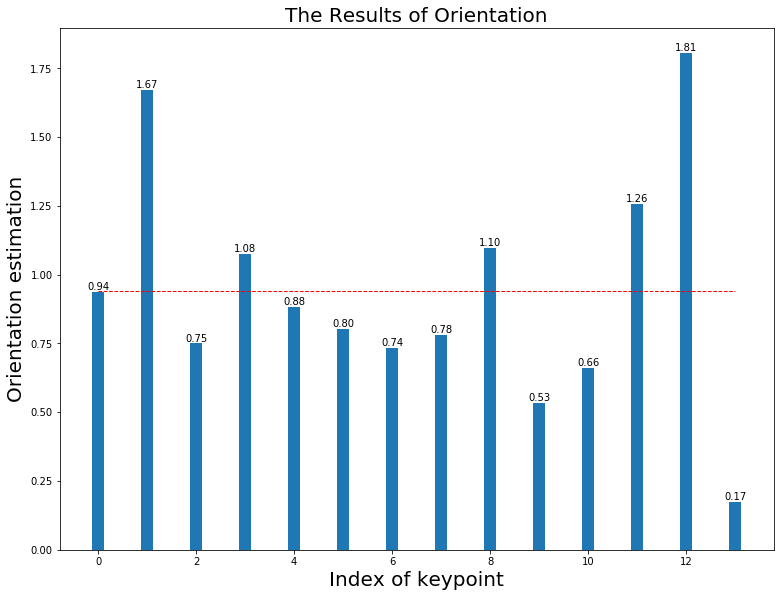

----------------------------------------------------------------------------------------------------1.2999999999999998
FD Rotate(1.3):mean(1.145), median(1.145) in 0.099
The HoG estimation when (1.3) is  1
The HoG & FD estimation when (1.3) is 1.08


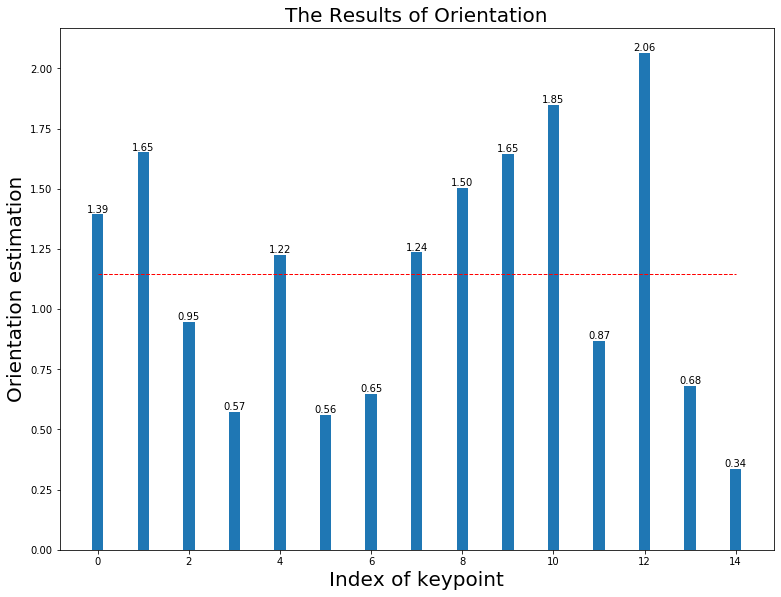

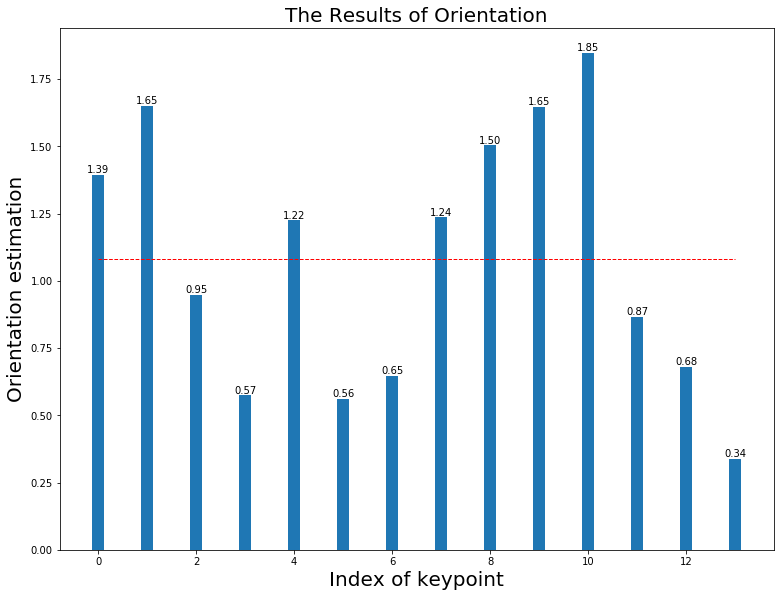

----------------------------------------------------------------------------------------------------1.4
FD Rotate(1.4):mean(1.393), median(1.393) in 0.099
The HoG estimation when (1.4) is  2
The HoG & FD estimation when (1.4) is 1.71


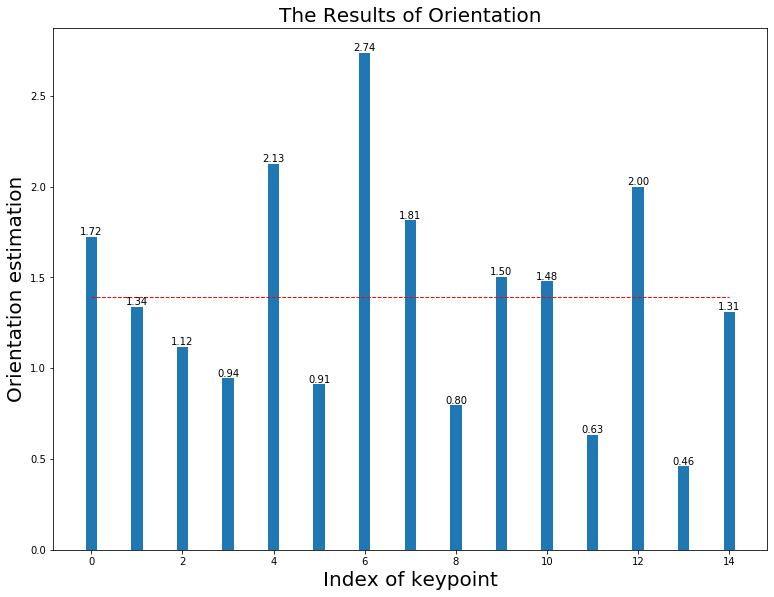

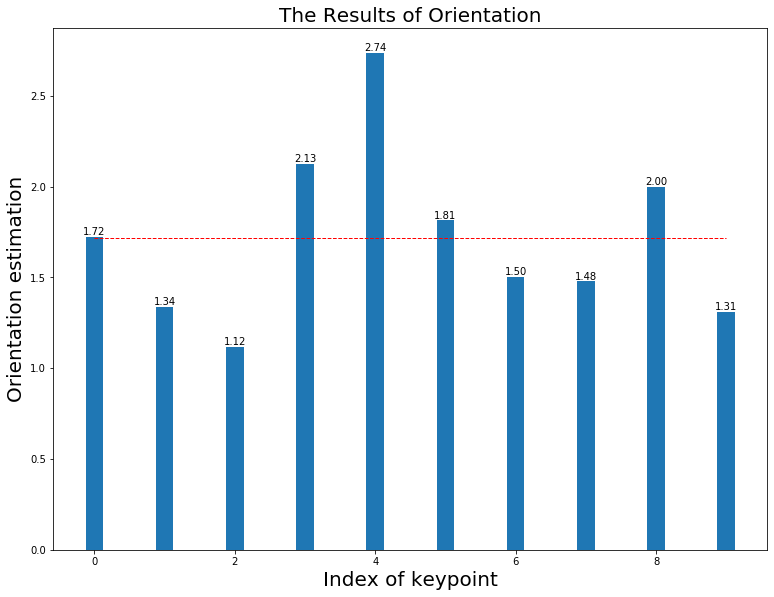

----------------------------------------------------------------------------------------------------1.4999999999999998
FD Rotate(1.5):mean(1.366), median(1.366) in 0.093
The HoG estimation when (1.5) is  2
The HoG & FD estimation when (1.5) is 1.41


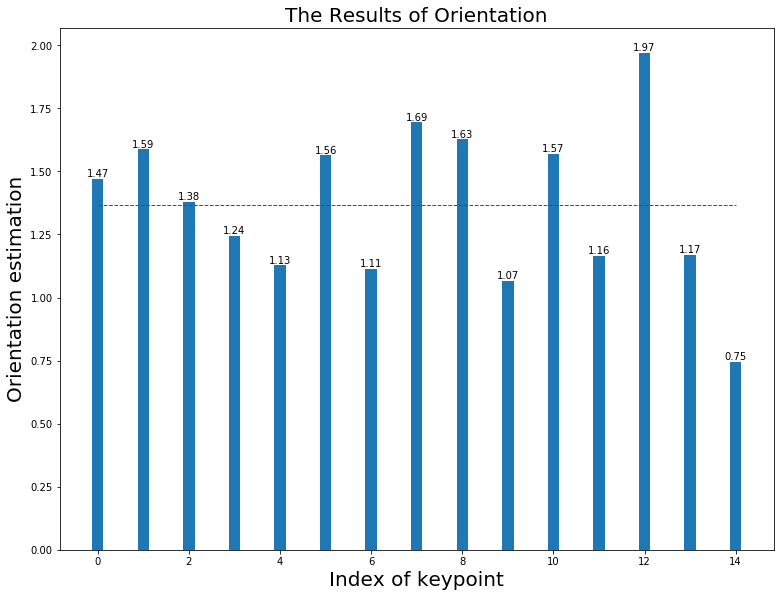

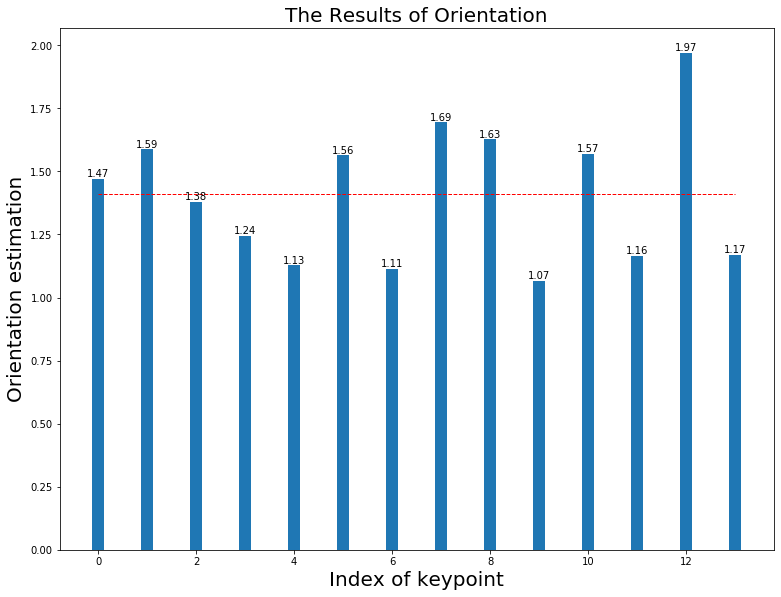

----------------------------------------------------------------------------------------------------1.5999999999999996
FD Rotate(1.6):mean(1.453), median(1.453) in 0.097
The HoG estimation when (1.6) is  2
The HoG & FD estimation when (1.6) is 1.57


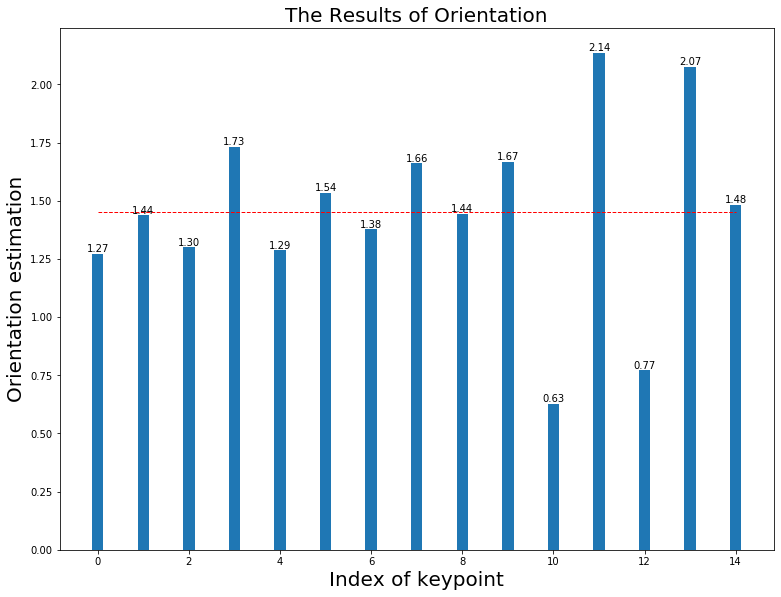

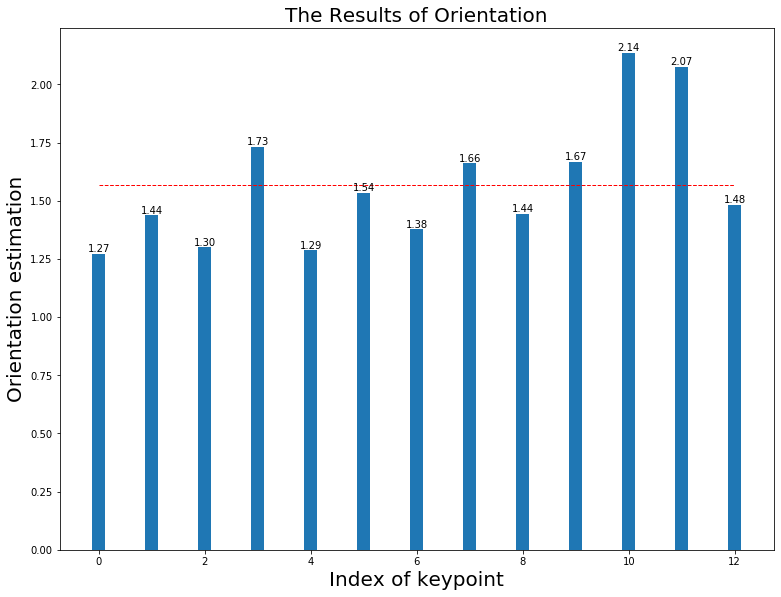

----------------------------------------------------------------------------------------------------1.6999999999999997
FD Rotate(1.7):mean(1.461), median(1.461) in 0.098
The HoG estimation when (1.7) is  2
The HoG & FD estimation when (1.7) is 1.50


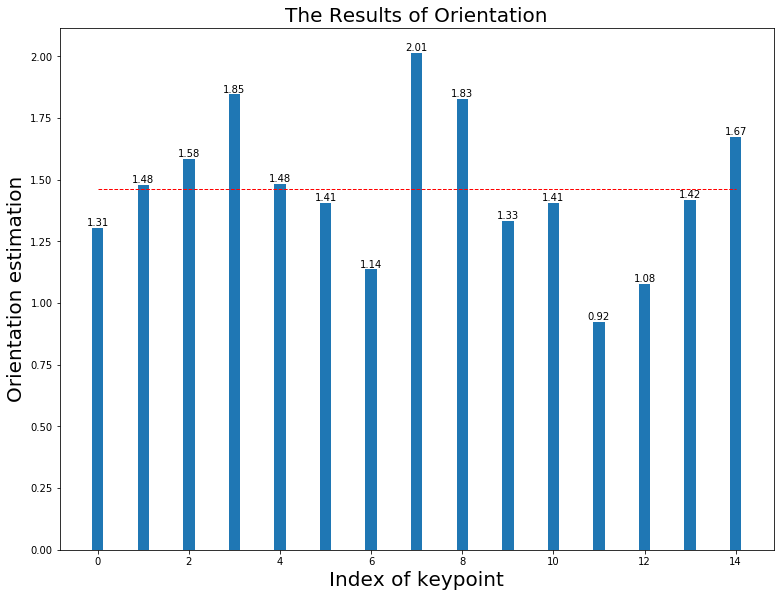

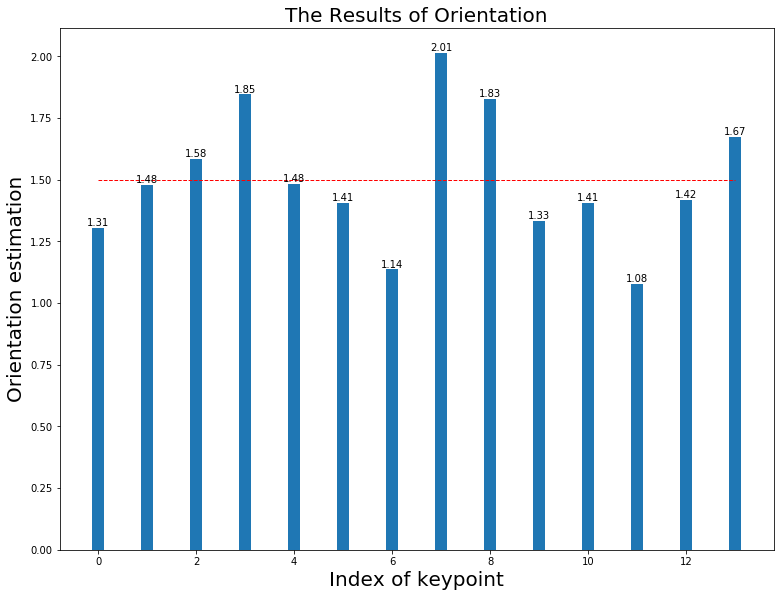

----------------------------------------------------------------------------------------------------1.7999999999999998
FD Rotate(1.8):mean(1.621), median(1.621) in 0.098
The HoG estimation when (1.8) is  2
The HoG & FD estimation when (1.8) is 1.68


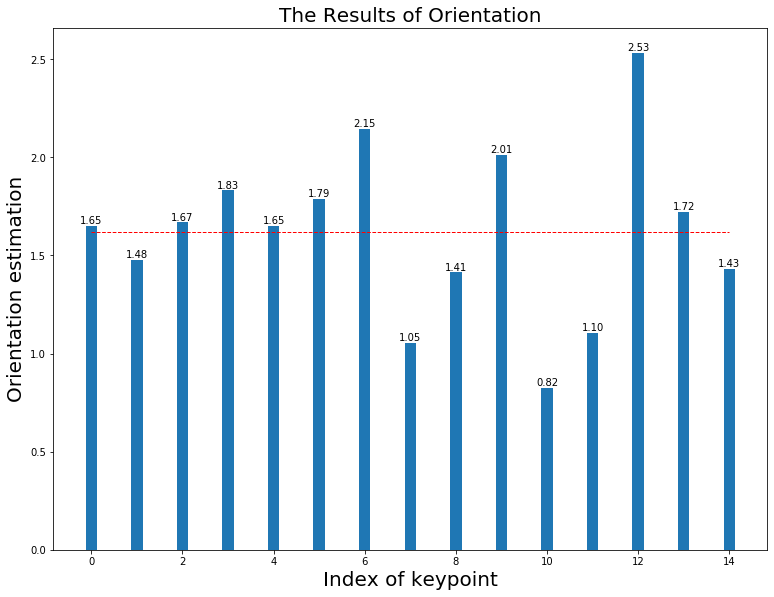

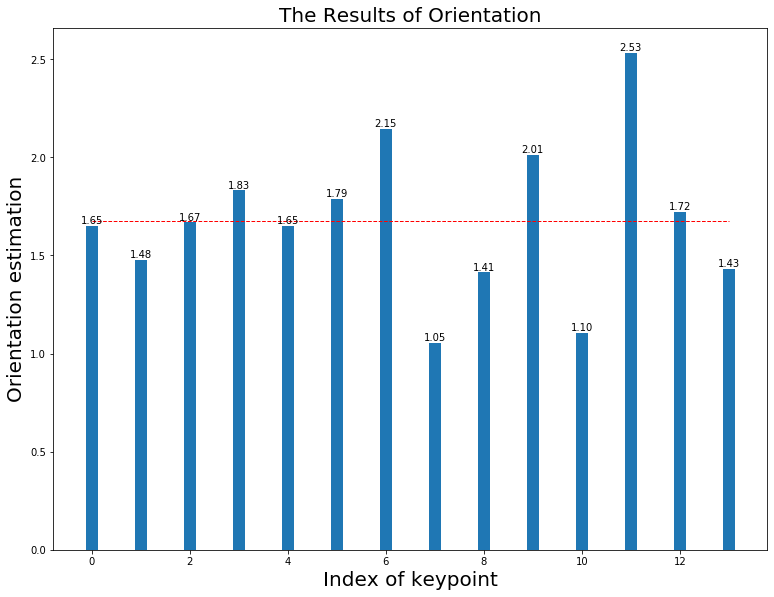

----------------------------------------------------------------------------------------------------1.8999999999999997
FD Rotate(1.9):mean(1.652), median(1.652) in 0.102
The HoG estimation when (1.9) is  2
The HoG & FD estimation when (1.9) is 1.86


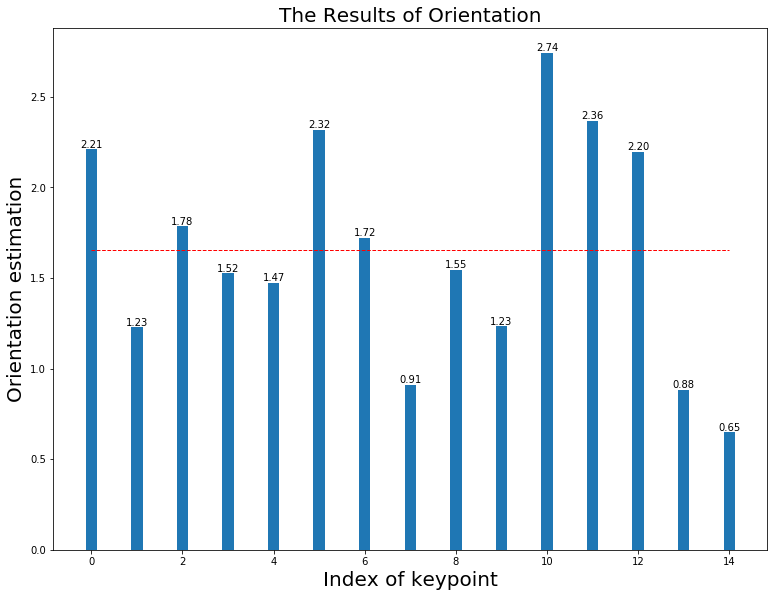

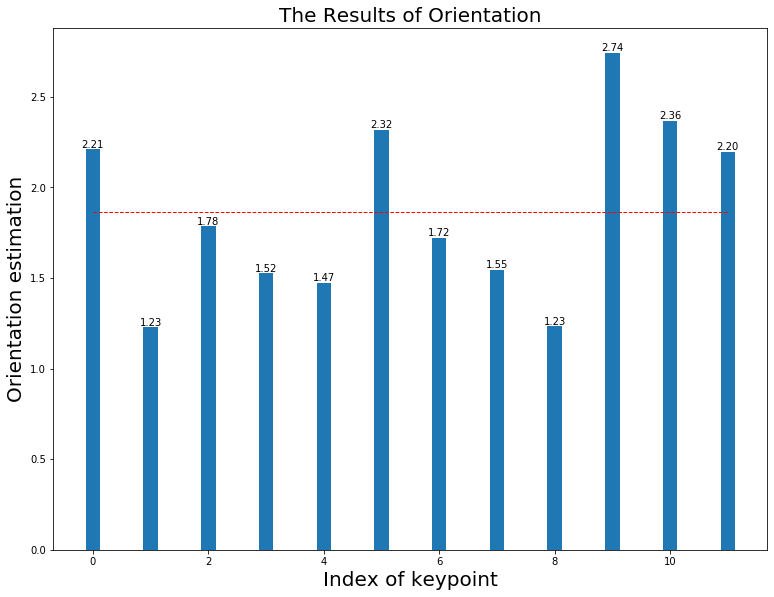

----------------------------------------------------------------------------------------------------1.9999999999999996
FD Rotate(2.0):mean(2.116), median(2.116) in 0.103
The HoG estimation when (2.0) is  2
The HoG & FD estimation when (2.0) is 2.05


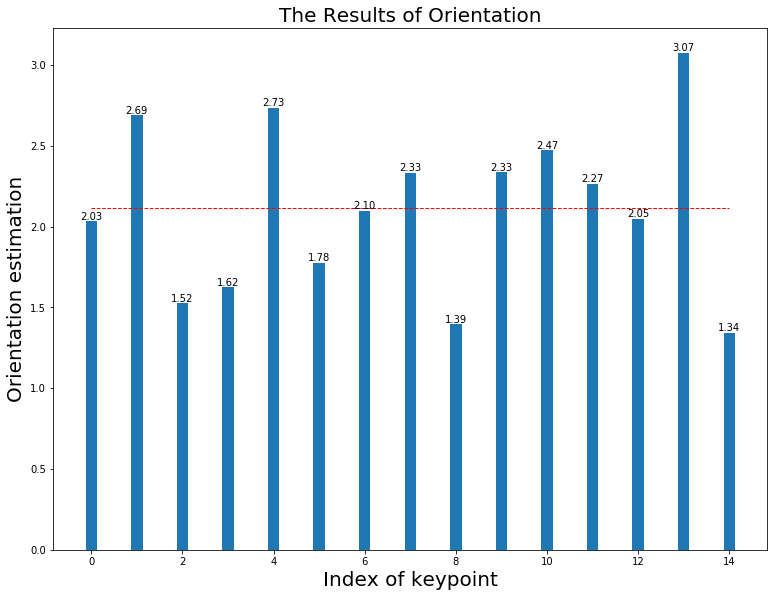

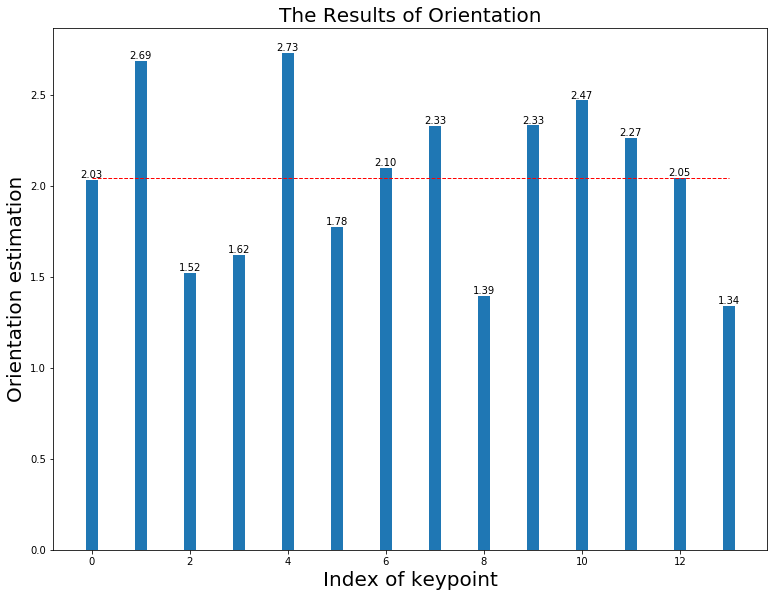

----------------------------------------------------------------------------------------------------2.0999999999999996
FD Rotate(2.1):mean(2.103), median(2.103) in 0.097
The HoG estimation when (2.1) is  2
The HoG & FD estimation when (2.1) is 2.00


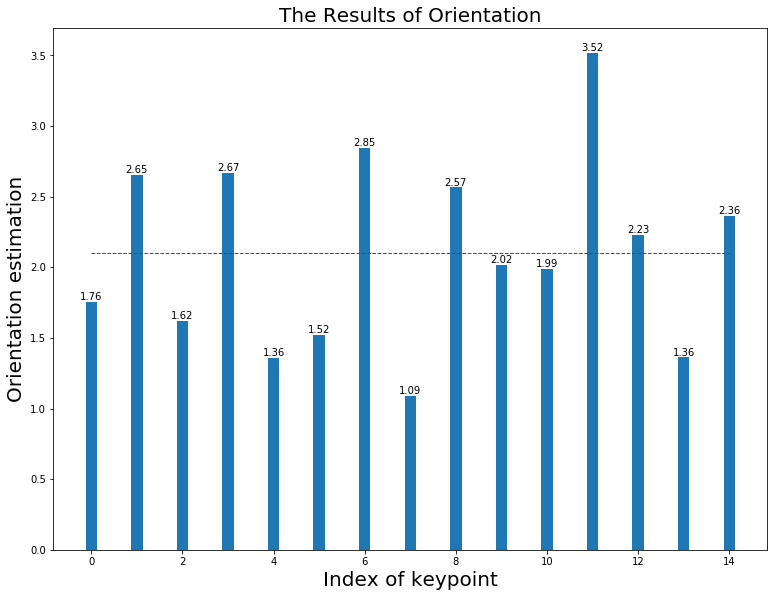

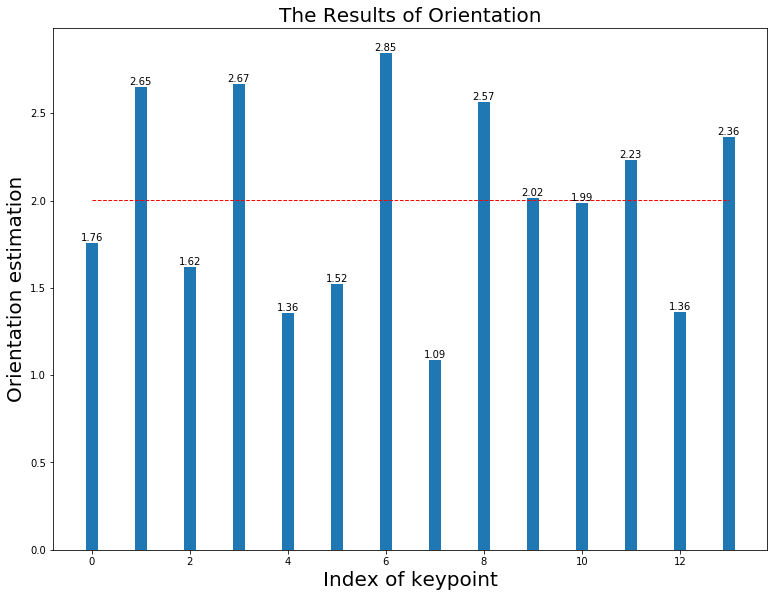

----------------------------------------------------------------------------------------------------2.1999999999999997
FD Rotate(2.2):mean(2.319), median(2.319) in 0.098
The HoG estimation when (2.2) is  2
The HoG & FD estimation when (2.2) is 2.16


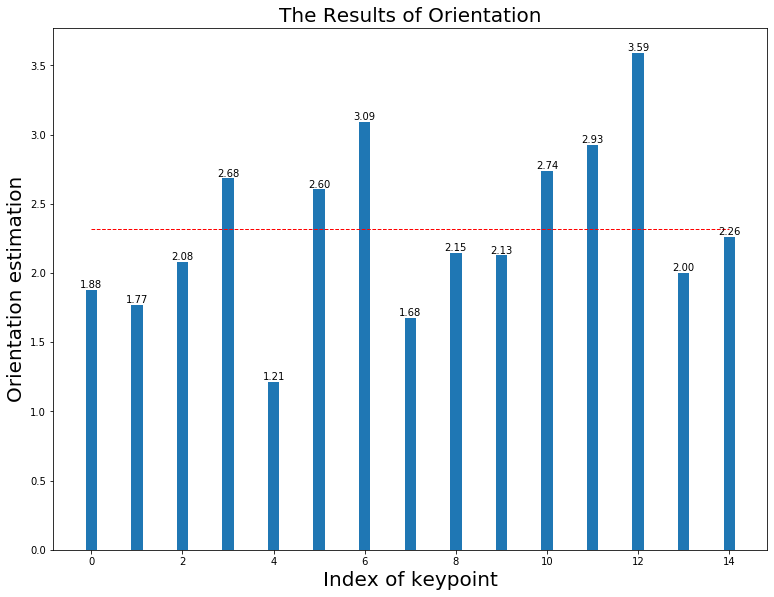

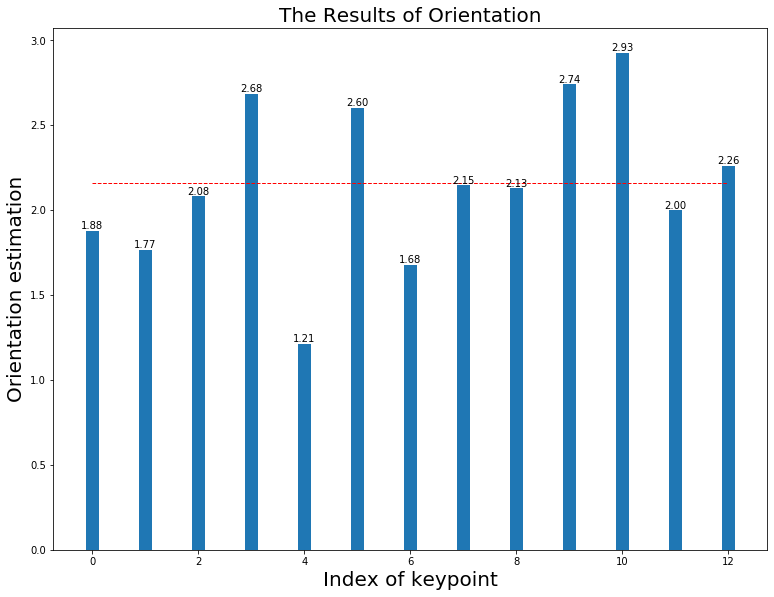

----------------------------------------------------------------------------------------------------2.3
FD Rotate(2.3):mean(2.325), median(2.325) in 0.099
The HoG estimation when (2.3) is  2
The HoG & FD estimation when (2.3) is 2.15


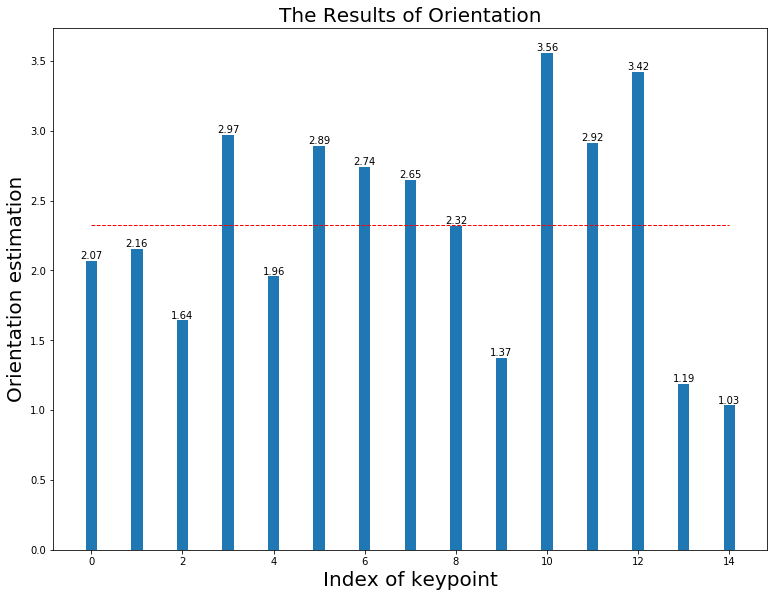

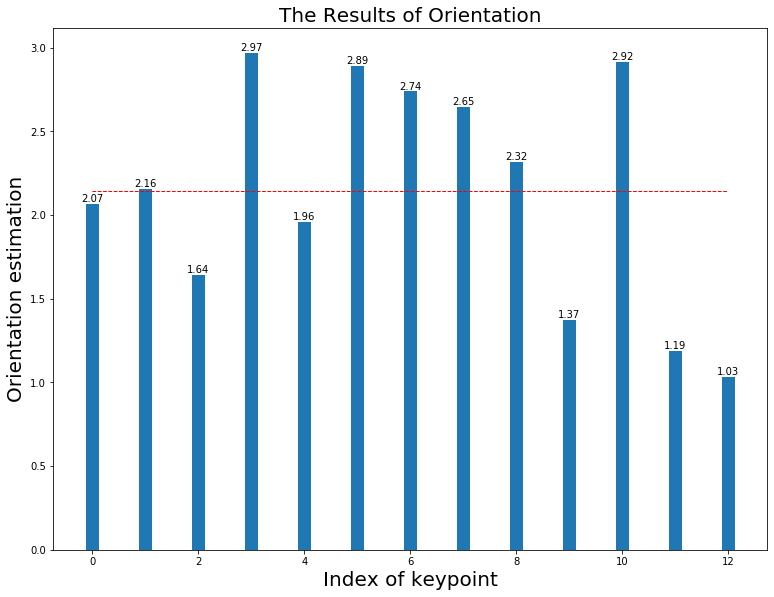

----------------------------------------------------------------------------------------------------2.3999999999999995
FD Rotate(2.4):mean(2.296), median(2.296) in 0.092
The HoG estimation when (2.4) is  2
The HoG & FD estimation when (2.4) is 2.13


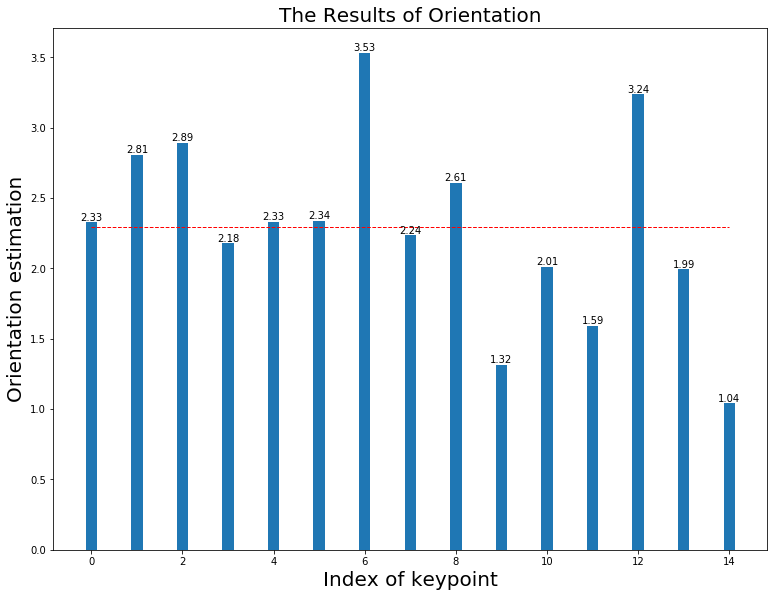

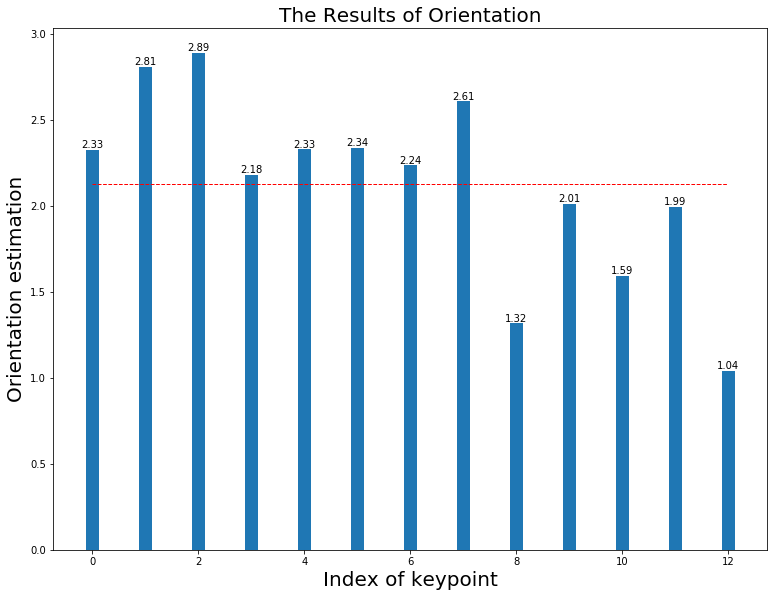

----------------------------------------------------------------------------------------------------2.4999999999999996
FD Rotate(2.5):mean(2.350), median(2.350) in 0.101
The HoG estimation when (2.5) is  3
The HoG & FD estimation when (2.5) is 2.65


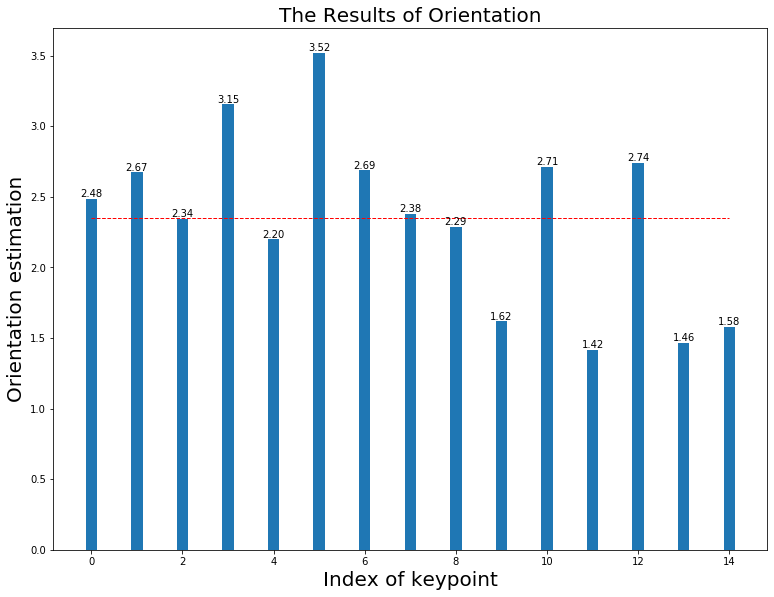

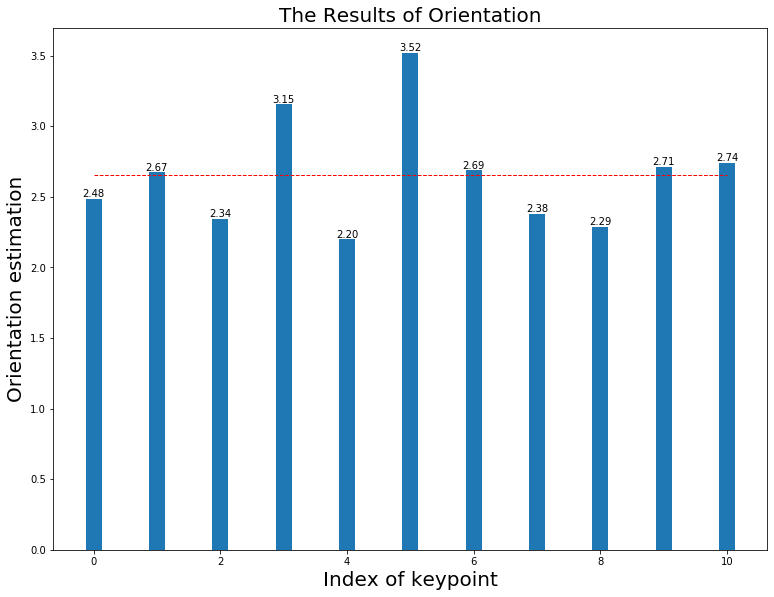

----------------------------------------------------------------------------------------------------2.5999999999999996
FD Rotate(2.6):mean(2.509), median(2.509) in 0.092
The HoG estimation when (2.6) is  3
The HoG & FD estimation when (2.6) is 2.51


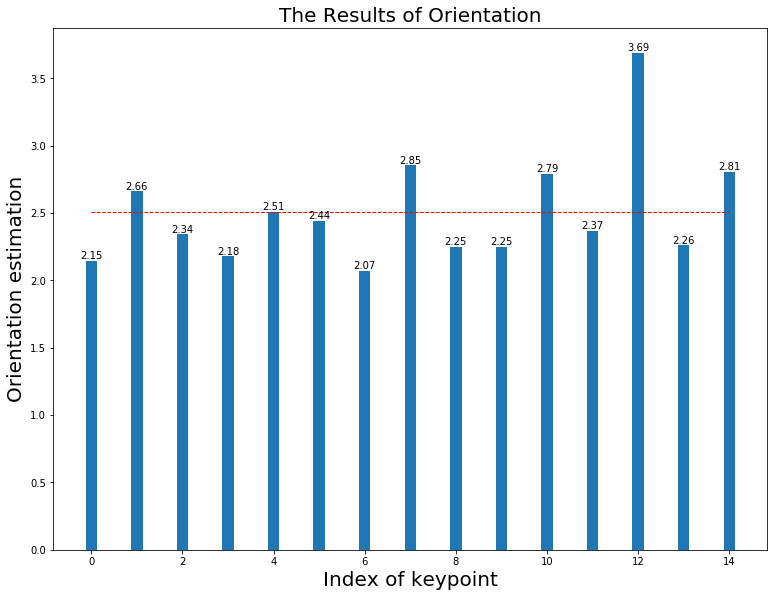

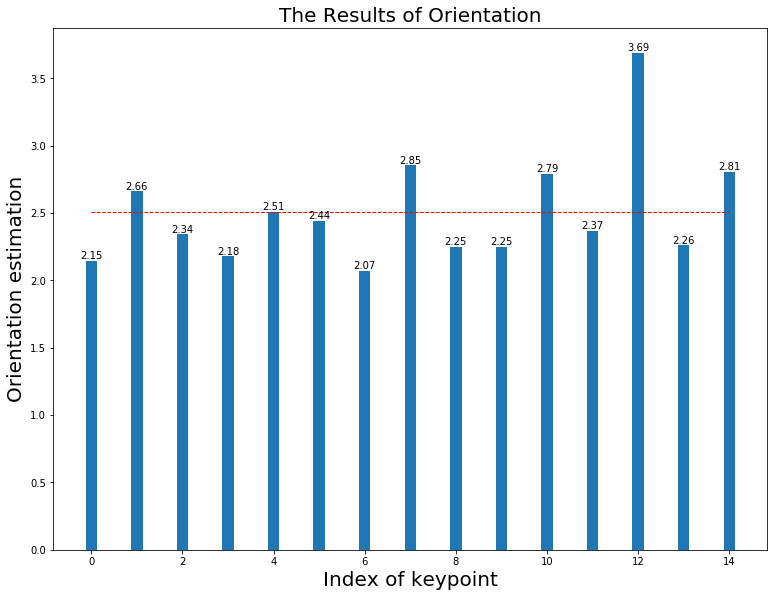

----------------------------------------------------------------------------------------------------2.6999999999999993
FD Rotate(2.7):mean(2.649), median(2.649) in 0.097
The HoG estimation when (2.7) is  3
The HoG & FD estimation when (2.7) is 2.81


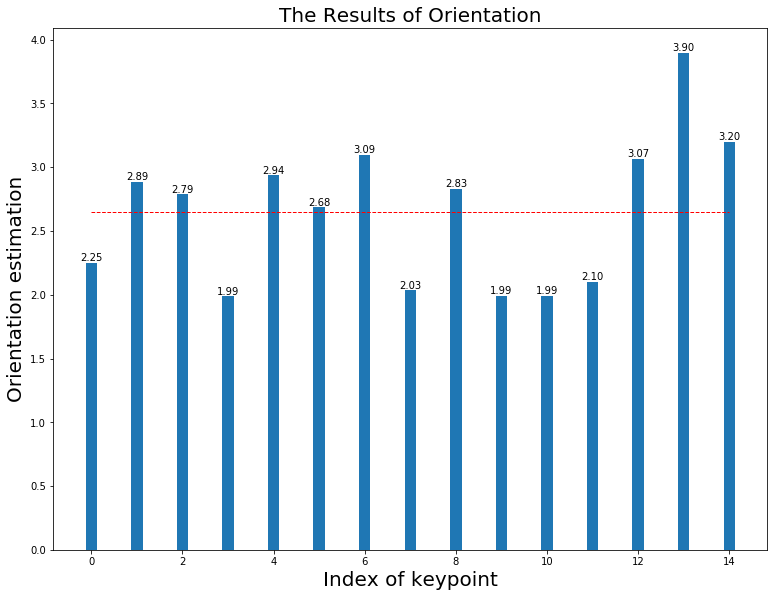

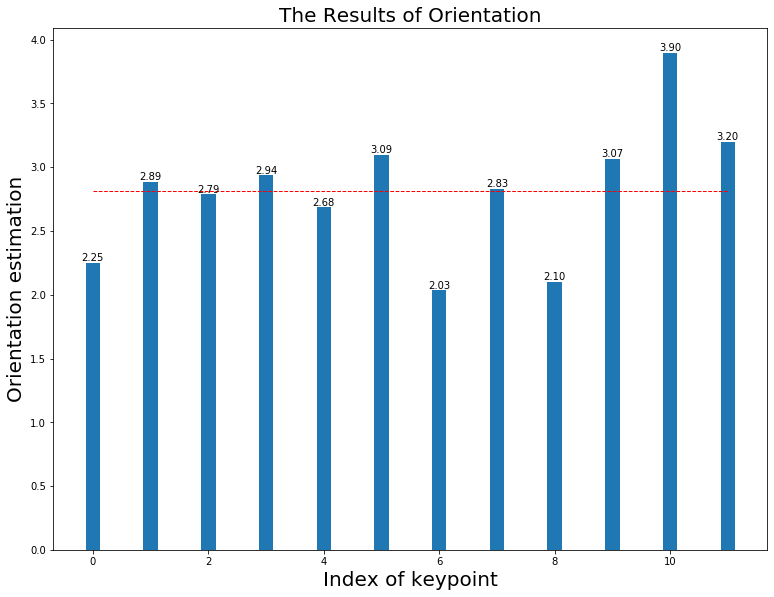

----------------------------------------------------------------------------------------------------2.7999999999999994
FD Rotate(2.8):mean(2.754), median(2.754) in 0.098
The HoG estimation when (2.8) is  3
The HoG & FD estimation when (2.8) is 2.90


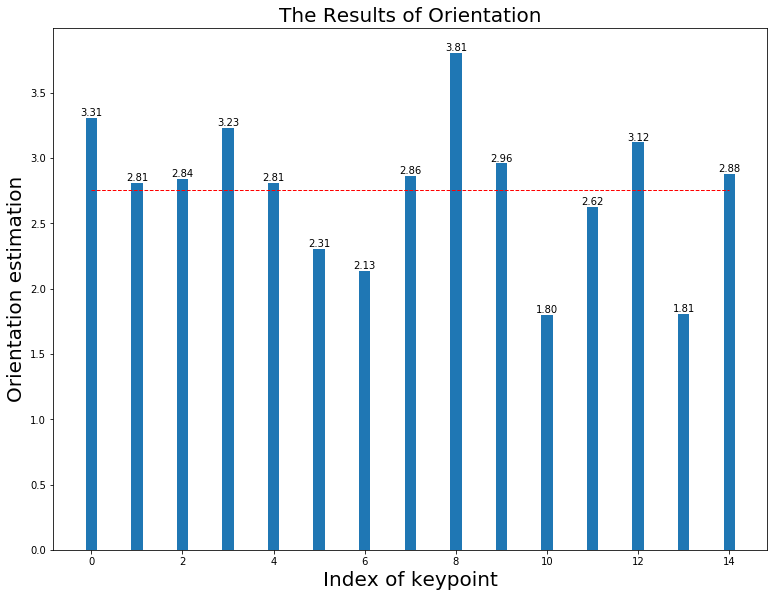

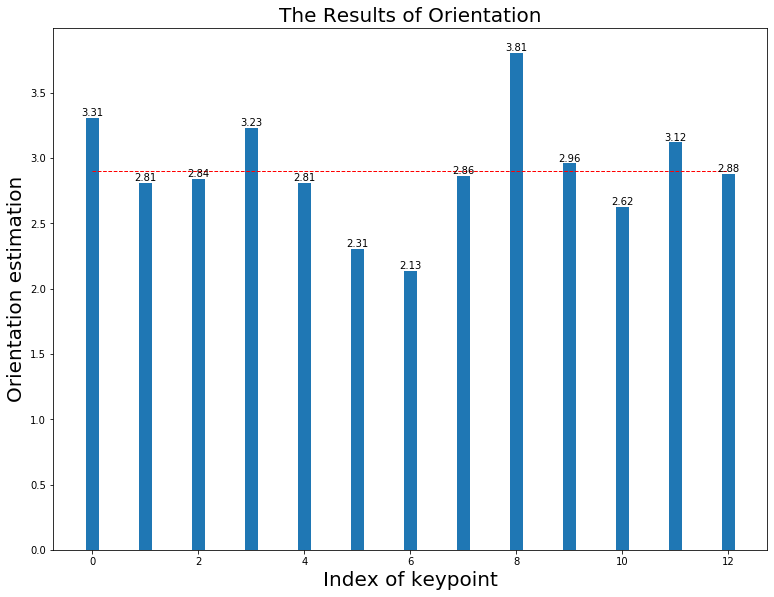

----------------------------------------------------------------------------------------------------2.8999999999999995
FD Rotate(2.9):mean(2.830), median(2.830) in 0.099
The HoG estimation when (2.9) is  3
The HoG & FD estimation when (2.9) is 3.10


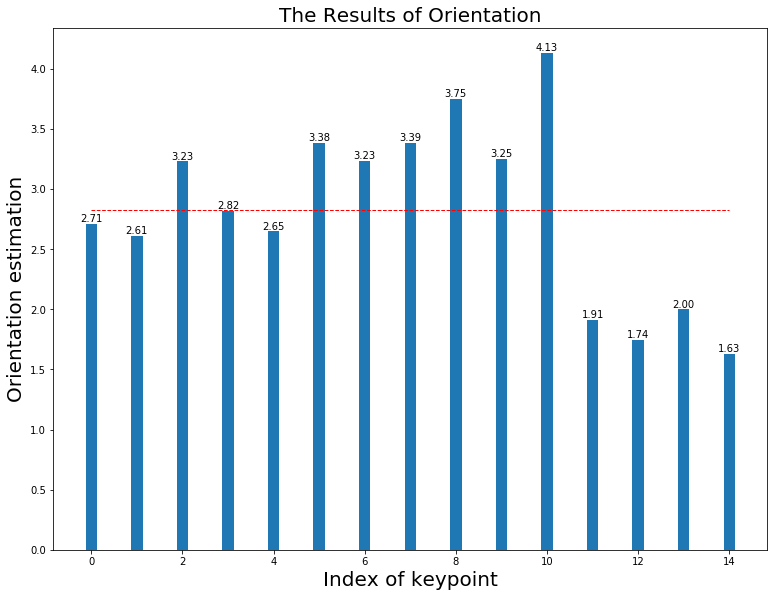

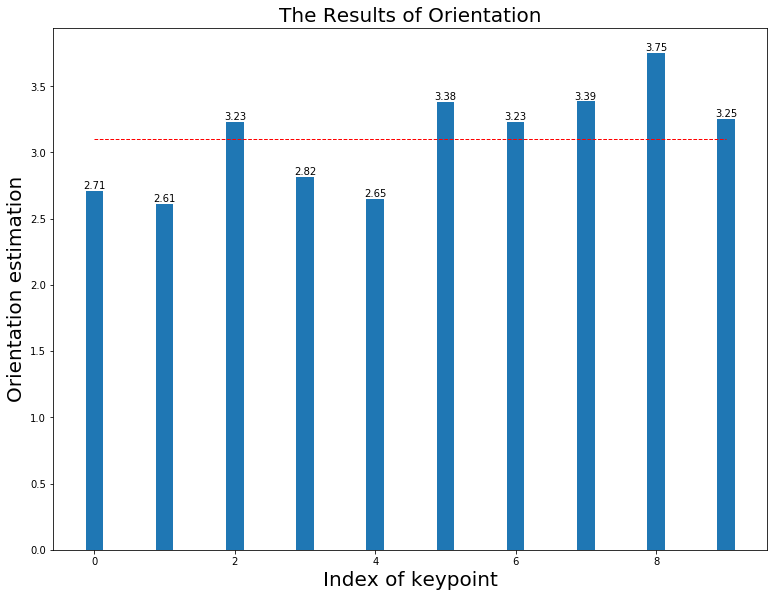

----------------------------------------------------------------------------------------------------2.9999999999999996
FD Rotate(3.0):mean(3.001), median(3.001) in 0.102
The HoG estimation when (3.0) is  3
The HoG & FD estimation when (3.0) is 3.00


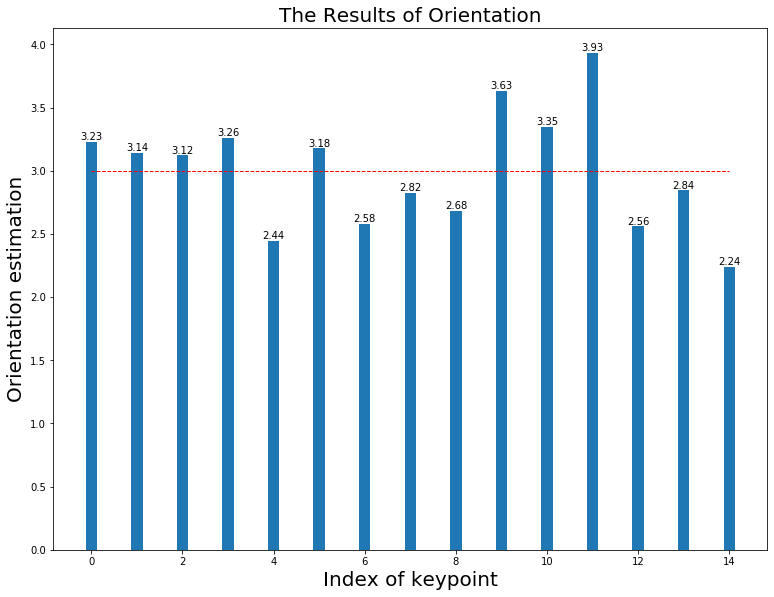

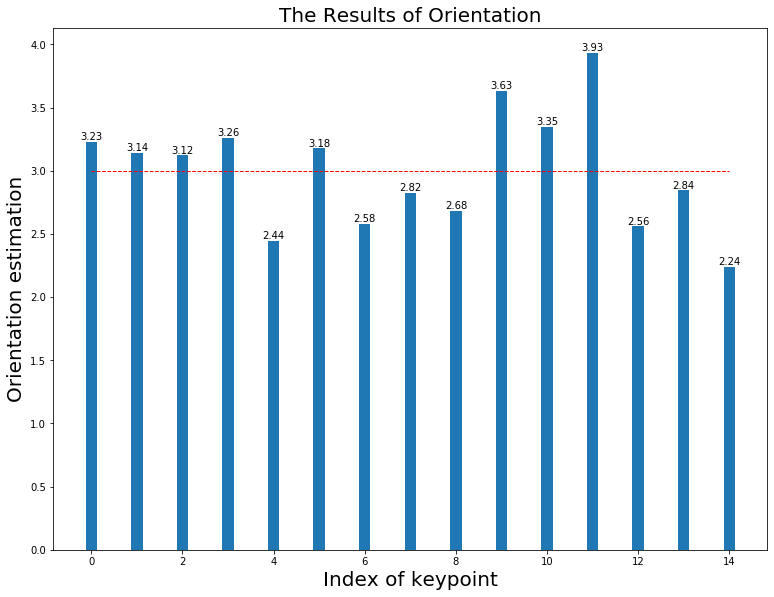

----------------------------------------------------------------------------------------------------3.0999999999999996
FD Rotate(3.1):mean(3.186), median(3.186) in 0.103
The HoG estimation when (3.1) is  3
The HoG & FD estimation when (3.1) is 2.93


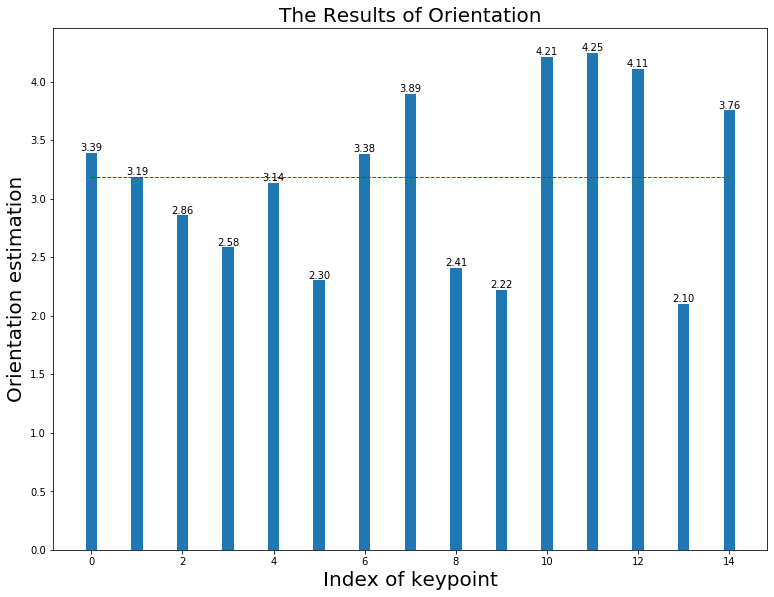

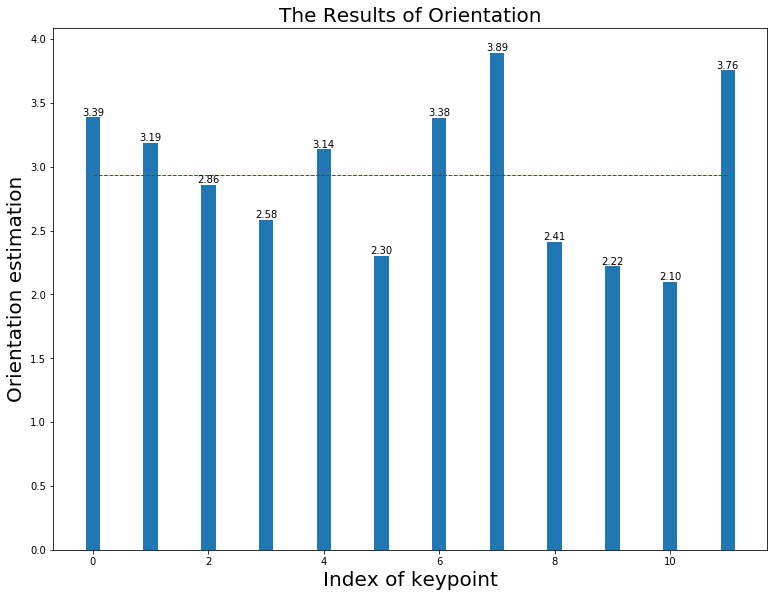

----------------------------------------------------------------------------------------------------3.1999999999999993
FD Rotate(3.2):mean(3.180), median(3.180) in 0.100
The HoG estimation when (3.2) is  3
The HoG & FD estimation when (3.2) is 3.21


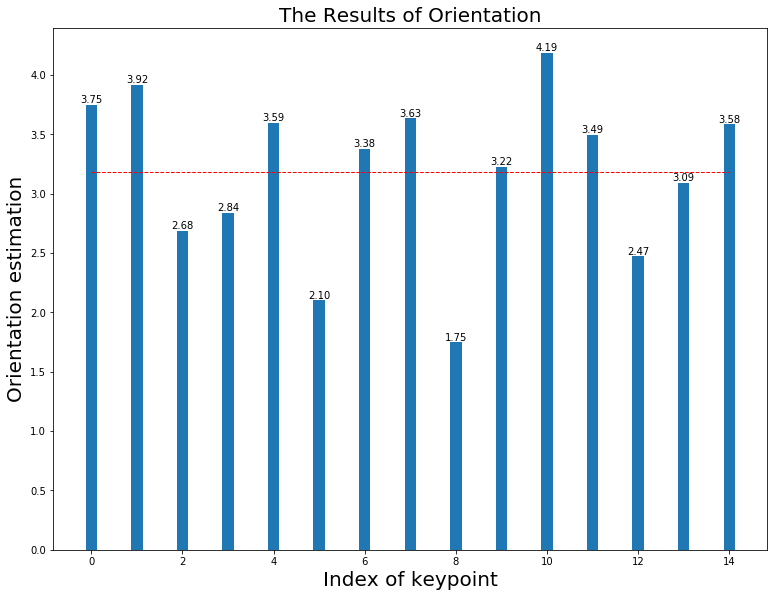

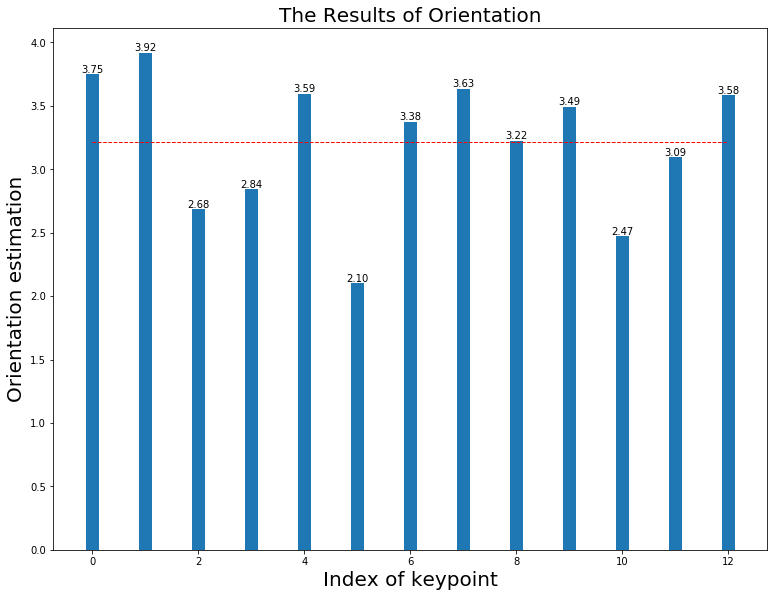

----------------------------------------------------------------------------------------------------3.2999999999999994
FD Rotate(3.3):mean(3.441), median(3.441) in 0.100
The HoG estimation when (3.3) is  3
The HoG & FD estimation when (3.3) is 3.44


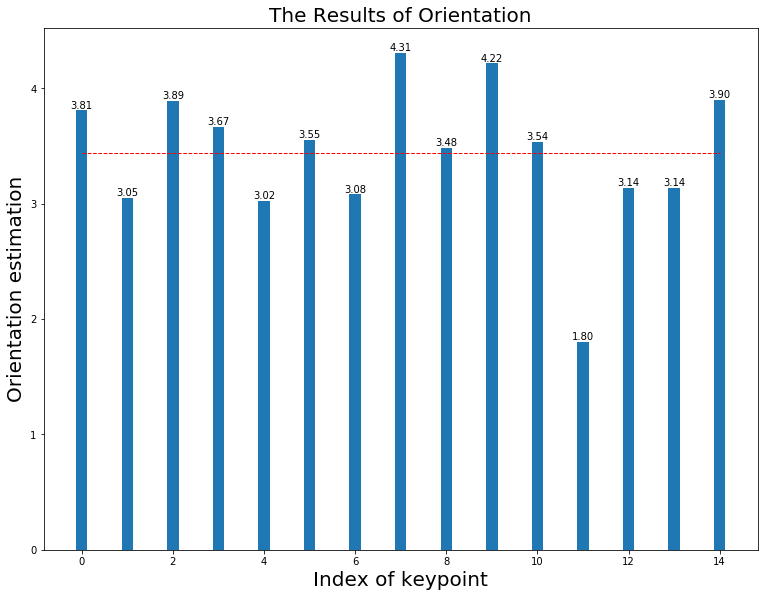

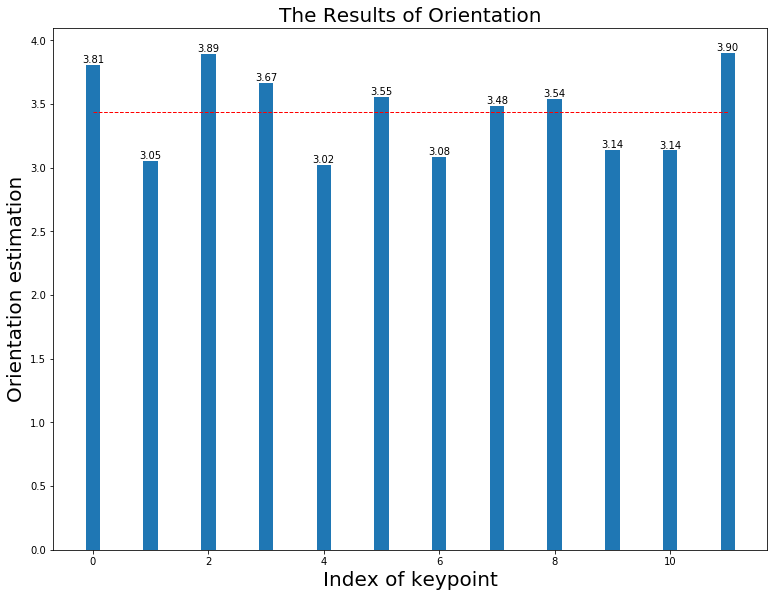

----------------------------------------------------------------------------------------------------3.3999999999999995
FD Rotate(3.4):mean(3.650), median(3.650) in 0.101
The HoG estimation when (3.4) is  3
The HoG & FD estimation when (3.4) is 3.51


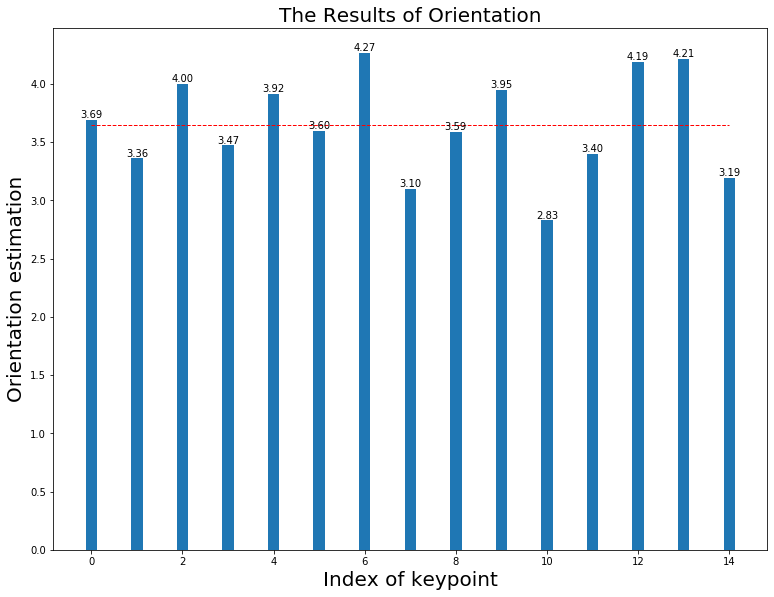

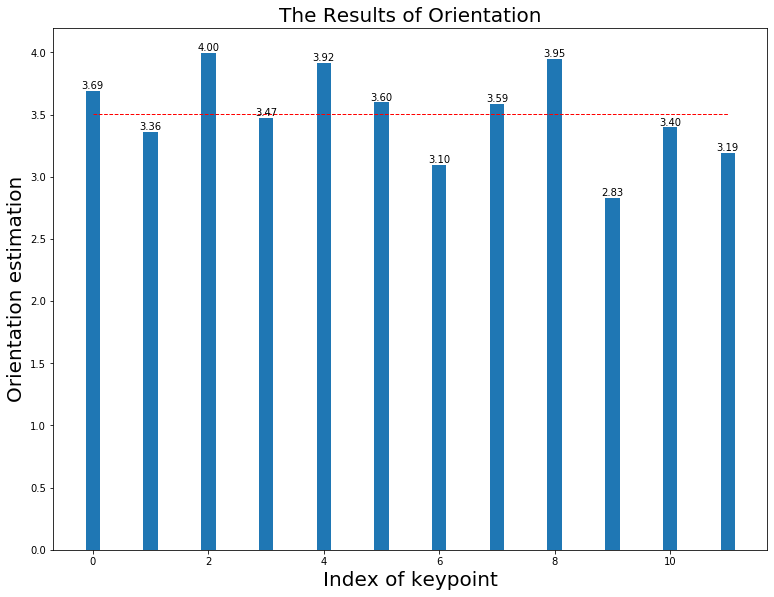

----------------------------------------------------------------------------------------------------3.499999999999999
FD Rotate(3.5):mean(3.532), median(3.532) in 0.113
The HoG estimation when (3.5) is  3
The HoG & FD estimation when (3.5) is 3.43


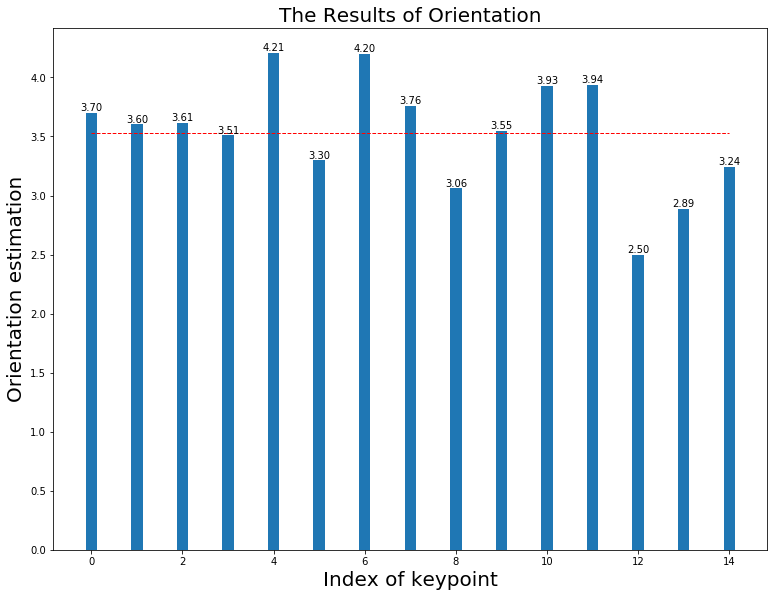

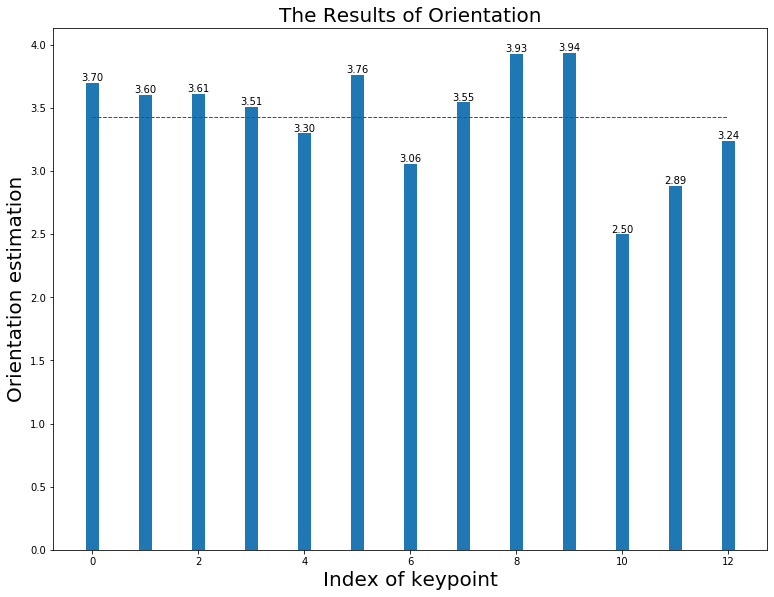

----------------------------------------------------------------------------------------------------3.599999999999999
FD Rotate(3.6):mean(3.823), median(3.823) in 0.103
The HoG estimation when (3.6) is  4
The HoG & FD estimation when (3.6) is 3.82


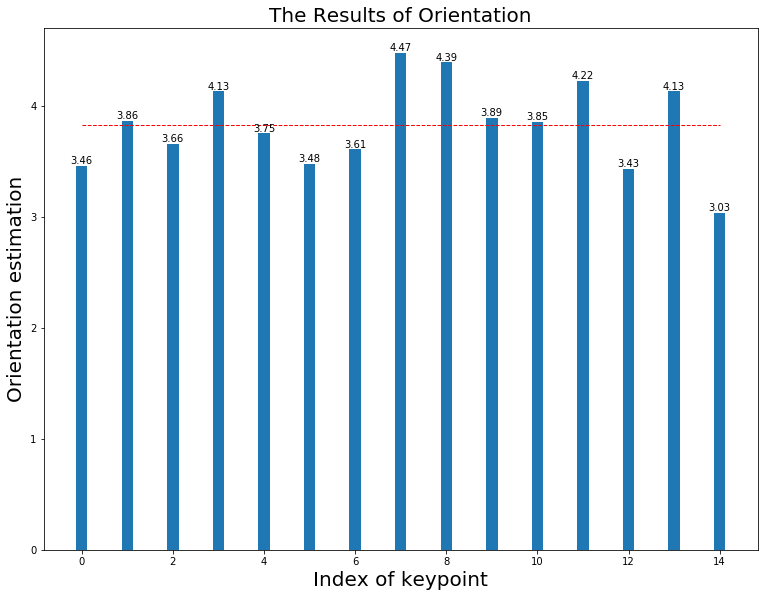

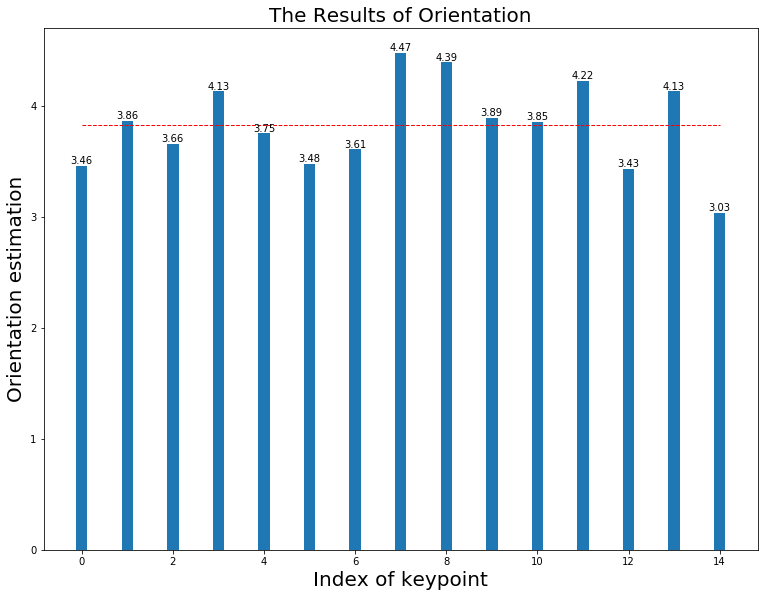

----------------------------------------------------------------------------------------------------3.6999999999999993
FD Rotate(3.7):mean(3.784), median(3.784) in 0.103
The HoG estimation when (3.7) is  4
The HoG & FD estimation when (3.7) is 3.87


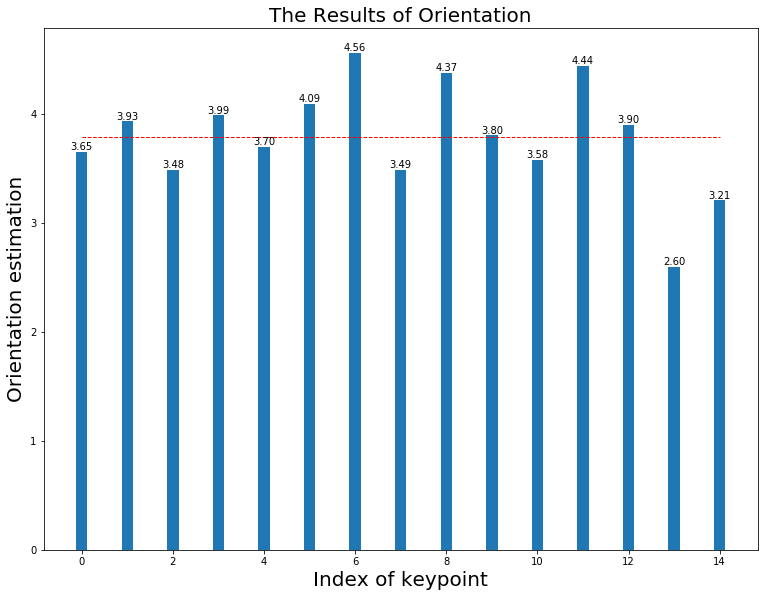

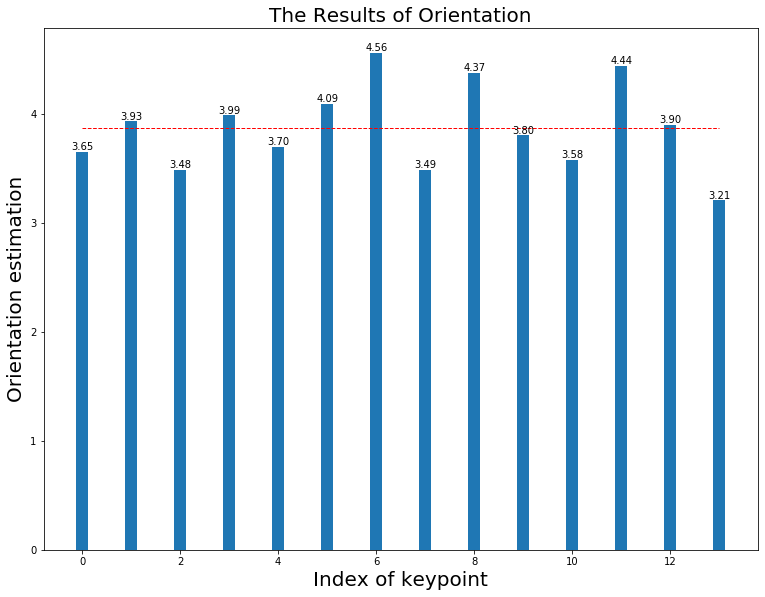

----------------------------------------------------------------------------------------------------3.7999999999999994
FD Rotate(3.8):mean(4.100), median(4.100) in 0.096
The HoG estimation when (3.8) is  4
The HoG & FD estimation when (3.8) is 4.10


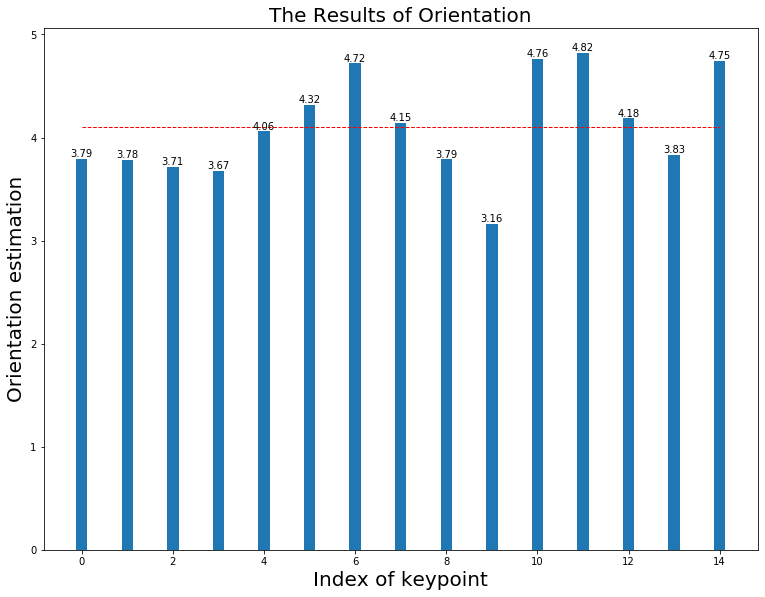

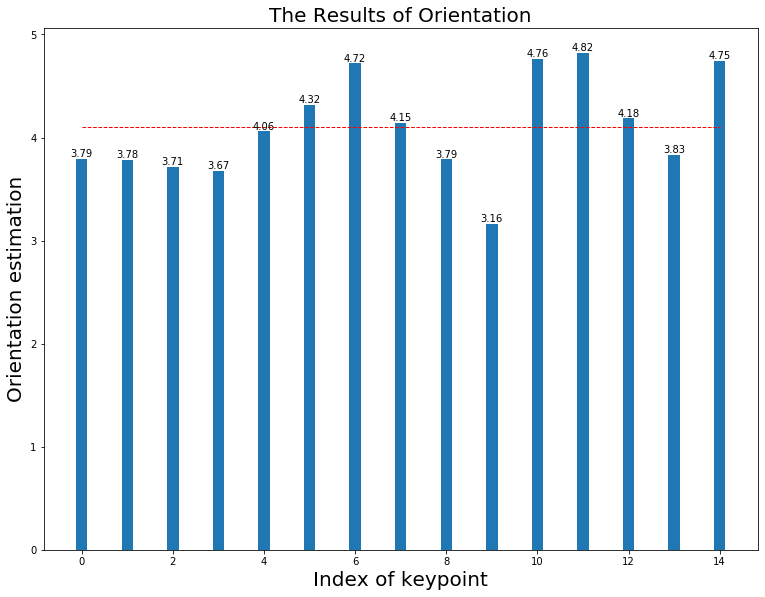

----------------------------------------------------------------------------------------------------3.8999999999999995
FD Rotate(3.9):mean(4.044), median(4.044) in 0.096
The HoG estimation when (3.9) is  4
The HoG & FD estimation when (3.9) is 4.05


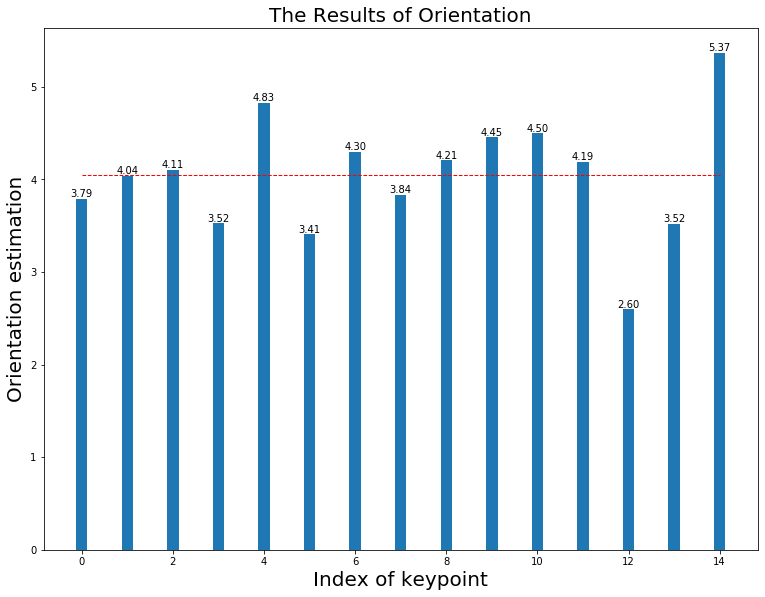

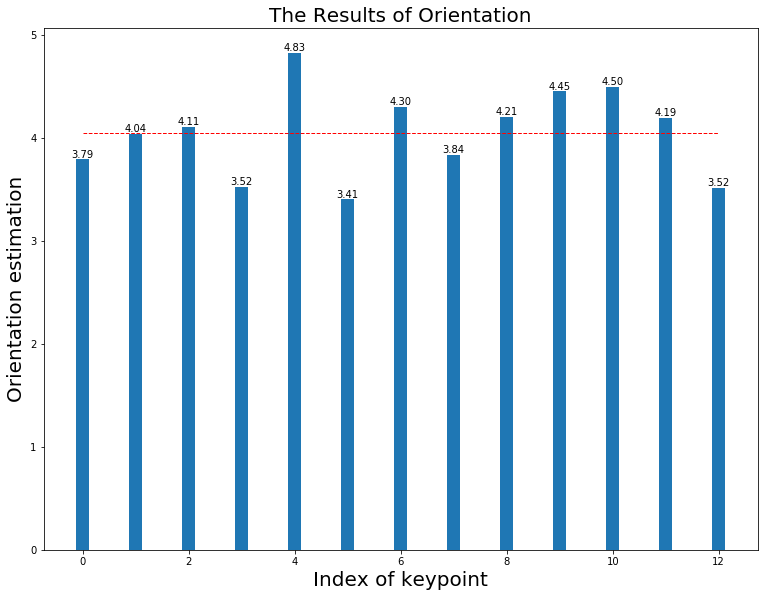

----------------------------------------------------------------------------------------------------3.999999999999999
FD Rotate(4.0):mean(4.122), median(4.122) in 0.100
The HoG estimation when (4.0) is  4
The HoG & FD estimation when (4.0) is 4.12


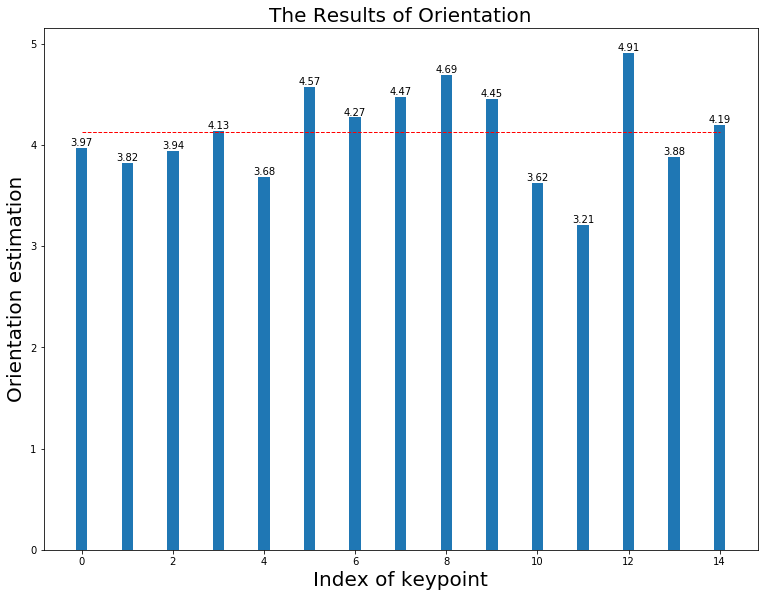

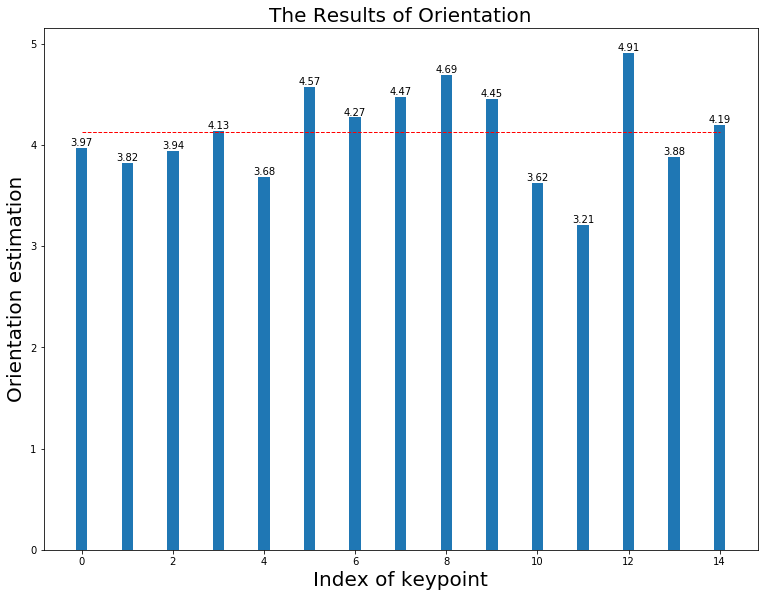

----------------------------------------------------------------------------------------------------4.1
FD Rotate(4.1):mean(4.078), median(4.078) in 0.099
The HoG estimation when (4.1) is  4
The HoG & FD estimation when (4.1) is 3.91


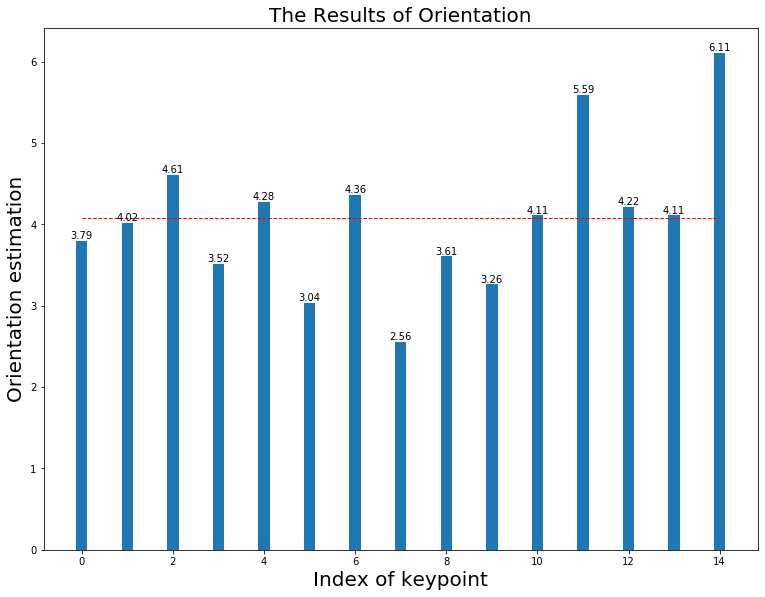

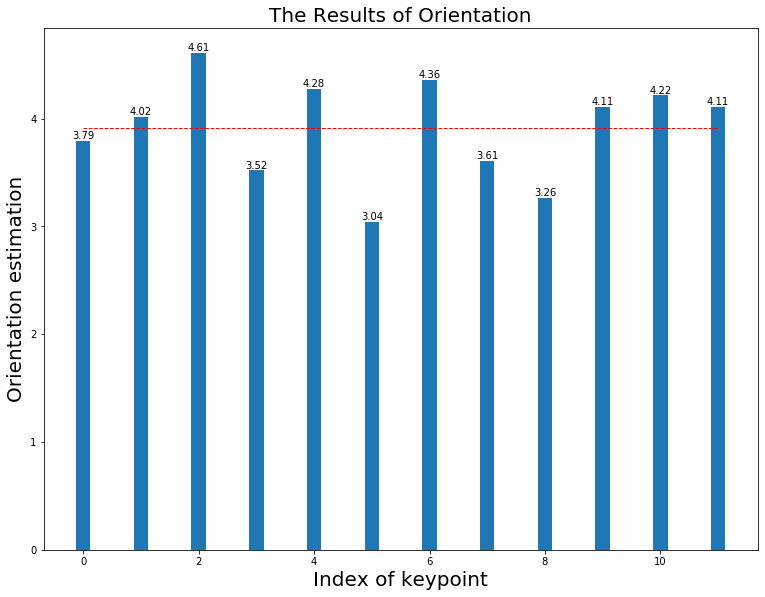

----------------------------------------------------------------------------------------------------4.199999999999999
FD Rotate(4.2):mean(4.027), median(4.027) in 0.100
The HoG estimation when (4.2) is  4
The HoG & FD estimation when (4.2) is 4.16


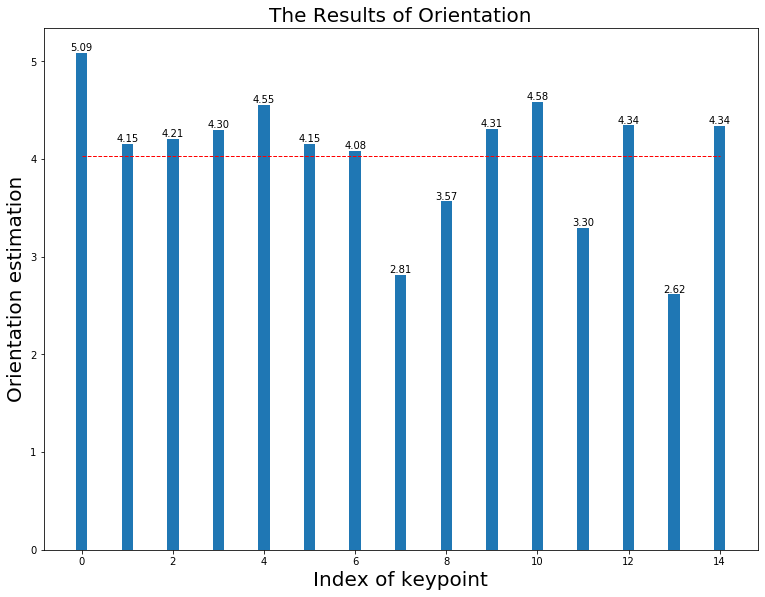

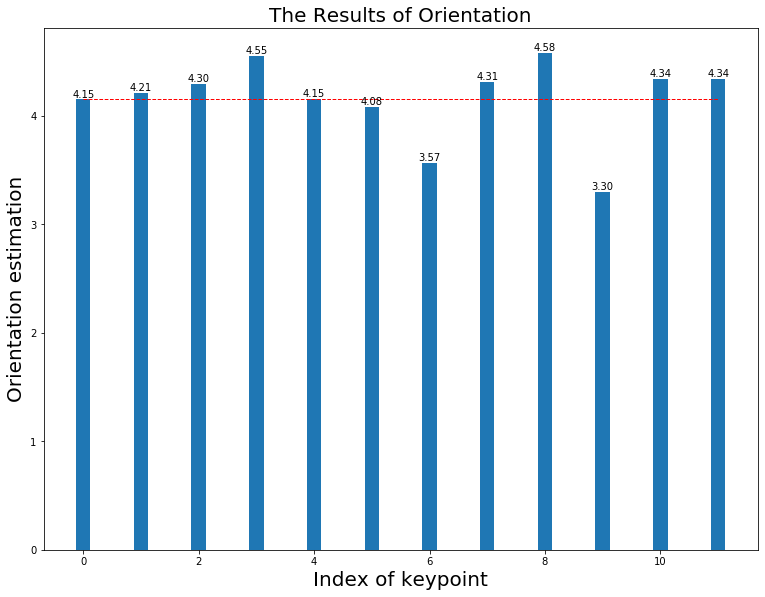

----------------------------------------------------------------------------------------------------4.299999999999999
FD Rotate(4.3):mean(4.183), median(4.183) in 0.095
The HoG estimation when (4.3) is  4
The HoG & FD estimation when (4.3) is 4.11


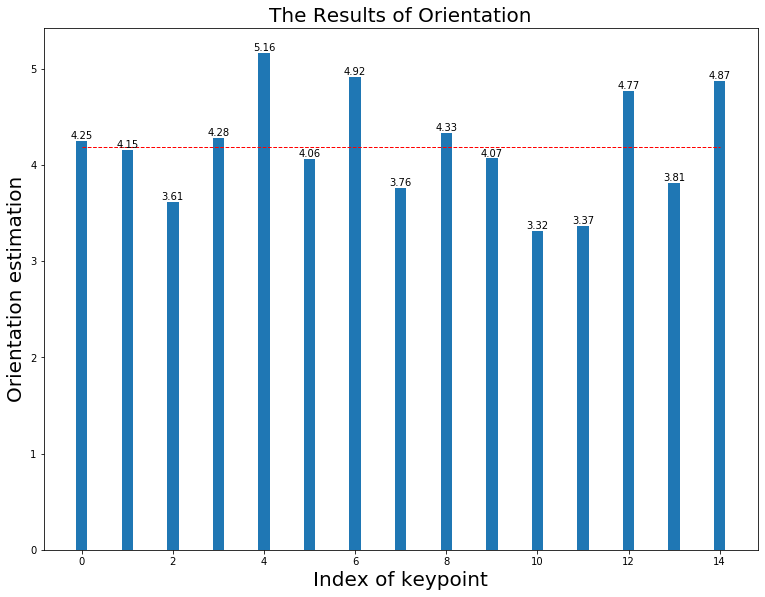

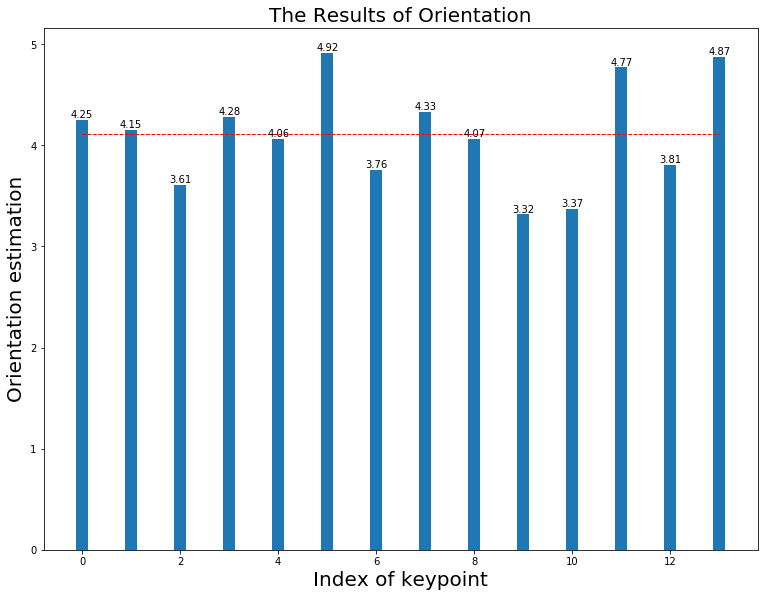

----------------------------------------------------------------------------------------------------4.399999999999999
FD Rotate(4.4):mean(4.544), median(4.544) in 0.099
The HoG estimation when (4.4) is  5
The HoG & FD estimation when (4.4) is 4.81


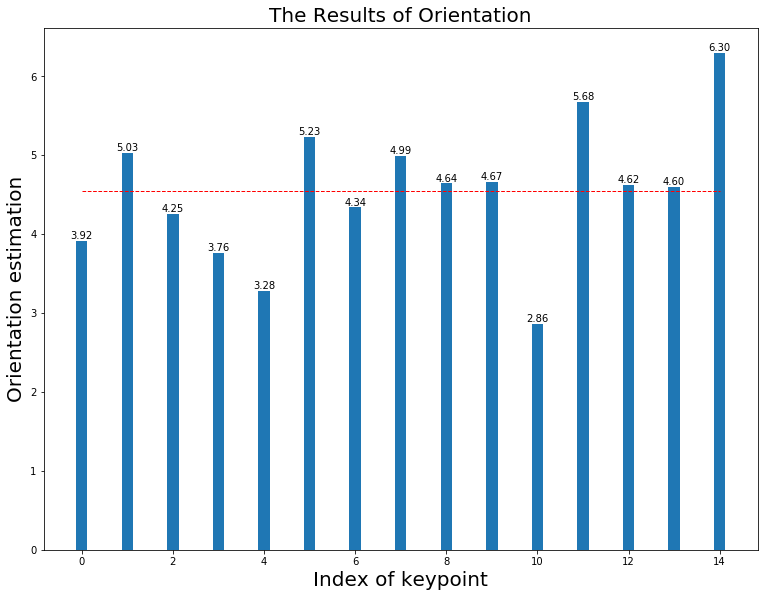

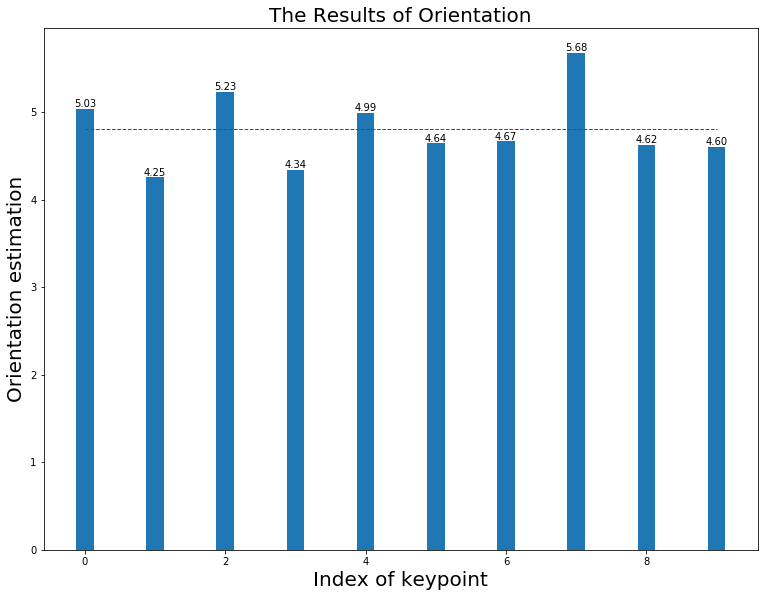

----------------------------------------------------------------------------------------------------4.499999999999999
FD Rotate(4.5):mean(4.475), median(4.475) in 0.102
The HoG estimation when (4.5) is  5
The HoG & FD estimation when (4.5) is 4.76


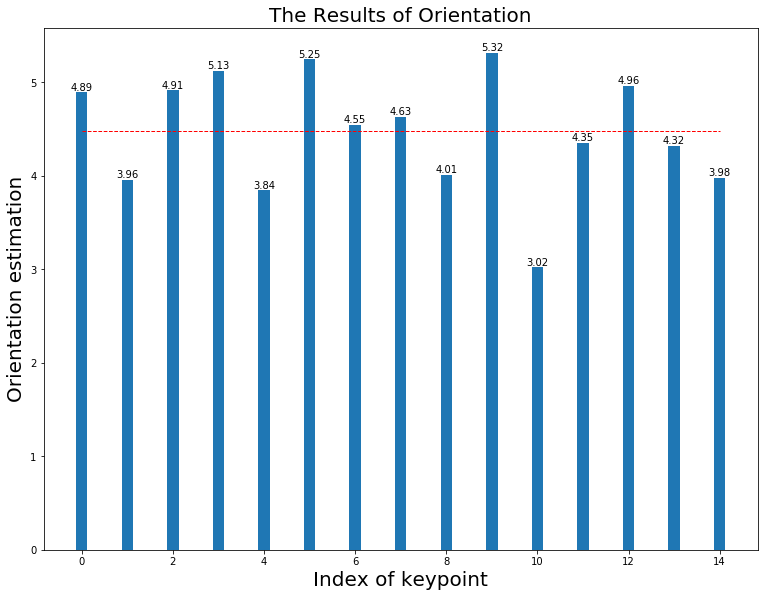

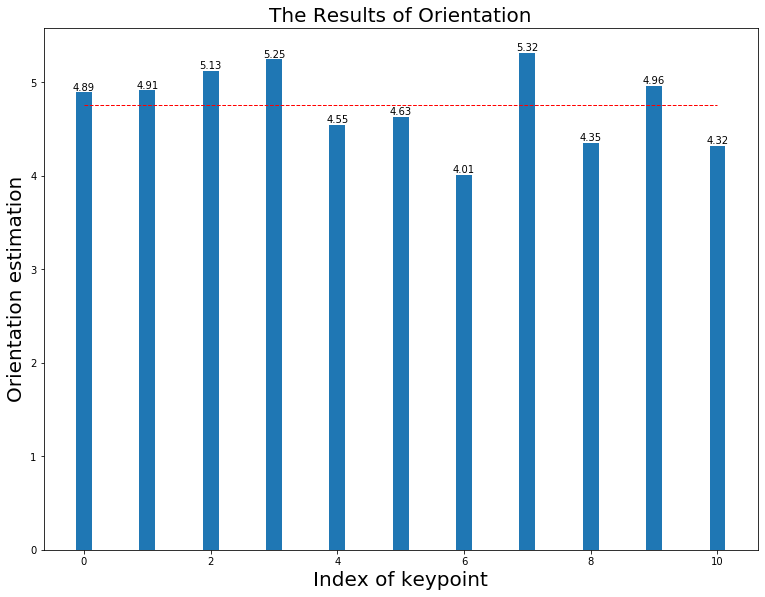

----------------------------------------------------------------------------------------------------4.599999999999999
FD Rotate(4.6):mean(4.789), median(4.789) in 0.104
The HoG estimation when (4.6) is  5
The HoG & FD estimation when (4.6) is 4.93


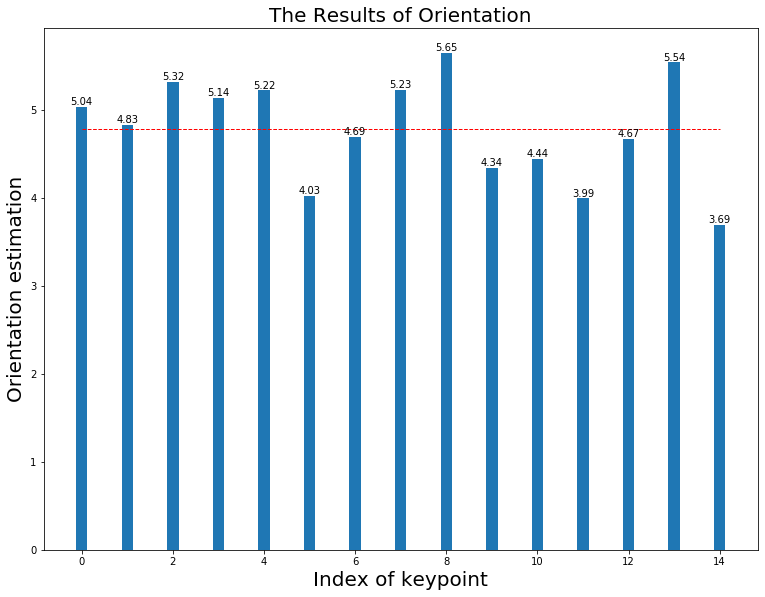

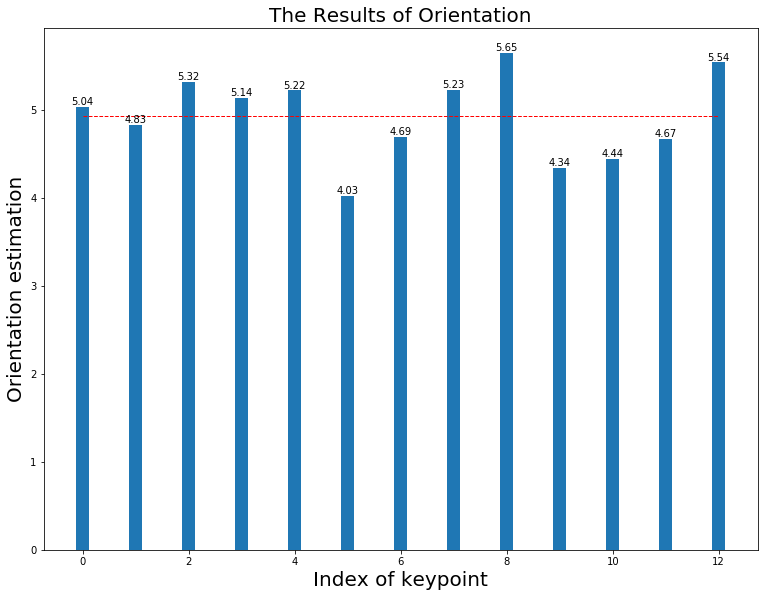

----------------------------------------------------------------------------------------------------4.699999999999999
FD Rotate(4.7):mean(4.848), median(4.848) in 0.105
The HoG estimation when (4.7) is  5
The HoG & FD estimation when (4.7) is 4.91


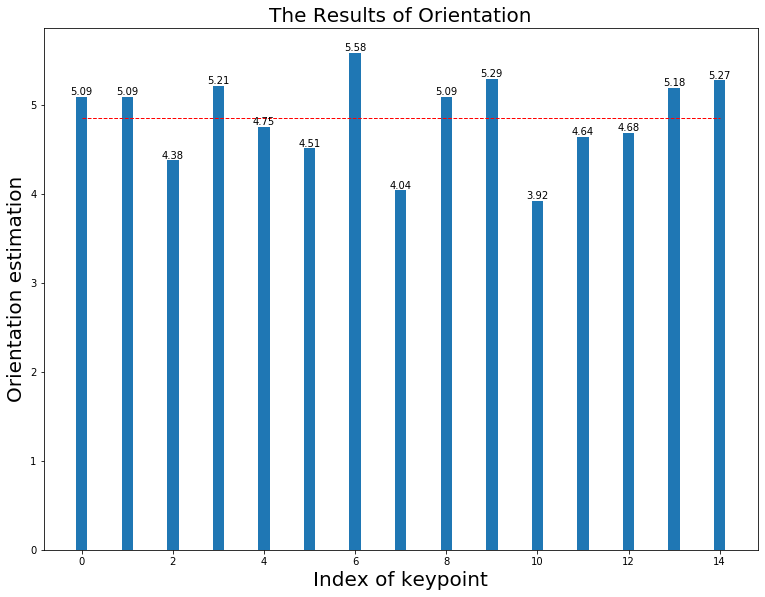

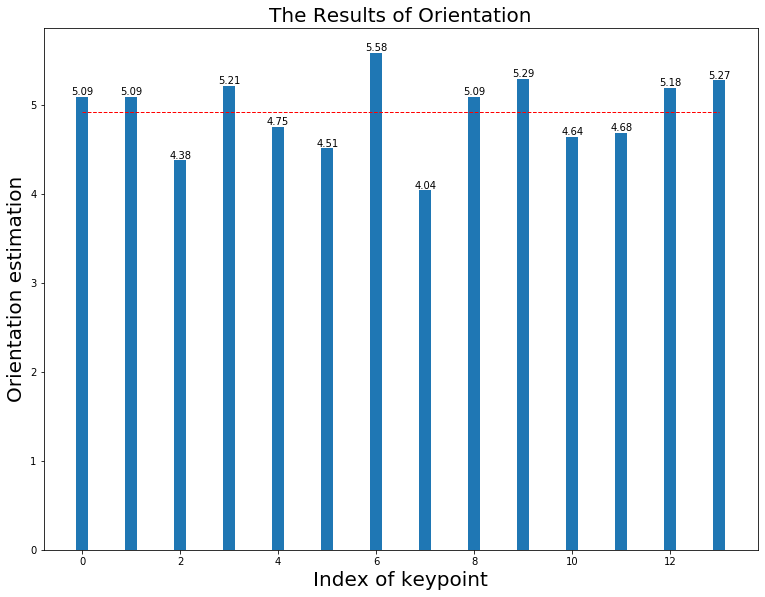

----------------------------------------------------------------------------------------------------4.799999999999999
FD Rotate(4.8):mean(4.733), median(4.733) in 0.110
The HoG estimation when (4.8) is  5
The HoG & FD estimation when (4.8) is 4.88


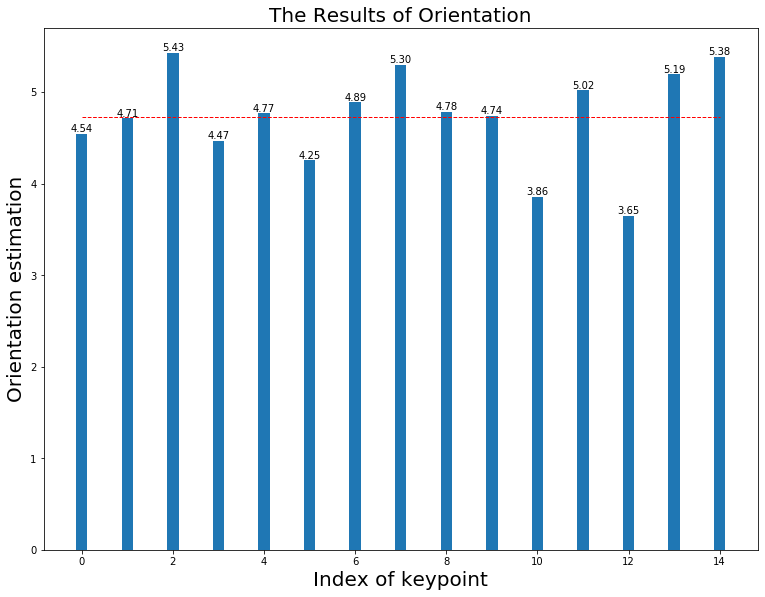

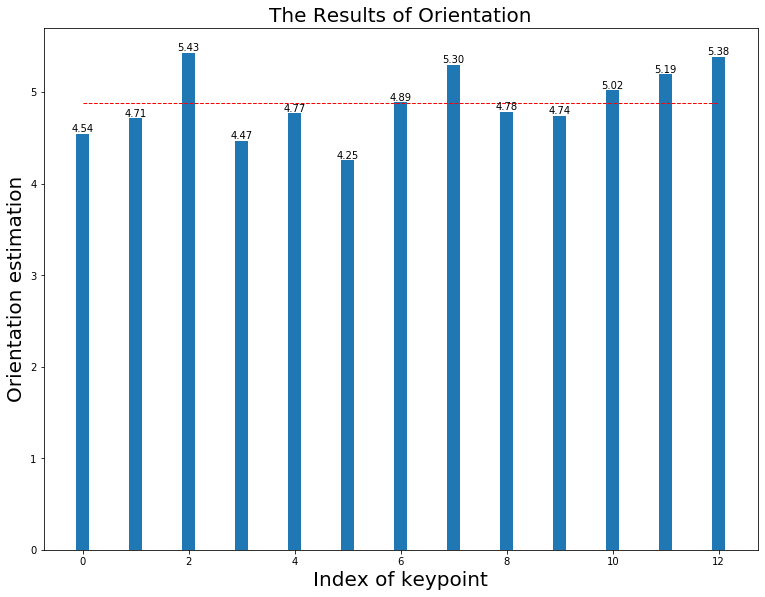

----------------------------------------------------------------------------------------------------4.899999999999999
FD Rotate(4.9):mean(5.122), median(5.122) in 0.105
The HoG estimation when (4.9) is  5
The HoG & FD estimation when (4.9) is 5.12


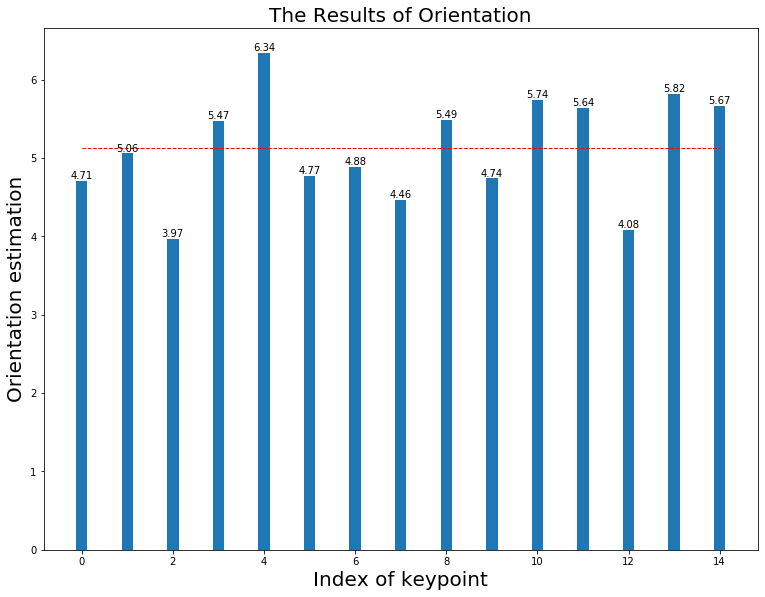

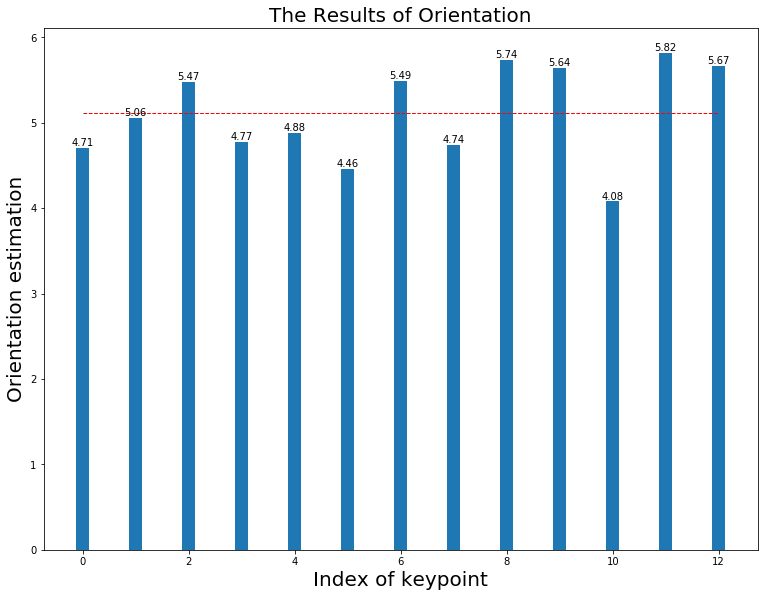

----------------------------------------------------------------------------------------------------4.999999999999999
FD Rotate(5.0):mean(5.101), median(5.101) in 0.101
The HoG estimation when (5.0) is  5
The HoG & FD estimation when (5.0) is 5.14


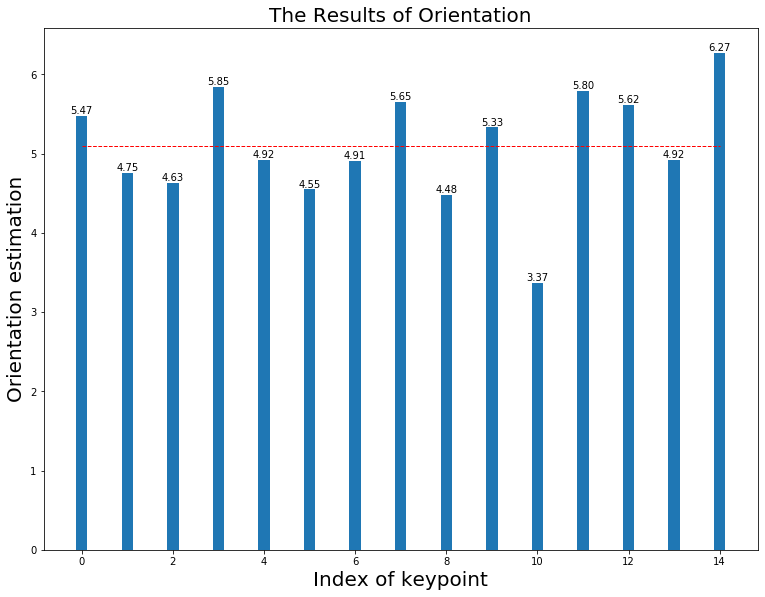

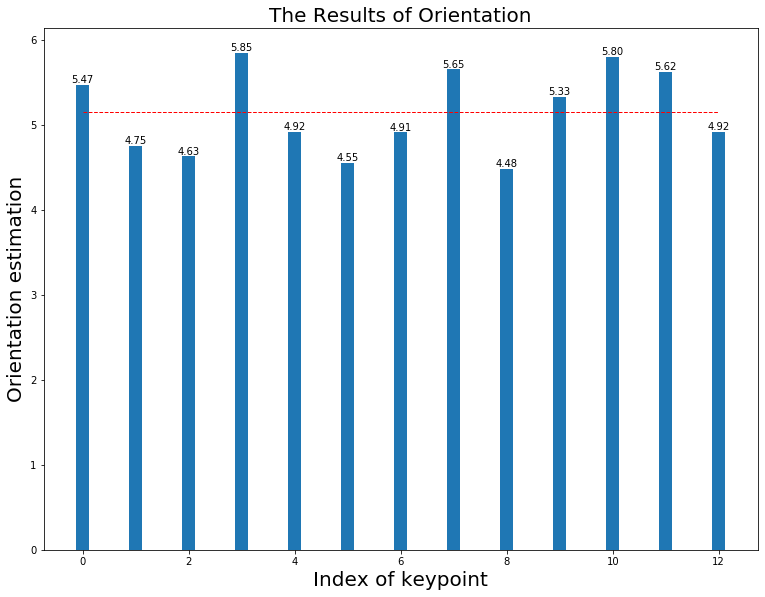

----------------------------------------------------------------------------------------------------5.099999999999999
FD Rotate(5.1):mean(5.468), median(5.468) in 0.104
The HoG estimation when (5.1) is  5
The HoG & FD estimation when (5.1) is 5.15


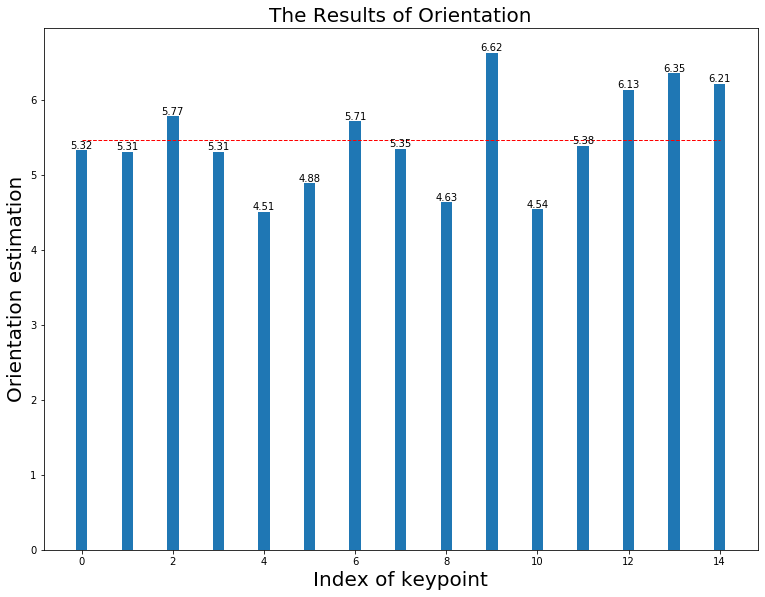

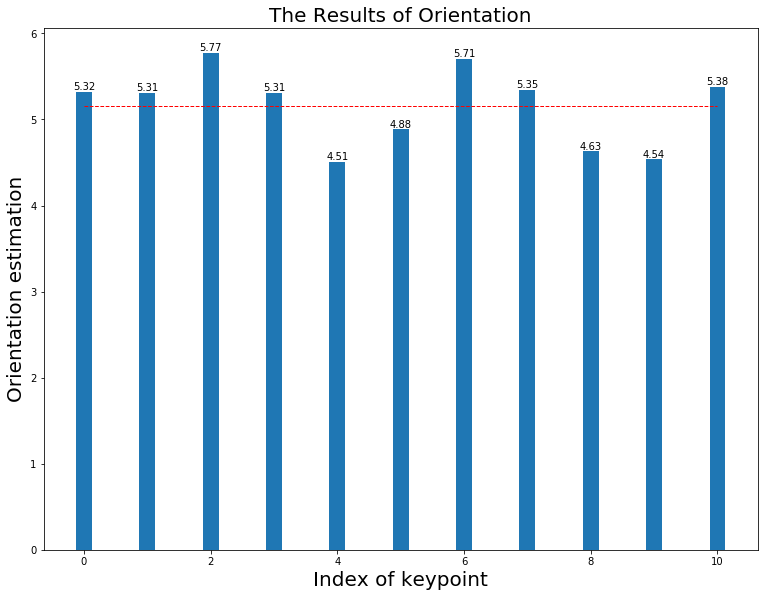

----------------------------------------------------------------------------------------------------5.199999999999999
FD Rotate(5.2):mean(5.153), median(5.153) in 0.104
The HoG estimation when (5.2) is  5
The HoG & FD estimation when (5.2) is 5.01


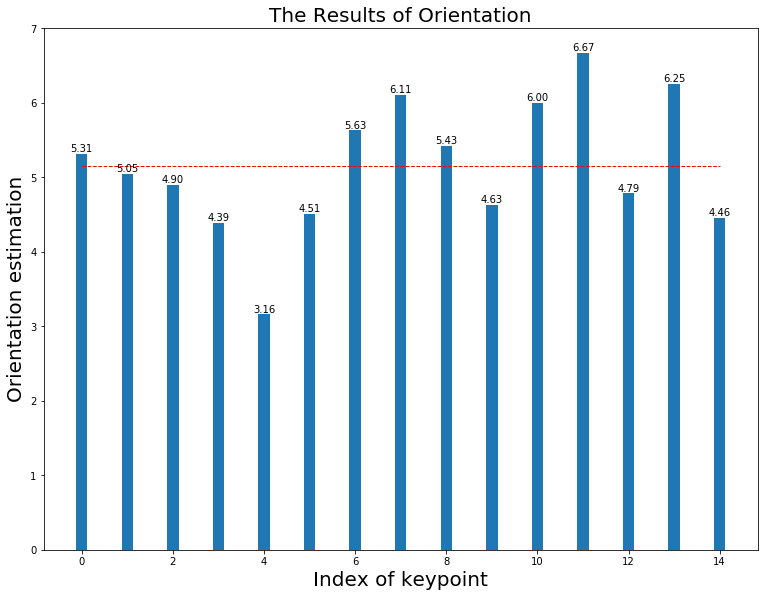

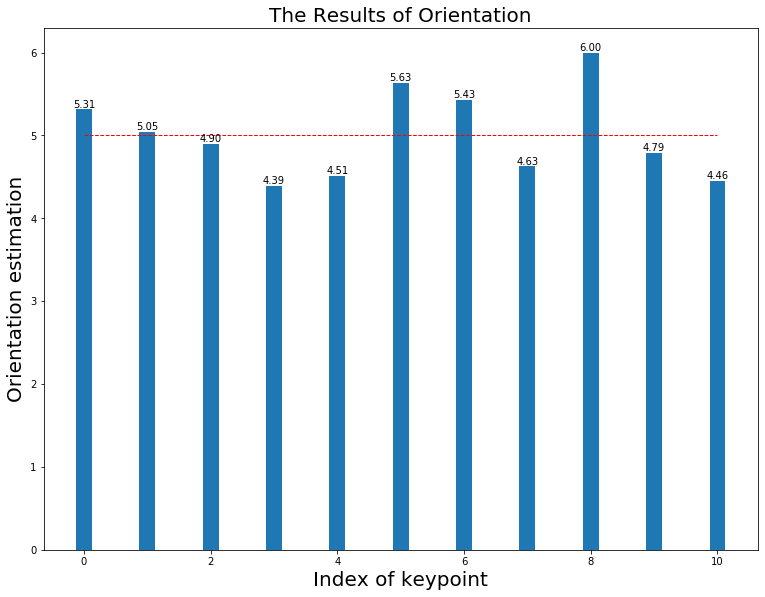

----------------------------------------------------------------------------------------------------5.299999999999999
FD Rotate(5.3):mean(5.361), median(5.361) in 0.105
The HoG estimation when (5.3) is  5
The HoG & FD estimation when (5.3) is 5.22


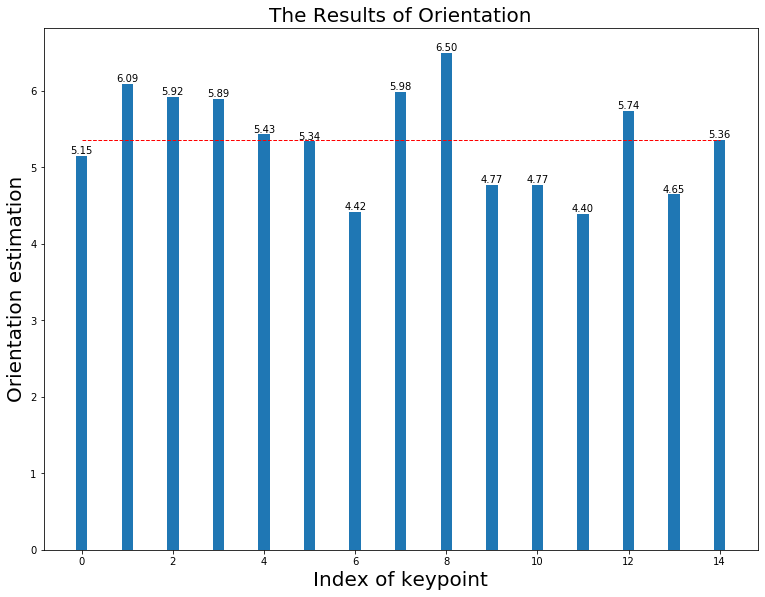

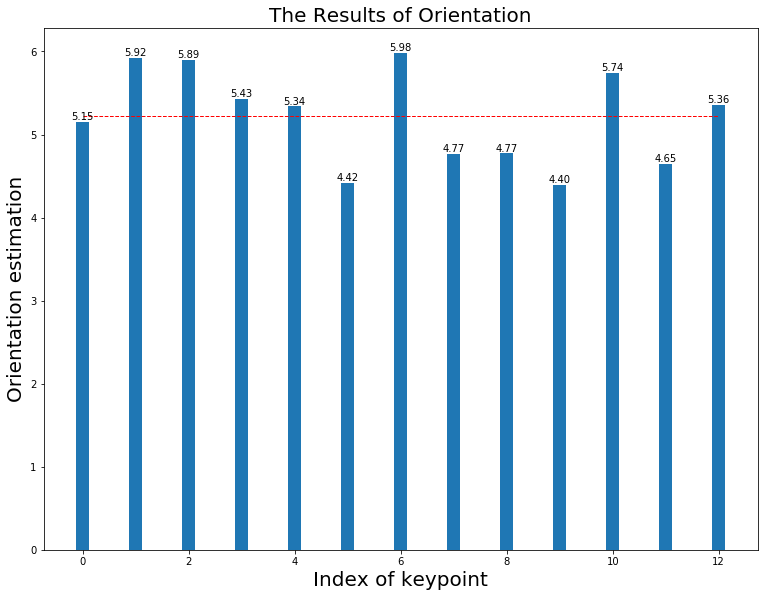

----------------------------------------------------------------------------------------------------5.399999999999999
FD Rotate(5.4):mean(5.314), median(5.314) in 0.096
The HoG estimation when (5.4) is  5
The HoG & FD estimation when (5.4) is 5.16


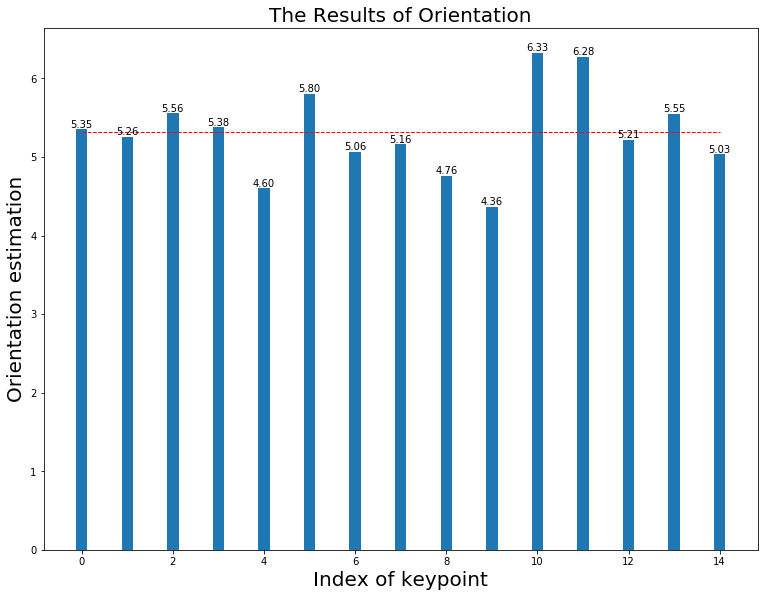

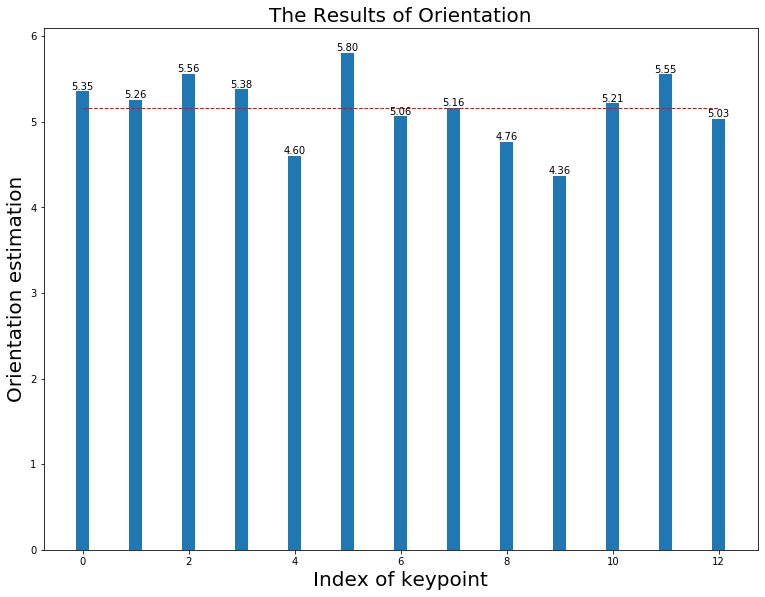

----------------------------------------------------------------------------------------------------5.499999999999999
FD Rotate(5.5):mean(5.270), median(5.270) in 0.100
The HoG estimation when (5.5) is  6
The HoG & FD estimation when (5.5) is 5.40


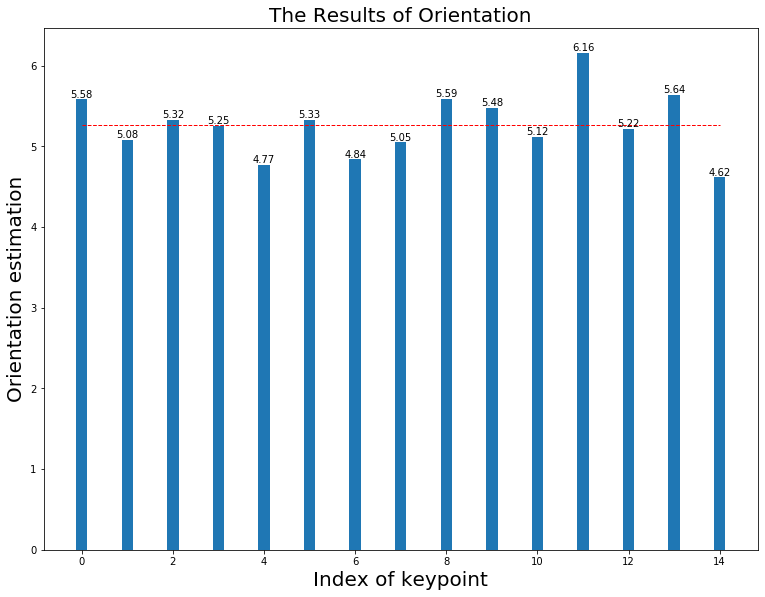

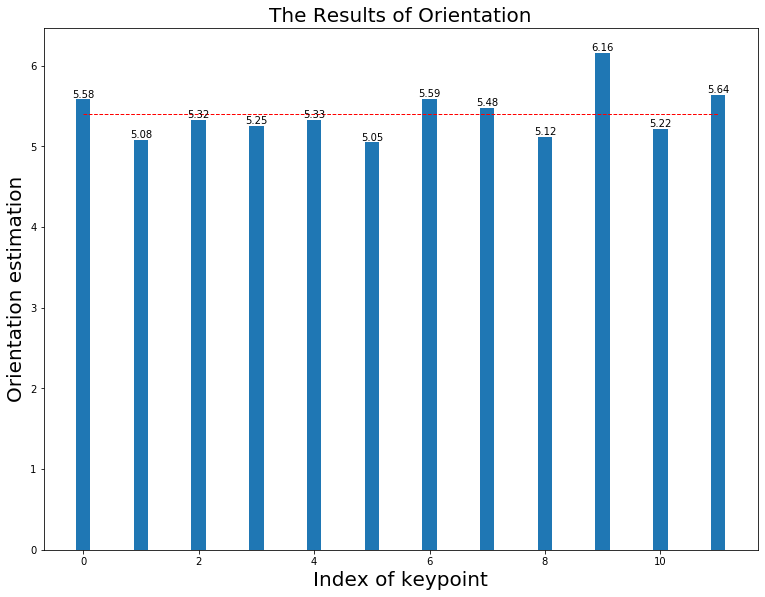

----------------------------------------------------------------------------------------------------5.599999999999999
FD Rotate(5.6):mean(5.478), median(5.478) in 0.103
The HoG estimation when (5.6) is  6
The HoG & FD estimation when (5.6) is 5.70


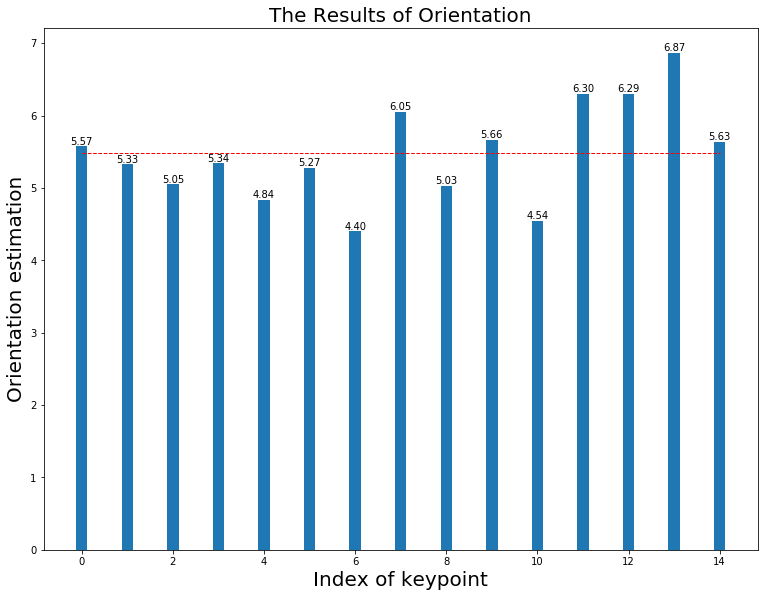

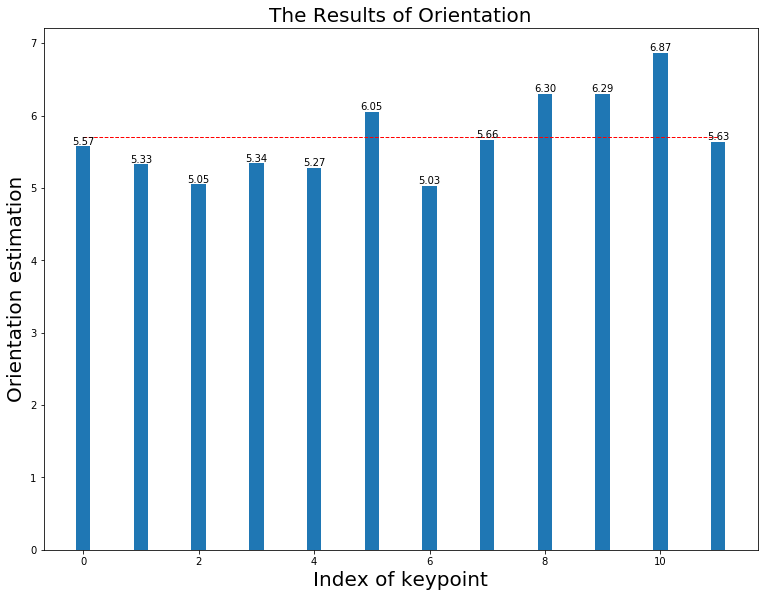

----------------------------------------------------------------------------------------------------5.699999999999999
FD Rotate(5.7):mean(5.399), median(5.399) in 0.104
The HoG estimation when (5.7) is  6
The HoG & FD estimation when (5.7) is 5.53


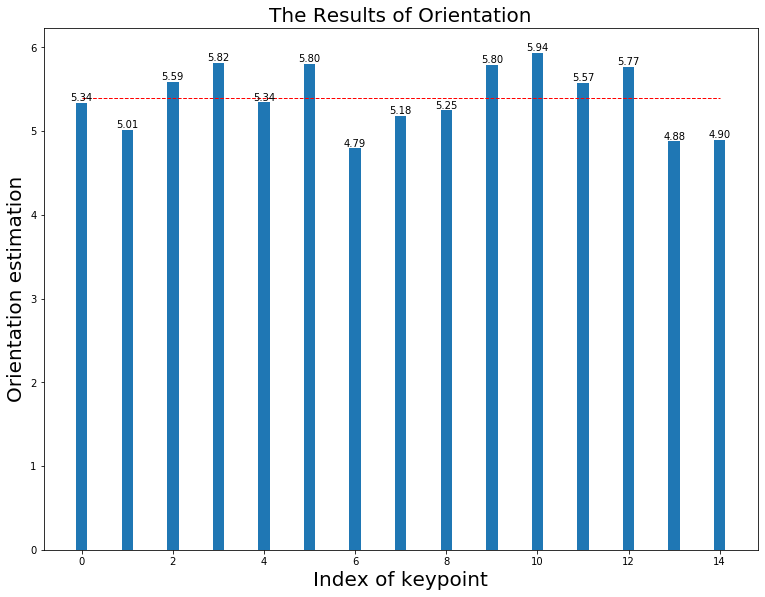

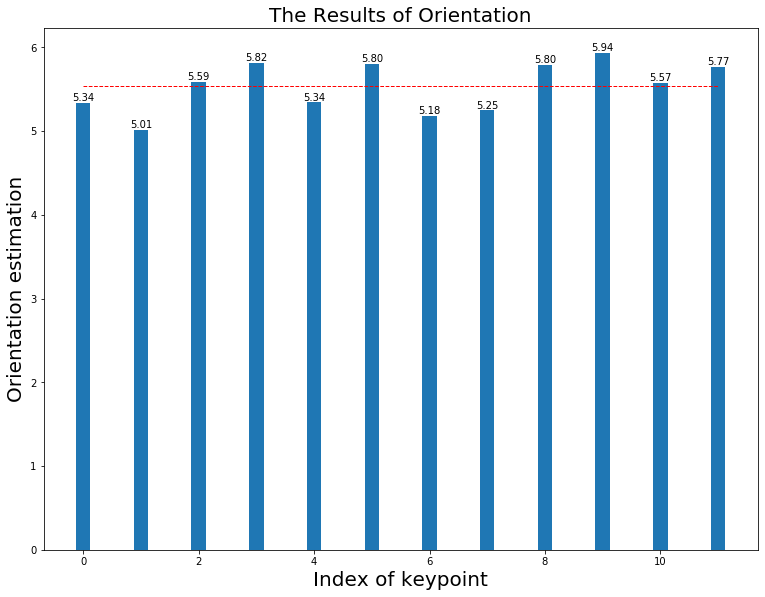

----------------------------------------------------------------------------------------------------5.799999999999999
FD Rotate(5.8):mean(5.758), median(5.758) in 0.104
The HoG estimation when (5.8) is  6
The HoG & FD estimation when (5.8) is 5.76


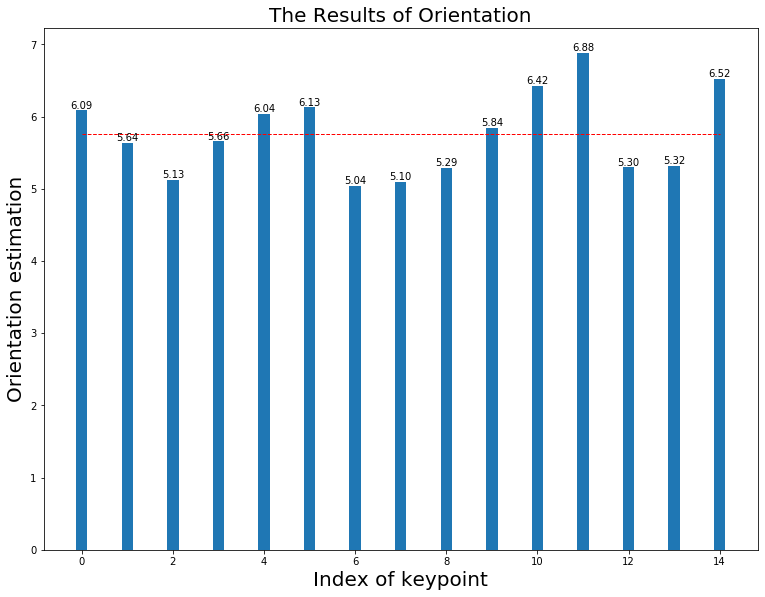

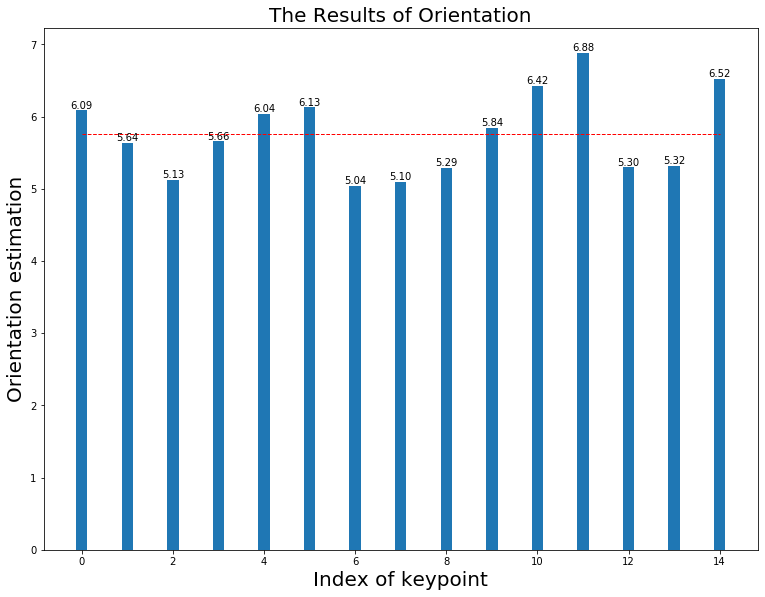

----------------------------------------------------------------------------------------------------5.899999999999999
FD Rotate(5.9):mean(5.744), median(5.744) in 0.098
The HoG estimation when (5.9) is  6
The HoG & FD estimation when (5.9) is 5.80


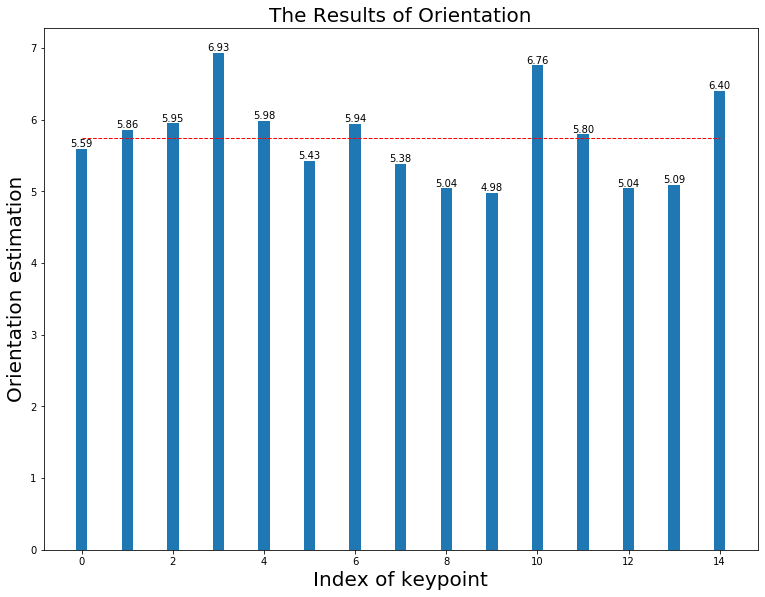

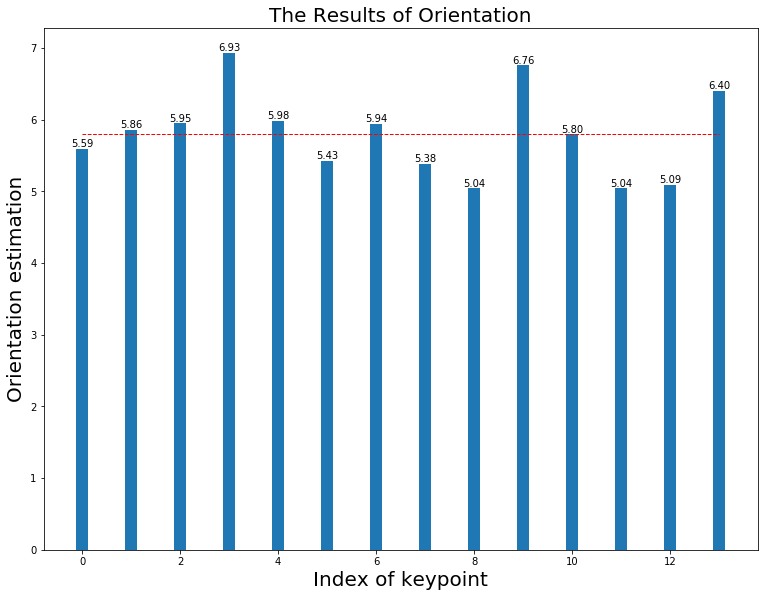

----------------------------------------------------------------------------------------------------5.999999999999999
FD Rotate(6.0):mean(5.910), median(5.910) in 0.100
The HoG estimation when (6.0) is  6
The HoG & FD estimation when (6.0) is 5.91


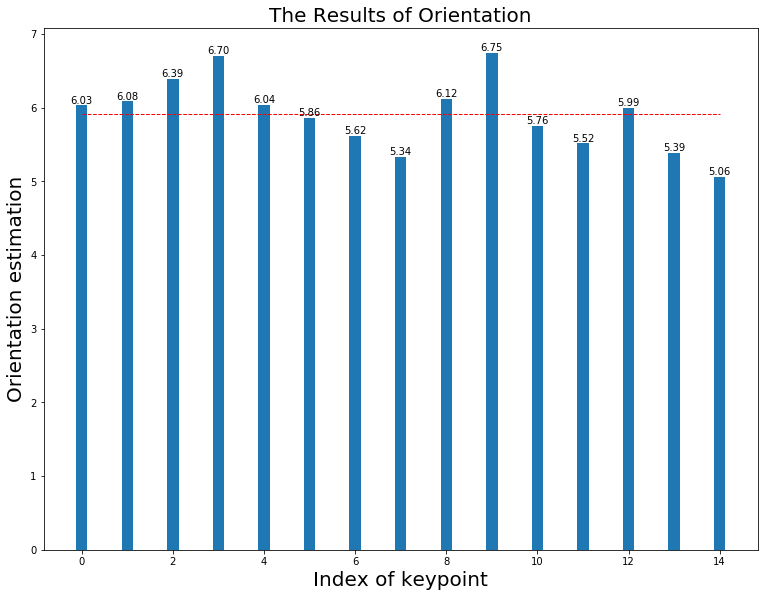

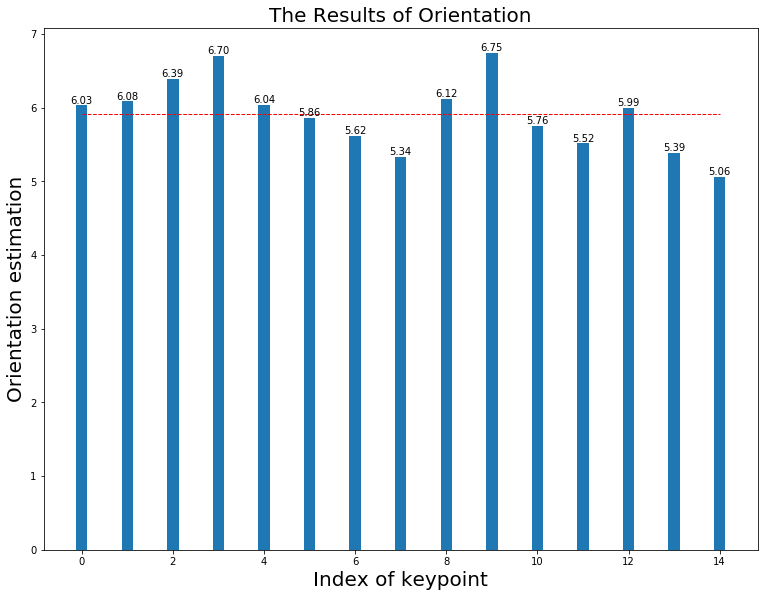

----------------------------------------------------------------------------------------------------6.099999999999999
FD Rotate(6.1):mean(6.204), median(6.204) in 0.100
The HoG estimation when (6.1) is  6
The HoG & FD estimation when (6.1) is 5.99


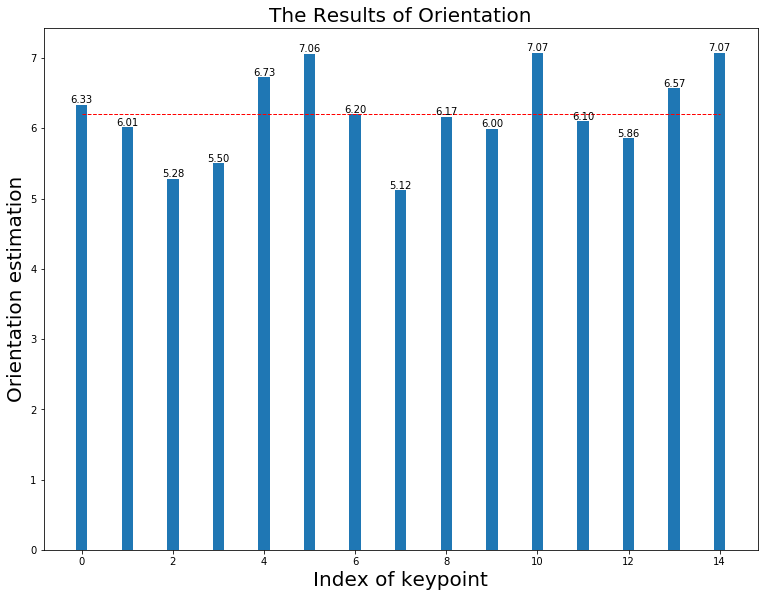

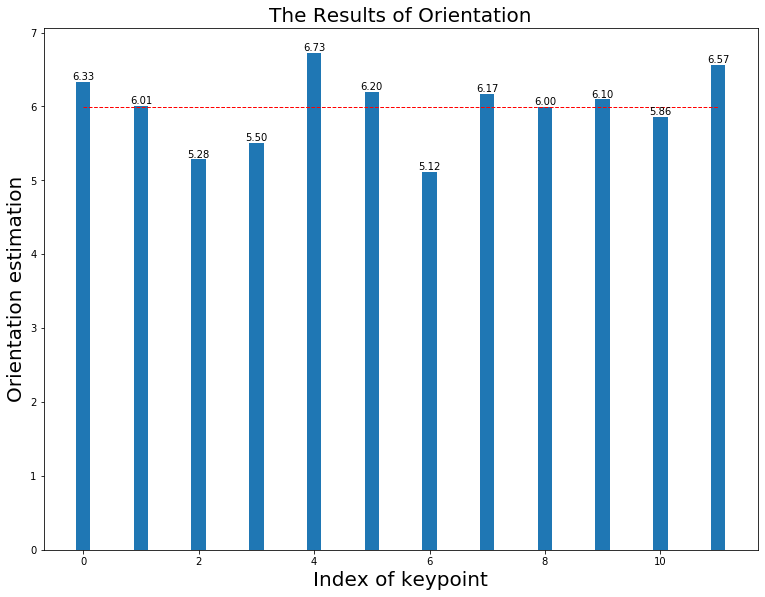

----------------------------------------------------------------------------------------------------6.199999999999998
FD Rotate(6.2):mean(6.330), median(6.330) in 0.104
The HoG estimation when (6.2) is  6
The HoG & FD estimation when (6.2) is 6.25


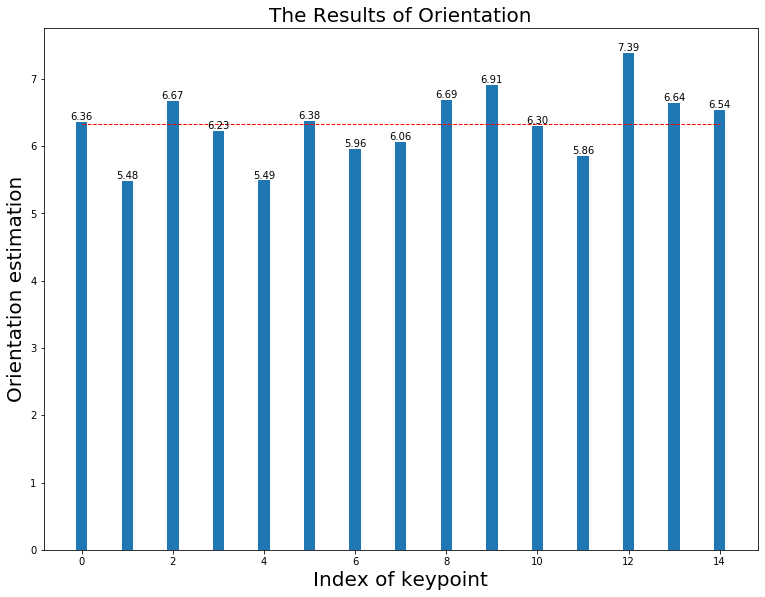

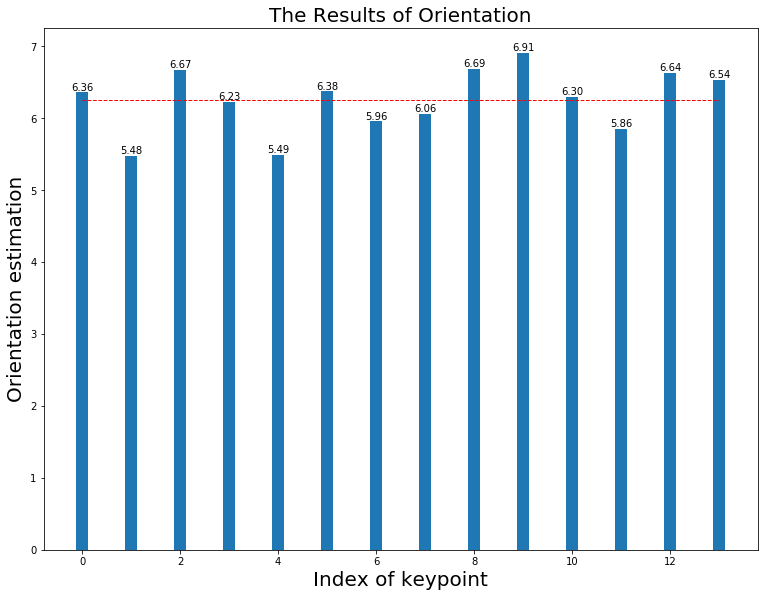

----------------------------------------------------------------------------------------------------6.299999999999999
FD Rotate(6.3):mean(6.427), median(6.427) in 0.104
The HoG estimation when (6.3) is  6
The HoG & FD estimation when (6.3) is 6.23


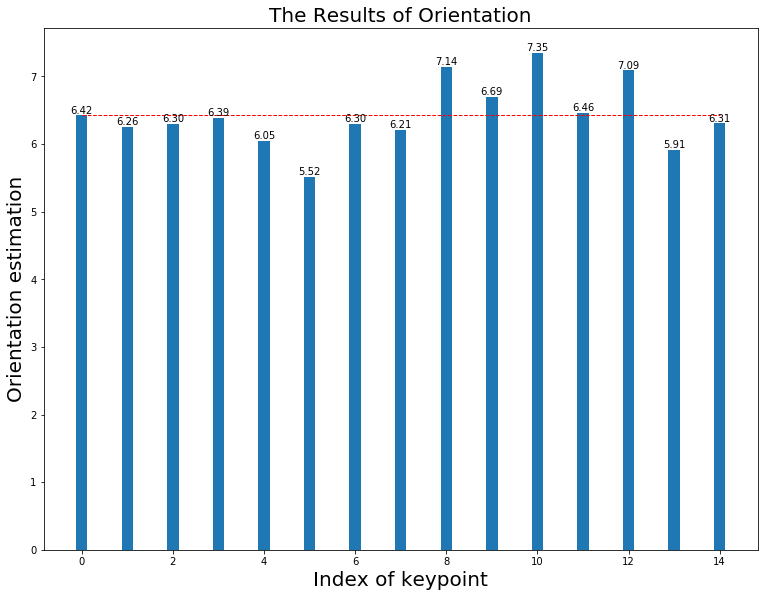

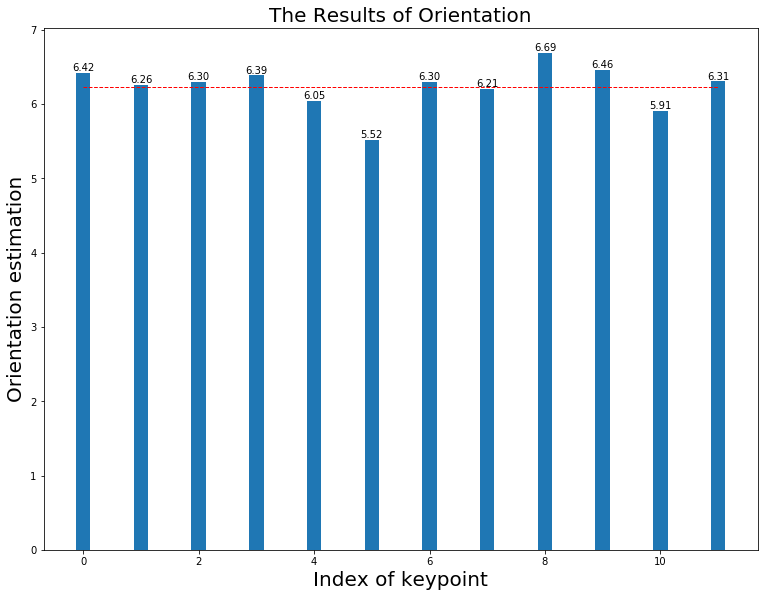

----------------------------------------------------------------------------------------------------6.399999999999999
FD Rotate(6.4):mean(6.382), median(6.382) in 0.097
The HoG estimation when (6.4) is  6
The HoG & FD estimation when (6.4) is 6.21


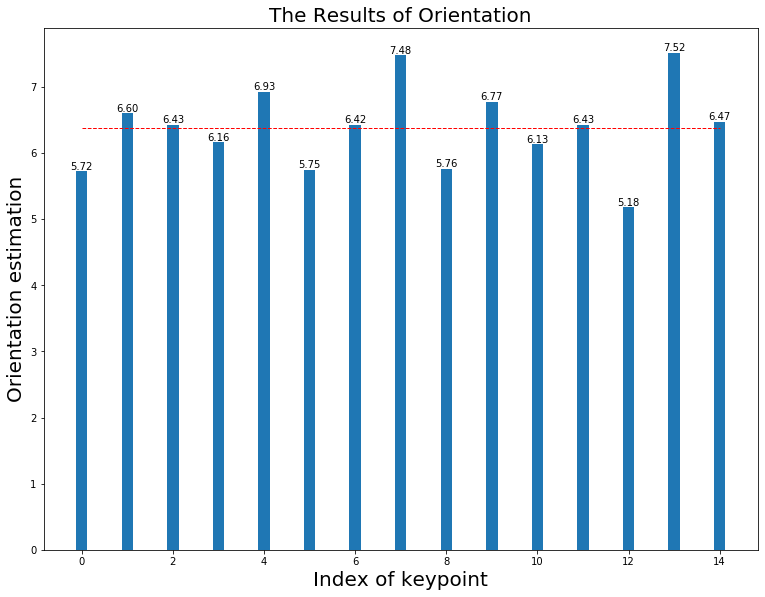

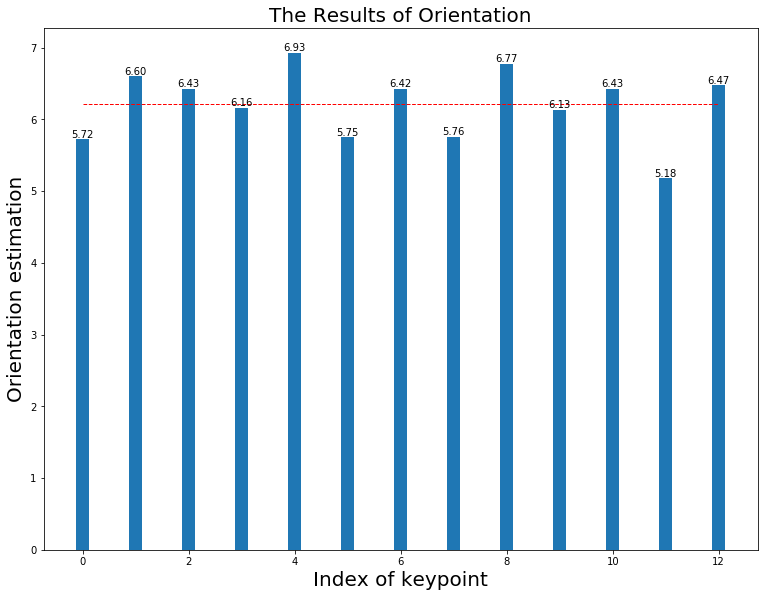

----------------------------------------------------------------------------------------------------6.499999999999998
FD Rotate(6.5):mean(6.402), median(6.402) in 0.096
The HoG estimation when (6.5) is  7
The HoG & FD estimation when (6.5) is 6.62


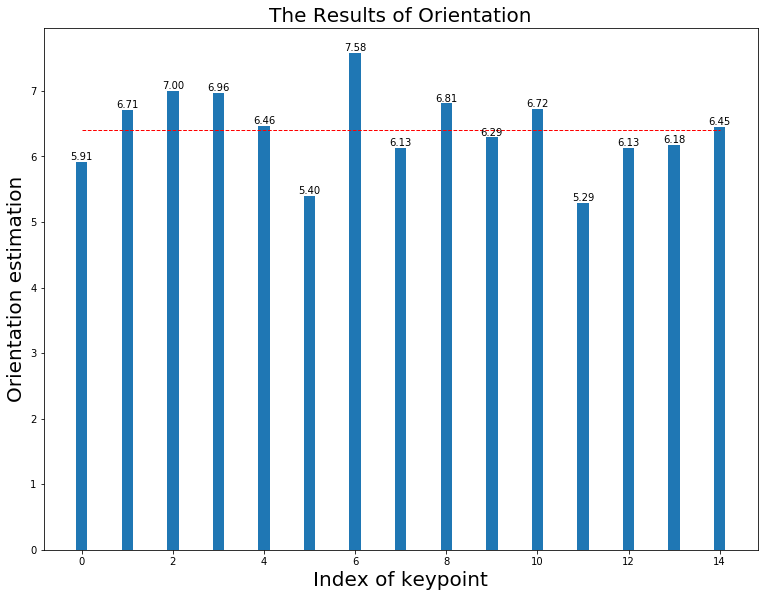

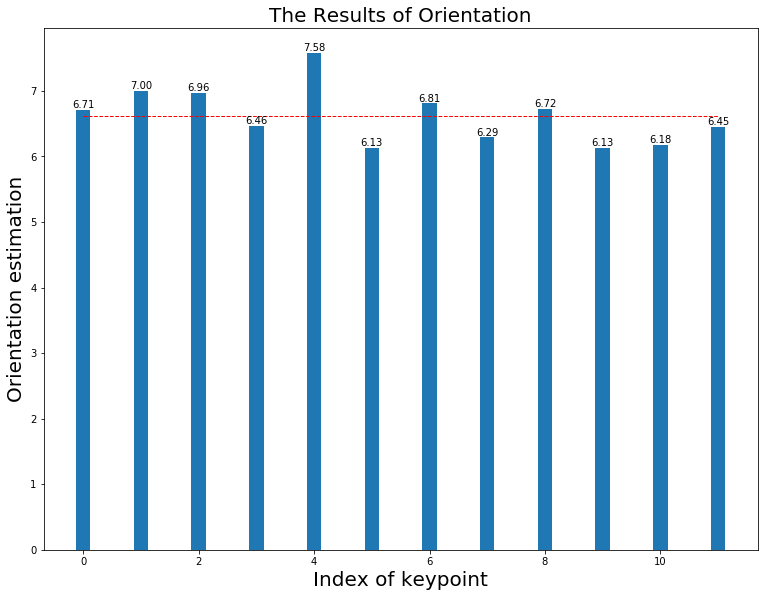

----------------------------------------------------------------------------------------------------6.599999999999999
FD Rotate(6.6):mean(6.685), median(6.685) in 0.100
The HoG estimation when (6.6) is  7
The HoG & FD estimation when (6.6) is 7.12


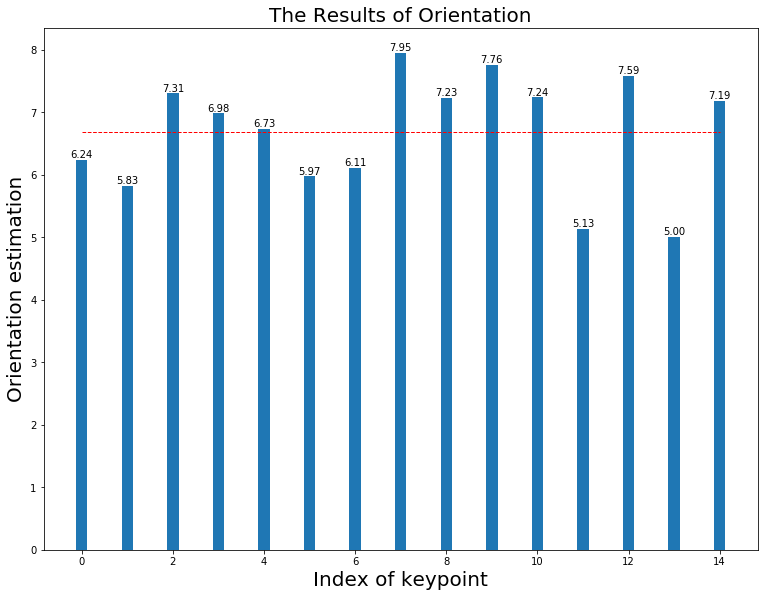

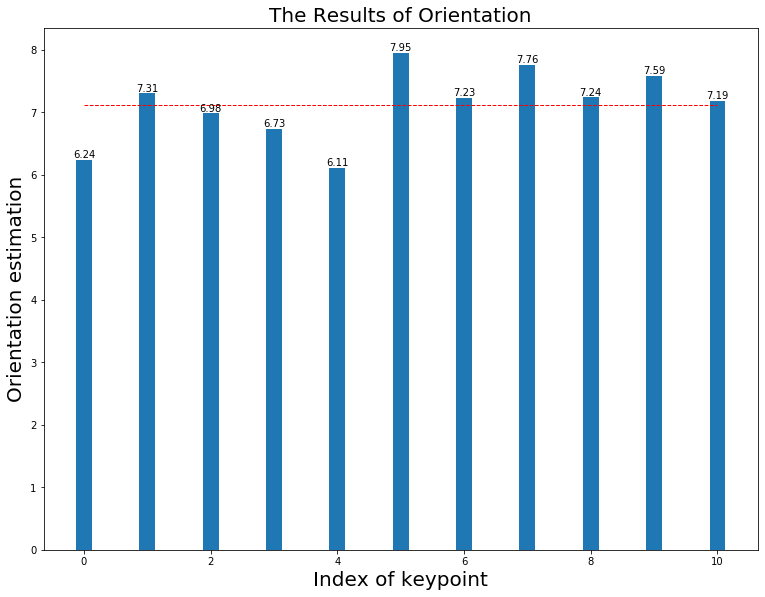

----------------------------------------------------------------------------------------------------6.699999999999998
FD Rotate(6.7):mean(6.699), median(6.699) in 0.095
The HoG estimation when (6.7) is  7
The HoG & FD estimation when (6.7) is 6.88


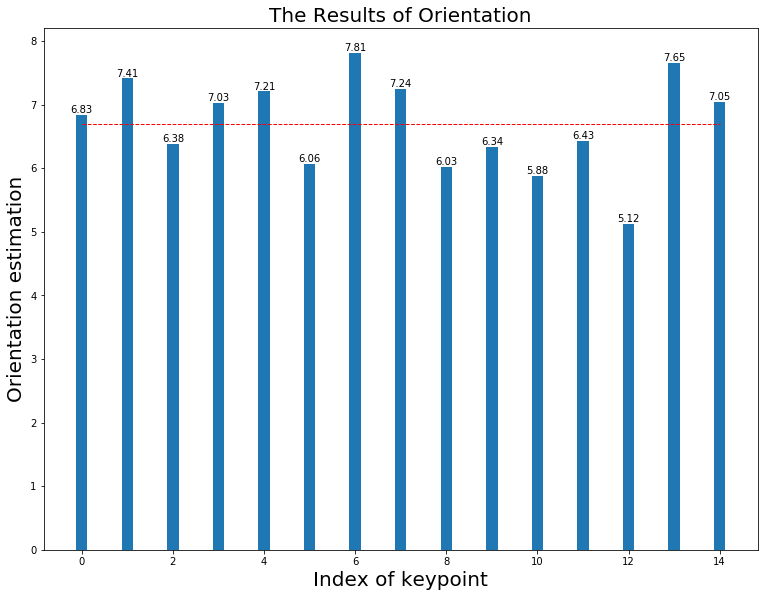

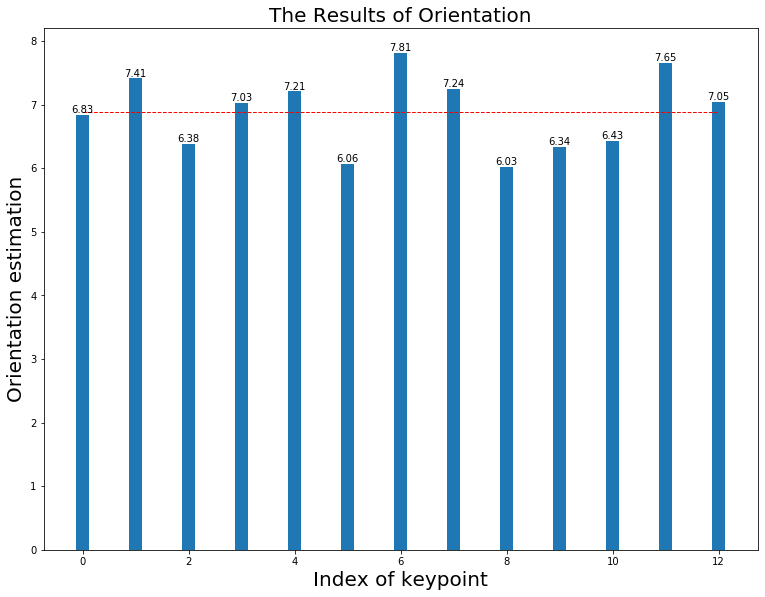

----------------------------------------------------------------------------------------------------6.799999999999999
FD Rotate(6.8):mean(6.847), median(6.847) in 0.094
The HoG estimation when (6.8) is  7
The HoG & FD estimation when (6.8) is 6.94


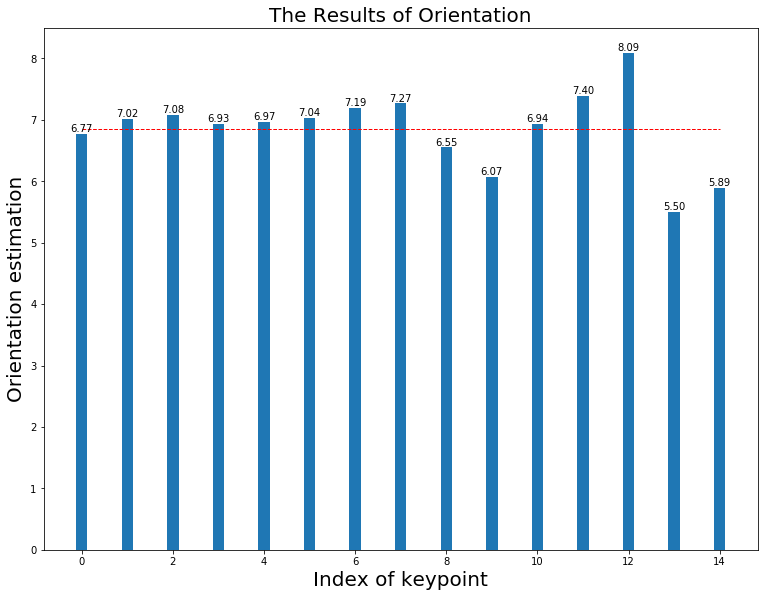

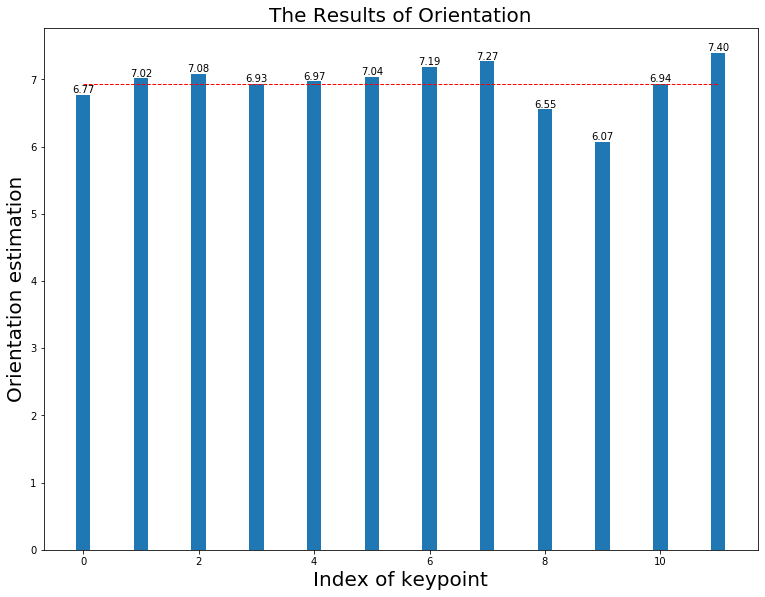

----------------------------------------------------------------------------------------------------6.899999999999999
FD Rotate(6.9):mean(7.171), median(7.171) in 0.103
The HoG estimation when (6.9) is  7
The HoG & FD estimation when (6.9) is 7.27


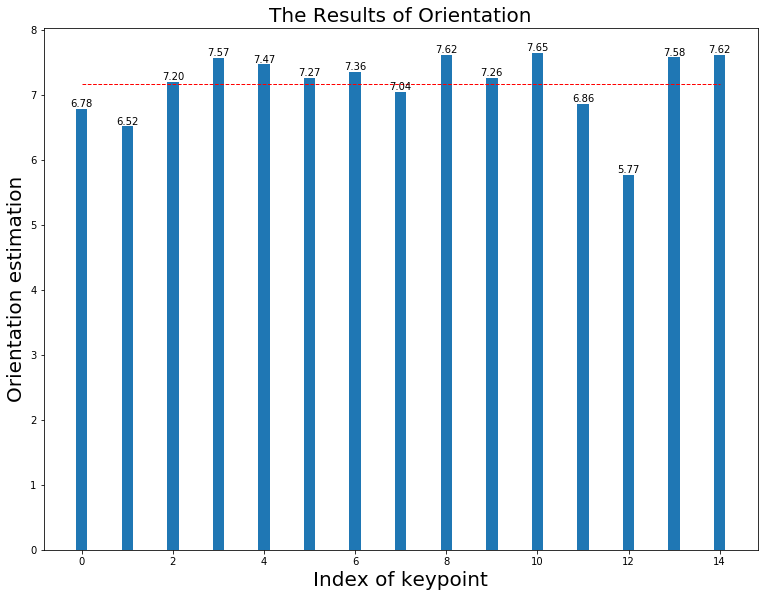

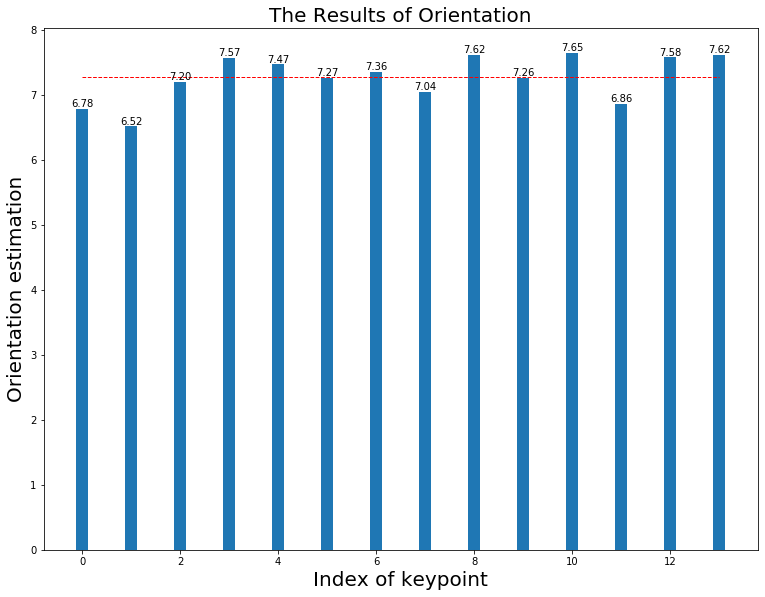

----------------------------------------------------------------------------------------------------6.999999999999998
FD Rotate(7.0):mean(6.902), median(6.902) in 0.098
The HoG estimation when (7.0) is  7
The HoG & FD estimation when (7.0) is 6.90


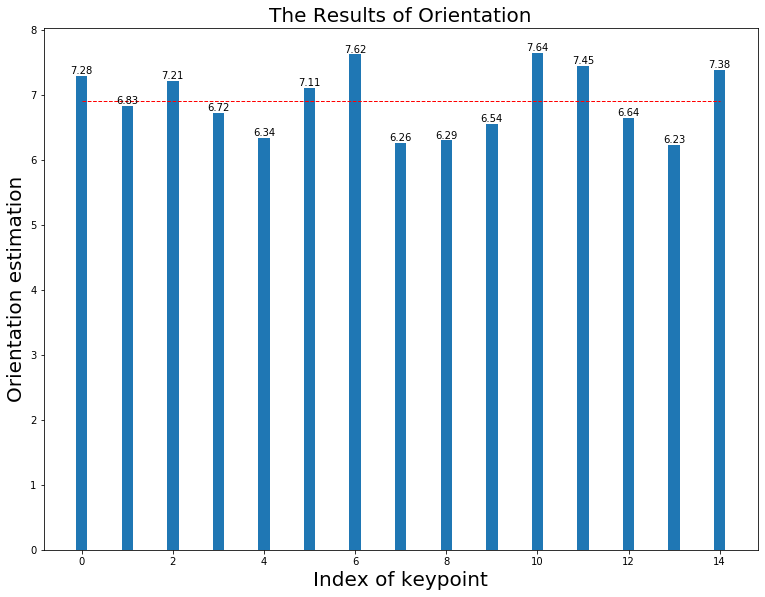

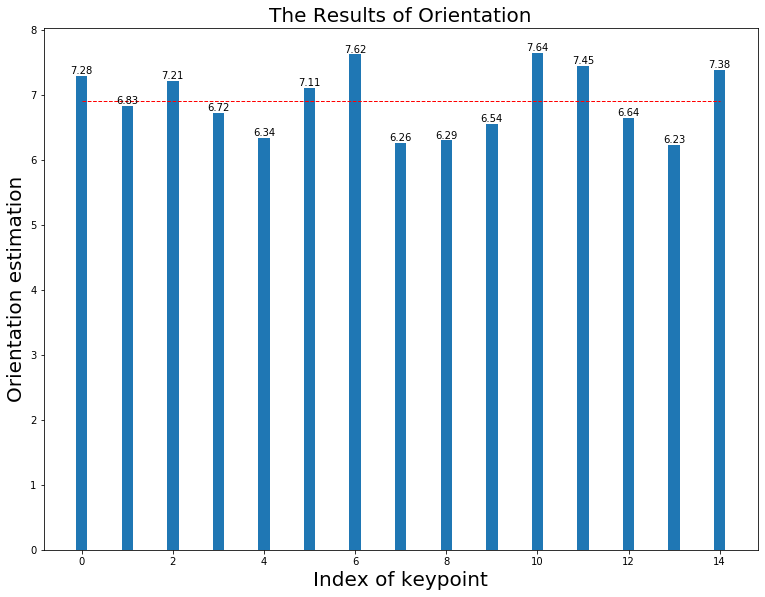

----------------------------------------------------------------------------------------------------7.099999999999999
FD Rotate(7.1):mean(7.202), median(7.202) in 0.100
The HoG estimation when (7.1) is  7
The HoG & FD estimation when (7.1) is 6.92


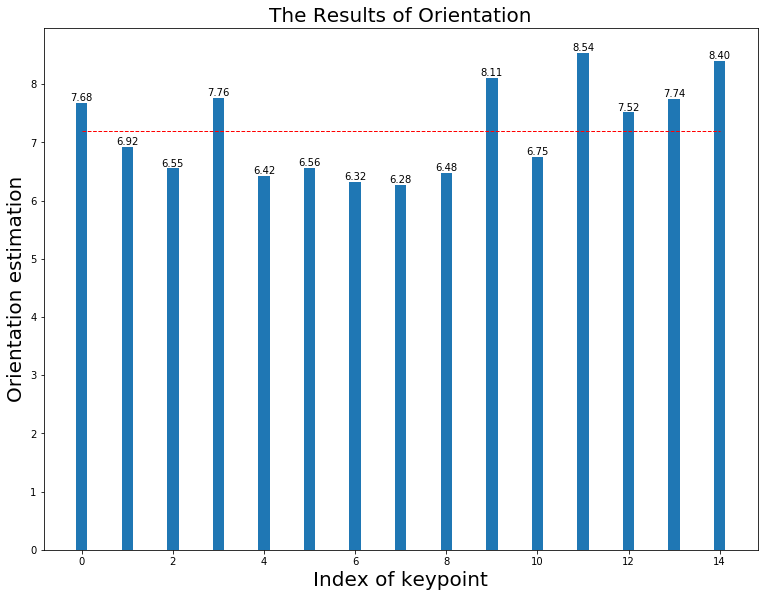

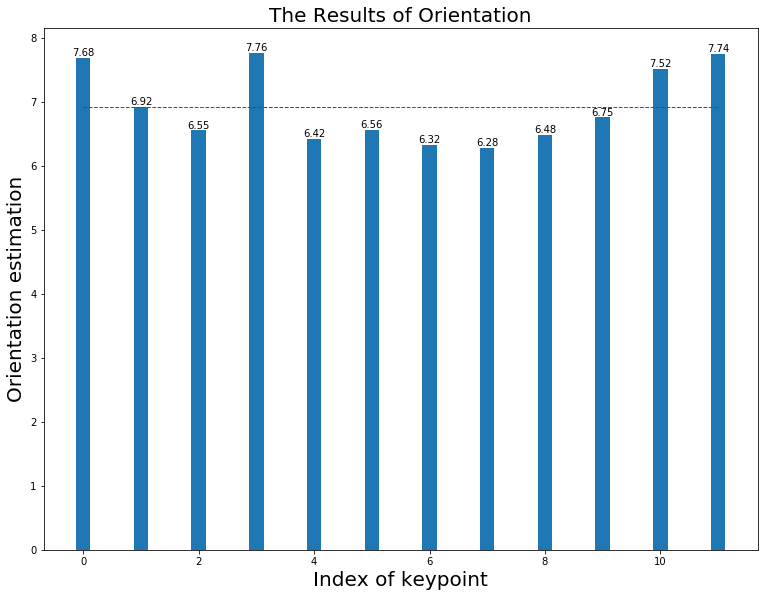

----------------------------------------------------------------------------------------------------7.199999999999998
FD Rotate(7.2):mean(7.250), median(7.250) in 0.105
The HoG estimation when (7.2) is  7
The HoG & FD estimation when (7.2) is 7.08


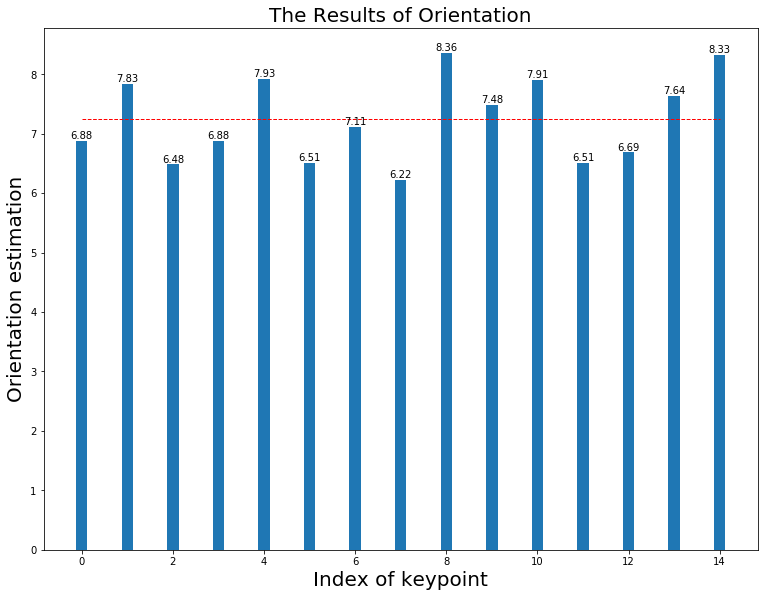

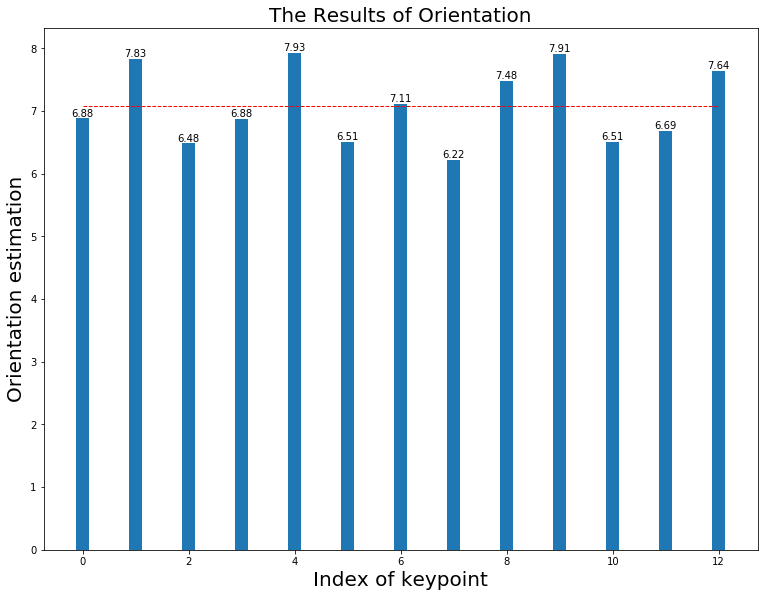

----------------------------------------------------------------------------------------------------7.299999999999999
FD Rotate(7.3):mean(7.371), median(7.371) in 0.104
The HoG estimation when (7.3) is  7
The HoG & FD estimation when (7.3) is 7.15


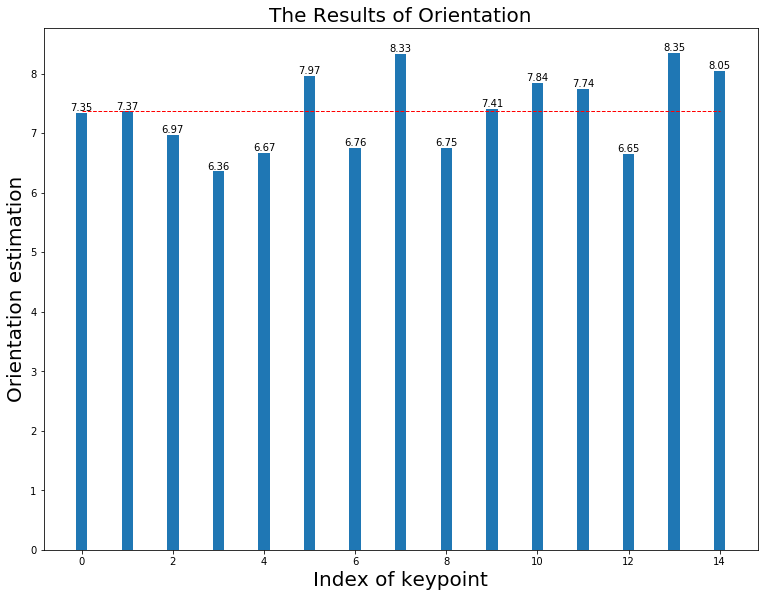

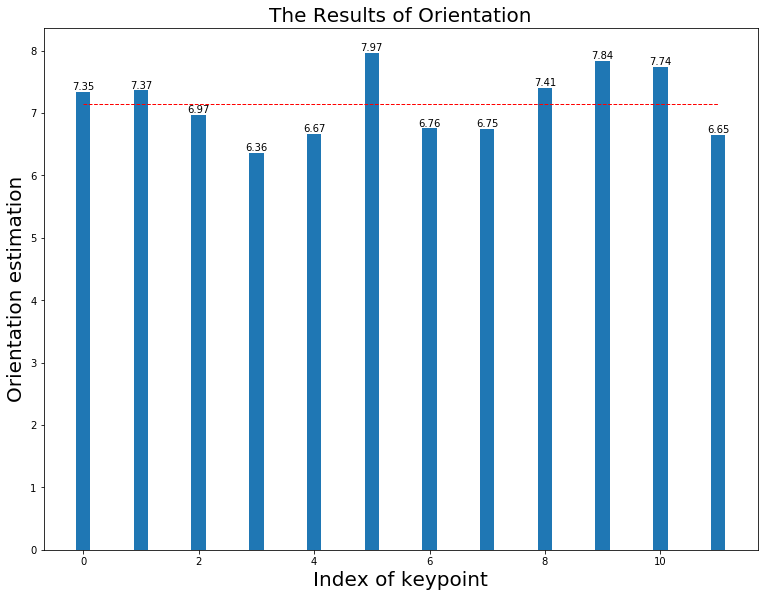

----------------------------------------------------------------------------------------------------7.399999999999999
FD Rotate(7.4):mean(7.415), median(7.415) in 0.096
The HoG estimation when (7.4) is  8
The HoG & FD estimation when (7.4) is 7.59


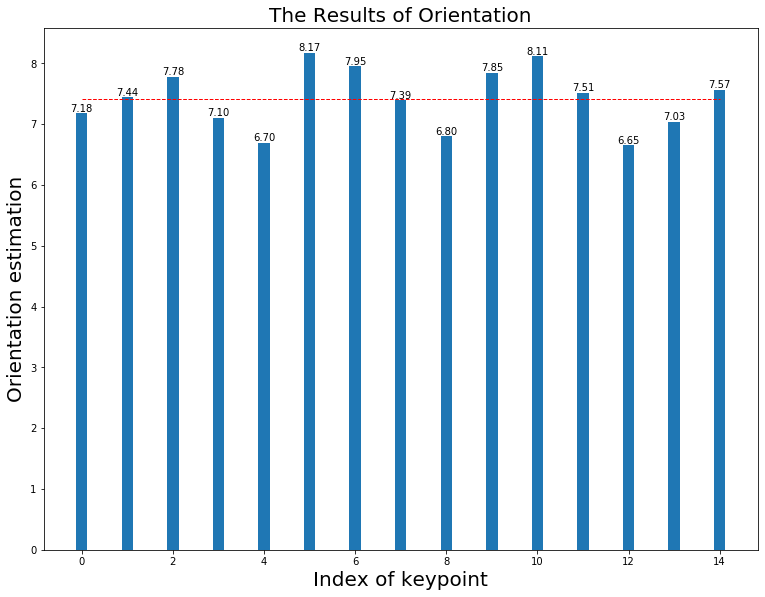

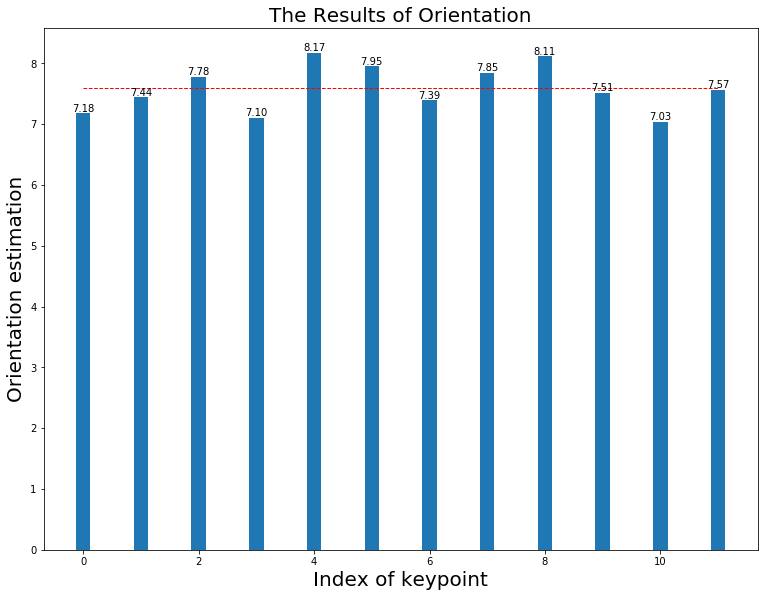

----------------------------------------------------------------------------------------------------7.499999999999998
FD Rotate(7.5):mean(7.577), median(7.577) in 0.096
The HoG estimation when (7.5) is  8
The HoG & FD estimation when (7.5) is 7.62


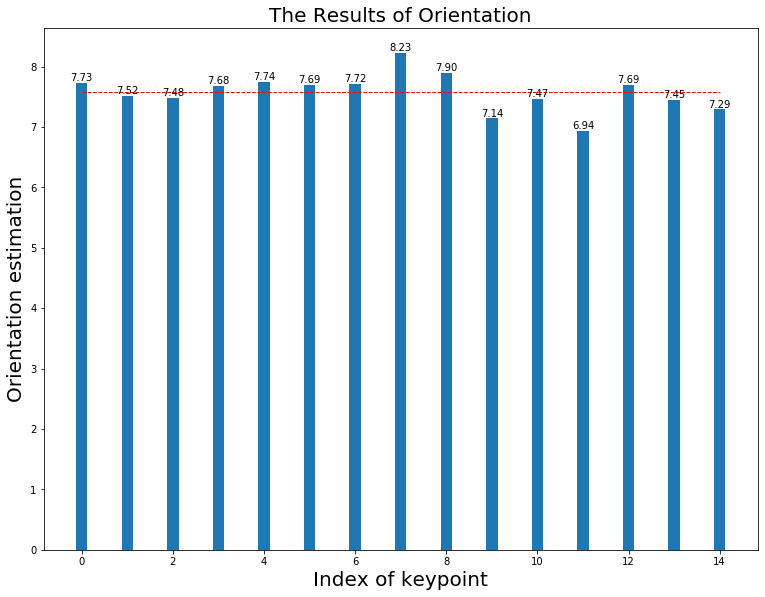

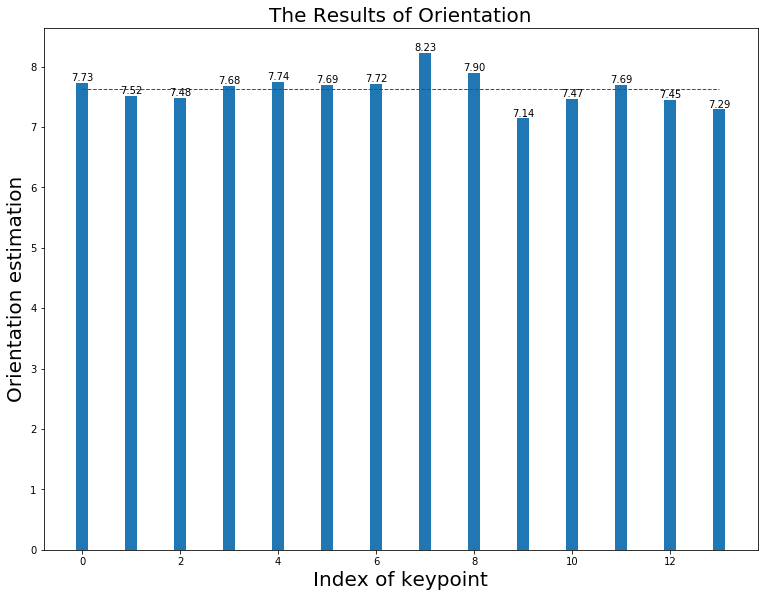

----------------------------------------------------------------------------------------------------7.599999999999999
FD Rotate(7.6):mean(7.748), median(7.748) in 0.094
The HoG estimation when (7.6) is  8
The HoG & FD estimation when (7.6) is 7.92


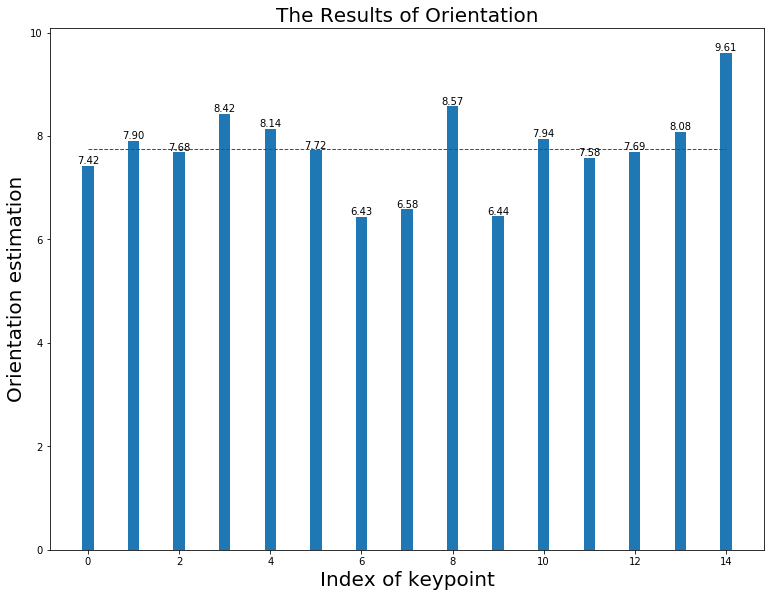

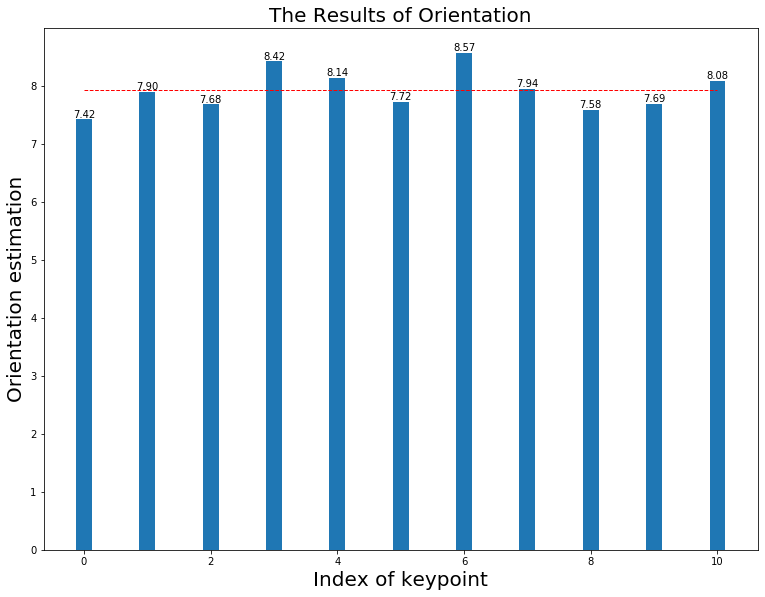

----------------------------------------------------------------------------------------------------7.699999999999998
FD Rotate(7.7):mean(7.817), median(7.817) in 0.102
The HoG estimation when (7.7) is  8
The HoG & FD estimation when (7.7) is 7.92


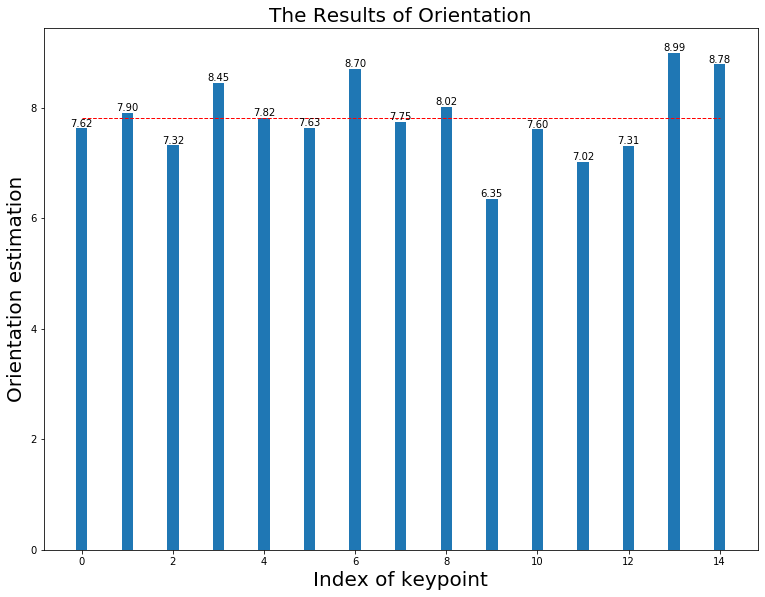

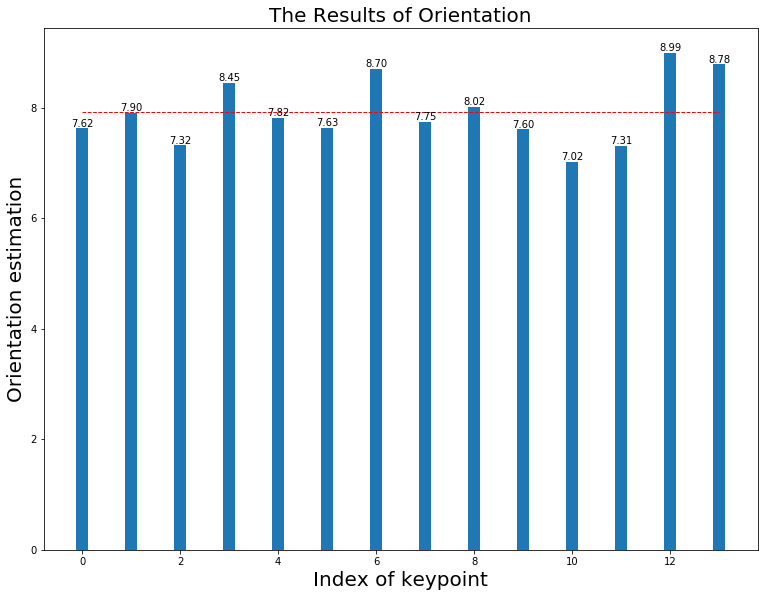

----------------------------------------------------------------------------------------------------7.799999999999998
FD Rotate(7.8):mean(7.914), median(7.914) in 0.103
The HoG estimation when (7.8) is  8
The HoG & FD estimation when (7.8) is 7.88


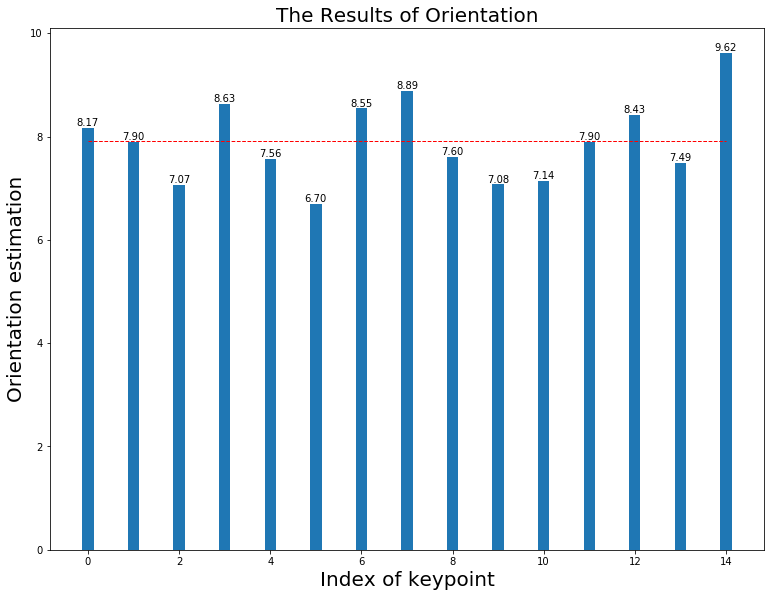

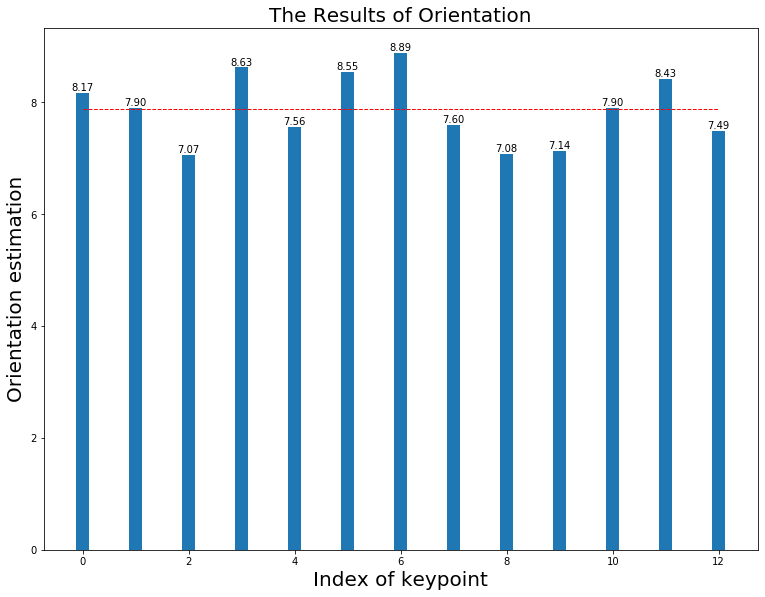

----------------------------------------------------------------------------------------------------7.899999999999999
FD Rotate(7.9):mean(8.217), median(8.217) in 0.103
The HoG estimation when (7.9) is  8
The HoG & FD estimation when (7.9) is 8.34


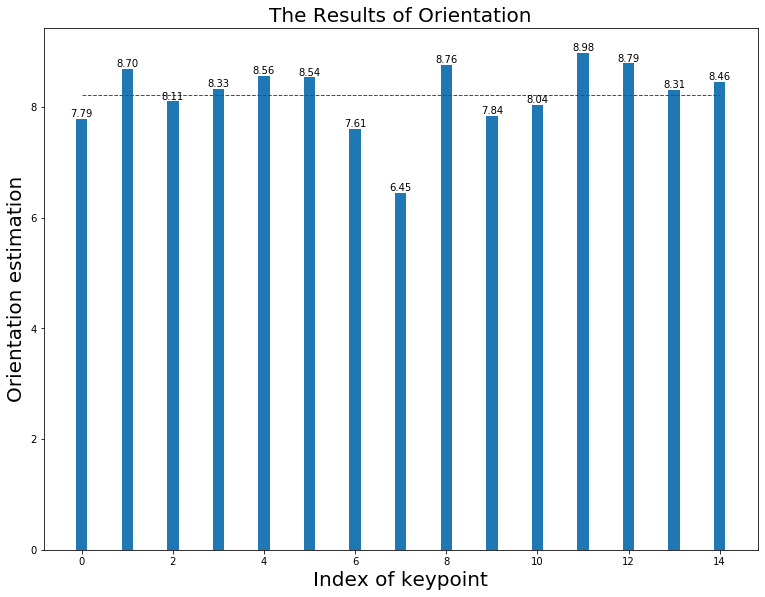

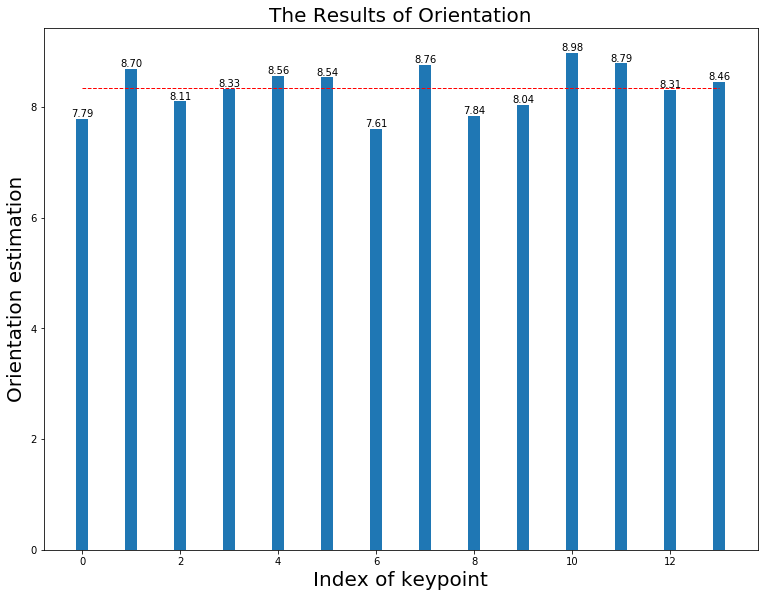

In [8]:
sift_error_fd = np.array([])
sift_error_hog_fd = np.array([])

for rotate_angle in np.arange(0.5, 8.0, 0.1):
    print("-" * 100 + str(rotate_angle))
    M = cv2.getRotationMatrix2D(center, rotate_angle, 1)
    img_rotate = cv2.warpAffine(img_base, M, (w, h))

    fd_median, fd_mean, exe_time = angle_cal(img_orig, img_rotate, mode = "SIFT")
    
    # Gradients Method
    hist_base = HoG_cal(img_base, mag_thres= thres, bin_num= bins)
    hist_rotate = HoG_cal(img_rotate, mag_thres= thres, bin_num= bins)

    hog_angle = angle_HoG(hist_base, hist_rotate, limits = angle_limits)
    

    angle_results = match_angels(img_orig, img_rotate, mode = "SIFT")
    
    # Filter the results
    angle_floor = hog_angle - 1 
    angle_ceiling = hog_angle + 1
    index = (angle_results > angle_floor)* (angle_results < angle_ceiling) * angle_results
    angle_filter_results = angle_results[np.nonzero(index)]
    angle_filter = np.mean(angle_filter_results)
    
    sift_error_fd = np.append(sift_error_fd, np.abs(fd_mean - rotate_angle))
    sift_error_hog_fd = np.append(sift_error_hog_fd, np.abs(angle_filter - rotate_angle))
    
    
    print("FD Rotate({0:3.1f}):mean({1:5.3f}), median({2:5.3f}) in {3:.3f}"\
          .format(rotate_angle, fd_mean, fd_median, exe_time))
    print("The HoG estimation when ({0:.1f}) is {1:2d}" \
        .format(rotate_angle, hog_angle))
    print("The HoG & FD estimation when ({0:.1f}) is {1:.2f}" \
        .format(rotate_angle, angle_filter))
    
    
    plot_result_bar(range(len(angle_results)), angle_results, fd_mean)
    plot_result_bar(range(len(angle_filter_results)), angle_filter_results, angle_filter)

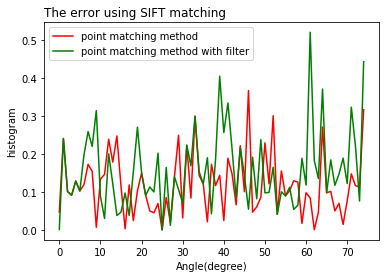

In [9]:
plt.plot(sift_error_fd, 'r', label = 'point matching method')
plt.plot(sift_error_hog_fd, 'g', label = 'point matching method with filter')
plt.legend()
plt.xlabel('Angle(degree)' )
plt.ylabel('histogram')
plt.title('The error using SIFT matching', loc = 'left')
plt.show() 

<font face='Ubuntu' size = 4>

### ORB
Using ORB as the feature desciptor

----------------------------------------------------------------------------------------------------
FD Rotate(0.5):mean(0.305), median(0.305) in 0.010
The HoG estimation when (0.5) is  0
The HoG & FD estimation when (0.5) is 0.30 in 0.033


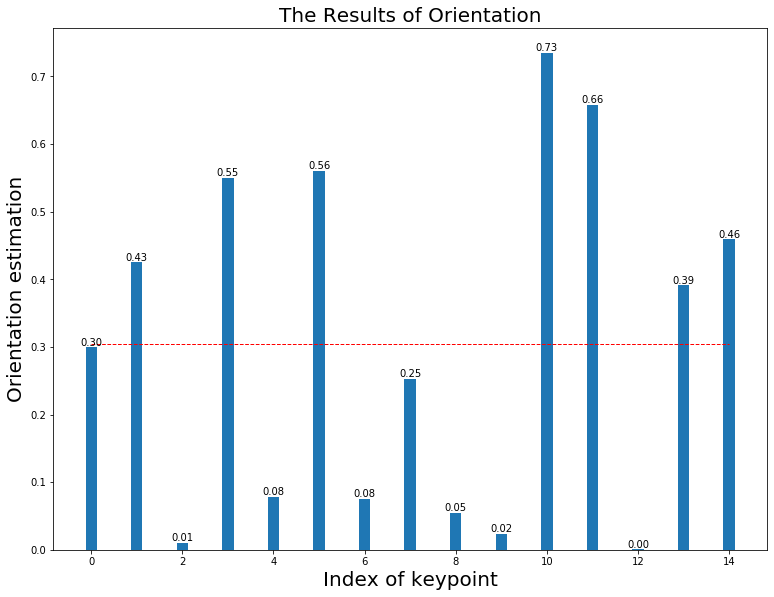

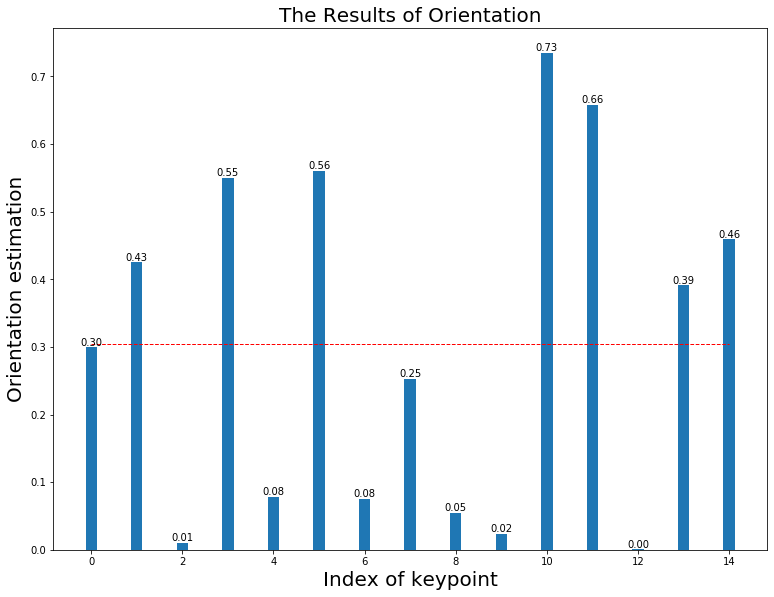

----------------------------------------------------------------------------------------------------
FD Rotate(0.6):mean(0.271), median(0.271) in 0.011
The HoG estimation when (0.6) is  1
The HoG & FD estimation when (0.6) is 0.27 in 0.048


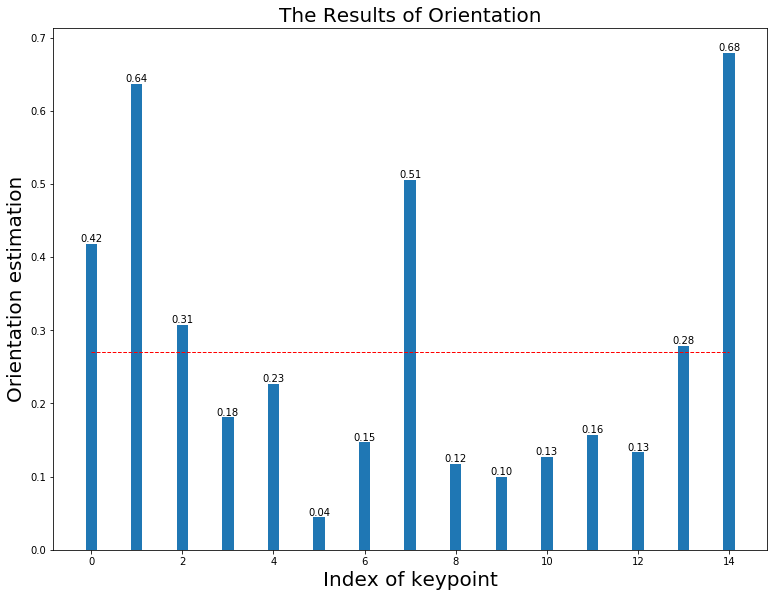

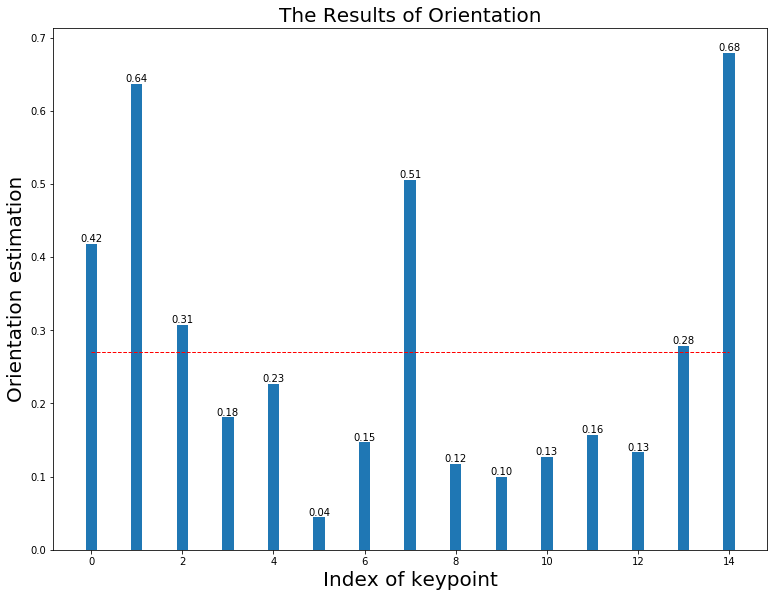

----------------------------------------------------------------------------------------------------
FD Rotate(0.7):mean(0.497), median(0.497) in 0.011
The HoG estimation when (0.7) is  1
The HoG & FD estimation when (0.7) is 0.50 in 0.031


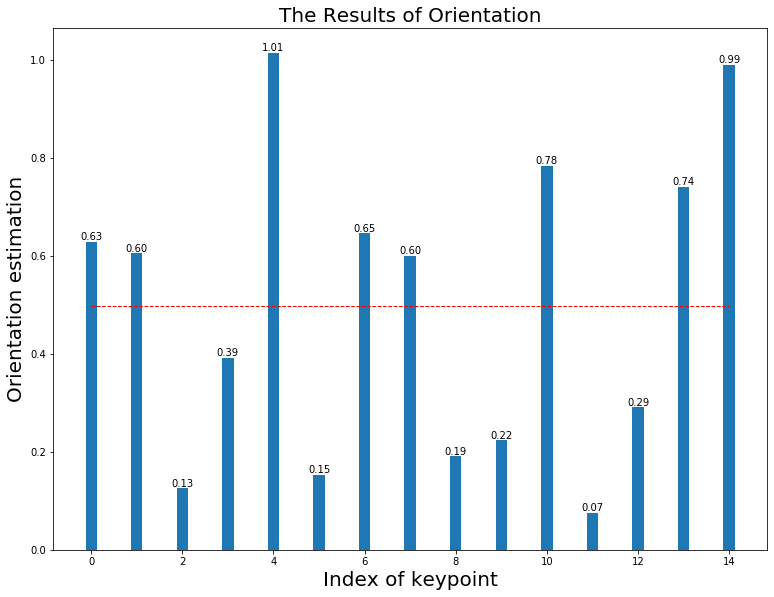

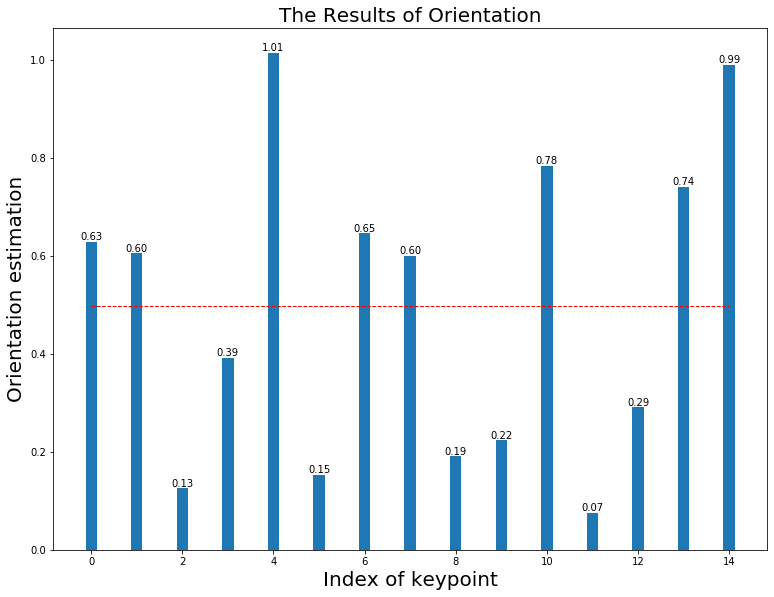

----------------------------------------------------------------------------------------------------
FD Rotate(0.8):mean(0.448), median(0.448) in 0.010
The HoG estimation when (0.8) is  1
The HoG & FD estimation when (0.8) is 0.45 in 0.030


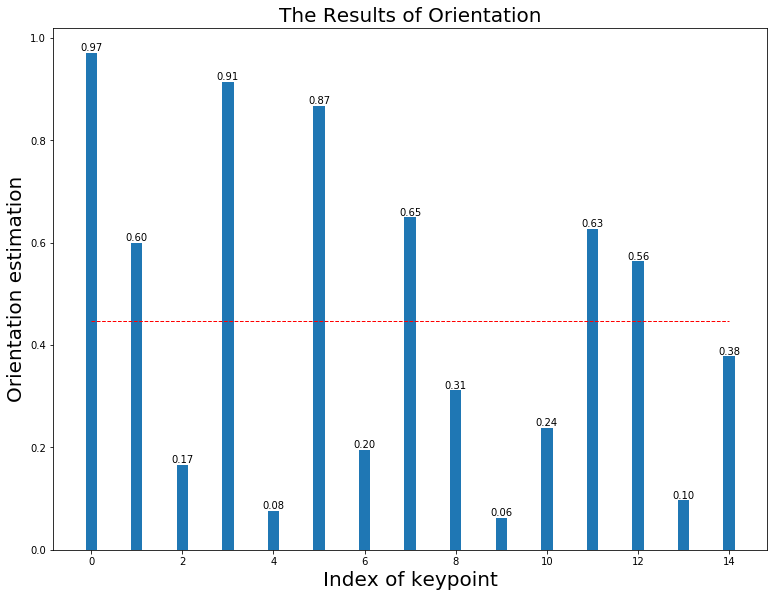

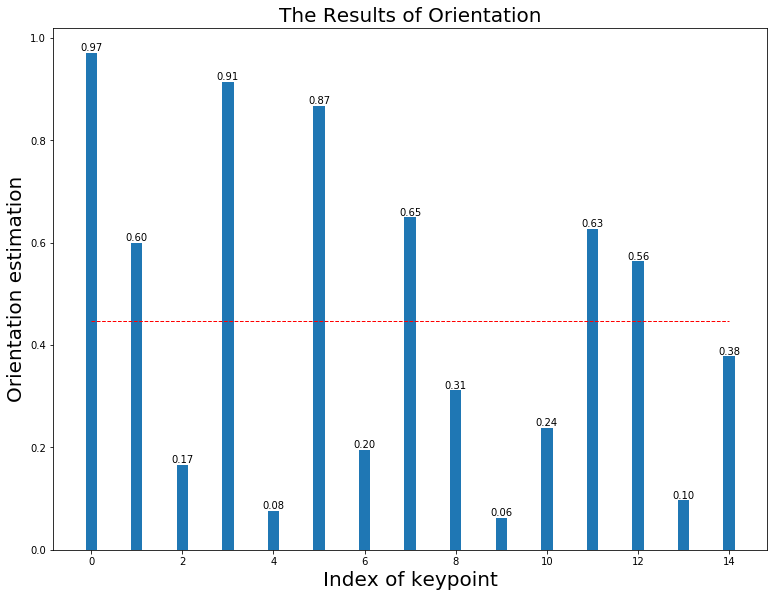

----------------------------------------------------------------------------------------------------
FD Rotate(0.9):mean(0.435), median(0.435) in 0.010
The HoG estimation when (0.9) is  1
The HoG & FD estimation when (0.9) is 0.44 in 0.031


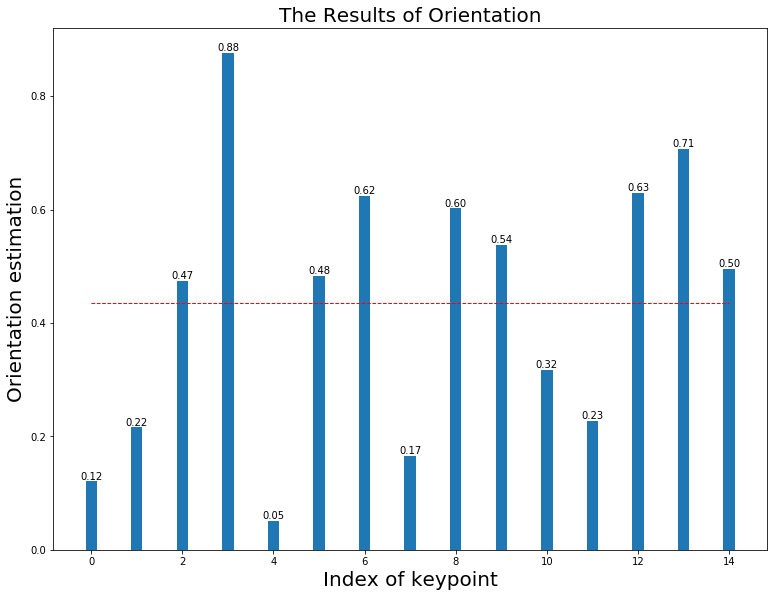

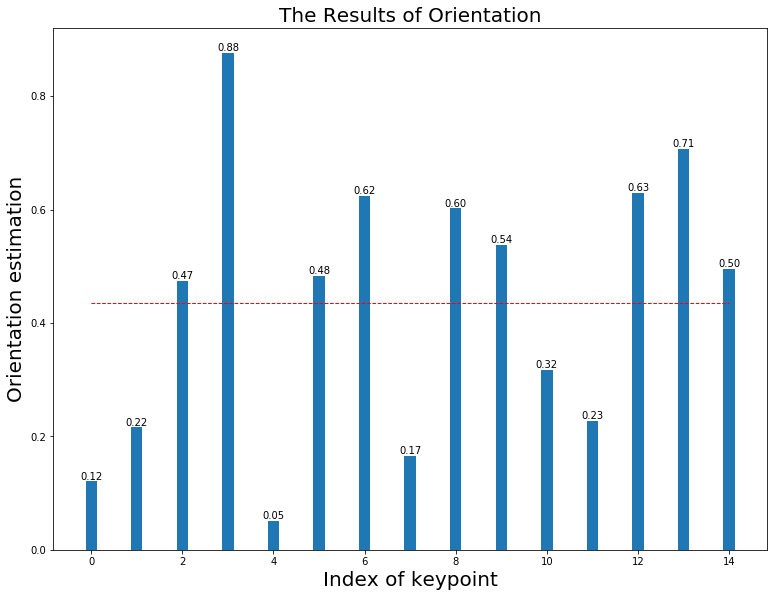

----------------------------------------------------------------------------------------------------
FD Rotate(1.0):mean(0.640), median(0.469) in 0.010
The HoG estimation when (1.0) is  1
The HoG & FD estimation when (1.0) is 0.47 in 0.032


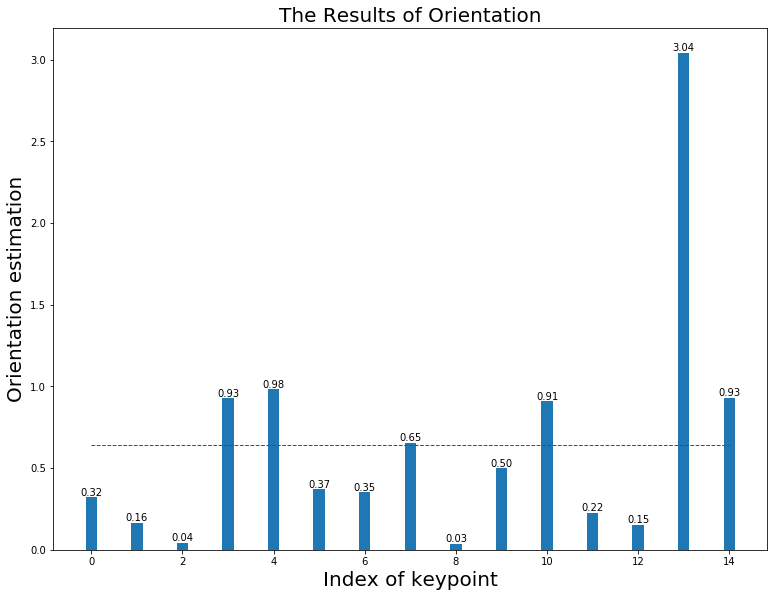

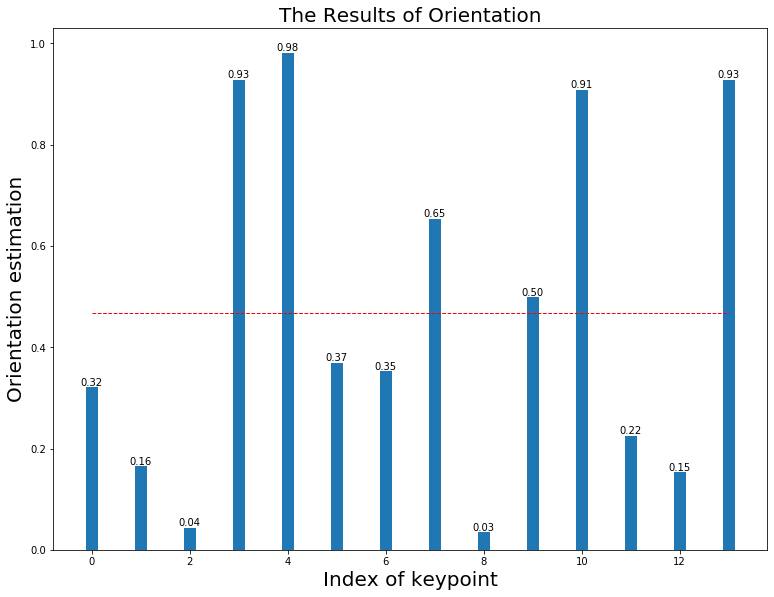

----------------------------------------------------------------------------------------------------
FD Rotate(1.1):mean(0.614), median(0.614) in 0.010
The HoG estimation when (1.1) is  1
The HoG & FD estimation when (1.1) is 0.36 in 0.033


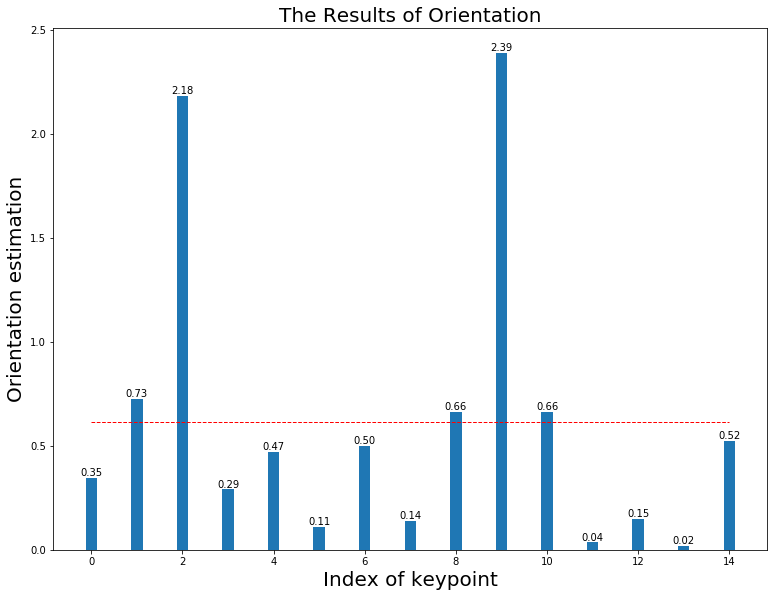

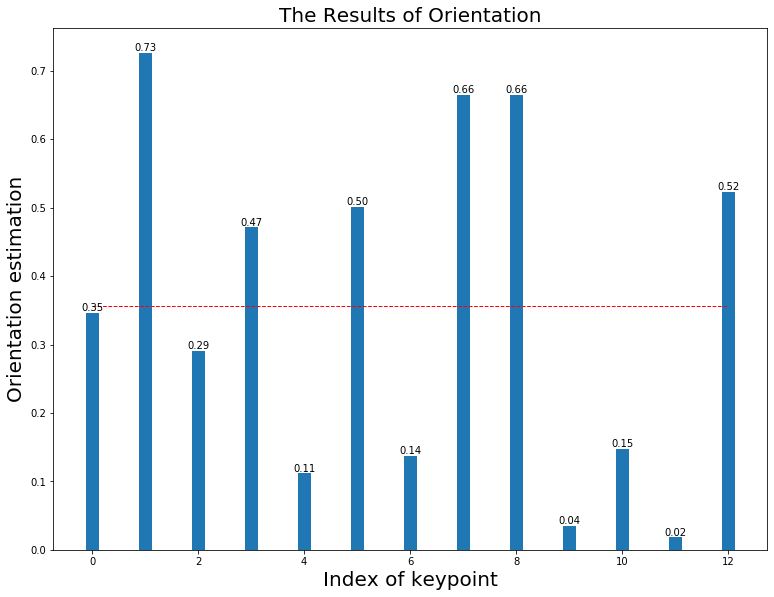

----------------------------------------------------------------------------------------------------
FD Rotate(1.2):mean(0.814), median(0.814) in 0.010
The HoG estimation when (1.2) is  1
The HoG & FD estimation when (1.2) is 0.81 in 0.030


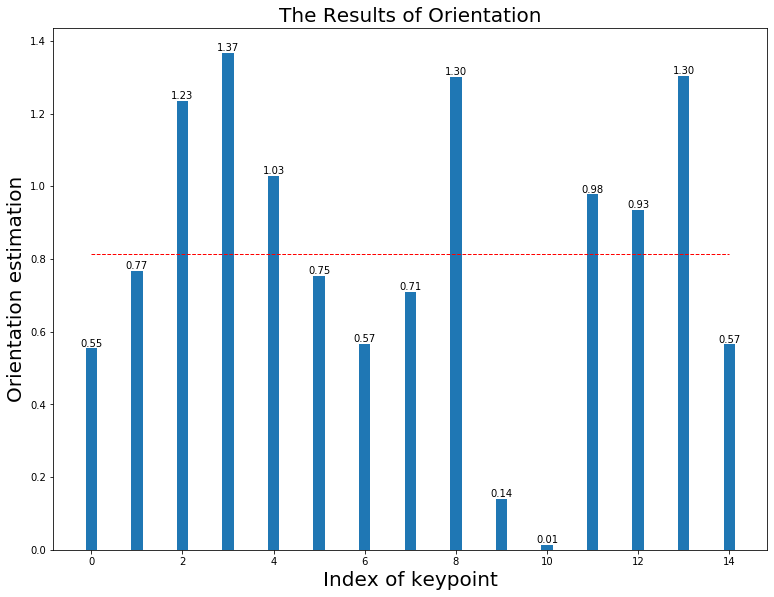

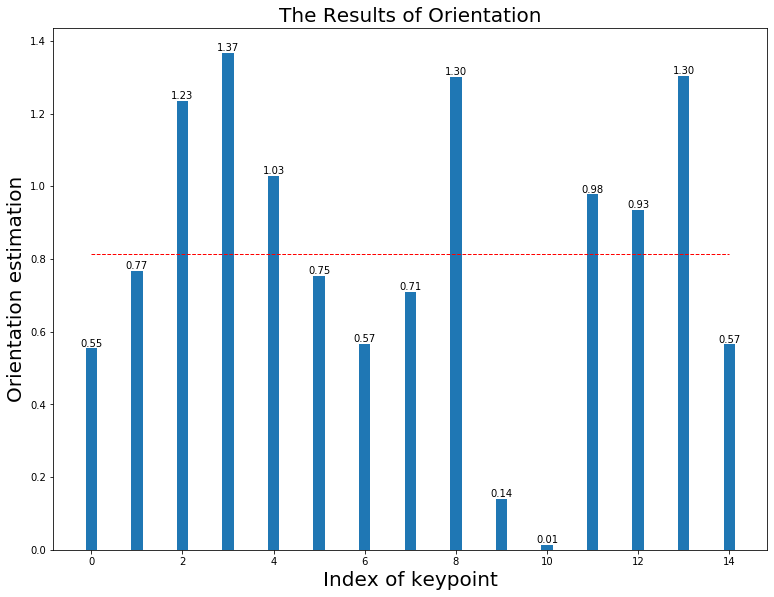

----------------------------------------------------------------------------------------------------
FD Rotate(1.3):mean(1.178), median(0.710) in 0.011
The HoG estimation when (1.3) is  1
The HoG & FD estimation when (1.3) is 0.71 in 0.031


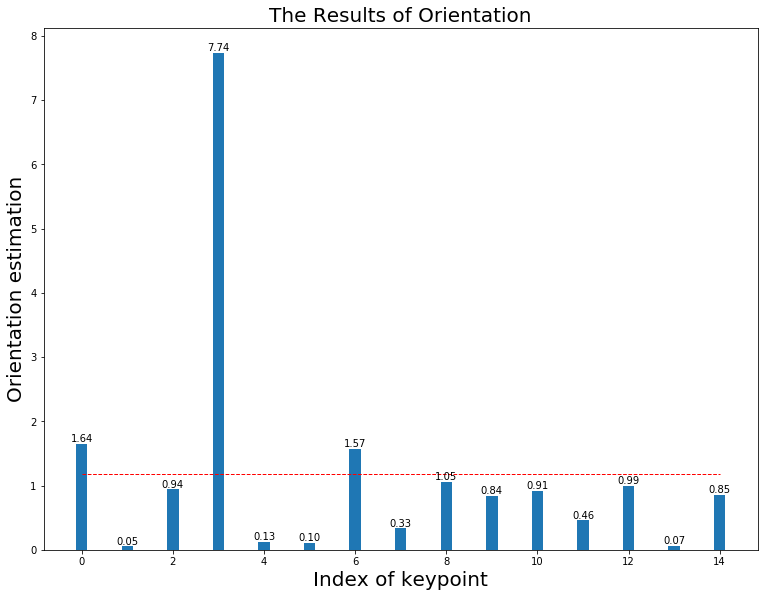

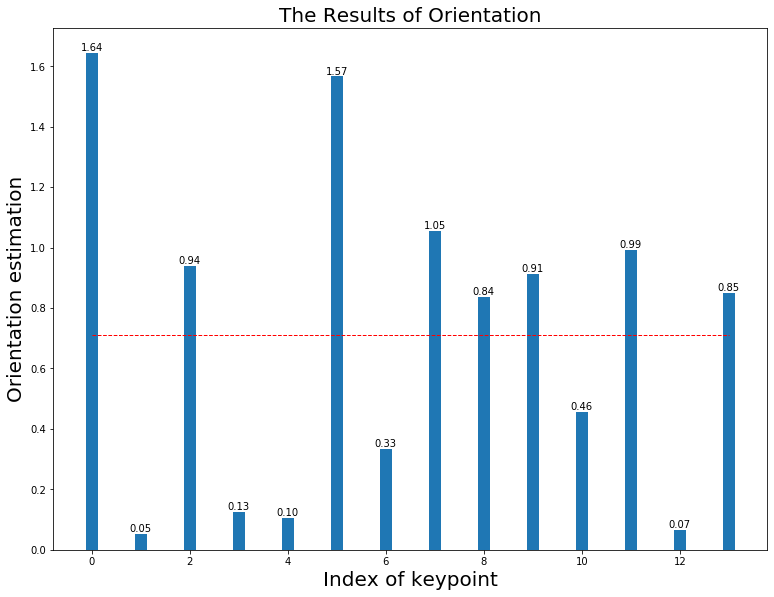

----------------------------------------------------------------------------------------------------
FD Rotate(1.4):mean(0.910), median(0.910) in 0.010
The HoG estimation when (1.4) is  2
The HoG & FD estimation when (1.4) is 1.38 in 0.030


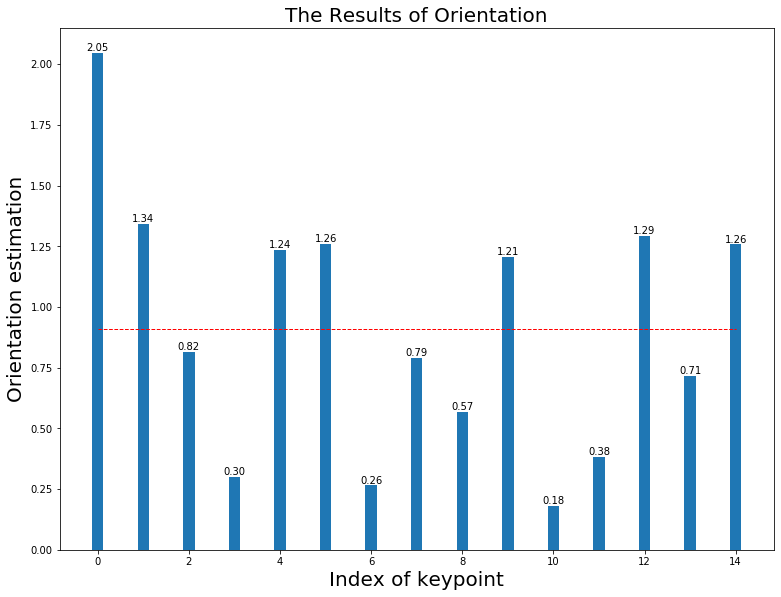

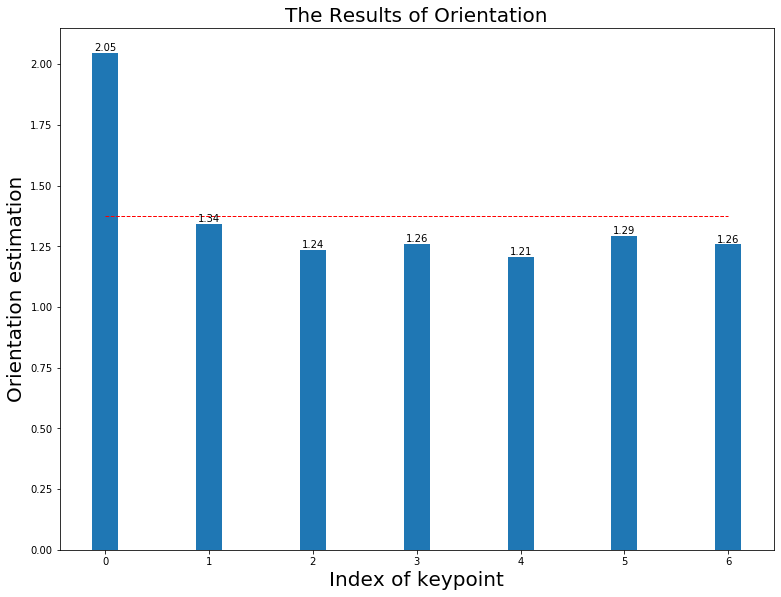

----------------------------------------------------------------------------------------------------
FD Rotate(1.5):mean(0.688), median(0.688) in 0.010
The HoG estimation when (1.5) is  2
The HoG & FD estimation when (1.5) is 1.30 in 0.031


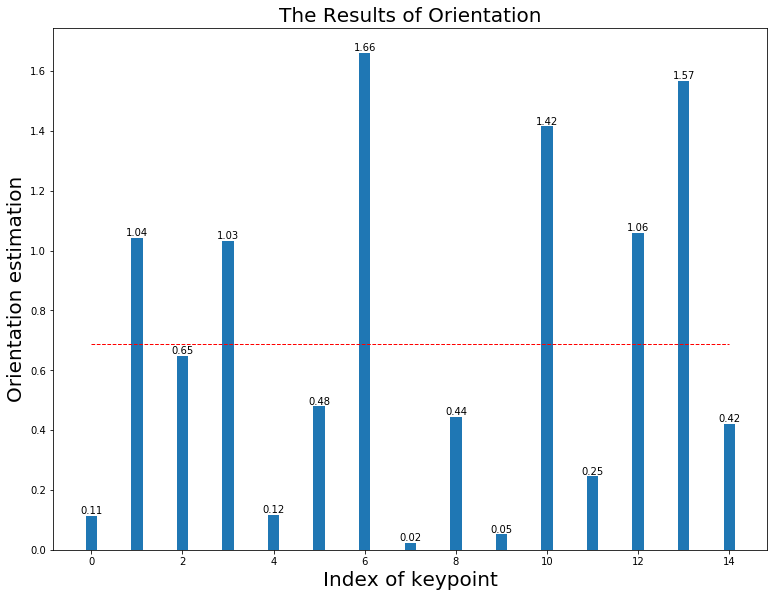

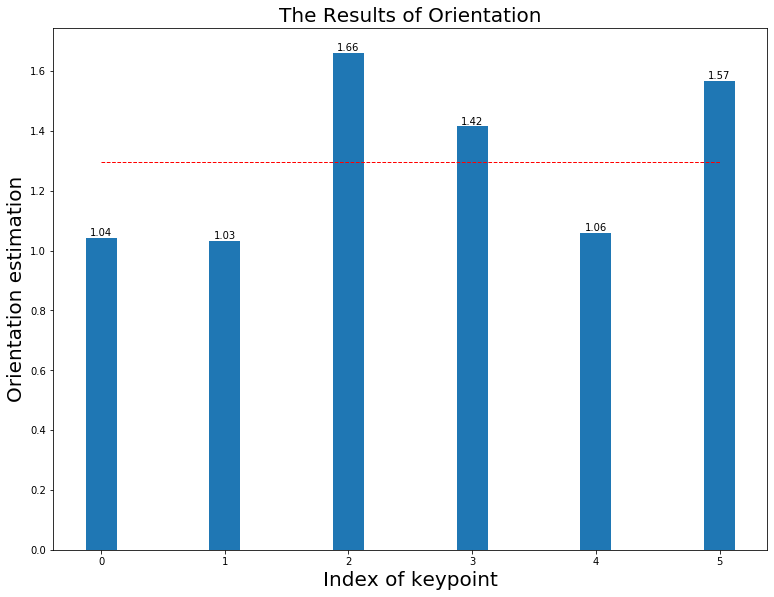

----------------------------------------------------------------------------------------------------
FD Rotate(1.6):mean(0.928), median(0.786) in 0.011
The HoG estimation when (1.6) is  2
The HoG & FD estimation when (1.6) is 1.59 in 0.033


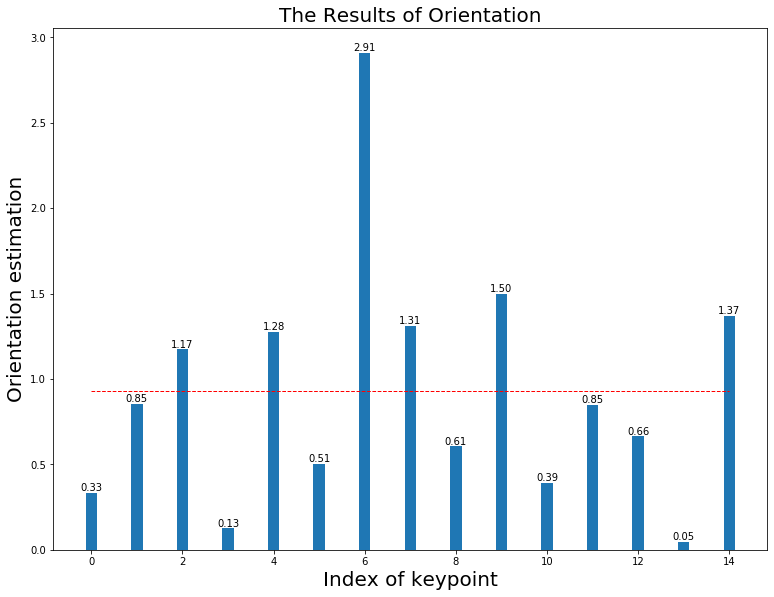

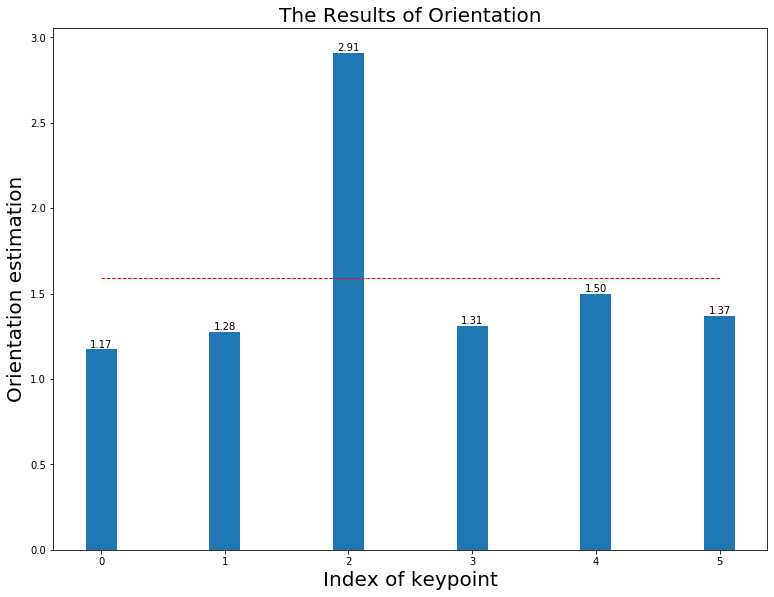

----------------------------------------------------------------------------------------------------
FD Rotate(1.7):mean(1.067), median(0.934) in 0.010
The HoG estimation when (1.7) is  2
The HoG & FD estimation when (1.7) is 1.85 in 0.030


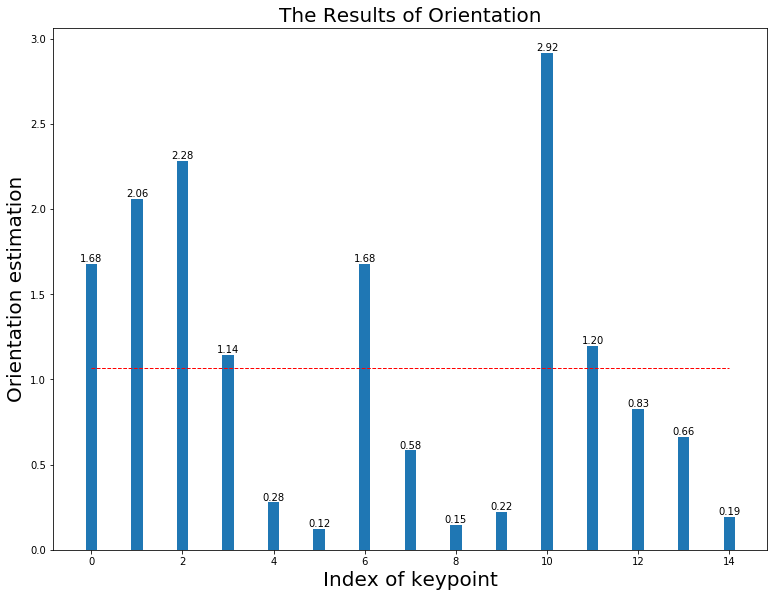

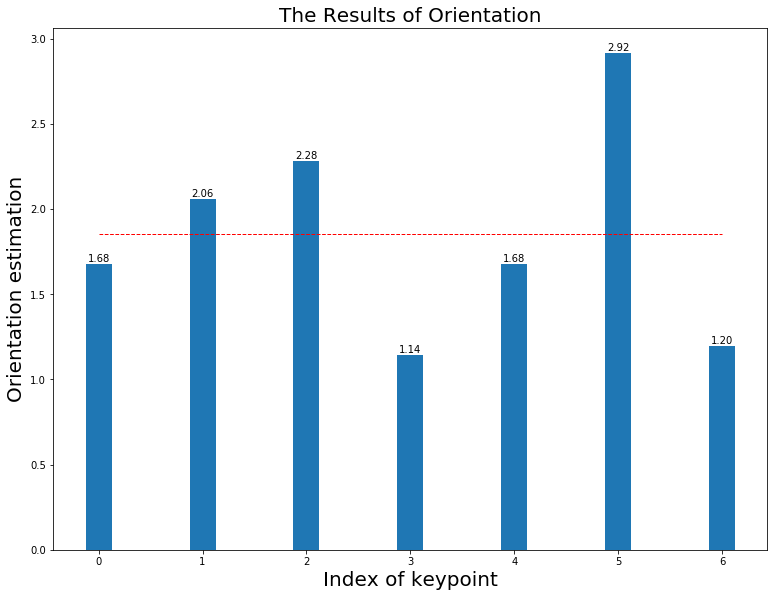

----------------------------------------------------------------------------------------------------
FD Rotate(1.8):mean(1.184), median(1.055) in 0.012
The HoG estimation when (1.8) is  2
The HoG & FD estimation when (1.8) is 2.13 in 0.035


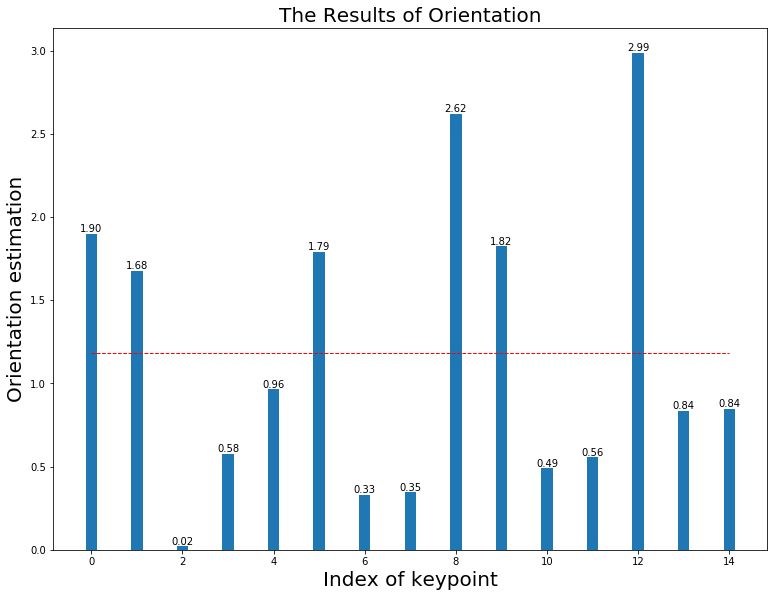

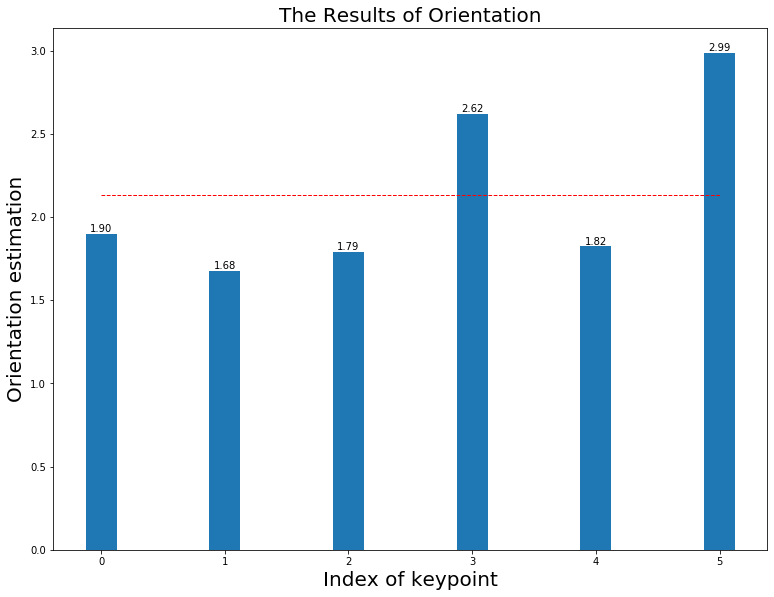

----------------------------------------------------------------------------------------------------
FD Rotate(1.9):mean(1.082), median(1.082) in 0.011
The HoG estimation when (1.9) is  2
The HoG & FD estimation when (1.9) is 1.80 in 0.030


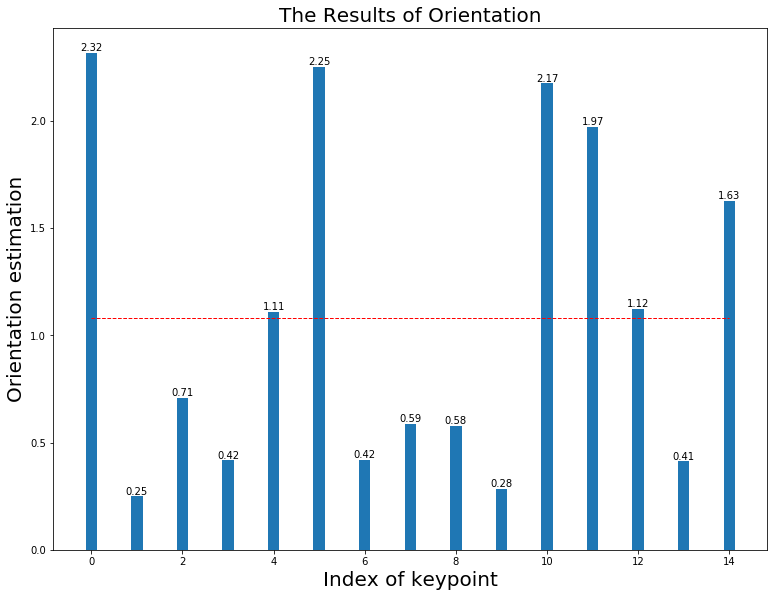

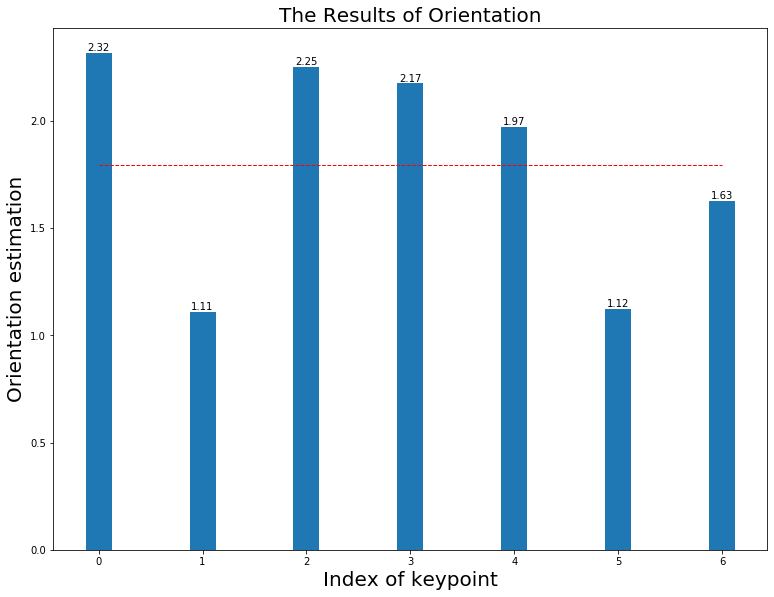

----------------------------------------------------------------------------------------------------
FD Rotate(2.0):mean(1.876), median(1.509) in 0.011
The HoG estimation when (2.0) is  2
The HoG & FD estimation when (2.0) is 1.87 in 0.033


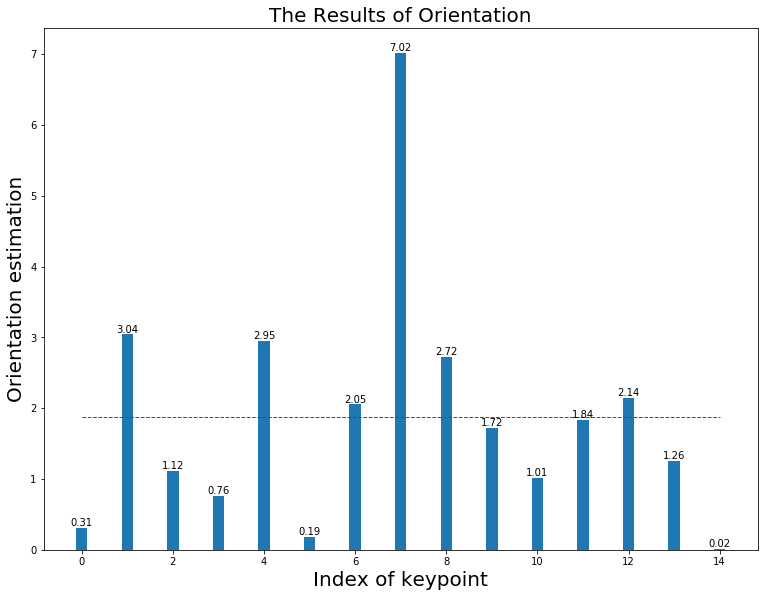

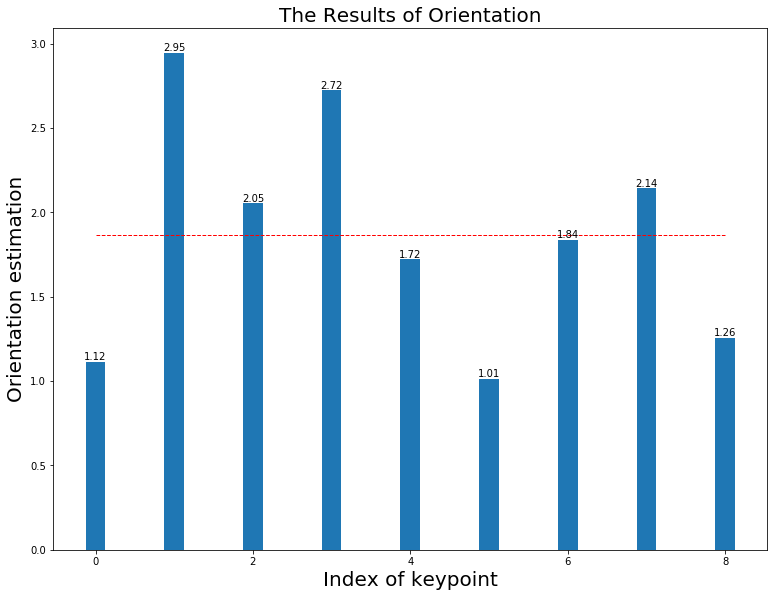

----------------------------------------------------------------------------------------------------
FD Rotate(2.1):mean(1.450), median(1.450) in 0.011
The HoG estimation when (2.1) is  2
The HoG & FD estimation when (2.1) is 2.05 in 0.031


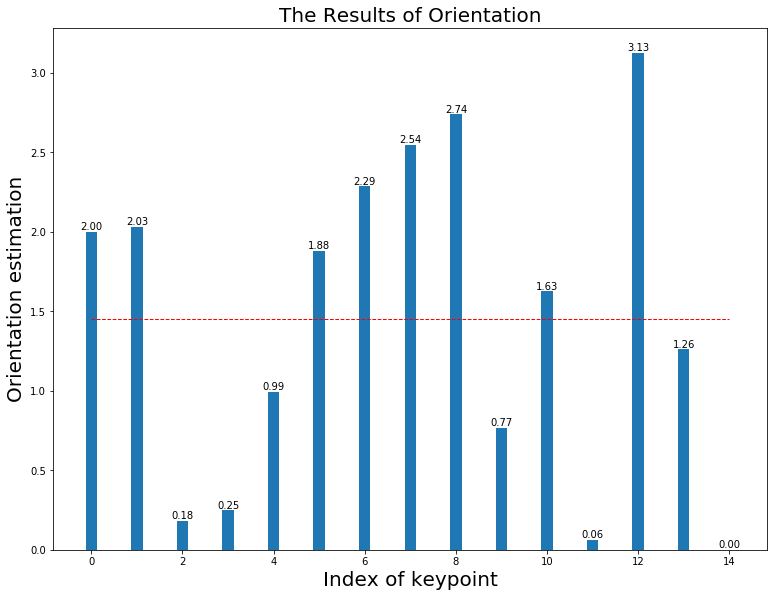

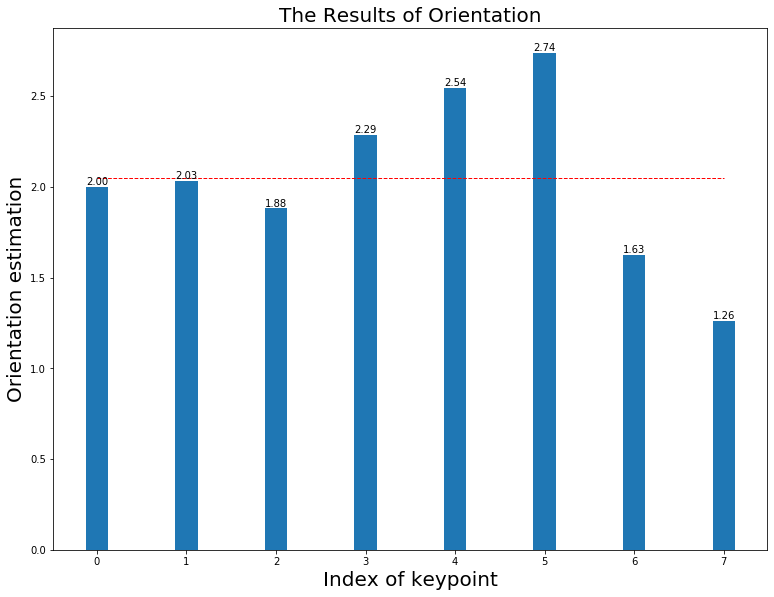

----------------------------------------------------------------------------------------------------
FD Rotate(2.2):mean(1.191), median(1.191) in 0.011
The HoG estimation when (2.2) is  2
The HoG & FD estimation when (2.2) is 1.71 in 0.033


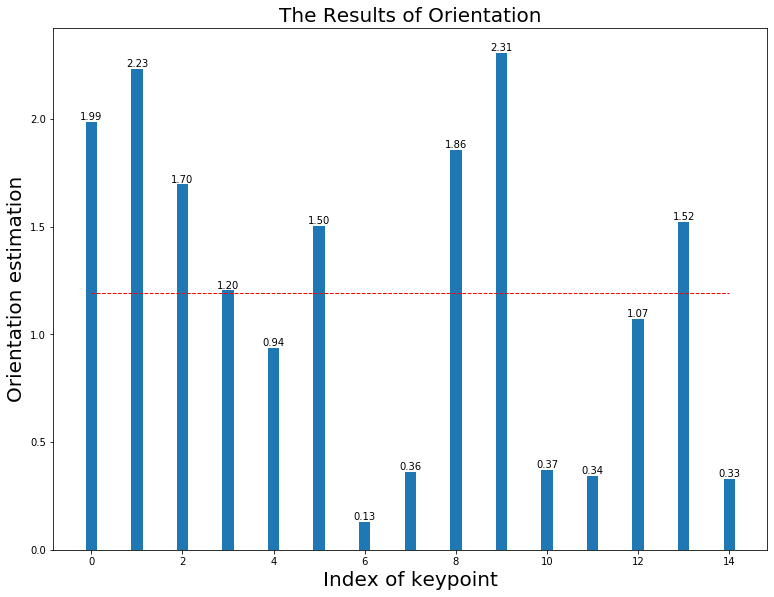

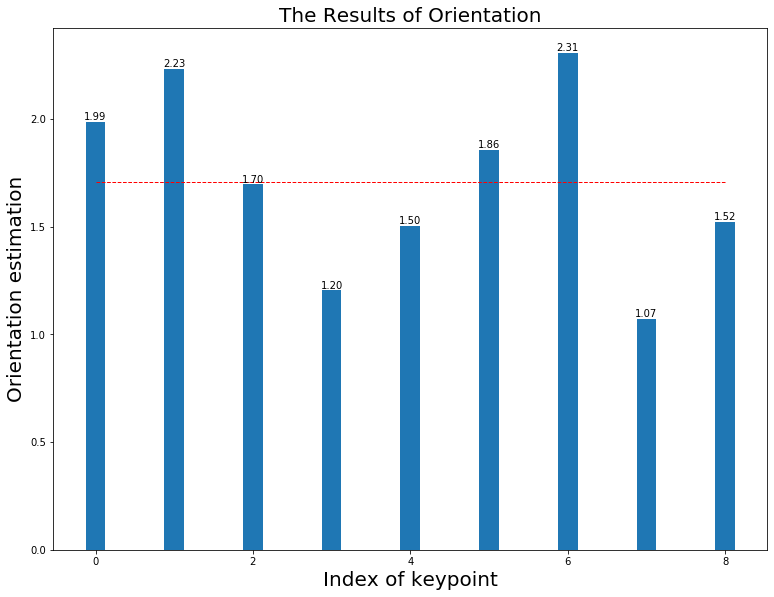

----------------------------------------------------------------------------------------------------
FD Rotate(2.3):mean(1.696), median(1.480) in 0.011
The HoG estimation when (2.3) is  2
The HoG & FD estimation when (2.3) is 2.09 in 0.030


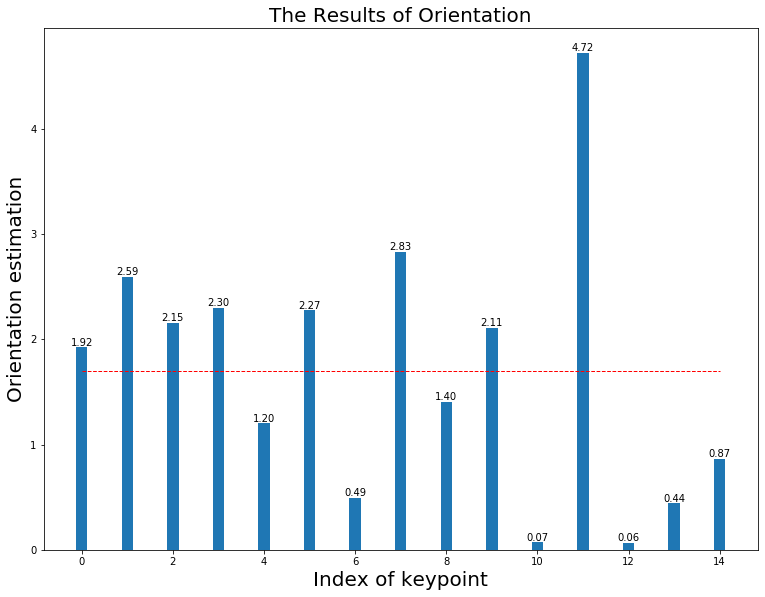

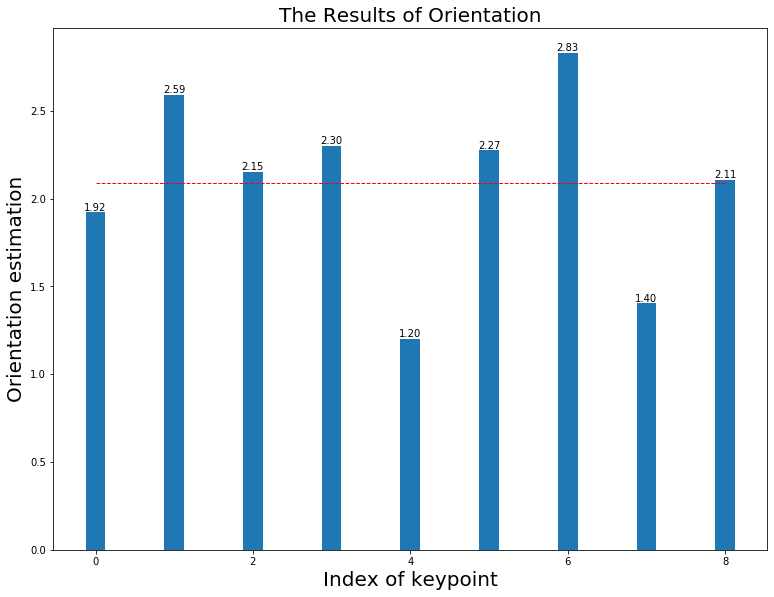

----------------------------------------------------------------------------------------------------
FD Rotate(2.4):mean(1.826), median(1.826) in 0.011
The HoG estimation when (2.4) is  2
The HoG & FD estimation when (2.4) is 2.33 in 0.031


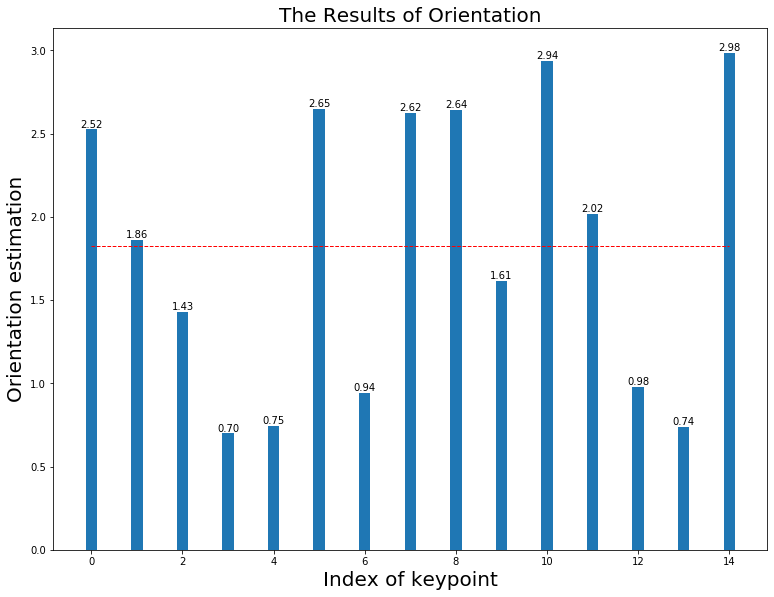

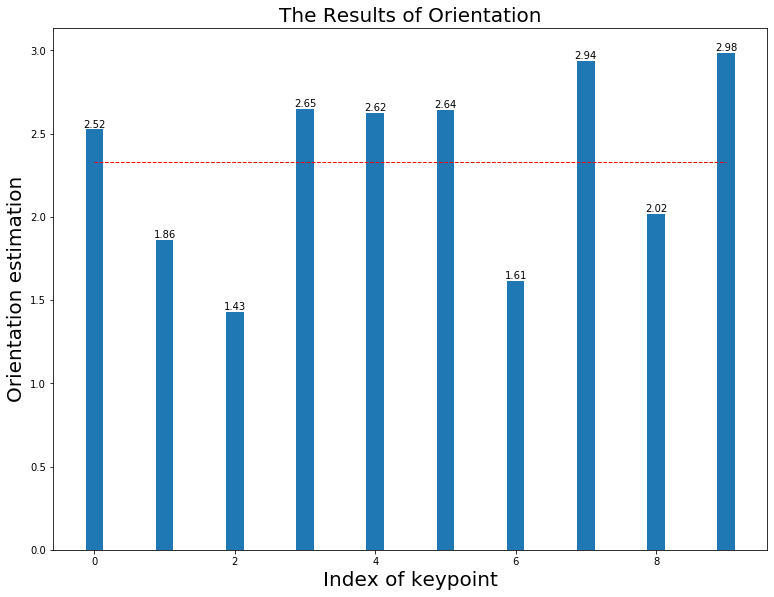

----------------------------------------------------------------------------------------------------
FD Rotate(2.5):mean(1.967), median(2.098) in 0.011
The HoG estimation when (2.5) is  3
The HoG & FD estimation when (2.5) is 2.58 in 0.030


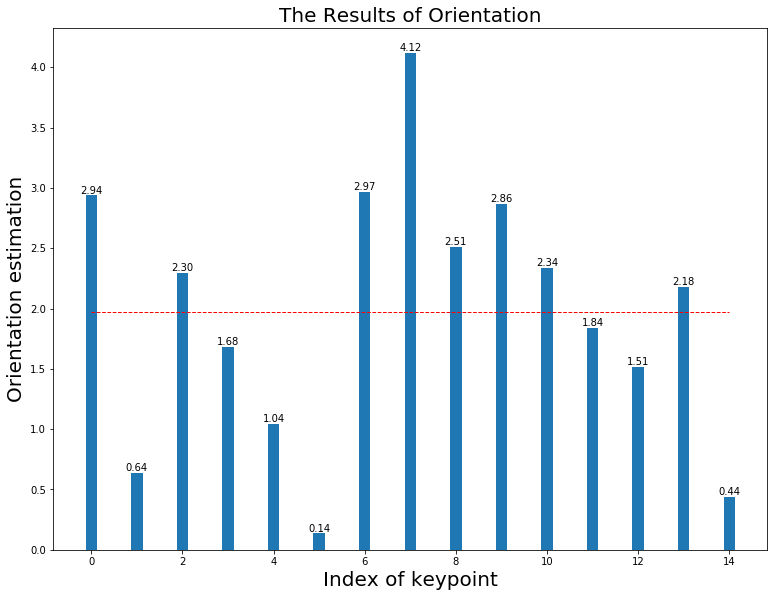

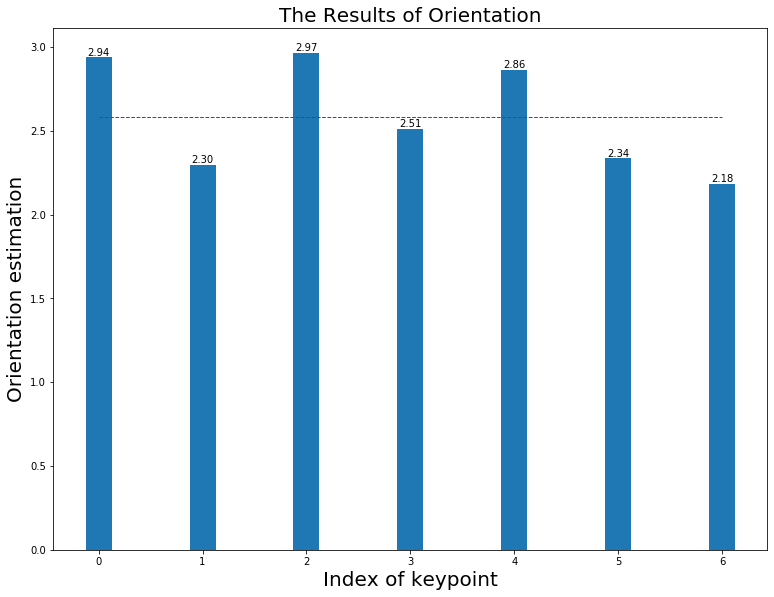

----------------------------------------------------------------------------------------------------
FD Rotate(2.6):mean(1.829), median(1.656) in 0.011
The HoG estimation when (2.6) is  3
The HoG & FD estimation when (2.6) is 3.11 in 0.031


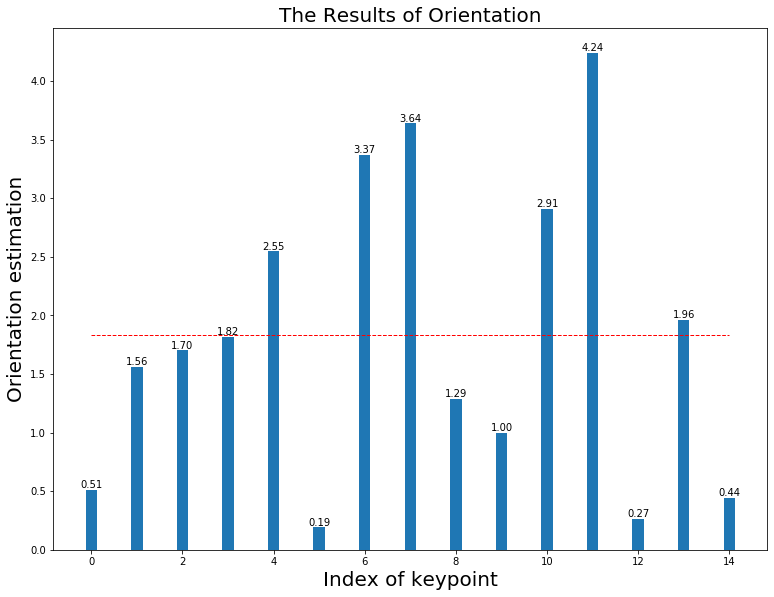

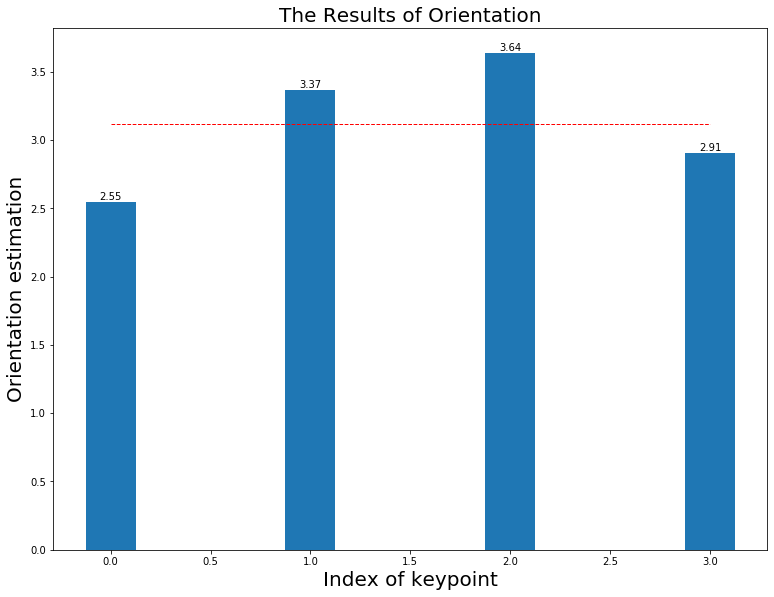

----------------------------------------------------------------------------------------------------
FD Rotate(2.7):mean(1.810), median(1.810) in 0.010
The HoG estimation when (2.7) is  3
The HoG & FD estimation when (2.7) is 2.69 in 0.032


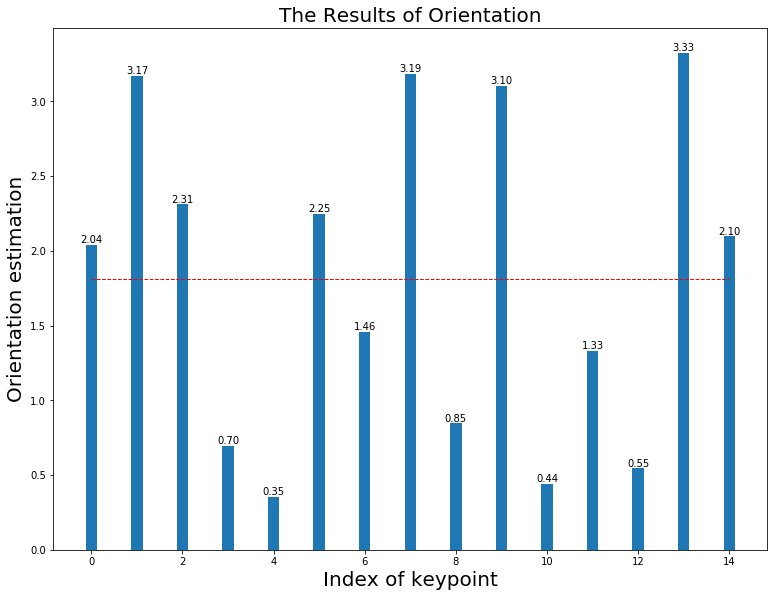

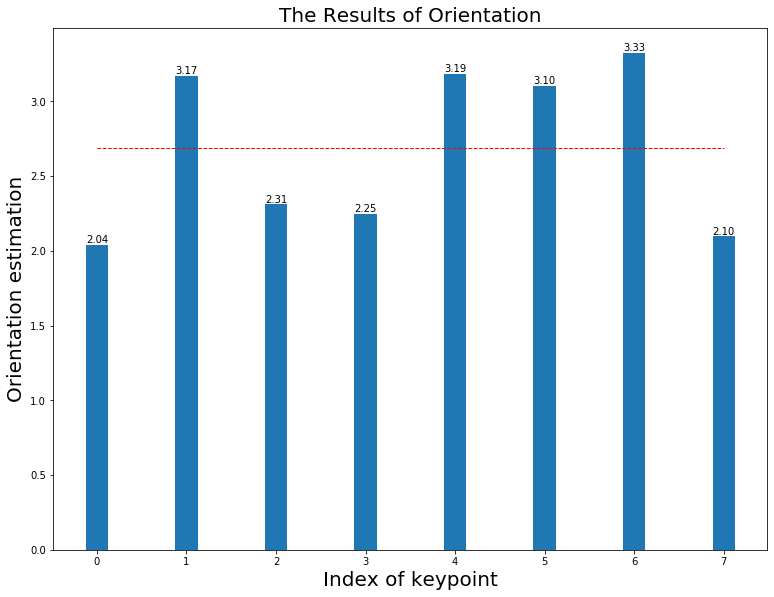

----------------------------------------------------------------------------------------------------
FD Rotate(2.8):mean(2.130), median(2.599) in 0.012
The HoG estimation when (2.8) is  3
The HoG & FD estimation when (2.8) is 2.72 in 0.032


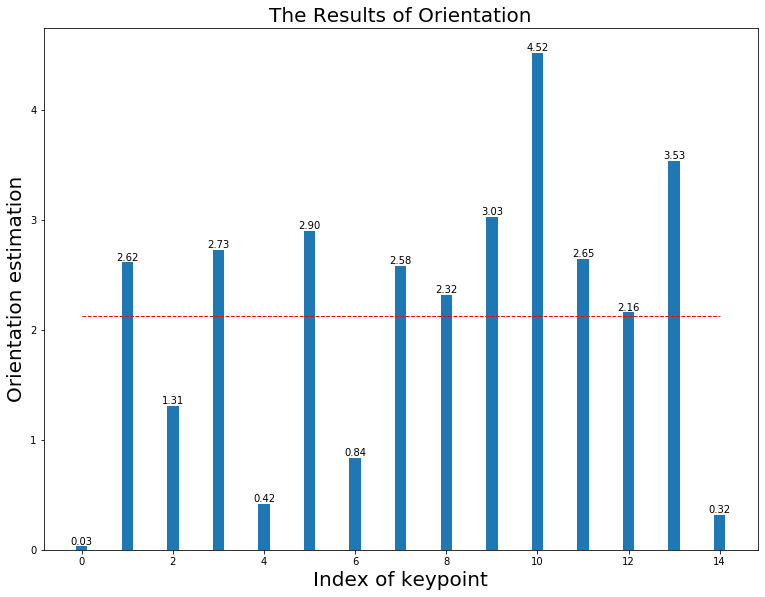

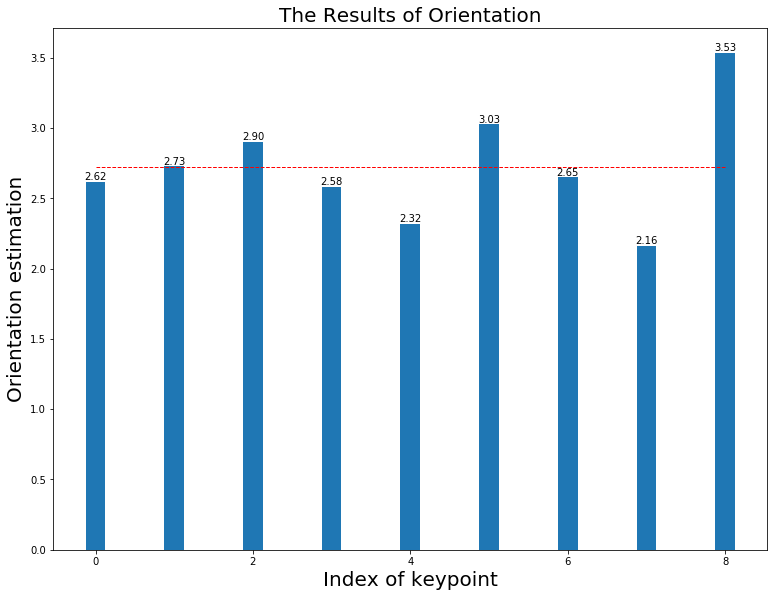

----------------------------------------------------------------------------------------------------
FD Rotate(2.9):mean(2.765), median(2.936) in 0.010
The HoG estimation when (2.9) is  3
The HoG & FD estimation when (2.9) is 3.19 in 0.030


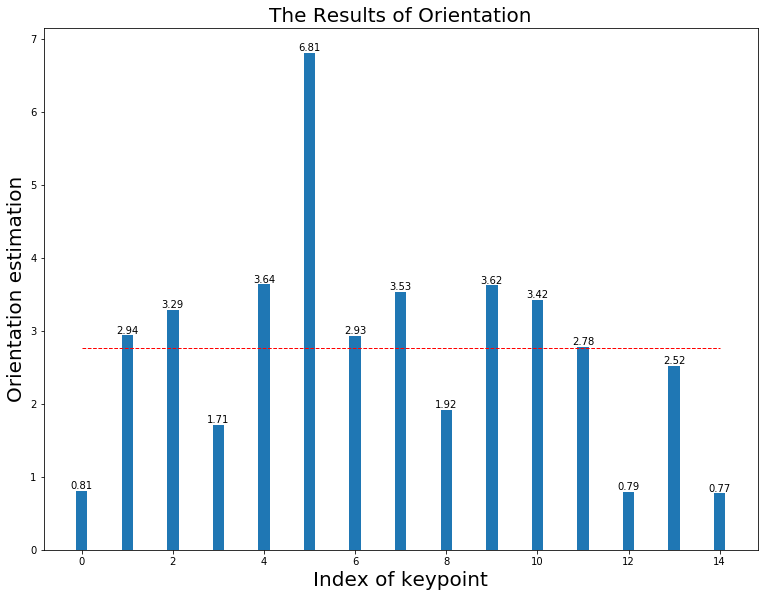

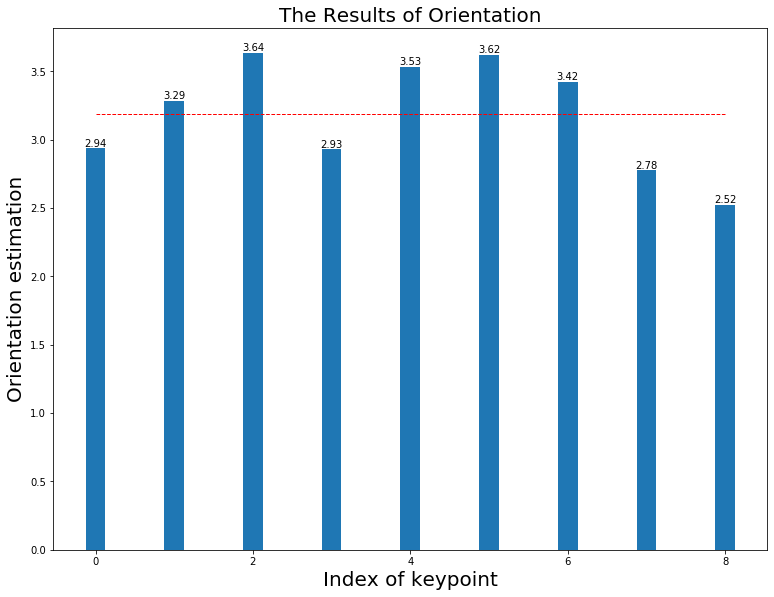

----------------------------------------------------------------------------------------------------
FD Rotate(3.0):mean(2.312), median(1.859) in 0.010
The HoG estimation when (3.0) is  3
The HoG & FD estimation when (3.0) is 2.79 in 0.030


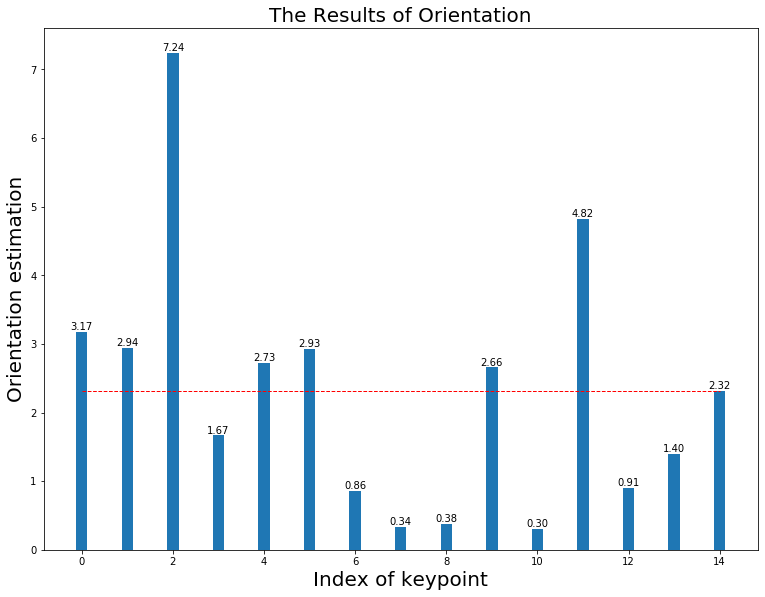

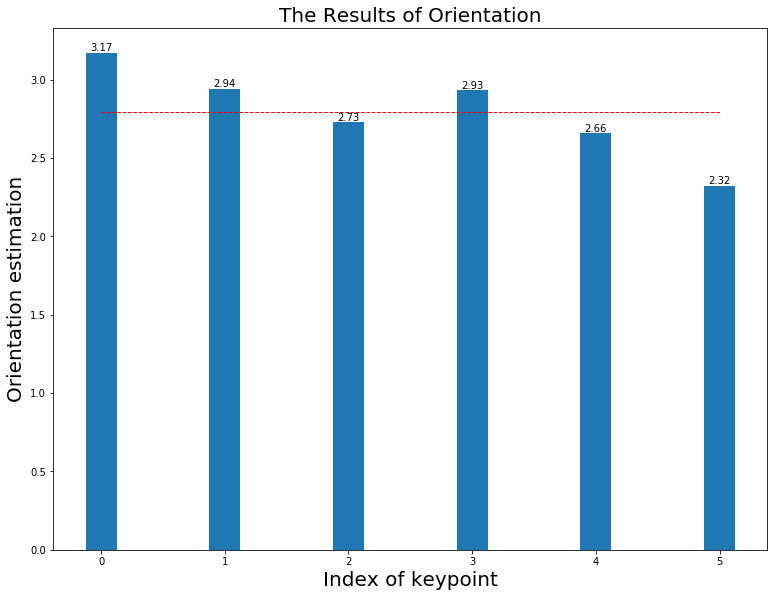

----------------------------------------------------------------------------------------------------
FD Rotate(3.1):mean(2.385), median(2.503) in 0.011
The HoG estimation when (3.1) is  3
The HoG & FD estimation when (3.1) is 3.32 in 0.031


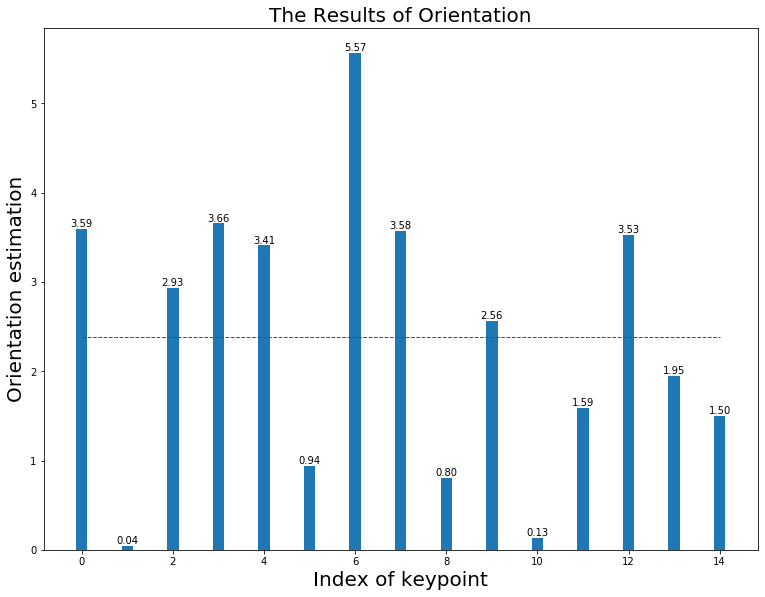

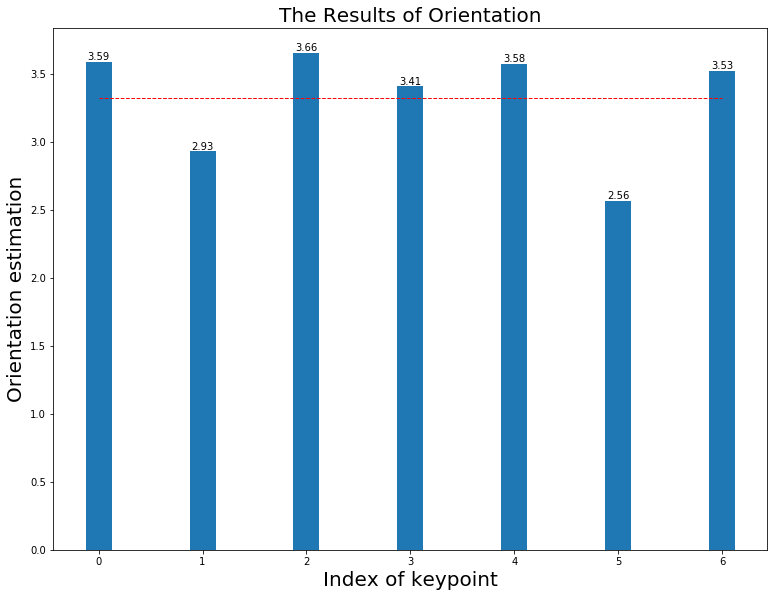

----------------------------------------------------------------------------------------------------
FD Rotate(3.2):mean(2.569), median(2.523) in 0.010
The HoG estimation when (3.2) is  3
The HoG & FD estimation when (3.2) is 3.18 in 0.030


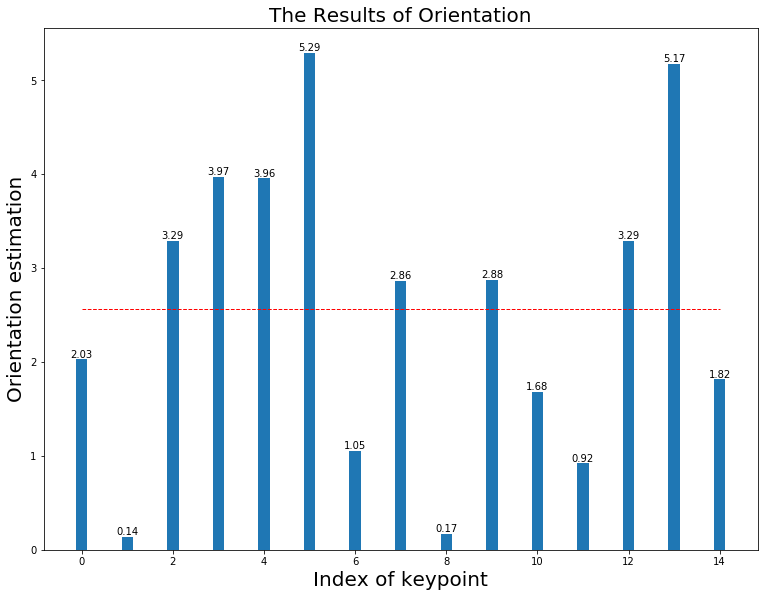

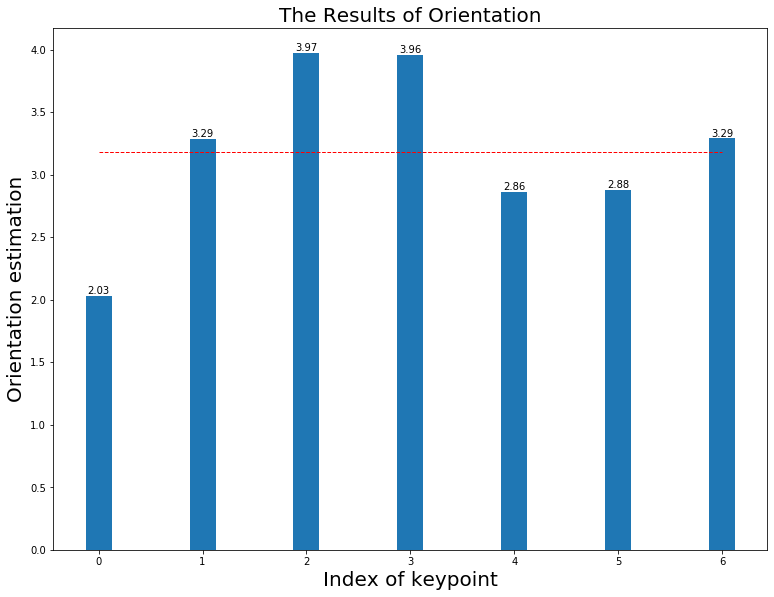

----------------------------------------------------------------------------------------------------
FD Rotate(3.3):mean(3.650), median(3.787) in 0.010
The HoG estimation when (3.3) is  3
The HoG & FD estimation when (3.3) is 3.14 in 0.033


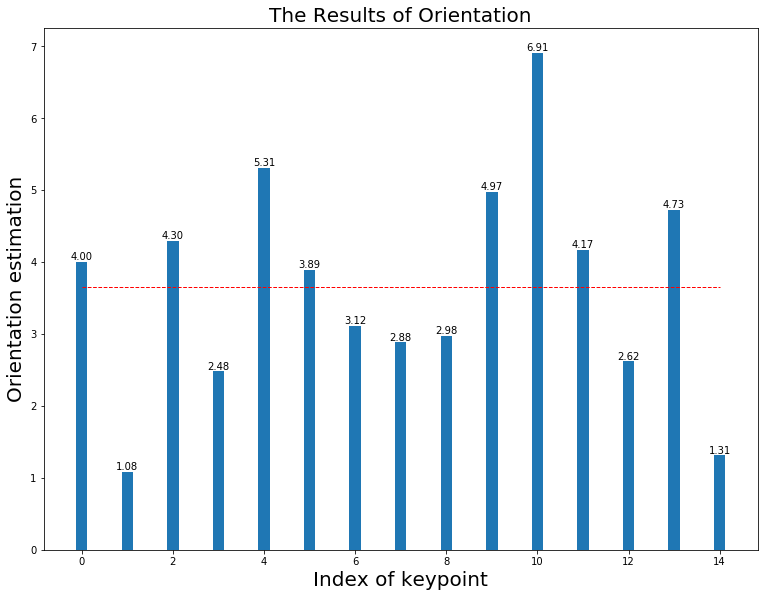

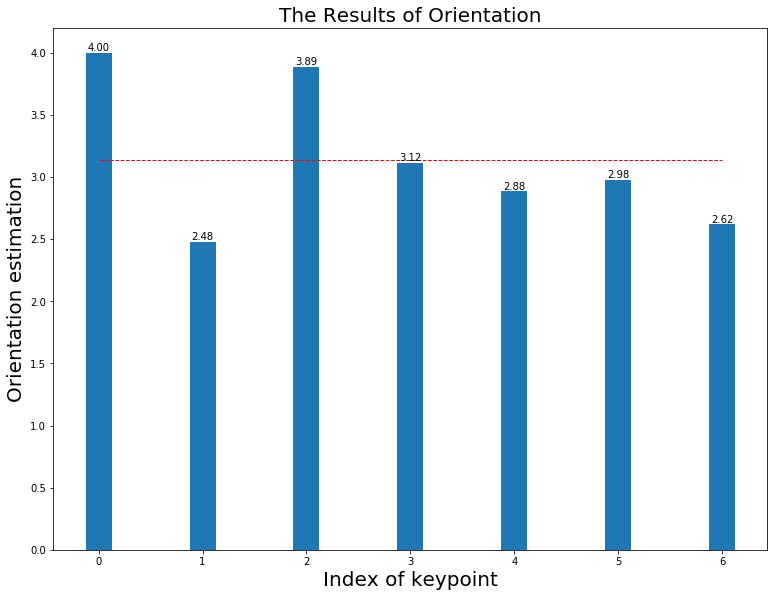

----------------------------------------------------------------------------------------------------
FD Rotate(3.4):mean(2.970), median(3.425) in 0.011
The HoG estimation when (3.4) is  3
The HoG & FD estimation when (3.4) is 3.08 in 0.031


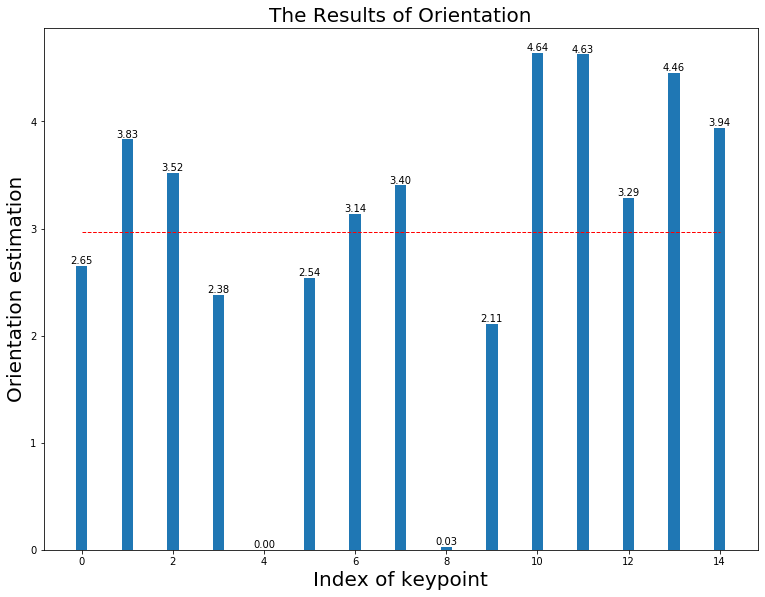

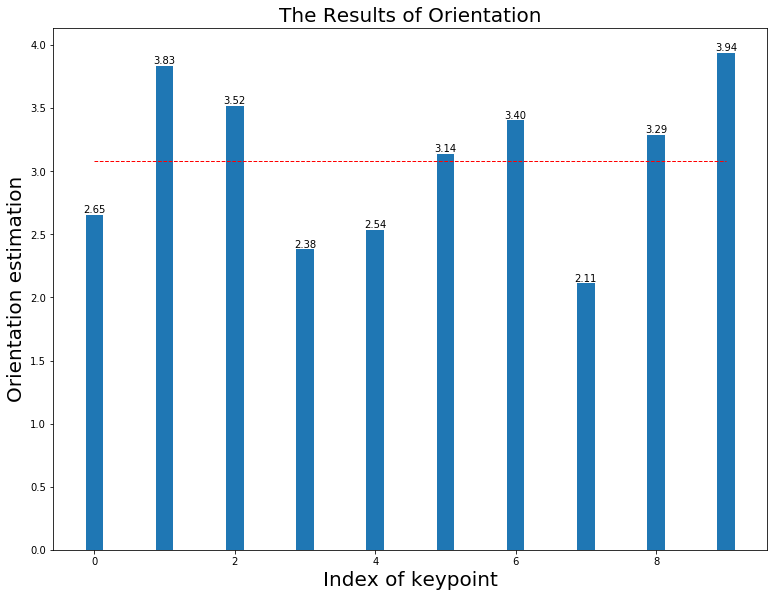

----------------------------------------------------------------------------------------------------
FD Rotate(3.5):mean(2.994), median(3.251) in 0.011
The HoG estimation when (3.5) is  3
The HoG & FD estimation when (3.5) is 3.14 in 0.034


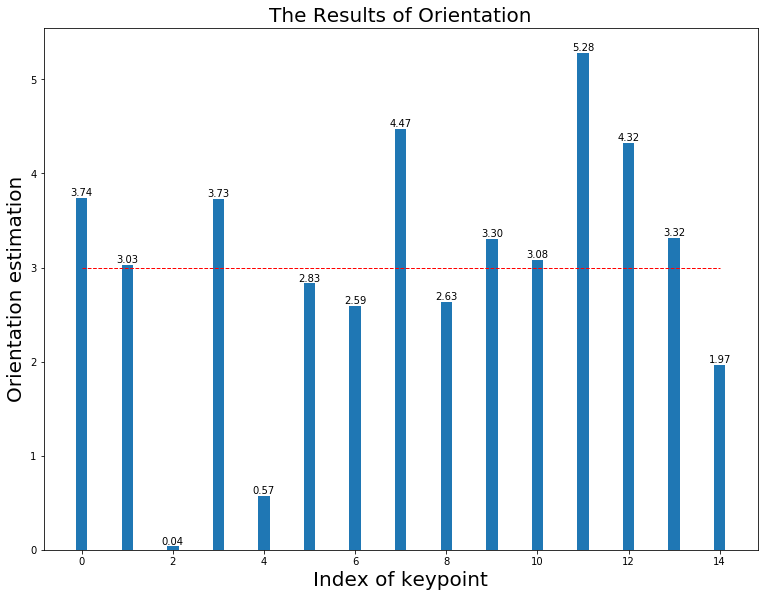

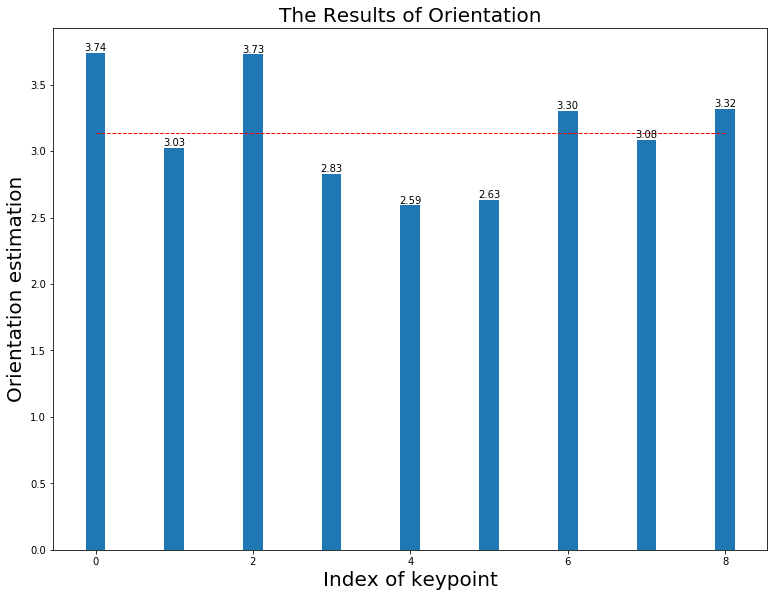

----------------------------------------------------------------------------------------------------
FD Rotate(3.6):mean(2.634), median(2.947) in 0.011
The HoG estimation when (3.6) is  4
The HoG & FD estimation when (3.6) is 3.61 in 0.032


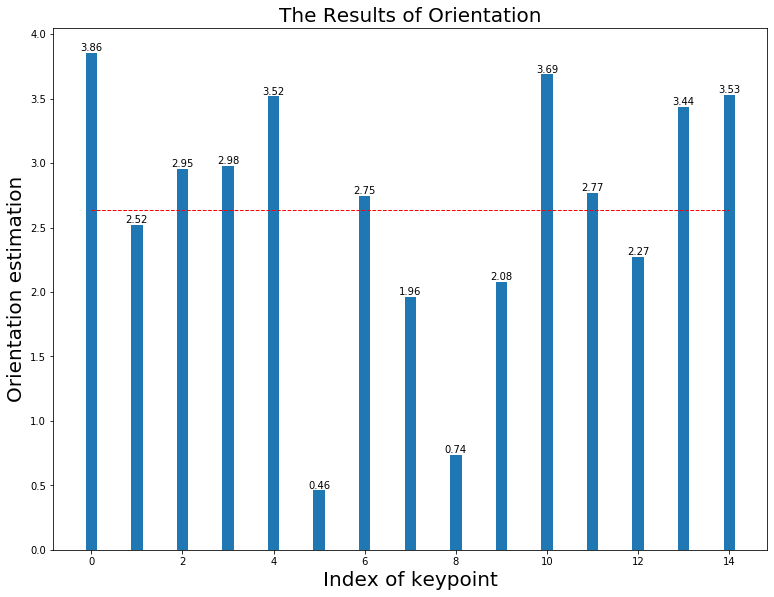

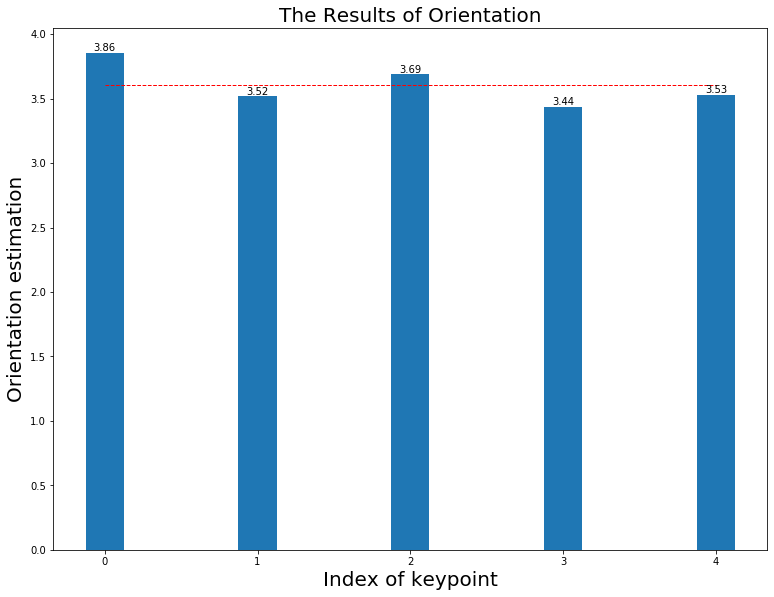

----------------------------------------------------------------------------------------------------
FD Rotate(3.7):mean(2.693), median(2.572) in 0.011
The HoG estimation when (3.7) is  4
The HoG & FD estimation when (3.7) is 3.97 in 0.036


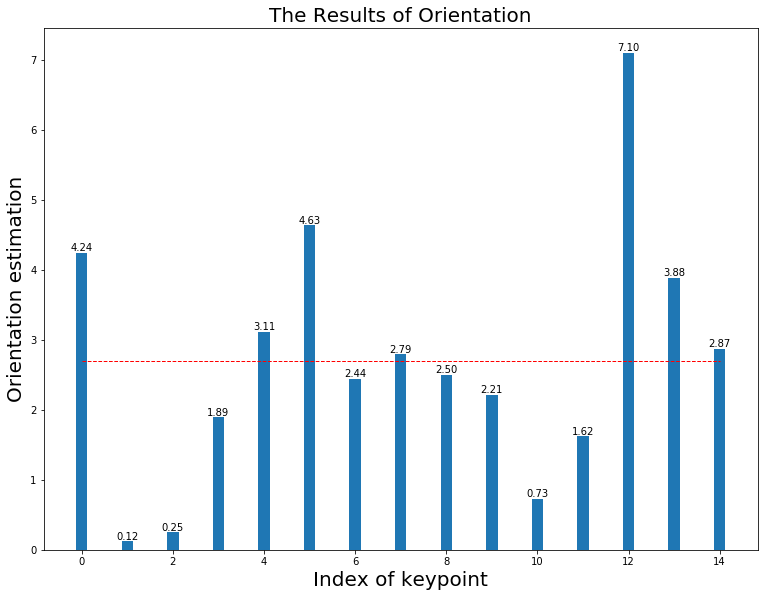

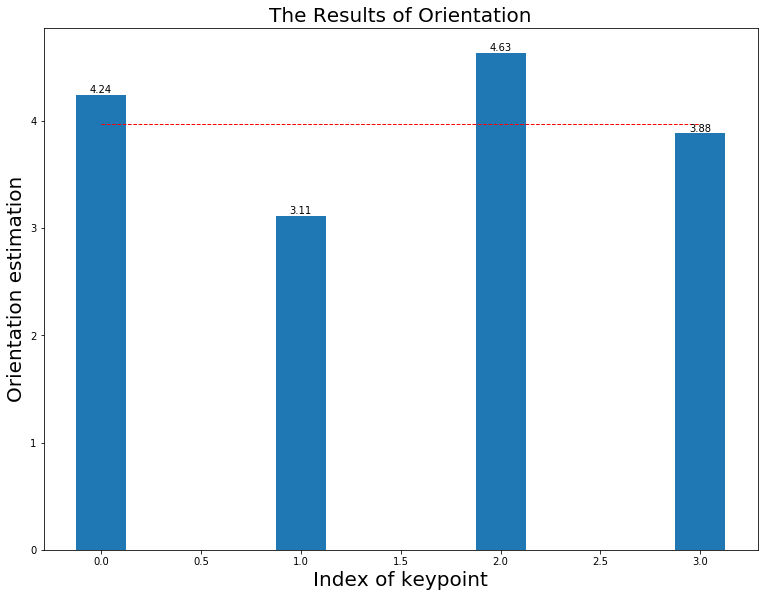

----------------------------------------------------------------------------------------------------
FD Rotate(3.8):mean(3.406), median(3.587) in 0.010
The HoG estimation when (3.8) is  4
The HoG & FD estimation when (3.8) is 4.19 in 0.032


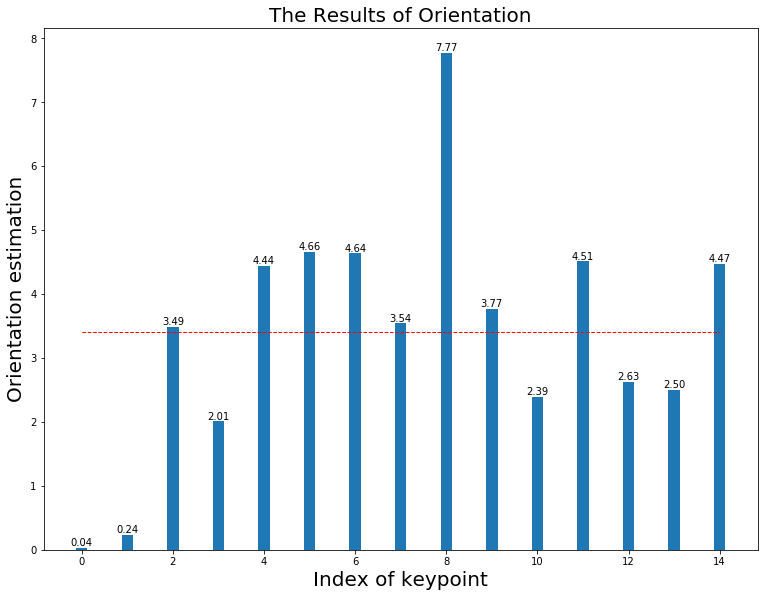

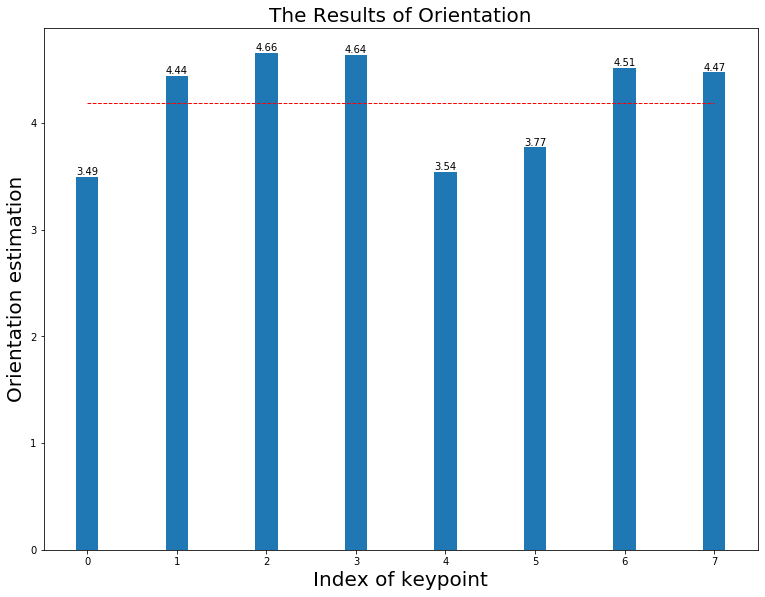

----------------------------------------------------------------------------------------------------
FD Rotate(3.9):mean(3.548), median(3.754) in 0.011
The HoG estimation when (3.9) is  4
The HoG & FD estimation when (3.9) is 4.06 in 0.033


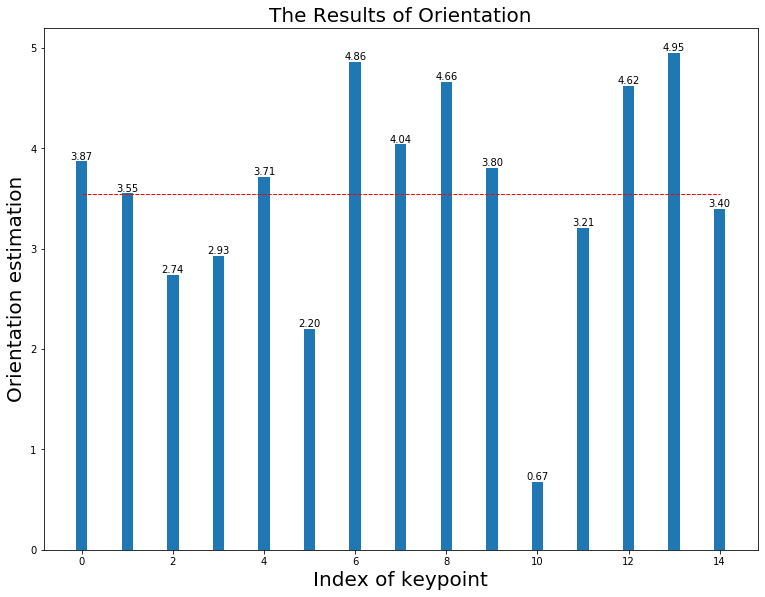

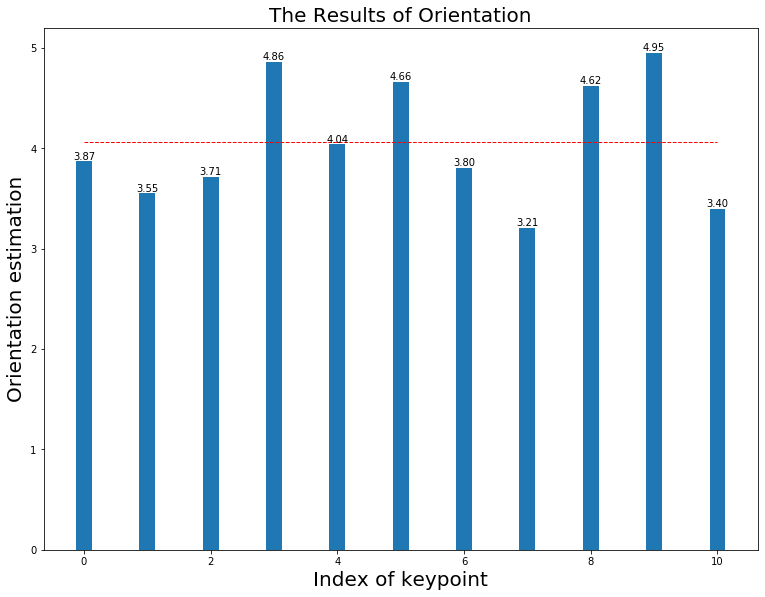

----------------------------------------------------------------------------------------------------
FD Rotate(4.0):mean(3.780), median(3.731) in 0.010
The HoG estimation when (4.0) is  4
The HoG & FD estimation when (4.0) is 3.98 in 0.030


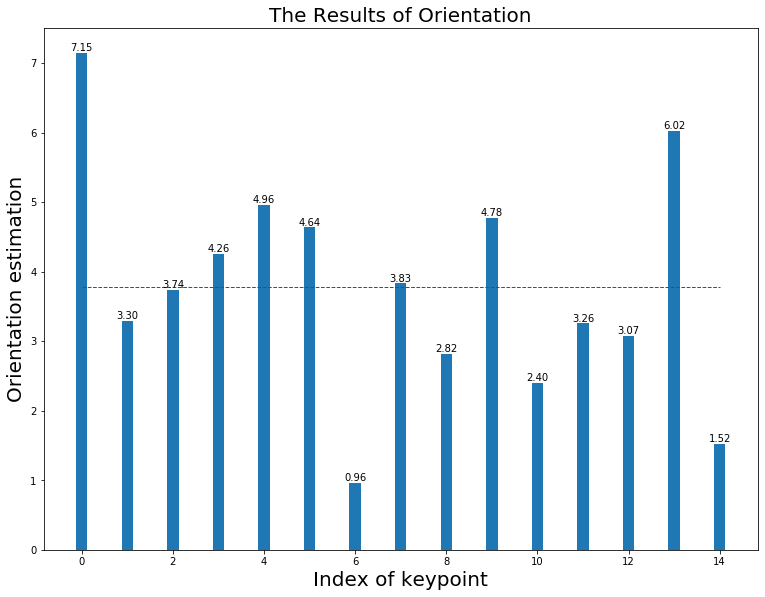

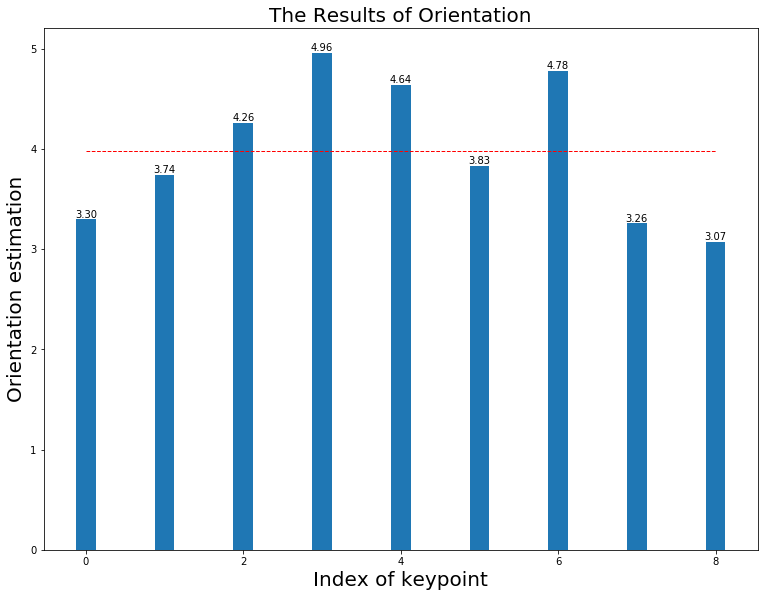

----------------------------------------------------------------------------------------------------
FD Rotate(4.1):mean(3.945), median(4.160) in 0.010
The HoG estimation when (4.1) is  4
The HoG & FD estimation when (4.1) is 3.92 in 0.030


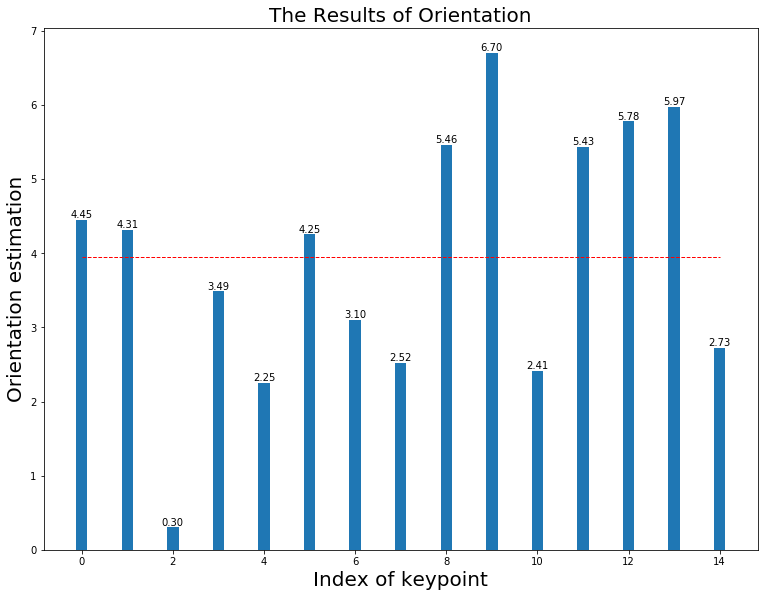

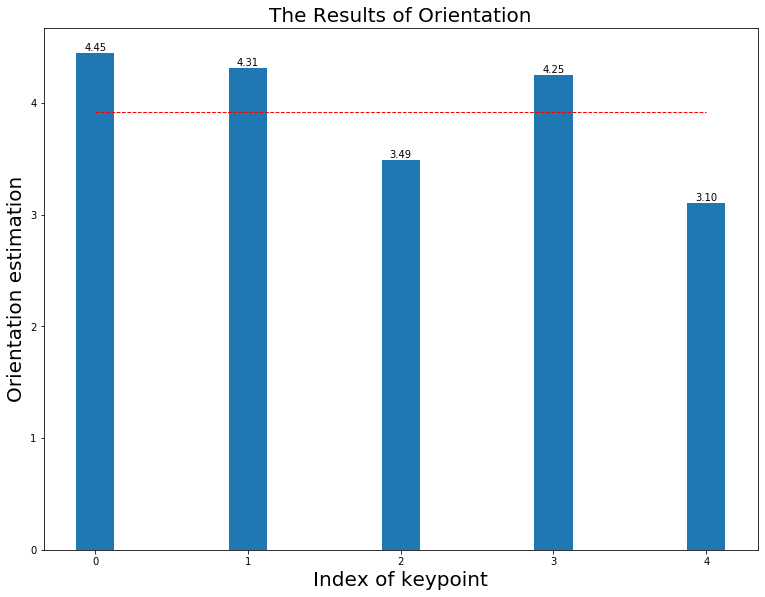

----------------------------------------------------------------------------------------------------
FD Rotate(4.2):mean(3.958), median(4.323) in 0.010
The HoG estimation when (4.2) is  4
The HoG & FD estimation when (4.2) is 4.21 in 0.031


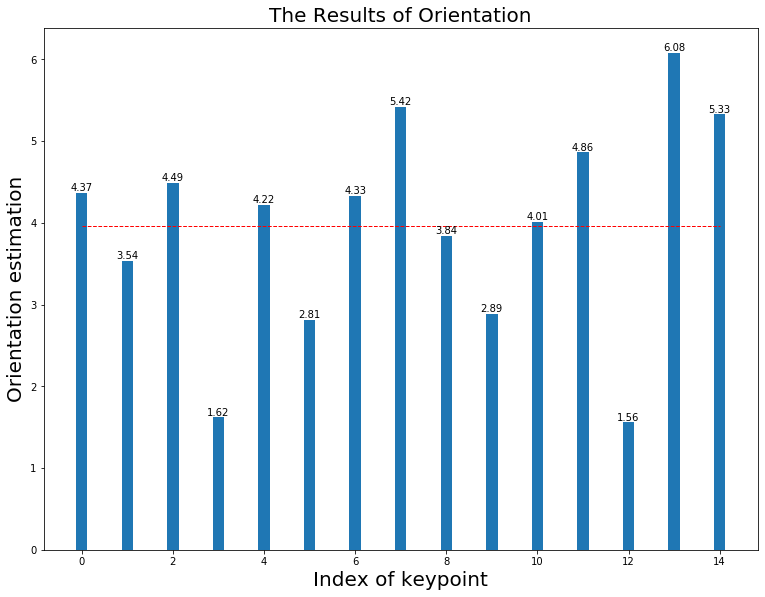

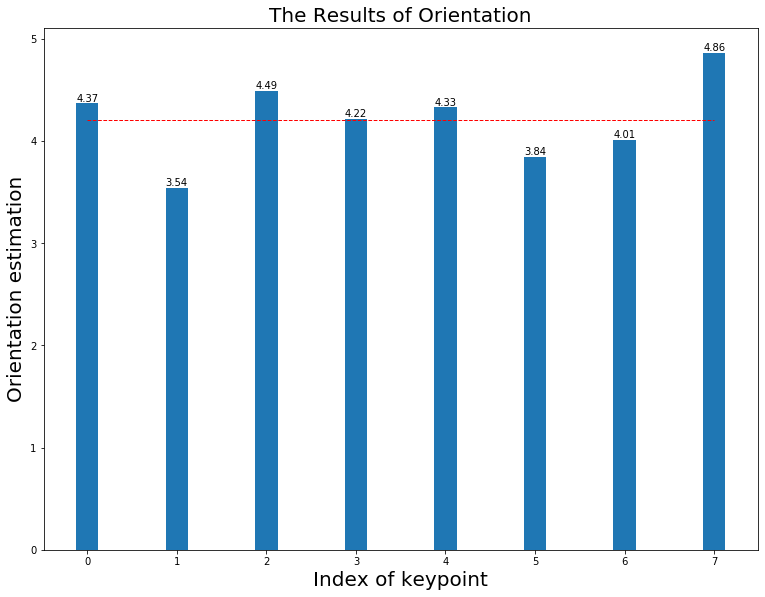

----------------------------------------------------------------------------------------------------
FD Rotate(4.3):mean(3.894), median(4.044) in 0.011
The HoG estimation when (4.3) is  4
The HoG & FD estimation when (4.3) is 4.08 in 0.030


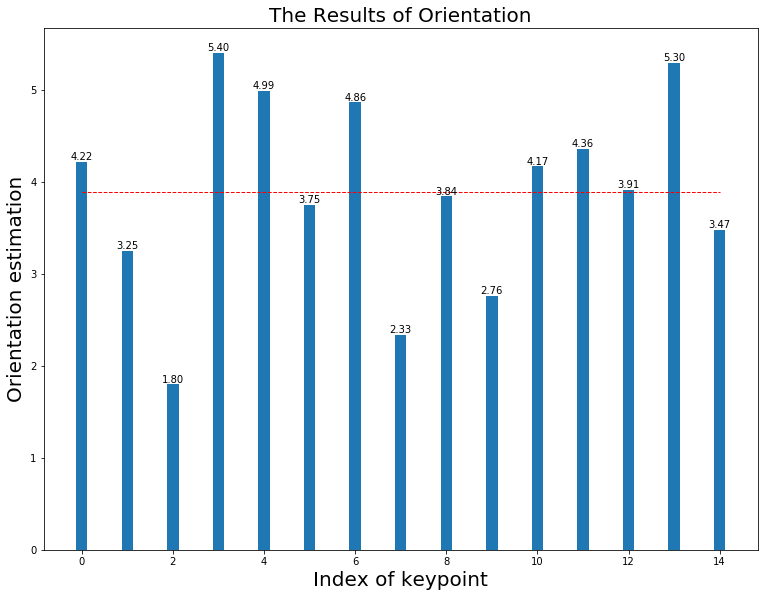

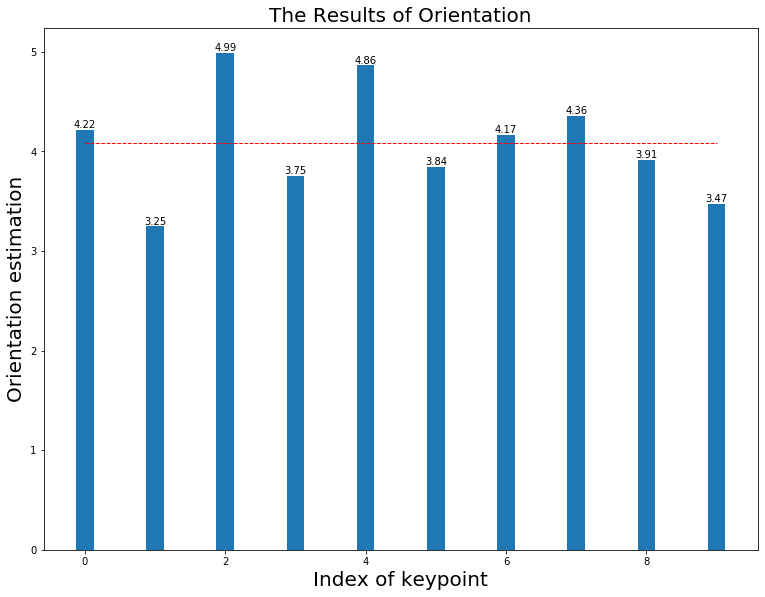

----------------------------------------------------------------------------------------------------
FD Rotate(4.4):mean(3.262), median(3.577) in 0.010
The HoG estimation when (4.4) is  5
The HoG & FD estimation when (4.4) is 4.43 in 0.032


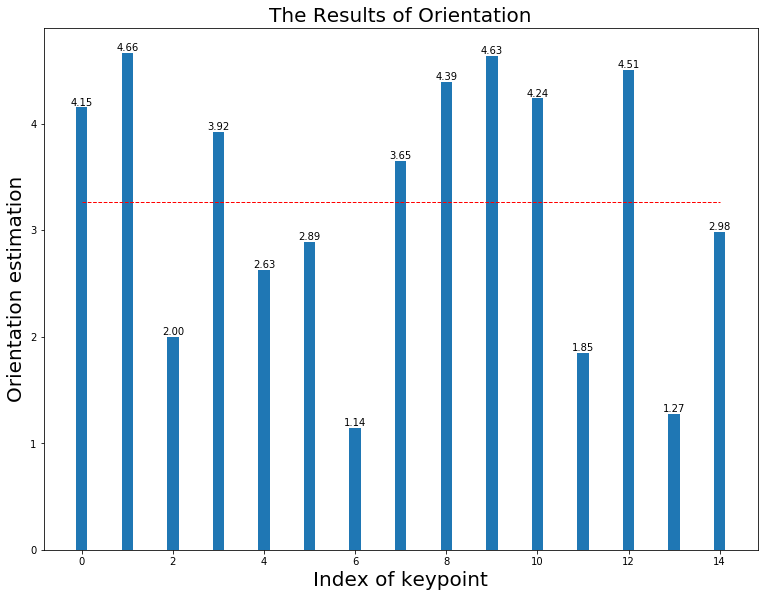

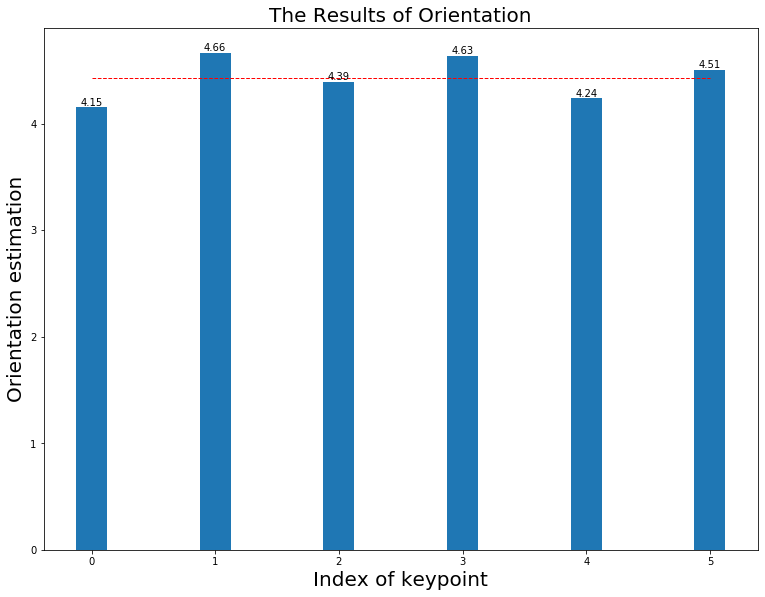

----------------------------------------------------------------------------------------------------
FD Rotate(4.5):mean(4.165), median(4.165) in 0.010
The HoG estimation when (4.5) is  5
The HoG & FD estimation when (4.5) is 4.27 in 0.030


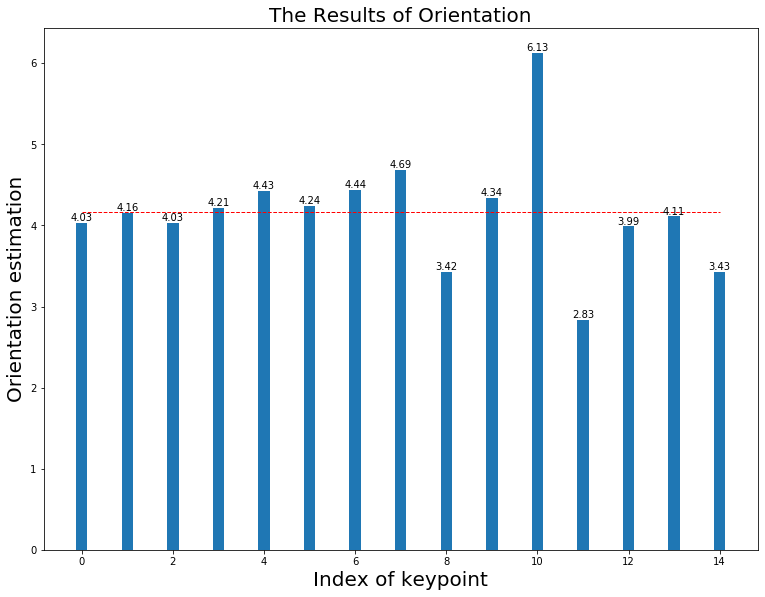

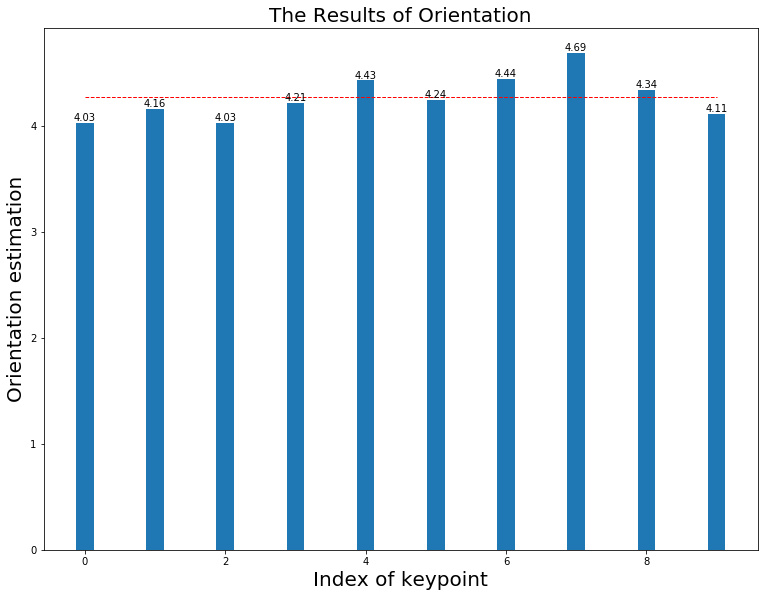

----------------------------------------------------------------------------------------------------
FD Rotate(4.6):mean(4.094), median(3.828) in 0.010
The HoG estimation when (4.6) is  5
The HoG & FD estimation when (4.6) is 4.72 in 0.050


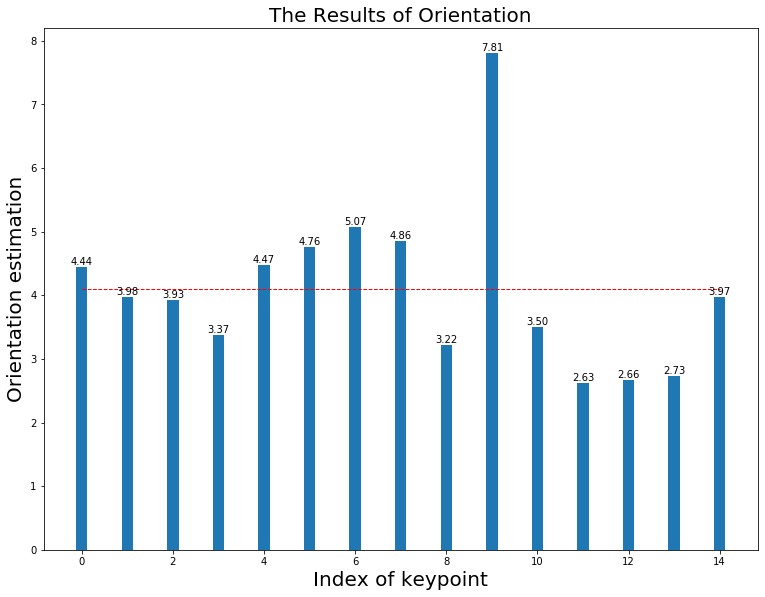

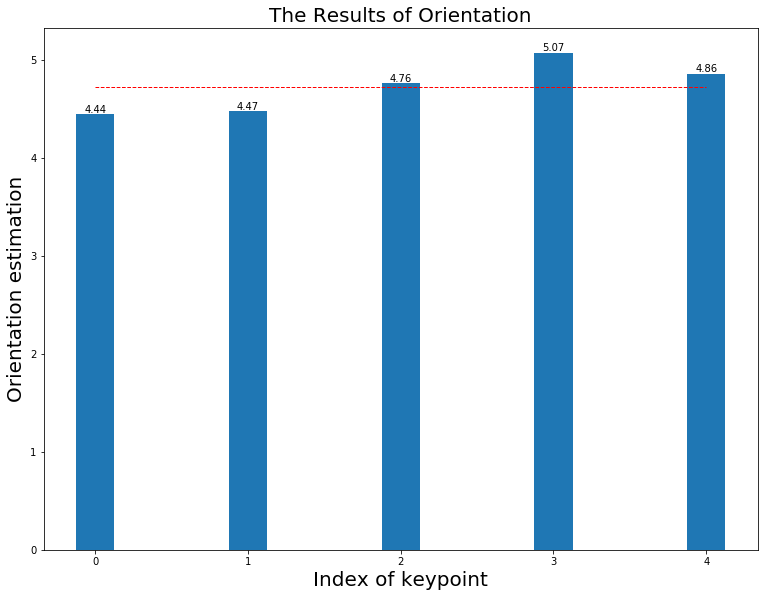

----------------------------------------------------------------------------------------------------
FD Rotate(4.7):mean(4.411), median(4.586) in 0.011
The HoG estimation when (4.7) is  5
The HoG & FD estimation when (4.7) is 4.92 in 0.031


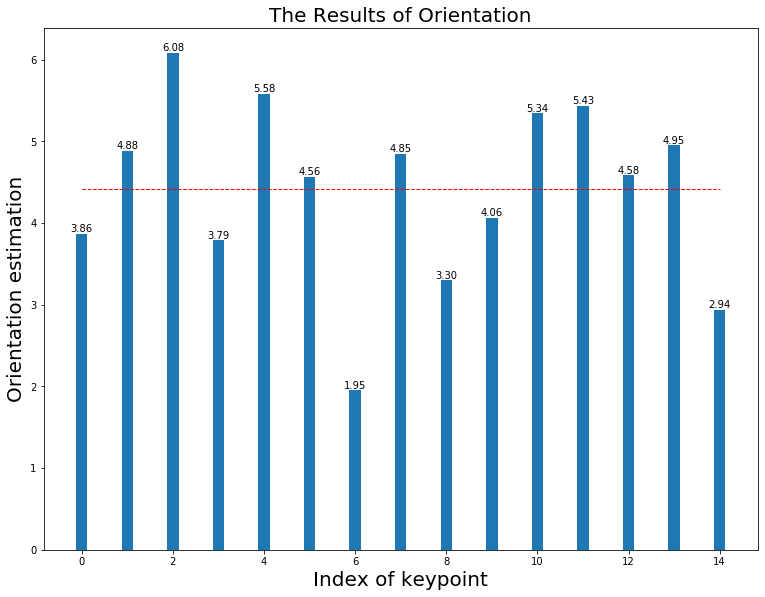

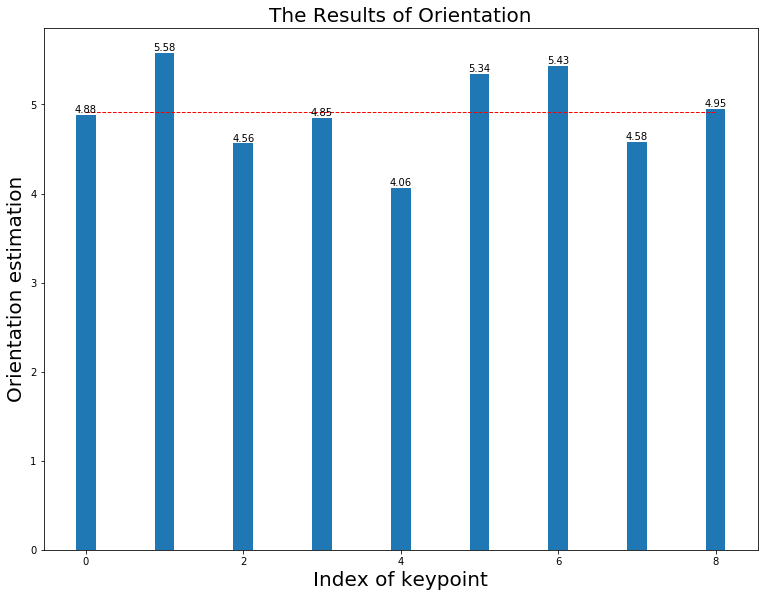

----------------------------------------------------------------------------------------------------
FD Rotate(4.8):mean(4.740), median(4.793) in 0.011
The HoG estimation when (4.8) is  5
The HoG & FD estimation when (4.8) is 4.96 in 0.033


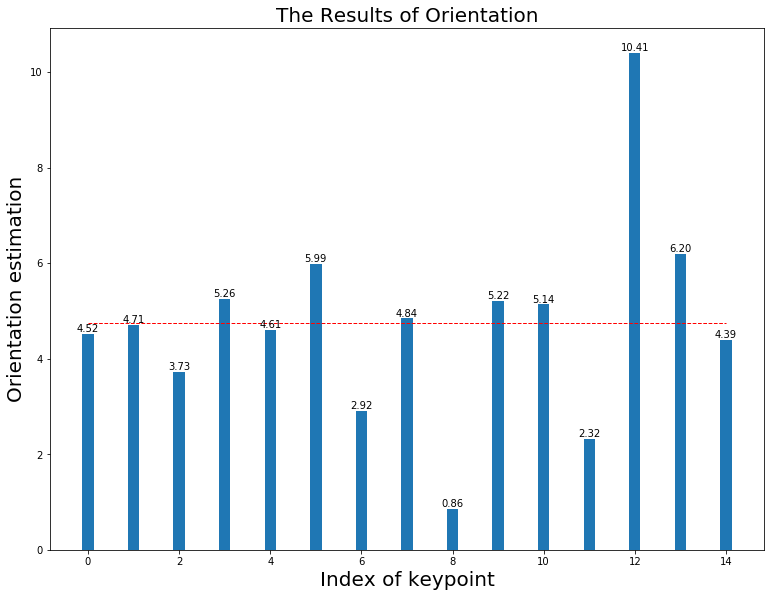

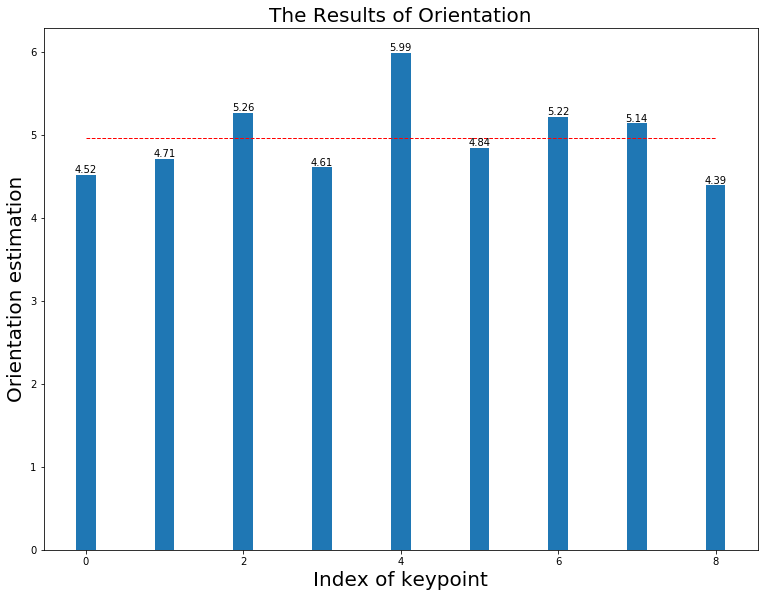

----------------------------------------------------------------------------------------------------
FD Rotate(4.9):mean(4.250), median(4.482) in 0.011
The HoG estimation when (4.9) is  5
The HoG & FD estimation when (4.9) is 5.11 in 0.033


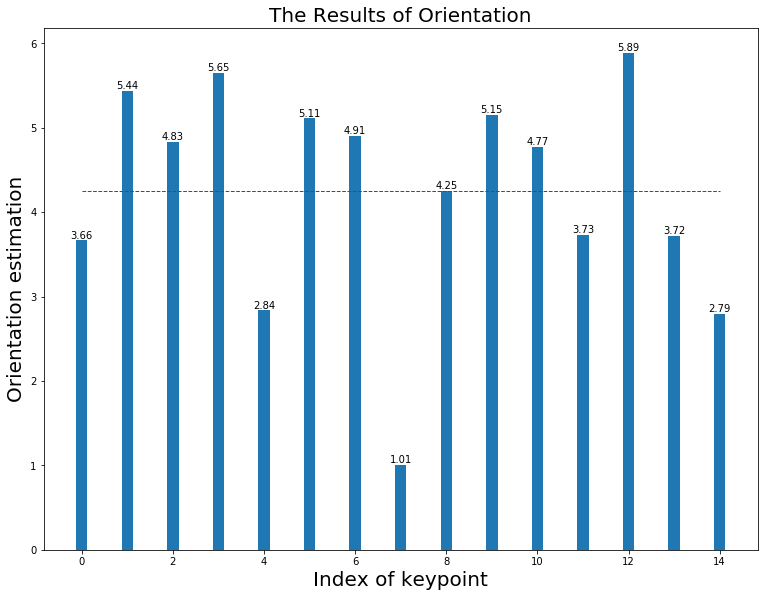

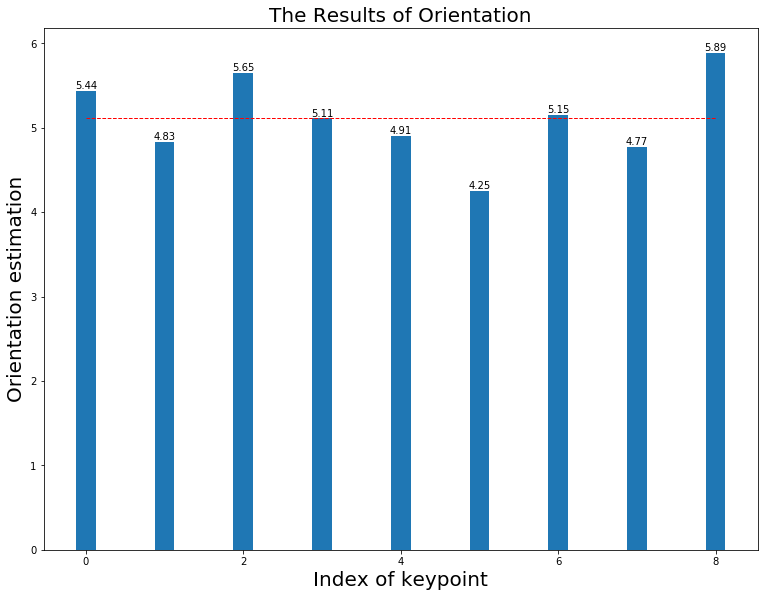

----------------------------------------------------------------------------------------------------
FD Rotate(5.0):mean(4.292), median(4.919) in 0.011
The HoG estimation when (5.0) is  5
The HoG & FD estimation when (5.0) is 5.07 in 0.031


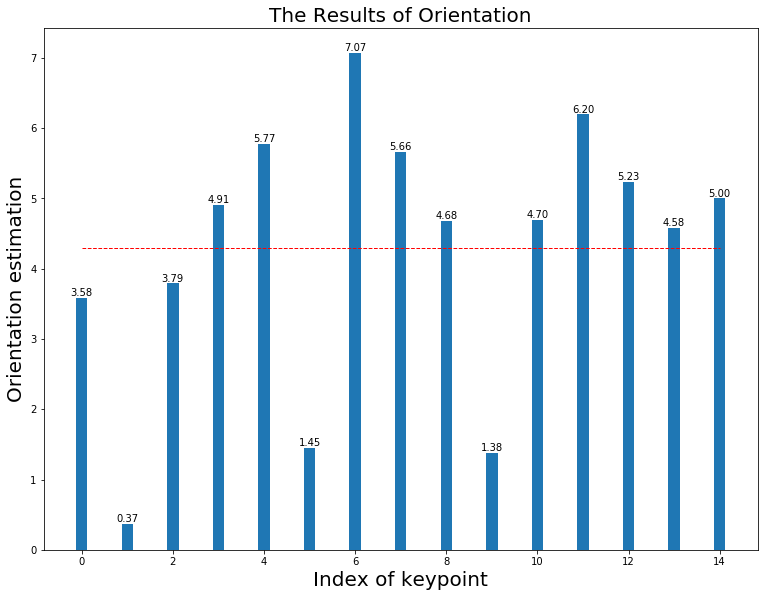

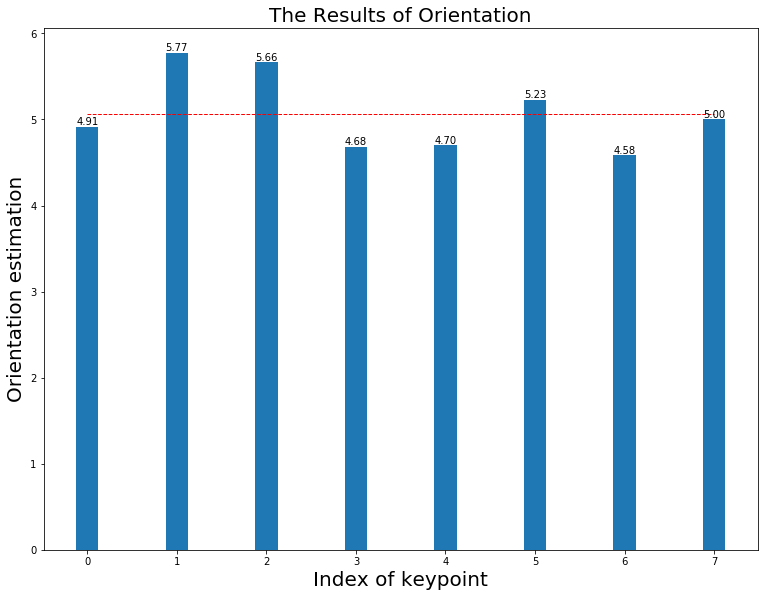

----------------------------------------------------------------------------------------------------
FD Rotate(5.1):mean(4.227), median(5.129) in 0.011
The HoG estimation when (5.1) is  5
The HoG & FD estimation when (5.1) is 5.22 in 0.032


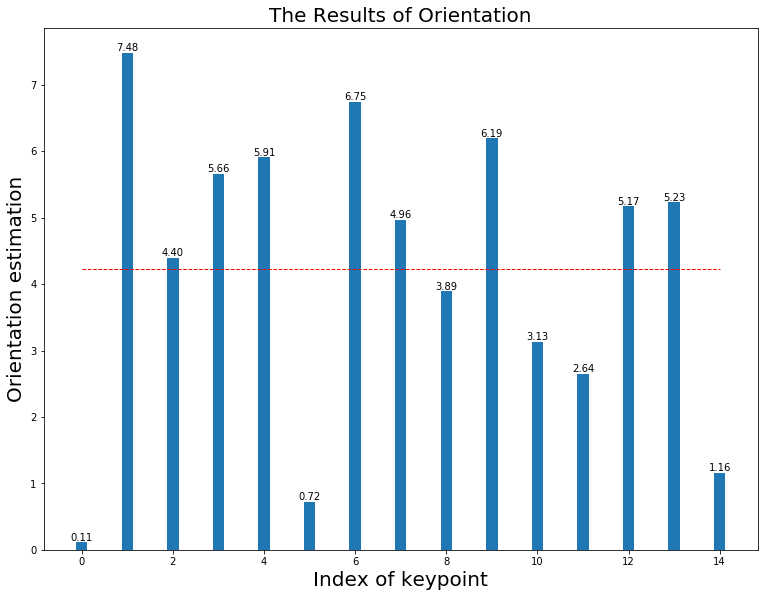

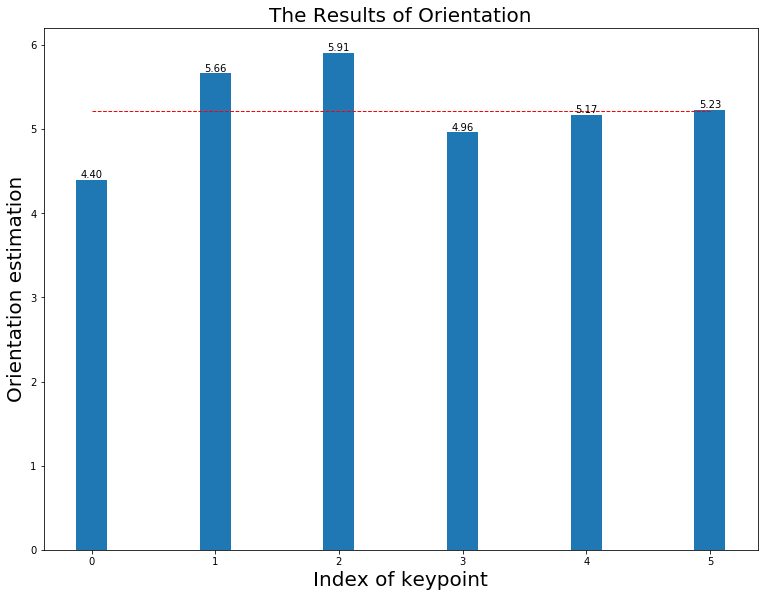

----------------------------------------------------------------------------------------------------
FD Rotate(5.2):mean(5.016), median(5.517) in 0.011
The HoG estimation when (5.2) is  5
The HoG & FD estimation when (5.2) is 5.28 in 0.030


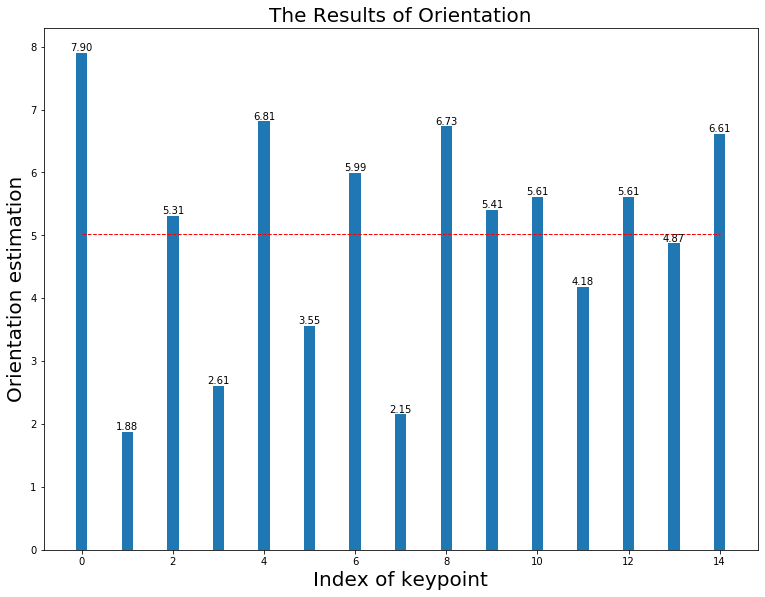

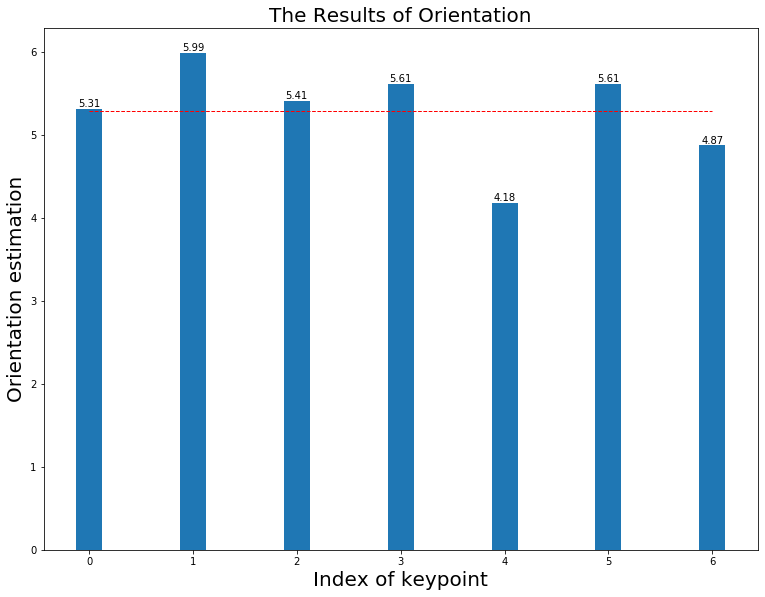

----------------------------------------------------------------------------------------------------
FD Rotate(5.3):mean(6.057), median(5.516) in 0.011
The HoG estimation when (5.3) is  5
The HoG & FD estimation when (5.3) is 5.11 in 0.034


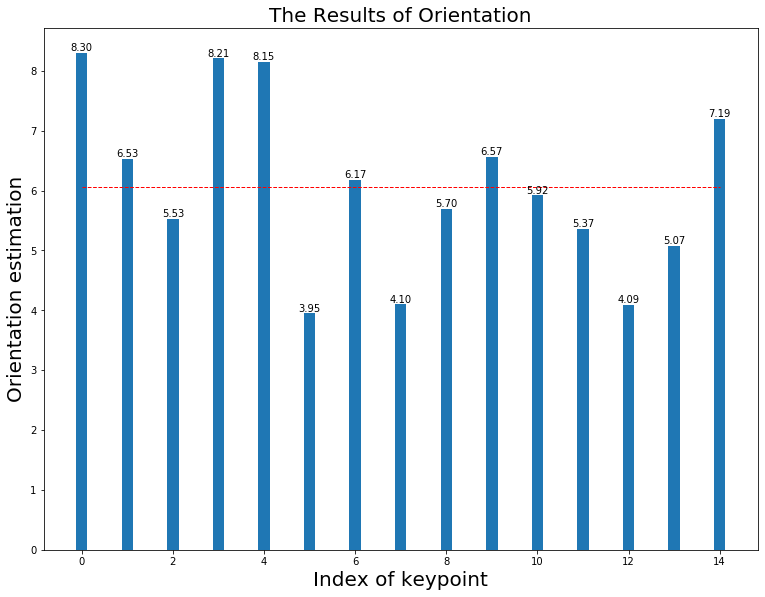

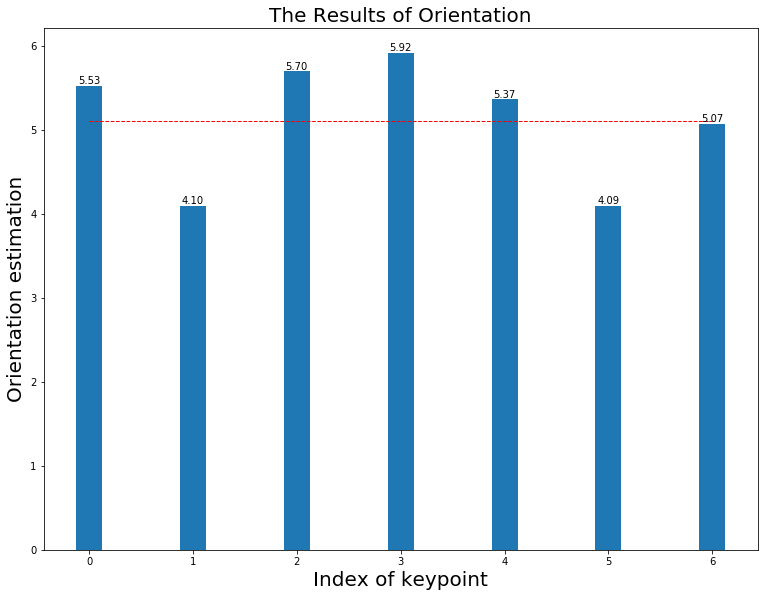

----------------------------------------------------------------------------------------------------
FD Rotate(5.4):mean(5.635), median(5.666) in 0.011
The HoG estimation when (5.4) is  5
The HoG & FD estimation when (5.4) is 5.04 in 0.033


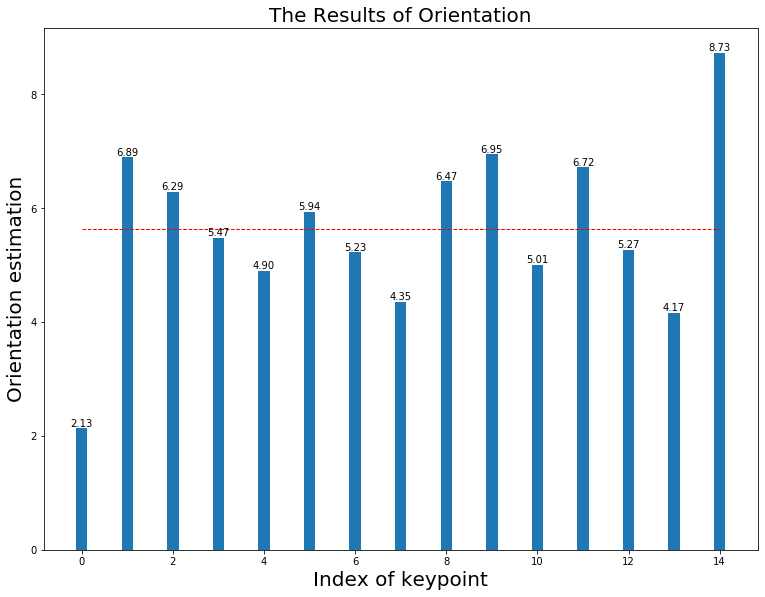

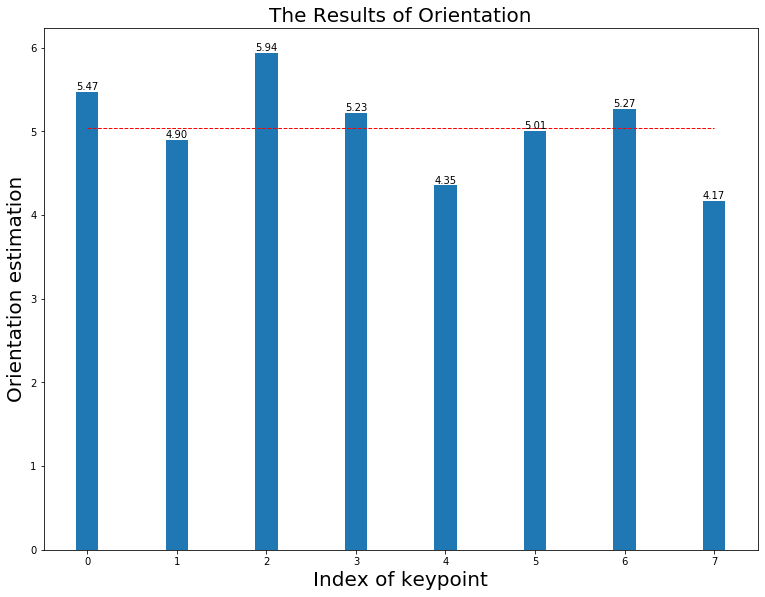

----------------------------------------------------------------------------------------------------
FD Rotate(5.5):mean(5.104), median(5.241) in 0.011
The HoG estimation when (5.5) is  6
The HoG & FD estimation when (5.5) is 5.75 in 0.032


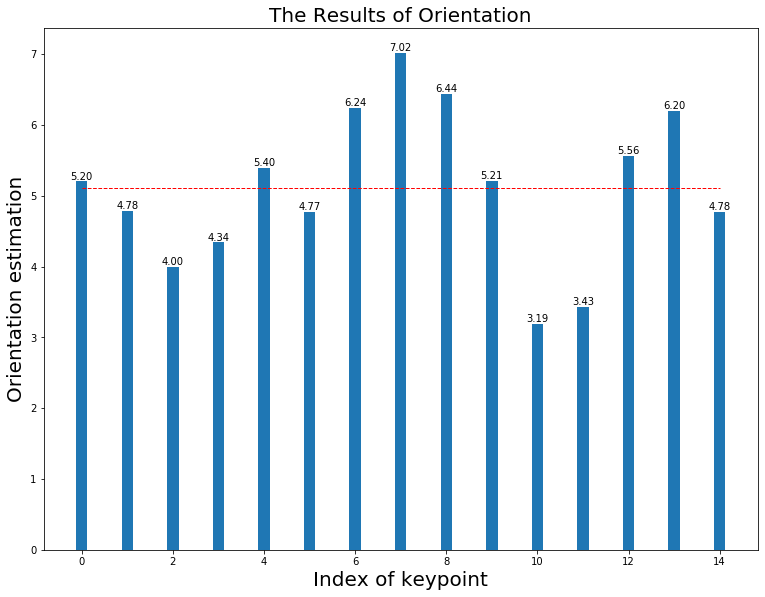

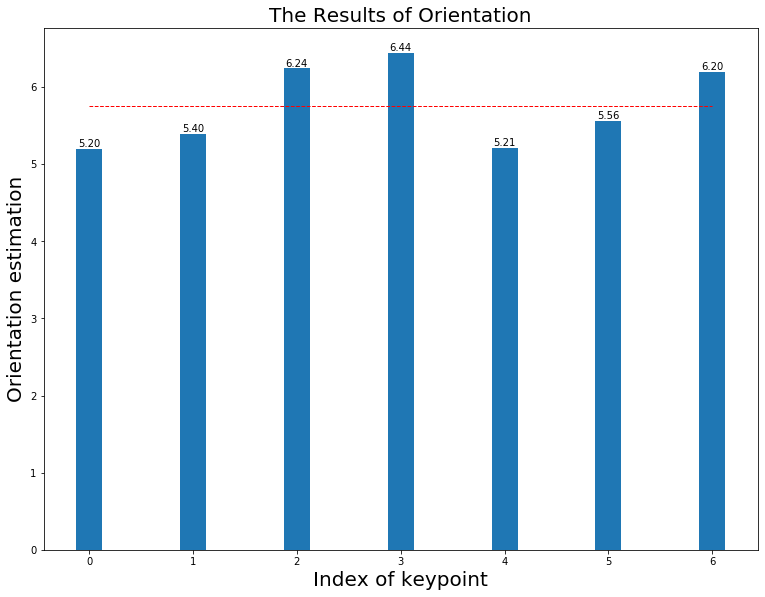

----------------------------------------------------------------------------------------------------
FD Rotate(5.6):mean(4.749), median(4.909) in 0.011
The HoG estimation when (5.6) is  6
The HoG & FD estimation when (5.6) is 5.78 in 0.030


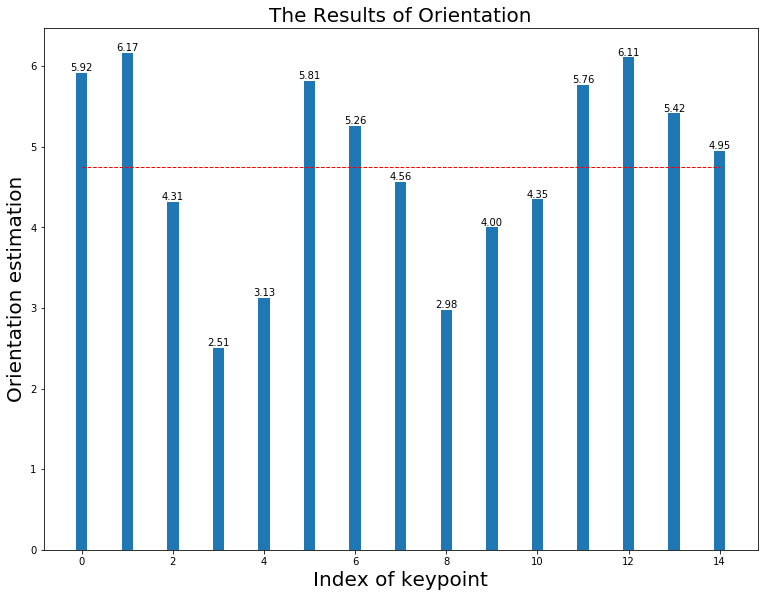

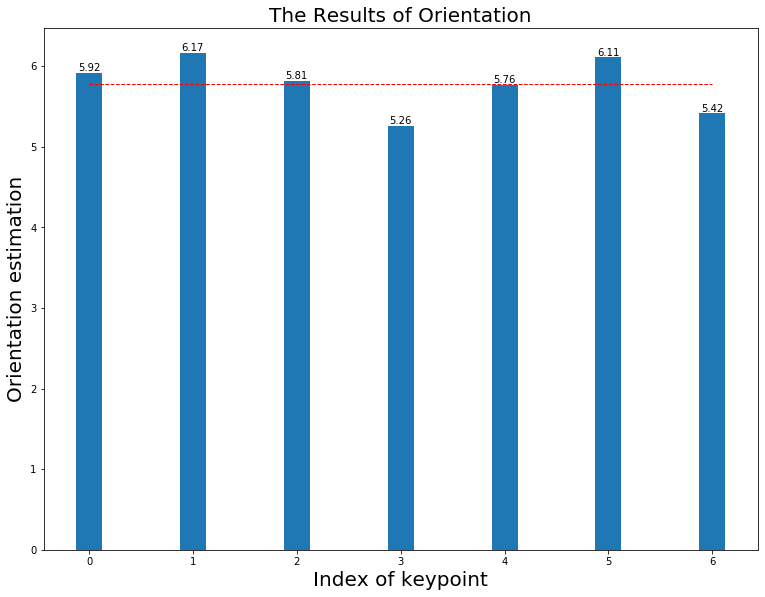

----------------------------------------------------------------------------------------------------
FD Rotate(5.7):mean(5.145), median(5.962) in 0.011
The HoG estimation when (5.7) is  6
The HoG & FD estimation when (5.7) is 6.09 in 0.032


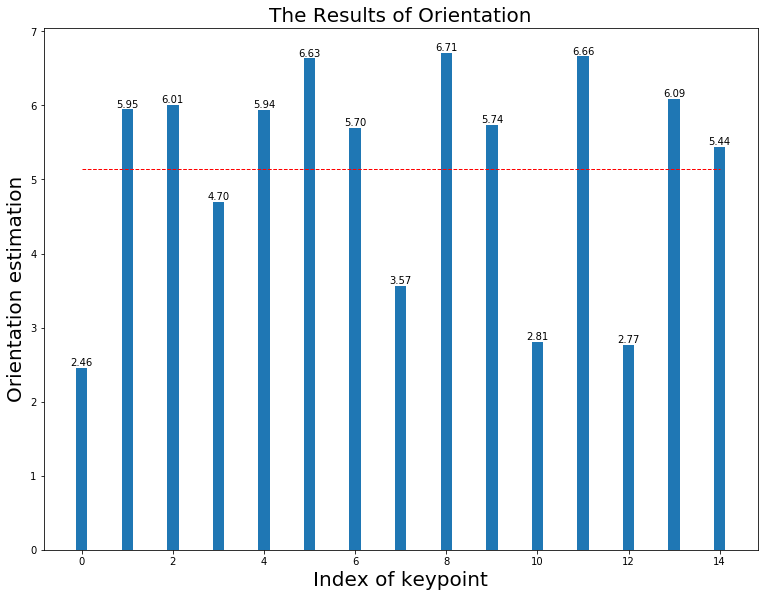

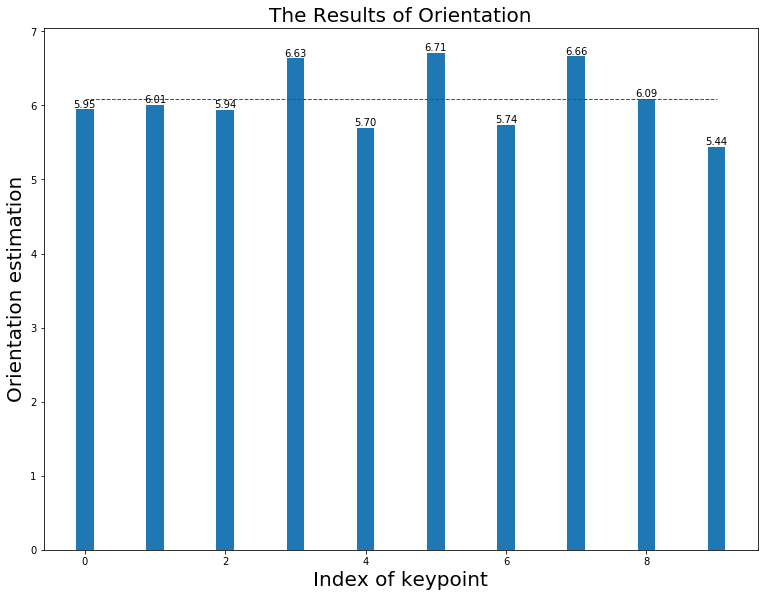

----------------------------------------------------------------------------------------------------
FD Rotate(5.8):mean(5.339), median(5.708) in 0.010
The HoG estimation when (5.8) is  6
The HoG & FD estimation when (5.8) is 5.82 in 0.032


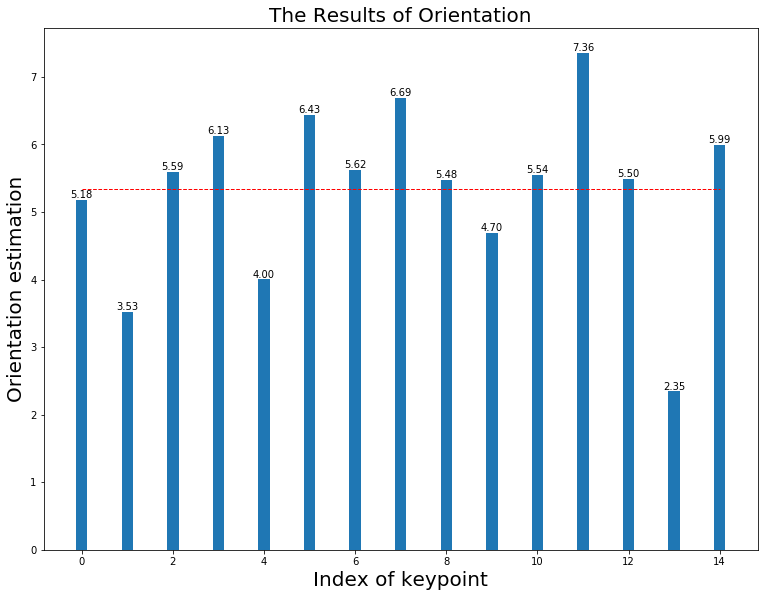

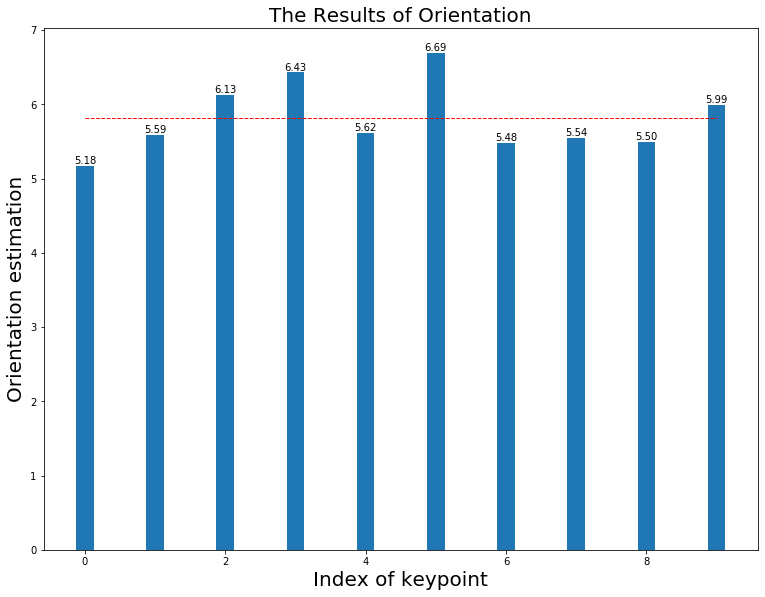

----------------------------------------------------------------------------------------------------
FD Rotate(5.9):mean(5.367), median(5.590) in 0.011
The HoG estimation when (5.9) is  6
The HoG & FD estimation when (5.9) is 6.00 in 0.031


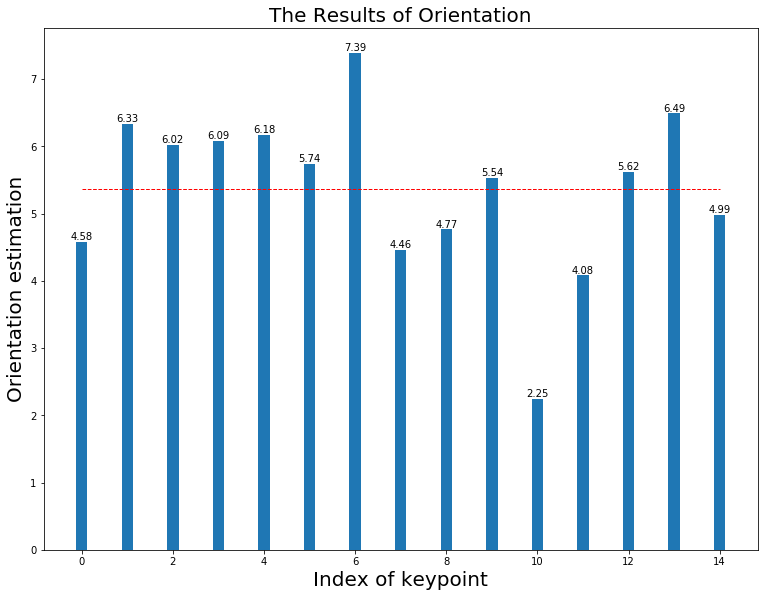

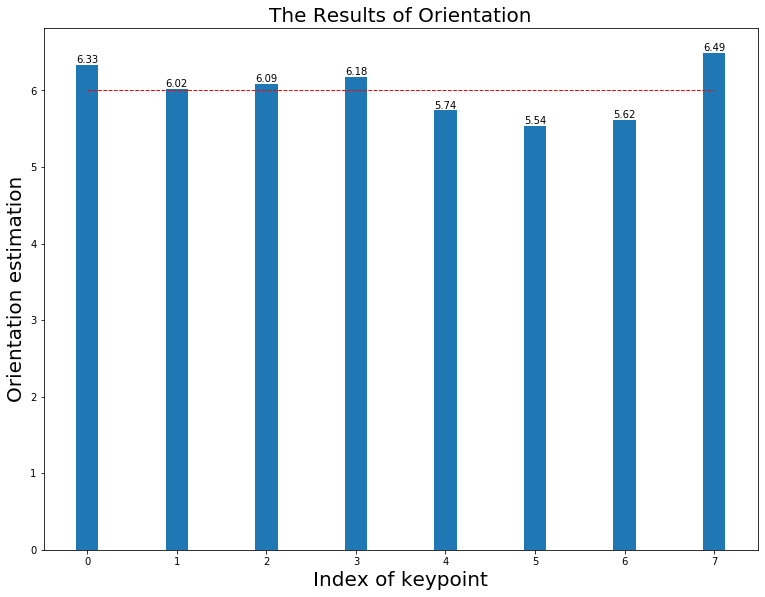

----------------------------------------------------------------------------------------------------
FD Rotate(6.0):mean(6.154), median(5.713) in 0.011
The HoG estimation when (6.0) is  6
The HoG & FD estimation when (6.0) is 5.93 in 0.032


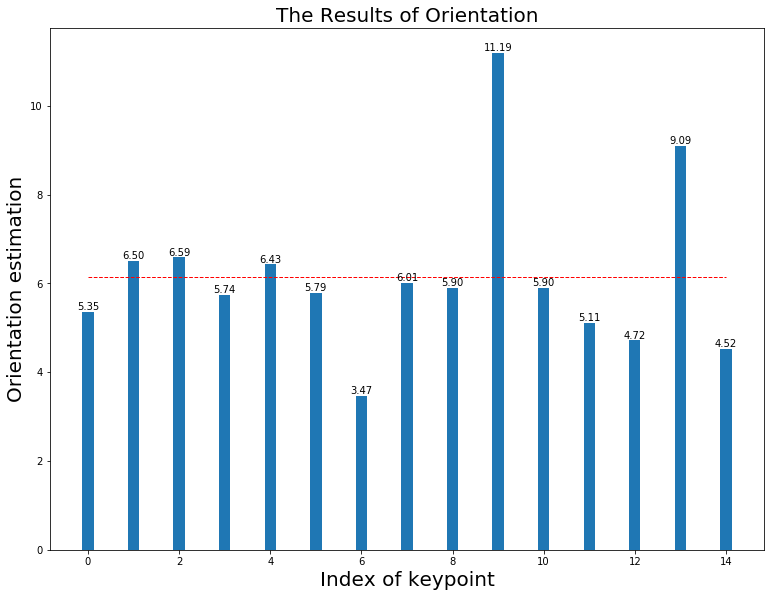

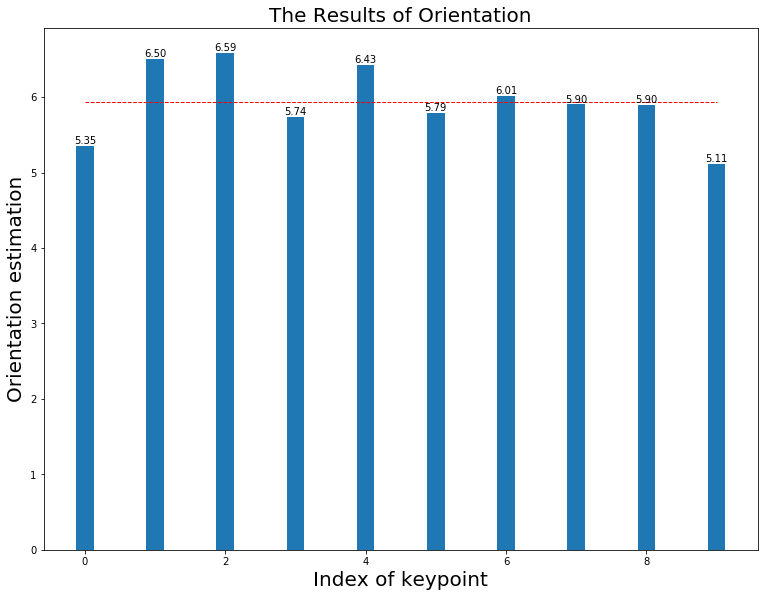

----------------------------------------------------------------------------------------------------
FD Rotate(6.1):mean(6.476), median(6.099) in 0.011
The HoG estimation when (6.1) is  6
The HoG & FD estimation when (6.1) is 6.10 in 0.031


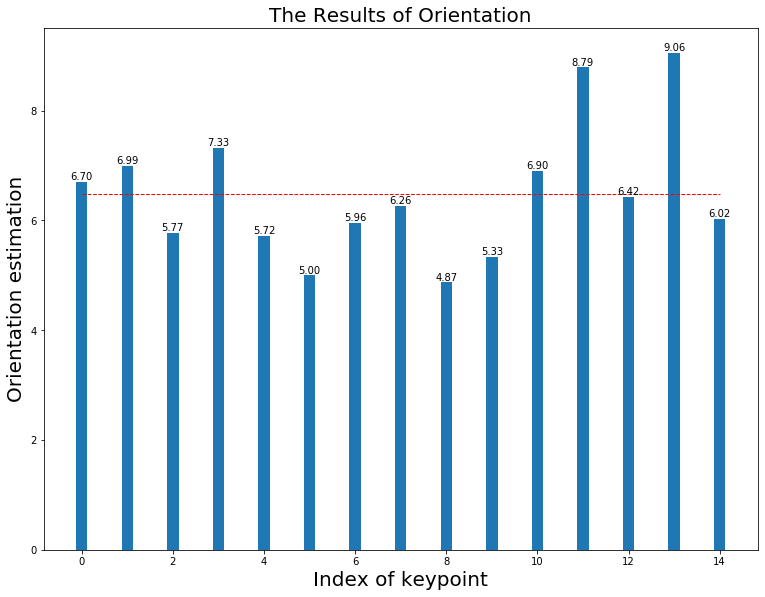

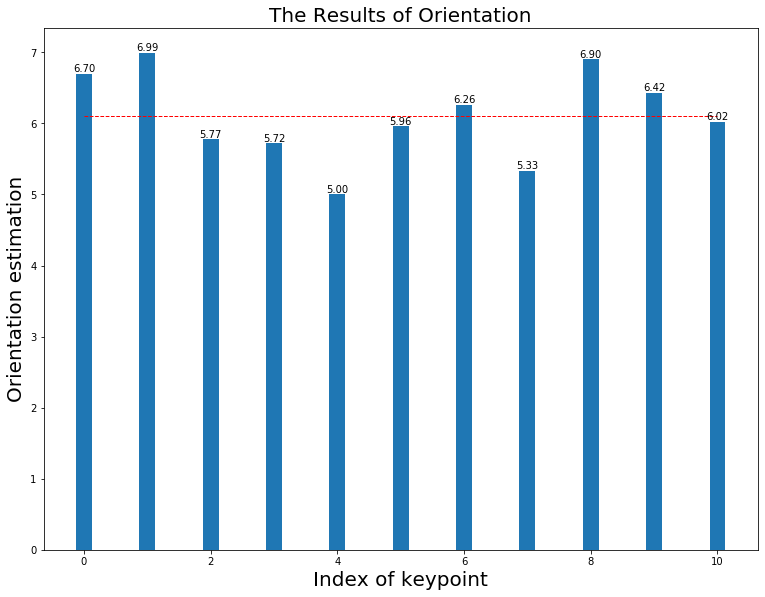

----------------------------------------------------------------------------------------------------
FD Rotate(6.2):mean(5.616), median(6.001) in 0.011
The HoG estimation when (6.2) is  6
The HoG & FD estimation when (6.2) is 6.11 in 0.036


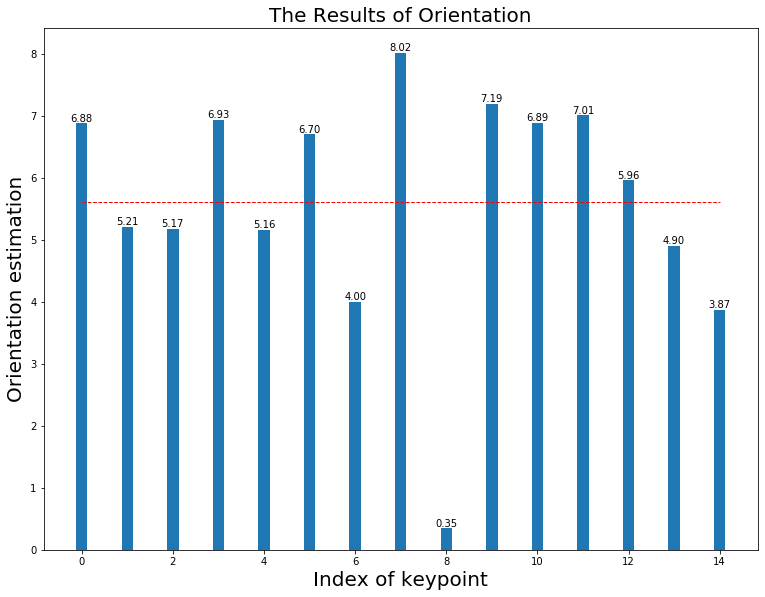

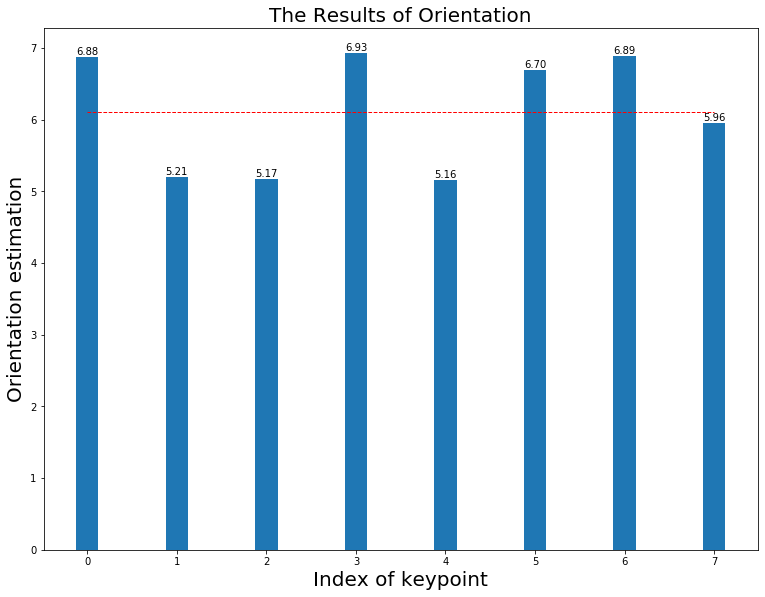

----------------------------------------------------------------------------------------------------
FD Rotate(6.3):mean(5.653), median(5.701) in 0.011
The HoG estimation when (6.3) is  6
The HoG & FD estimation when (6.3) is 5.95 in 0.030


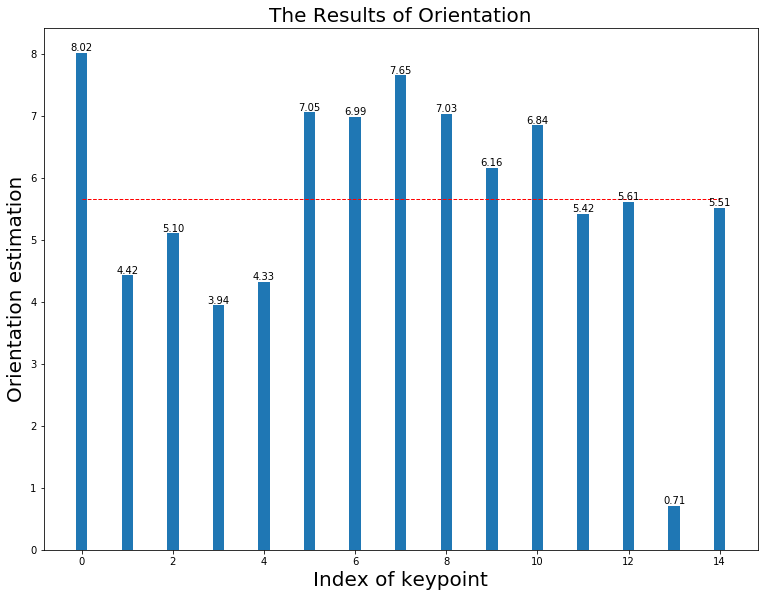

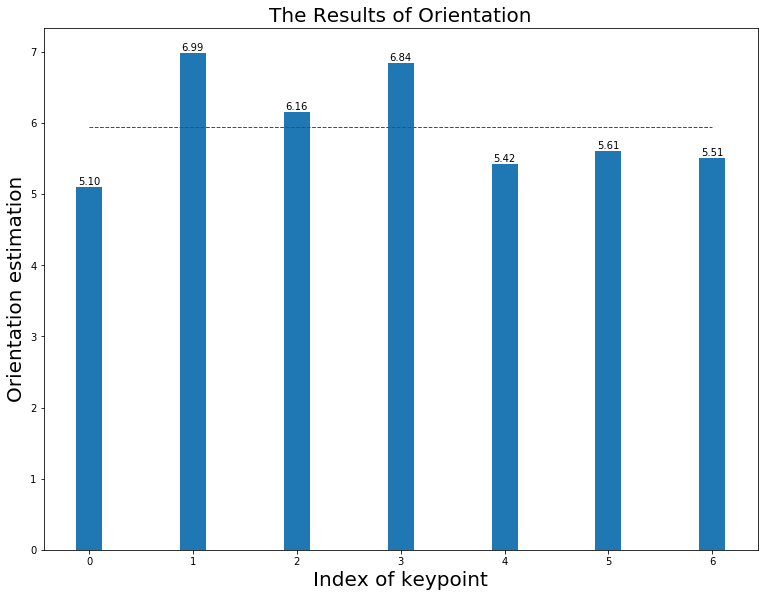

----------------------------------------------------------------------------------------------------
FD Rotate(6.4):mean(6.365), median(6.217) in 0.011
The HoG estimation when (6.4) is  6
The HoG & FD estimation when (6.4) is 6.11 in 0.031


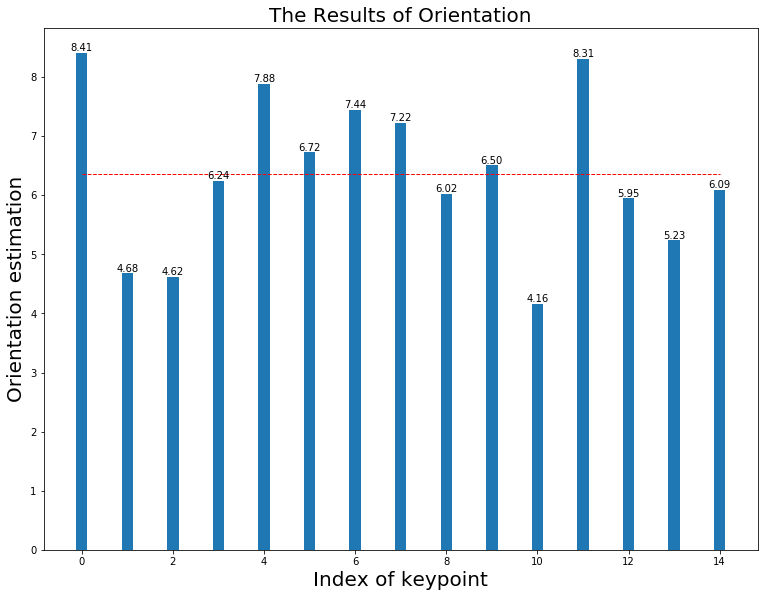

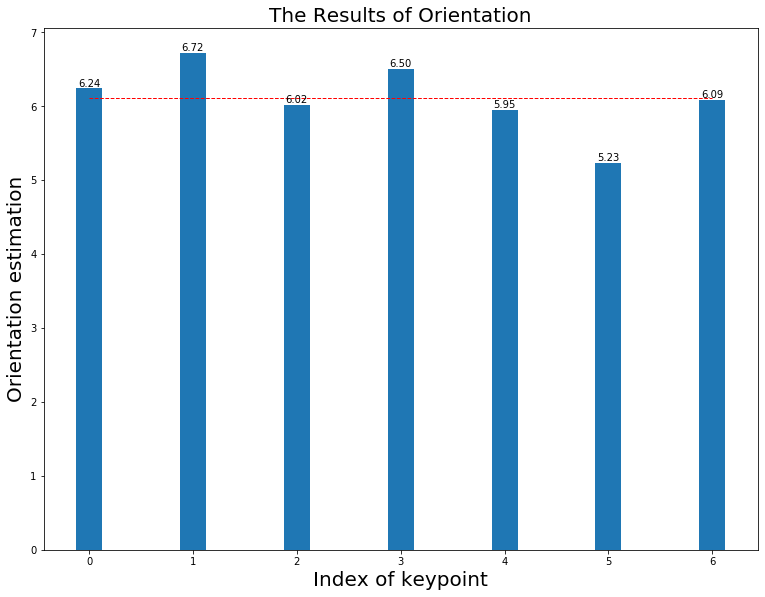

----------------------------------------------------------------------------------------------------
FD Rotate(6.5):mean(6.336), median(6.510) in 0.010
The HoG estimation when (6.5) is  7
The HoG & FD estimation when (6.5) is 6.88 in 0.030


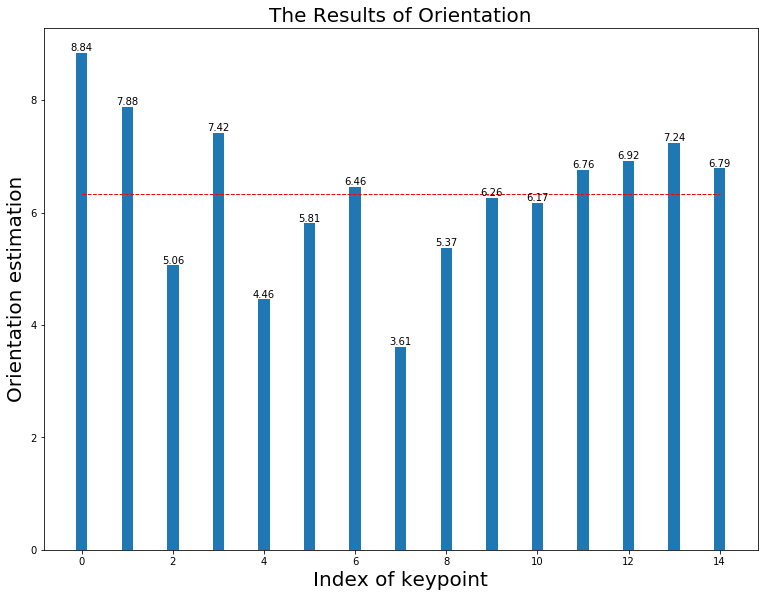

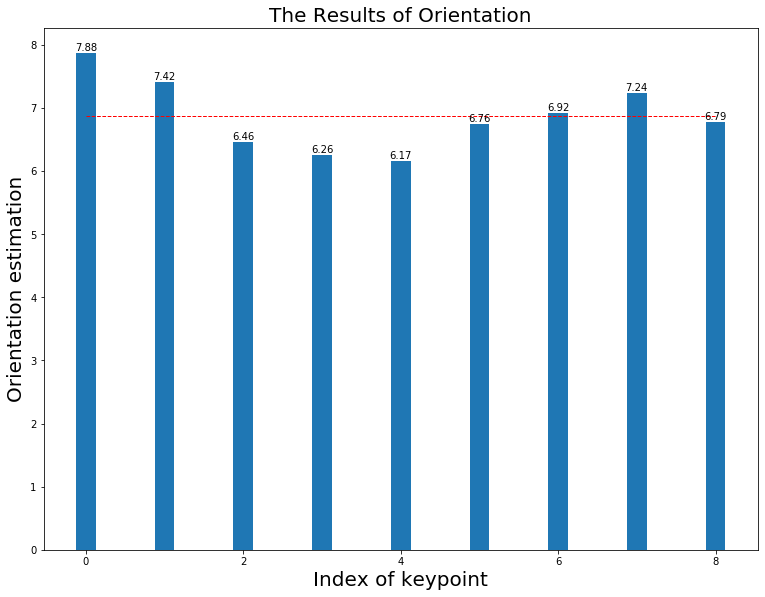

----------------------------------------------------------------------------------------------------
FD Rotate(6.6):mean(6.113), median(6.662) in 0.010
The HoG estimation when (6.6) is  7
The HoG & FD estimation when (6.6) is 6.92 in 0.032


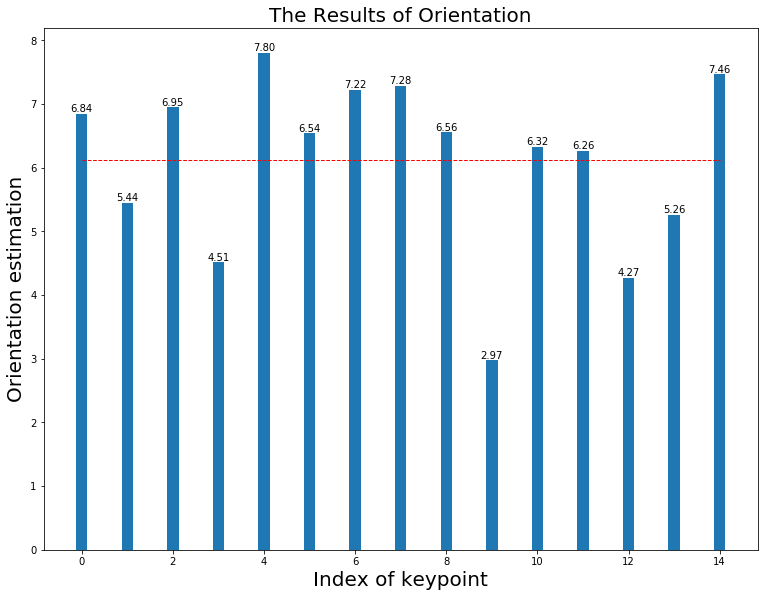

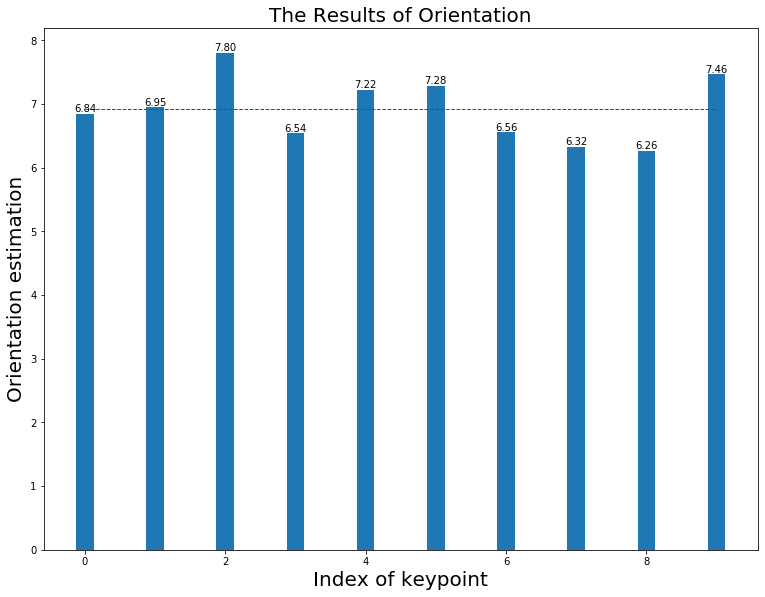

----------------------------------------------------------------------------------------------------
FD Rotate(6.7):mean(6.444), median(6.693) in 0.010
The HoG estimation when (6.7) is  7
The HoG & FD estimation when (6.7) is 6.79 in 0.030


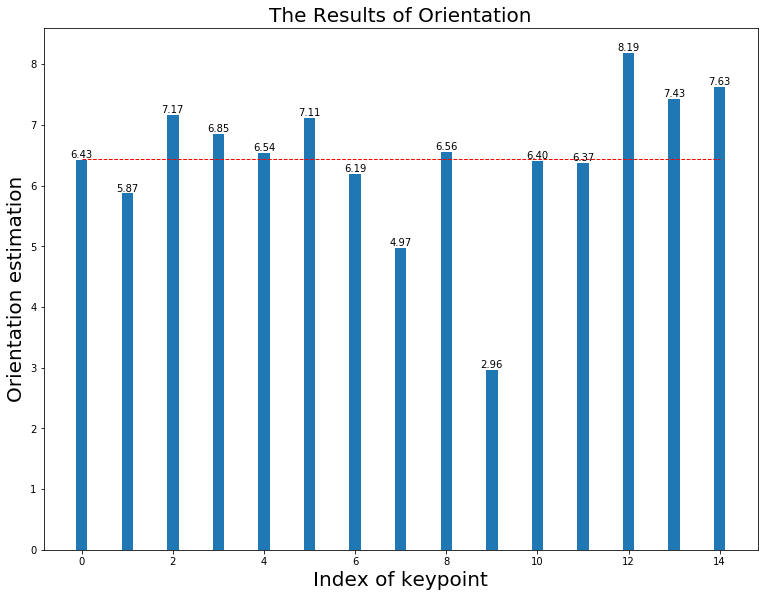

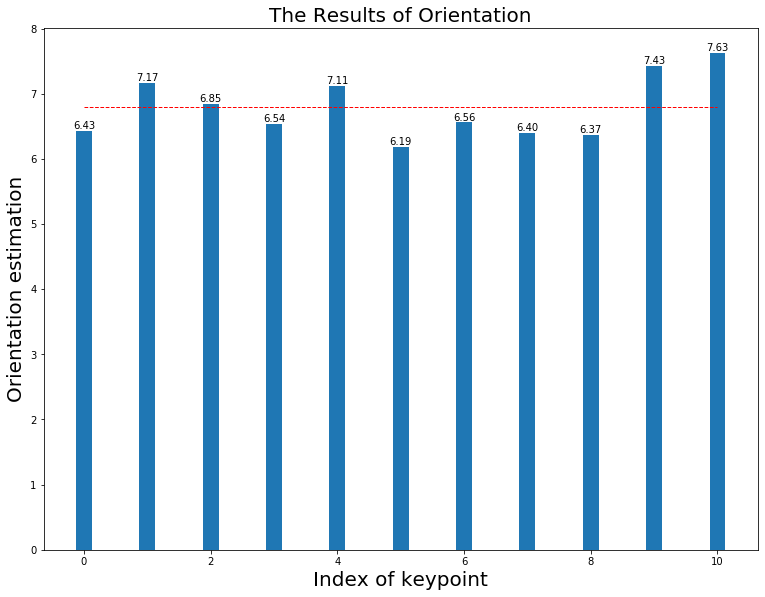

----------------------------------------------------------------------------------------------------
FD Rotate(6.8):mean(6.891), median(7.069) in 0.010
The HoG estimation when (6.8) is  7
The HoG & FD estimation when (6.8) is 6.82 in 0.030


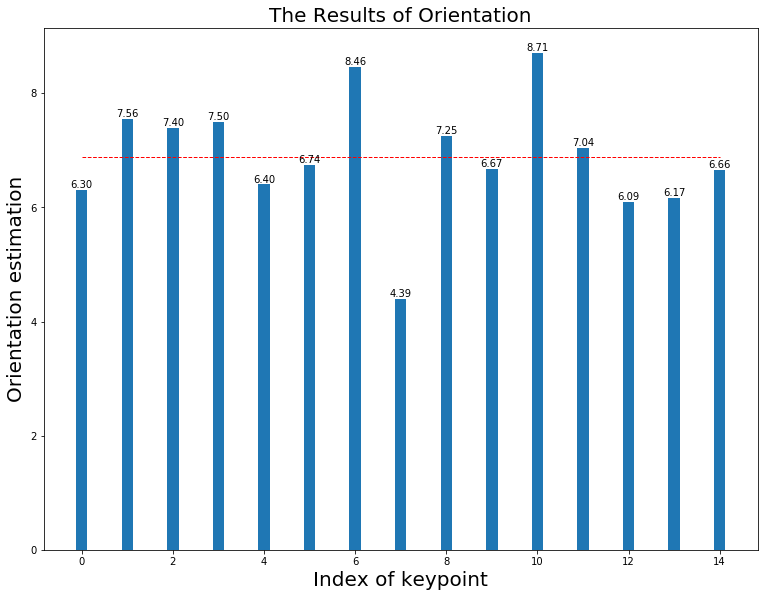

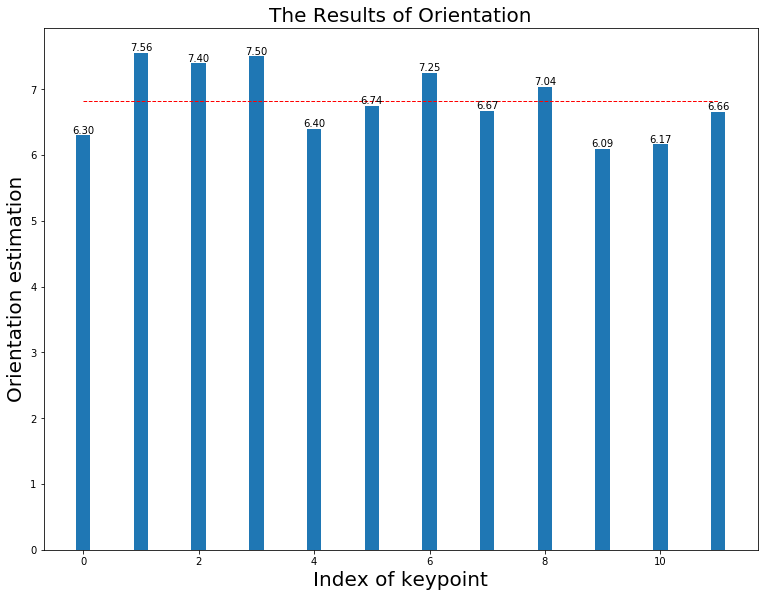

----------------------------------------------------------------------------------------------------
FD Rotate(6.9):mean(6.399), median(6.823) in 0.010
The HoG estimation when (6.9) is  7
The HoG & FD estimation when (6.9) is 6.86 in 0.030


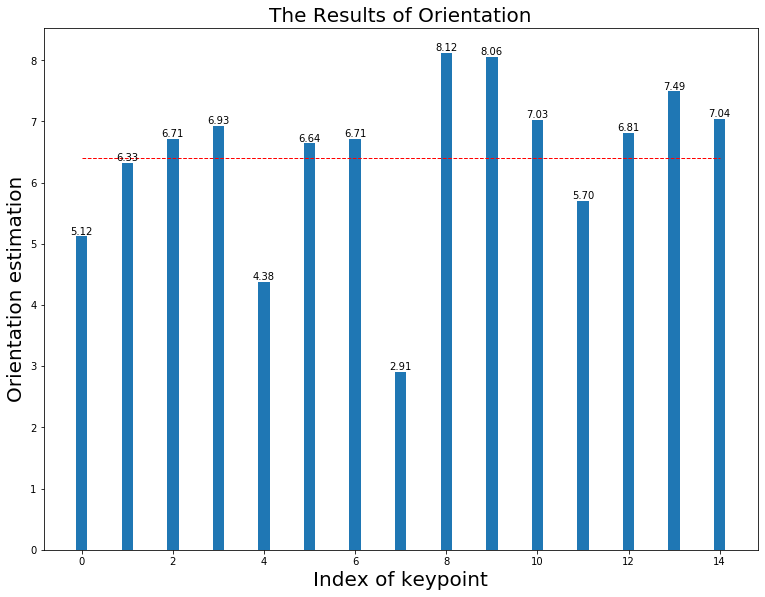

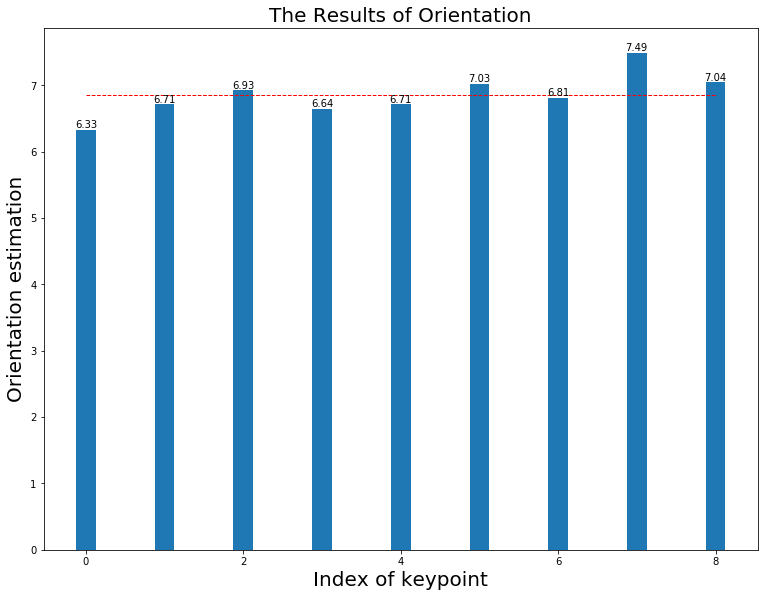

----------------------------------------------------------------------------------------------------
FD Rotate(7.0):mean(6.491), median(6.629) in 0.010
The HoG estimation when (7.0) is  7
The HoG & FD estimation when (7.0) is 6.95 in 0.030


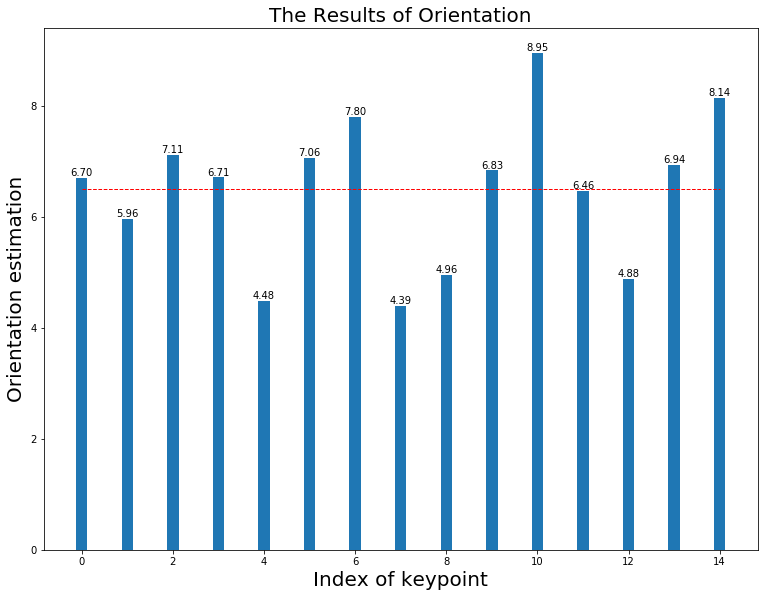

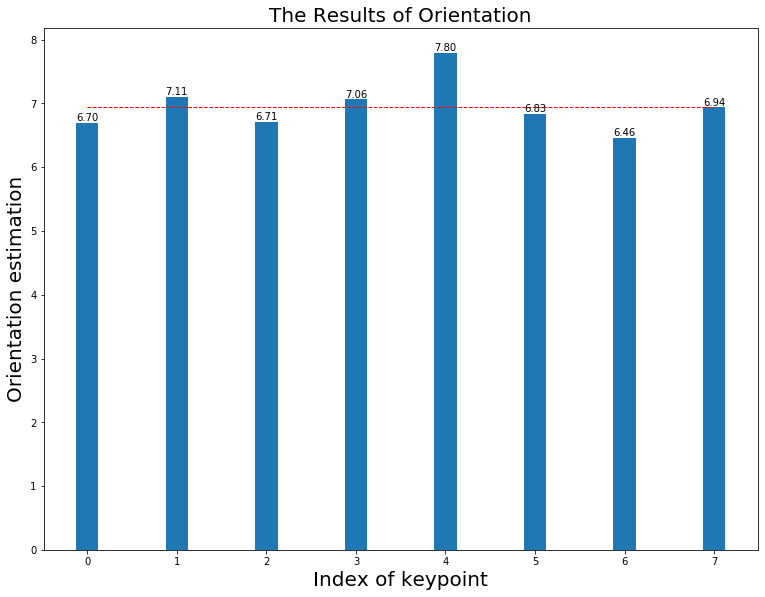

----------------------------------------------------------------------------------------------------
FD Rotate(7.1):mean(6.674), median(7.323) in 0.010
The HoG estimation when (7.1) is  7
The HoG & FD estimation when (7.1) is 7.39 in 0.031


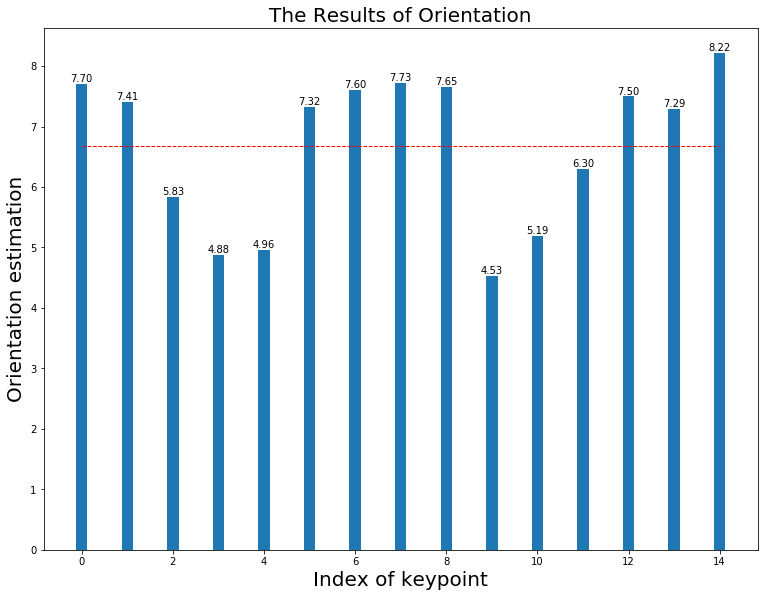

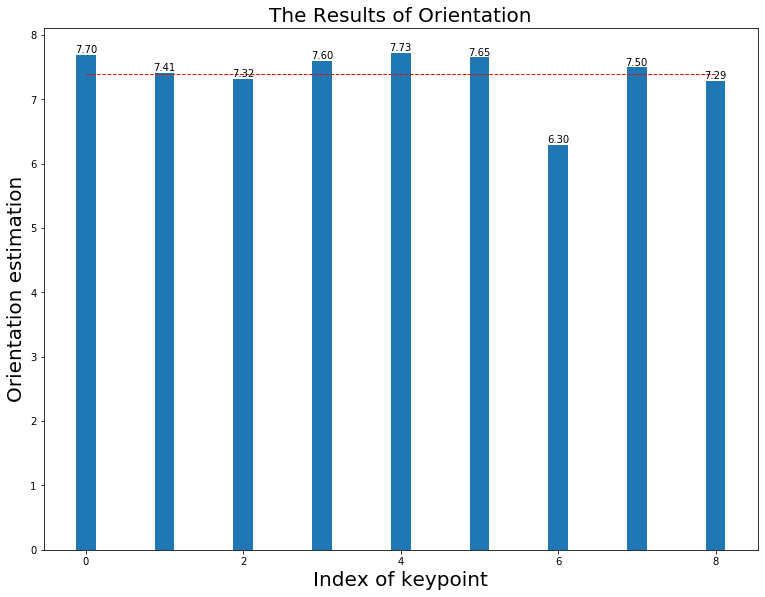

----------------------------------------------------------------------------------------------------
FD Rotate(7.2):mean(7.237), median(7.109) in 0.011
The HoG estimation when (7.2) is  7
The HoG & FD estimation when (7.2) is 7.25 in 0.031


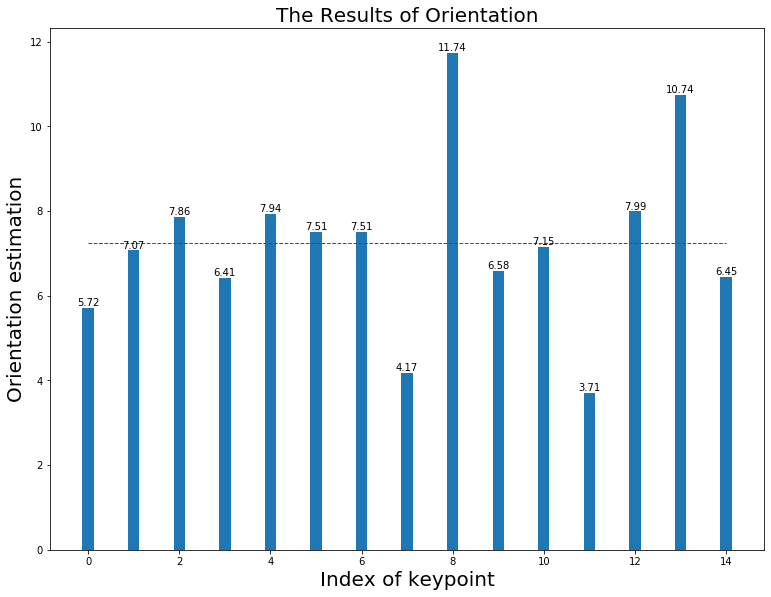

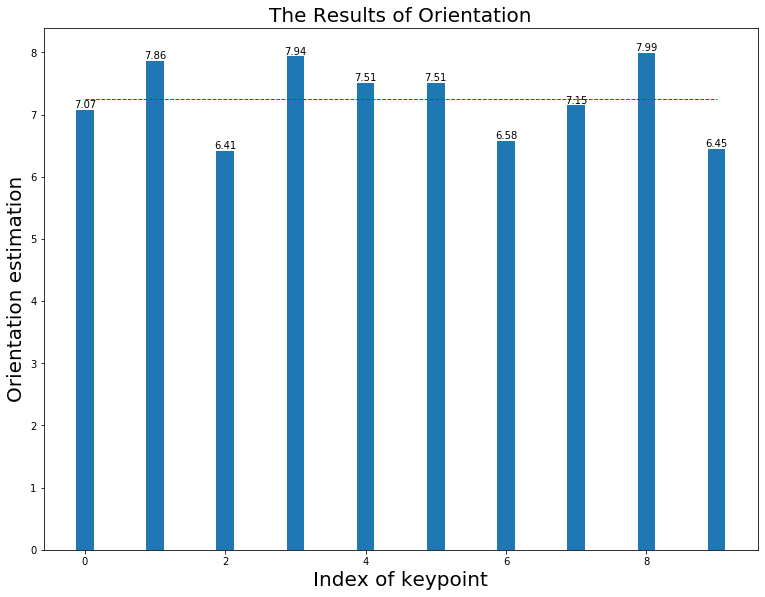

----------------------------------------------------------------------------------------------------
FD Rotate(7.3):mean(8.037), median(7.723) in 0.011
The HoG estimation when (7.3) is  7
The HoG & FD estimation when (7.3) is 7.36 in 0.032


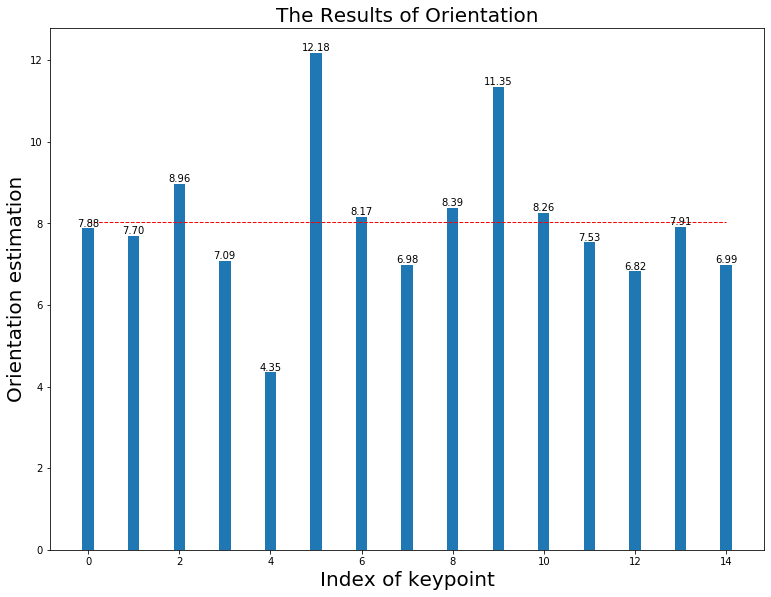

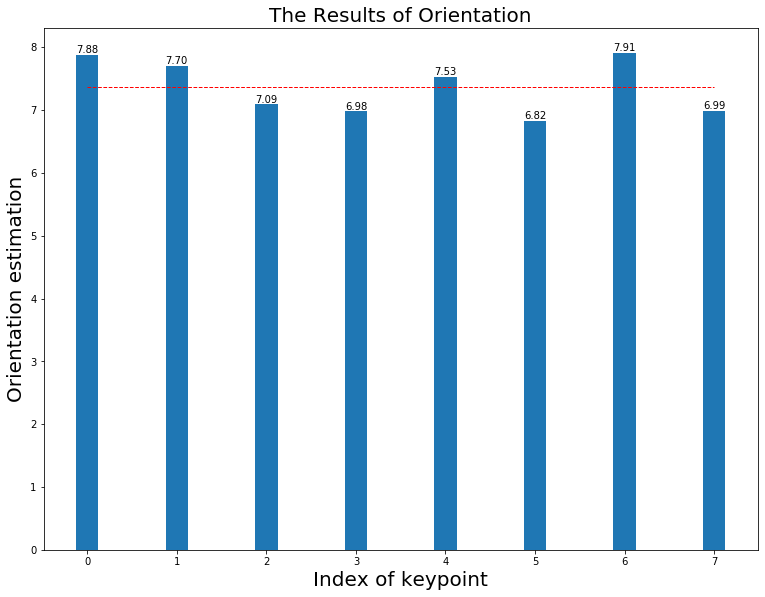

----------------------------------------------------------------------------------------------------
FD Rotate(7.4):mean(7.296), median(7.837) in 0.010
The HoG estimation when (7.4) is  8
The HoG & FD estimation when (7.4) is 7.84 in 0.030


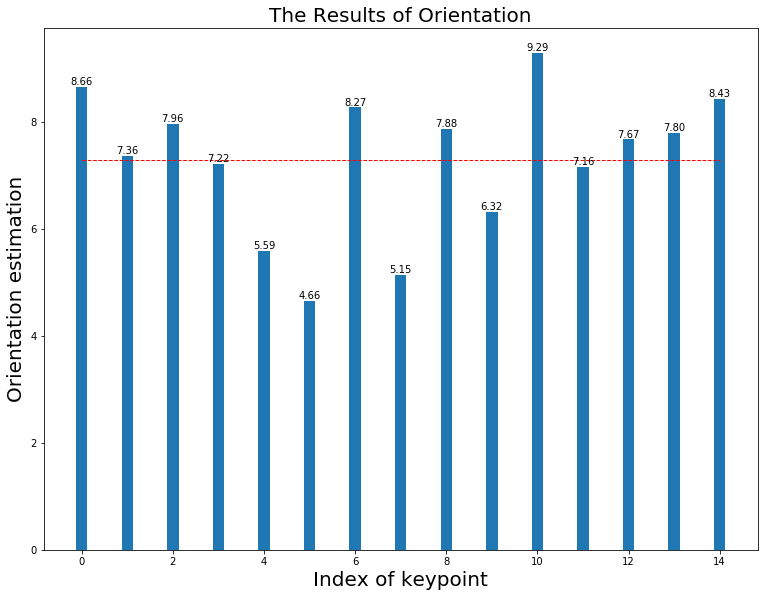

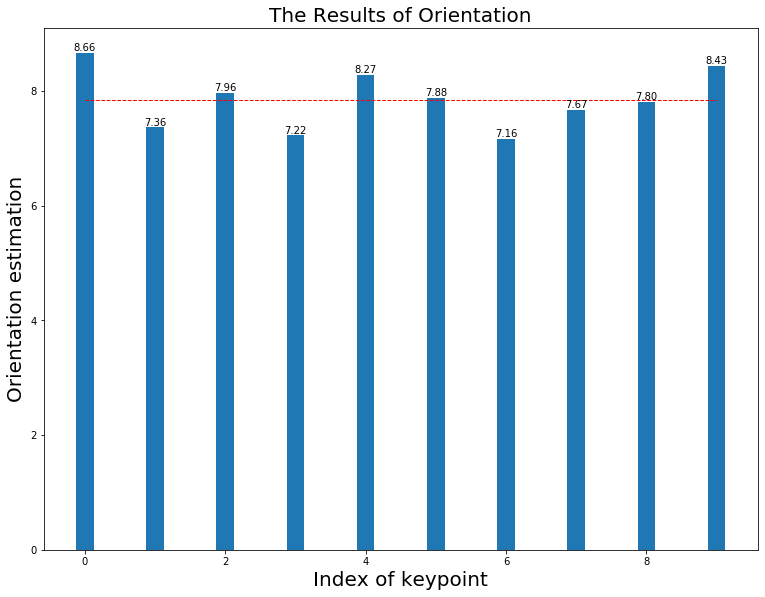

----------------------------------------------------------------------------------------------------
FD Rotate(7.5):mean(7.755), median(7.555) in 0.011
The HoG estimation when (7.5) is  8
The HoG & FD estimation when (7.5) is 7.63 in 0.031


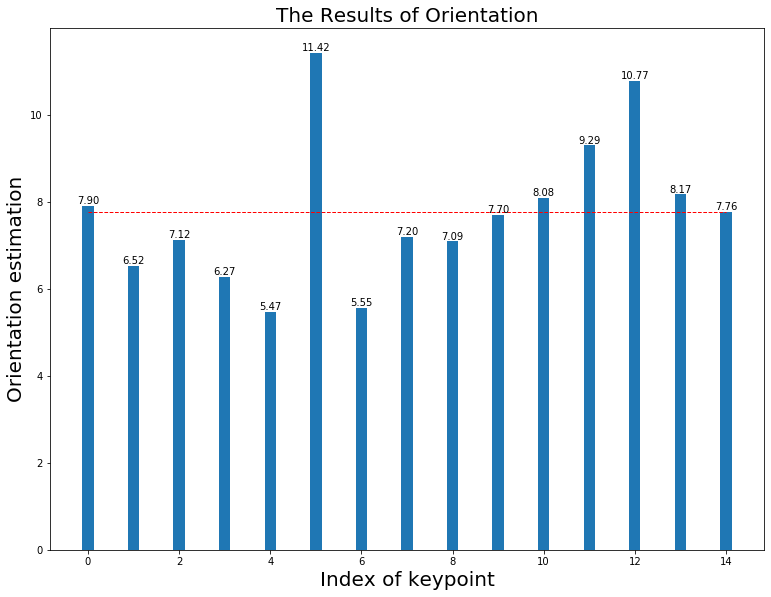

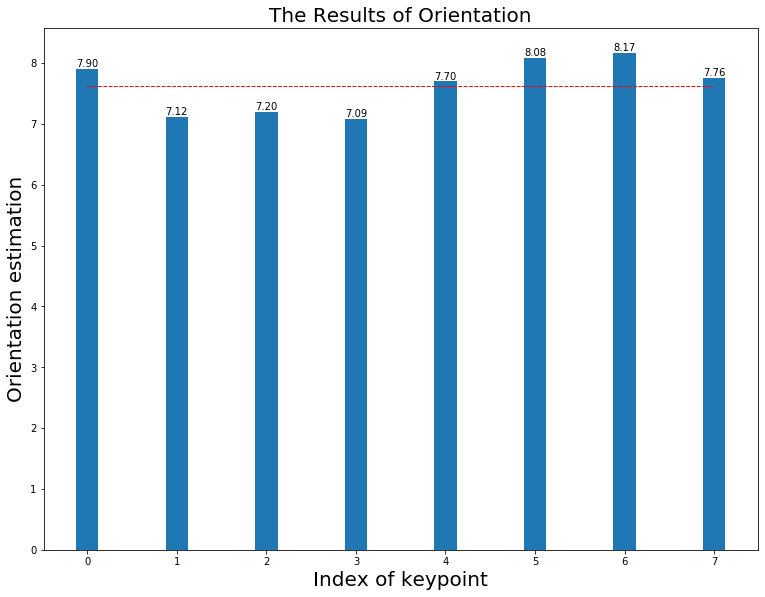

----------------------------------------------------------------------------------------------------
FD Rotate(7.6):mean(6.884), median(6.549) in 0.010
The HoG estimation when (7.6) is  8
The HoG & FD estimation when (7.6) is 7.63 in 0.030


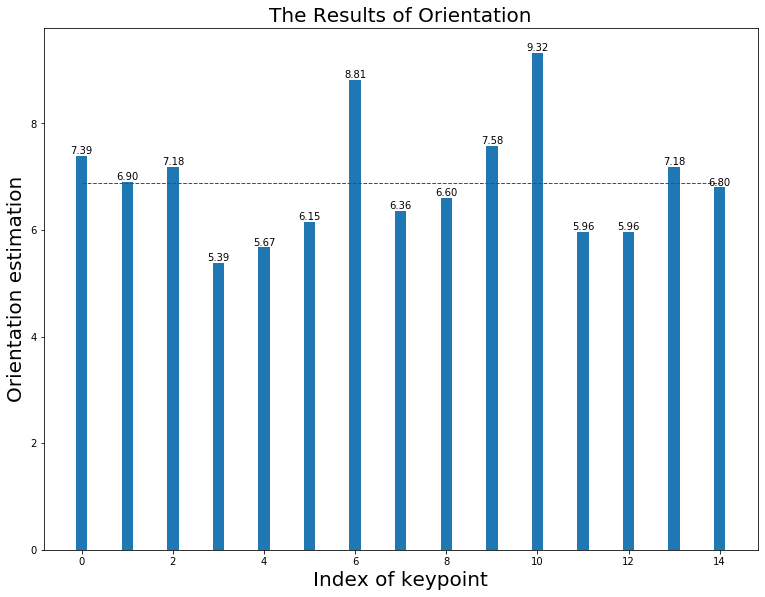

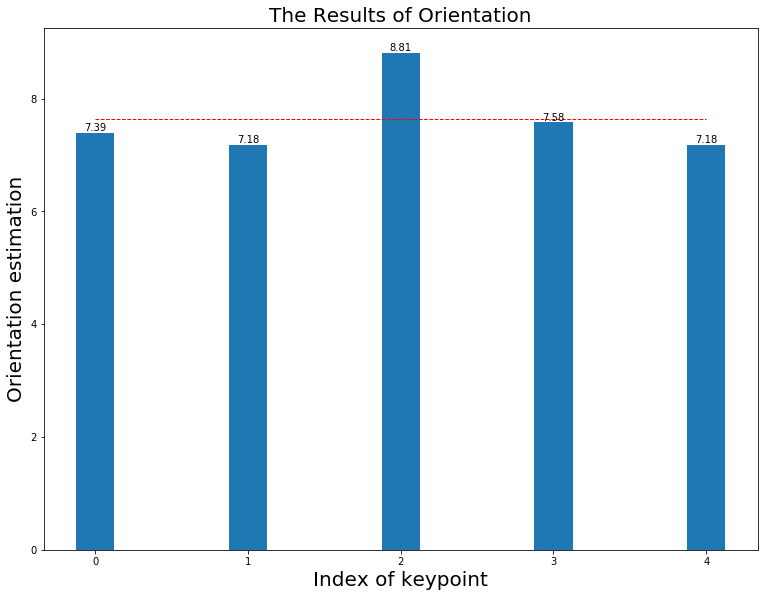

----------------------------------------------------------------------------------------------------
FD Rotate(7.7):mean(7.677), median(7.364) in 0.011
The HoG estimation when (7.7) is  8
The HoG & FD estimation when (7.7) is 8.16 in 0.040


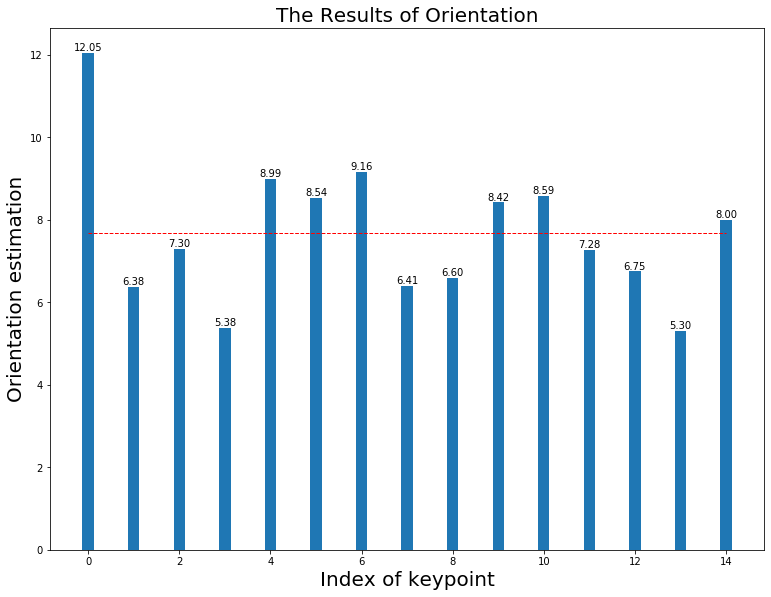

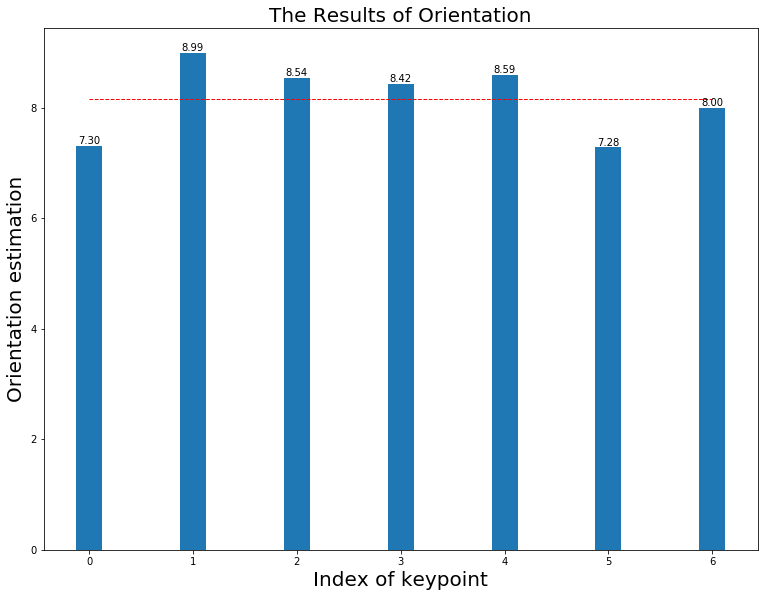

----------------------------------------------------------------------------------------------------
FD Rotate(7.8):mean(7.763), median(7.812) in 0.011
The HoG estimation when (7.8) is  8
The HoG & FD estimation when (7.8) is 8.00 in 0.031


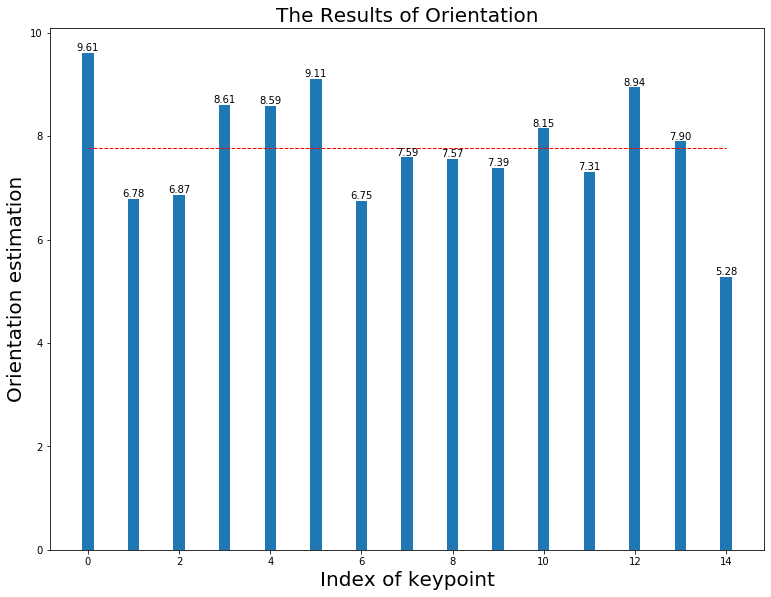

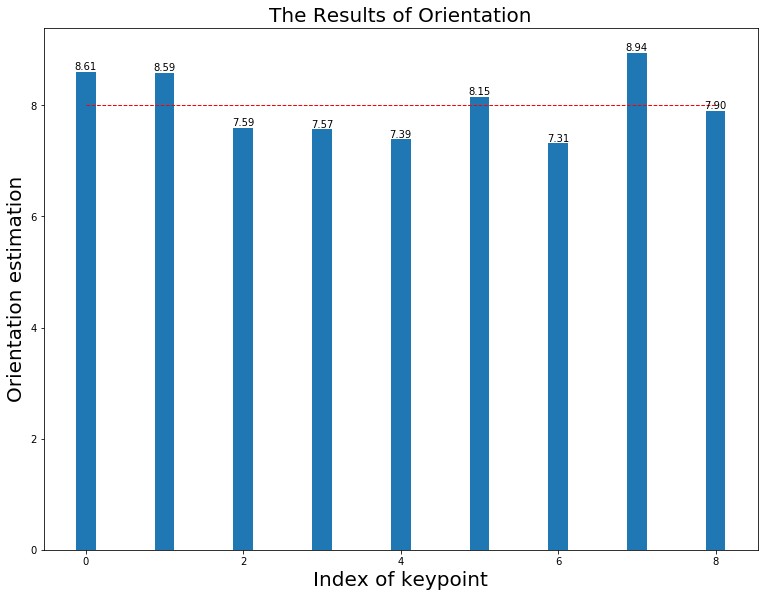

----------------------------------------------------------------------------------------------------
FD Rotate(7.9):mean(7.942), median(7.790) in 0.011
The HoG estimation when (7.9) is  8
The HoG & FD estimation when (7.9) is 7.79 in 0.031


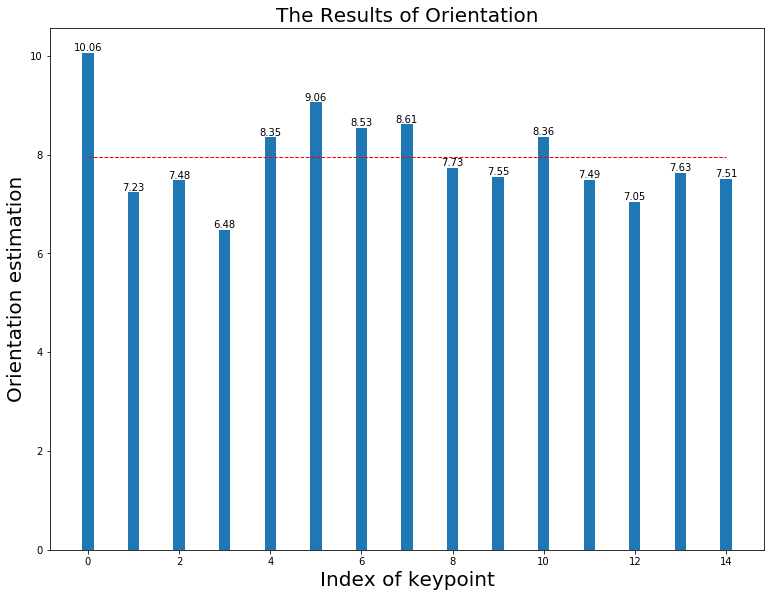

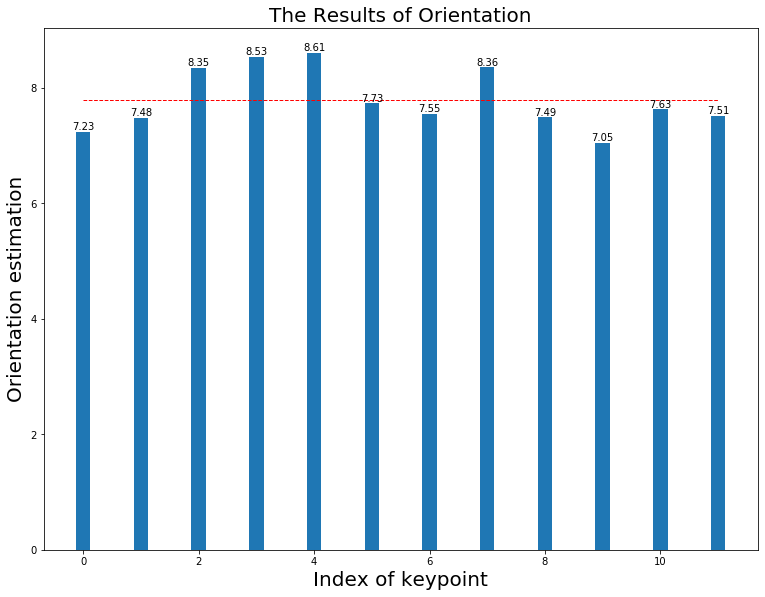

In [10]:
orb_error_fd = np.array([])
orb_error_hog_fd = np.array([])

for rotate_angle in np.arange(0.5, 8.0, 0.1):
    print("-" * 100)
    M = cv2.getRotationMatrix2D(center, rotate_angle, 1)
    img_rotate = cv2.warpAffine(img_base, M, (w, h))

    fd_median, fd_mean, exe_time = angle_cal(img_orig, img_rotate, mode = "ORB")
    
    # Gradients Method
    start_time = time.time()
    hist_base = HoG_cal(img_base, mag_thres= thres, bin_num= bins)
    hist_rotate = HoG_cal(img_rotate, mag_thres= thres, bin_num= bins)

    hog_angle = angle_HoG(hist_base, hist_rotate, limits = angle_limits)
    angle_results = match_angels(img_orig, img_rotate, mode = "ORB")
    
    # Filter the results
    angle_floor = hog_angle - 1 
    angle_ceiling = hog_angle + 1
    index = (angle_results > angle_floor)* (angle_results < angle_ceiling) * angle_results
    angle_filter_results = angle_results[np.nonzero(index)]
    angle_filter = np.mean(angle_filter_results)
    hog_time = time.time() - start_time
    
    orb_error_fd = np.append(orb_error_fd, np.abs(fd_mean - rotate_angle))
    orb_error_hog_fd = np.append(orb_error_hog_fd, np.abs(angle_filter - rotate_angle))
    
    
    print("FD Rotate({0:3.1f}):mean({1:5.3f}), median({2:5.3f}) in {3:.3f}"\
          .format(rotate_angle, fd_mean, fd_median, exe_time))
    print("The HoG estimation when ({0:.1f}) is {1:2d}" \
        .format(rotate_angle, hog_angle))
    print("The HoG & FD estimation when ({0:.1f}) is {1:.2f} in {2:.3f}" \
        .format(rotate_angle, angle_filter, hog_time))
    
    plot_result_bar(range(len(angle_results)), angle_results, fd_mean)
    plot_result_bar(range(len(angle_filter_results)), angle_filter_results, angle_filter)

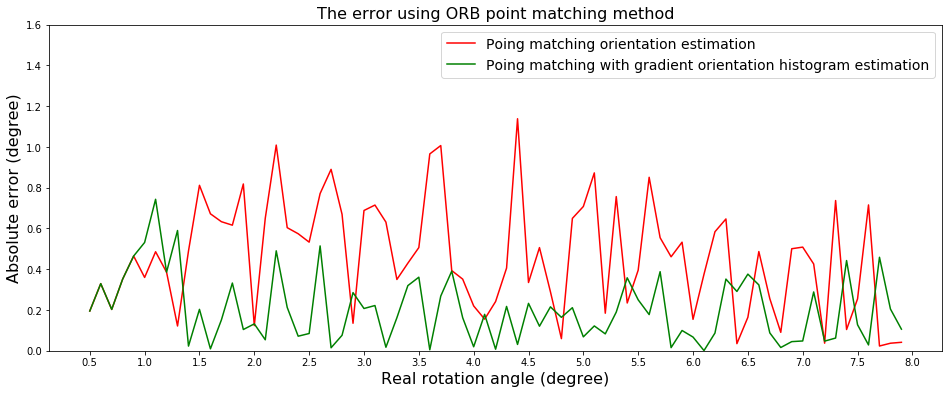

In [11]:
plt.figure(figsize=(16, 6))
index_error = np.arange(0.5, 8.0, 0.1)
plt.plot(index_error, orb_error_fd, 'r', label = 'Poing matching orientation estimation')
plt.plot(index_error, orb_error_hog_fd, 'g', label = 'Poing matching with gradient orientation histogram estimation')
plt.legend(fontsize = 14)
plt.xlabel('Real rotation angle (degree)', fontsize = 16 )
plt.ylabel('Absolute error (degree)', fontsize = 16)
plt.ylim([0, 1.6])
plt.xticks(np.arange(0.5, 8.5, 0.5))
plt.title('The error using ORB point matching method', fontsize = 16)
plt.savefig('output/HOG_ORB_error.png')
plt.show()

<font face='Ubuntu' size = 4>

### ORB SIFT comparison

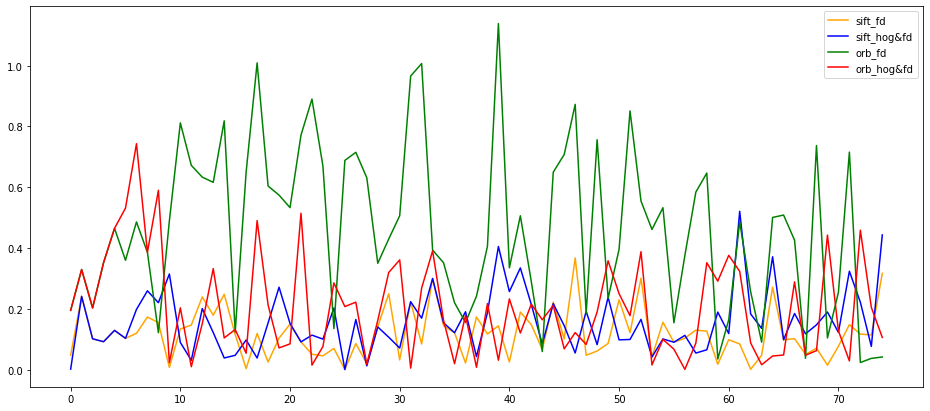

In [12]:
plt.figure(figsize=(16, 7))
plt.plot(sift_error_fd, 'orange', label = 'sift_fd')
plt.plot(sift_error_hog_fd, 'blue',label = 'sift_hog&fd')
plt.plot(orb_error_fd, 'green',label = 'orb_fd')
plt.plot(orb_error_hog_fd, 'r',label = 'orb_hog&fd')
plt.legend()
plt.savefig('output/all_error.png')
plt.show()

In [13]:
print(np.mean(sift_error_fd))
print(np.mean(sift_error_hog_fd))
print(np.mean(orb_error_fd))
print(np.mean(orb_error_hog_fd))

0.11997239854600707
0.15728665397238406
0.4622866403791635
0.20383328525203287
